# Chap 1

# Chap 2: Introducing Dask

## Hello Dask

In [4]:
#!curl https://www.kaggle.com/datasets/new-york-city/nyc-parking-tickets?resource=download&select=Parking_Violations_Issued_-_Fiscal_Year_2017.csv

In [1]:
!ls

Dask_tutorial.ipynb
Dockerfile
Parking_Violations_Issued_-_Fiscal_Year_2017.csv
Parking_Violations_Issued_-_Fiscal_Year_2017.csv.zip
bashrc
delayed.ipynb
docker_build.sh
docker_run.sh
install_jupyter_extensions.sh
run_jupyter.sh


In [4]:
!wc -l Parking_Violations_Issued_-_Fiscal_Year_2017.csv

!head -10000 Parking_Violations_Issued_-_Fiscal_Year_2017.csv >Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv

!wc -l Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv

10803029 Parking_Violations_Issued_-_Fiscal_Year_2017.csv


In [37]:
import dask.dataframe as dd
from dask.diagnostics import ProgressBar

# file_name = "Parking_Violations_Issued_-_Fiscal_Year_2017.csv"
file_name = "Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv"

df = dd.read_csv(
    file_name,
    dtype={"House Number": "object", "Time First Observed": "object"},
)
df

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,int64,object,object,object,object,int64,object,object,object,int64,int64,int64,int64,float64,int64,int64,int64,object,object,object,object,object,object,object,object,object,int64,int64,object,object,object,object,object,object,float64,int64,object,int64,object,object,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [38]:
missing_values = df.isnull().sum()
missing_values

Dask Series Structure:
npartitions=1
Date First Observed    int64
Violation Time           ...
dtype: int64
Dask Name: dataframe-sum-agg, 4 graph layers

In [39]:
missing_count = (missing_values / df.index.size) * 100
missing_count

Dask Series Structure:
npartitions=1
Date First Observed    float64
Violation Time             ...
dtype: float64
Dask Name: mul, 9 graph layers

In [40]:
with ProgressBar():
    missing_count_pct = missing_count.compute()
missing_count_pct

[########################################] | 100% Completed | 224.21 ms


Summons Number                         0.000000
Plate ID                               0.000000
Registration State                     0.000000
Plate Type                             0.000000
Issue Date                             0.000000
Violation Code                         0.000000
Vehicle Body Type                      0.400040
Vehicle Make                           0.590059
Issuing Agency                         0.000000
Street Code1                           0.000000
Street Code2                           0.000000
Street Code3                           0.000000
Vehicle Expiration Date                0.000000
Violation Location                    18.501850
Violation Precinct                     0.000000
Issuer Precinct                        0.000000
Issuer Code                            0.000000
Issuer Command                        18.411841
Issuer Squad                          18.421842
Violation Time                         0.000000
Time First Observed                   92

In [41]:
# This is a pd.Series.
columns_to_drop = missing_count_pct[missing_count_pct > 60].index
print(columns_to_drop)
with ProgressBar():
    df_dropped = df.drop(columns_to_drop, axis=1).persist()

# df_dropped is a Dask object.
df_dropped

Index(['Time First Observed', 'Intersecting Street', 'Violation Legal Code',
       'Unregistered Vehicle?', 'Meter Number',
       'No Standing or Stopping Violation', 'Hydrant Violation',
       'Double Parking Violation'],
      dtype='object')
[########################################] | 100% Completed | 103.53 ms


,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Date First Observed,Law Section,Sub Division,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,int64,object,object,object,object,int64,object,object,object,int64,int64,int64,int64,float64,int64,int64,int64,object,object,object,object,object,object,object,int64,int64,object,object,object,object,object,int64,int64,object,object
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


## Visualizing DAGs

dask= 5
correct= 5


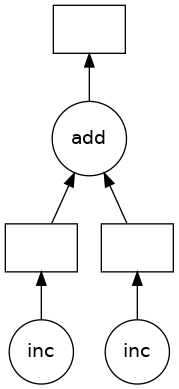

In [32]:
import dask.delayed as delayed
from dask.diagnostics import ProgressBar


def inc(i):
    return i + 1


x = delayed(inc)(1)
y = delayed(inc)(2)


def add(x, y):
    return x + y


z = delayed(add)(x, y)
print("dask=", z.compute())
print("correct=", 1 + 1 + 2 + 1)
z.visualize()

correct= 32
dask= 32


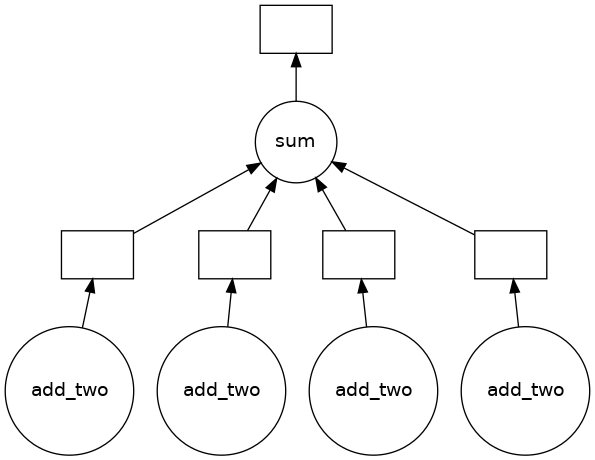

In [33]:
data = [1, 5, 8, 10]


def add_two(x):
    return x + 2


step1 = [delayed(add_two)(i) for i in data]
total = delayed(sum)(step1)
print("dask=", total.compute())
print("correct=", 1 + 2 + 5 + 2 + 8 + 2 + 10 + 2)
total.visualize()

dask= 128
correct= 128


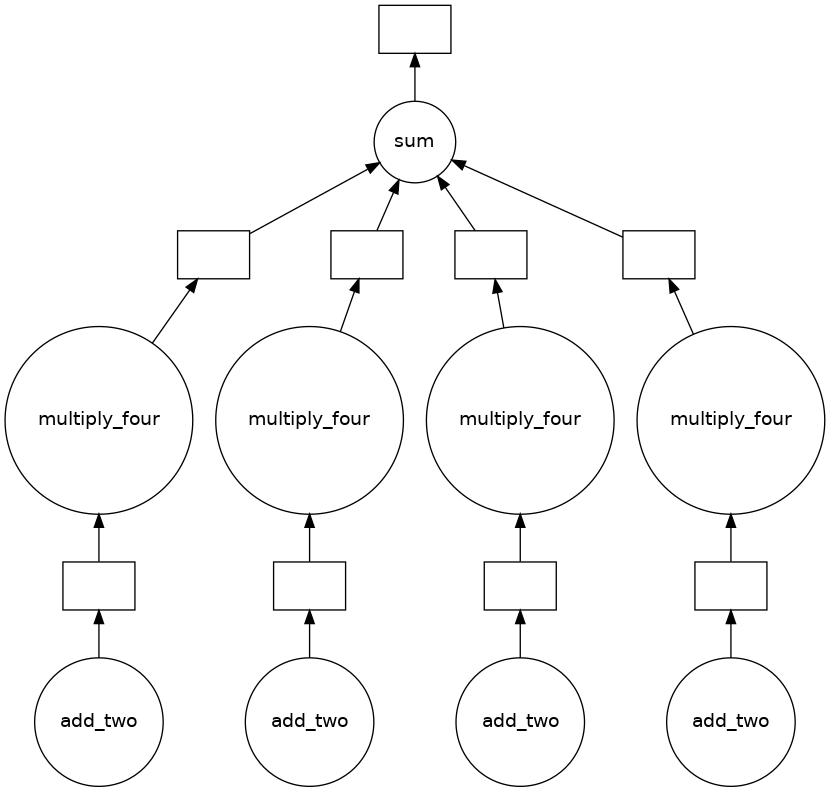

In [34]:
data = [1, 5, 8, 10]


def add_two(x):
    return x + 2


step1 = [delayed(add_two)(i) for i in data]


def multiply_four(x):
    return x * 4


step2 = [delayed(multiply_four)(j) for j in step1]
total = delayed(sum)(step2)
print("dask=", total.compute())
print("correct=", (1 + 2) * 4 + (5 + 2) * 4 + (8 + 2) * 4 + (10 + 2) * 4)
total.visualize()

total= 128
data= [1, 5, 8, 10]
dask= 536
correct= 536


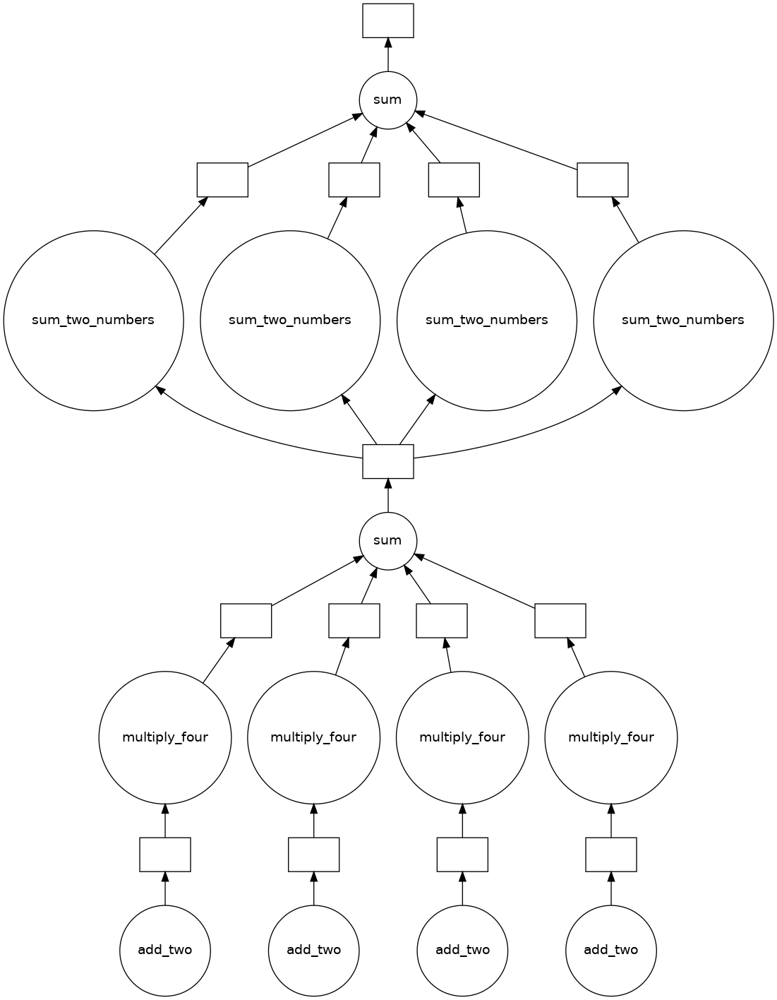

In [31]:
print("total=", total.compute())
print("data=", data)
# Sum data again value by value.
data2 = [delayed(sum_two_numbers)(k, total) for k in data]
# Accumulate.
total2 = delayed(sum)(data2)
print("dask=", total2.compute())
print("correct=", 128 * 4 + 1 + 5 + 8 + 10)
total2.visualize()

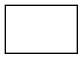

In [35]:
total_persisted = total.persist()
total_persisted.visualize()

##

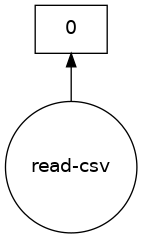

In [45]:
df.visualize()

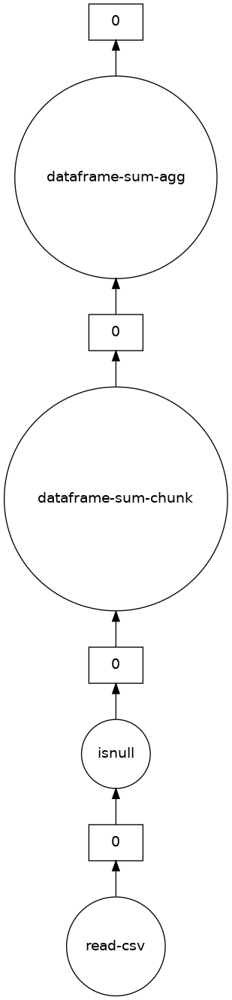

In [44]:
missing_values.visualize()

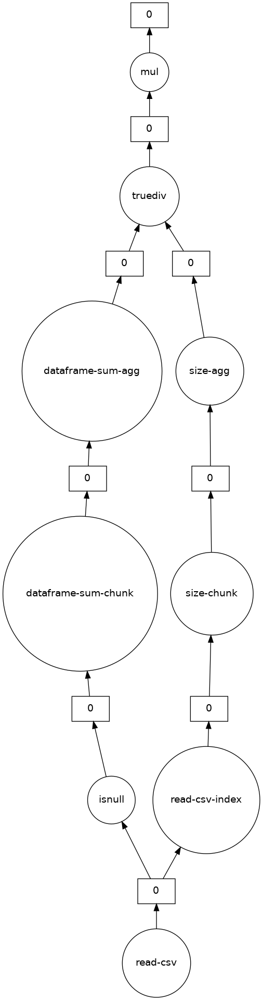

In [42]:
missing_count.visualize()

## Task scheduling

# Introducing Dask DataFrames

## Why use DataFrames?

From https://github.com/jcdaniel91/data-science-python-dask/blob/master/Chapter%203.ipynb

In [48]:
import pandas as pd
import dask.dataframe as dd

# Creating all the data as lists
person_IDs = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
person_last_names = [
    "Smith",
    "Williams",
    "Williams",
    "Jackson",
    "Johnson",
    "Smith",
    "Anderson",
    "Christiansen",
    "Carter",
    "Davidson",
]
person_first_names = [
    "John",
    "Bill",
    "Jane",
    "Cathy",
    "Stuart",
    "James",
    "Felicity",
    "Liam",
    "Nancy",
    "Christina",
]
person_DOBs = [
    "1982-10-06",
    "1990-07-04",
    "1989-05-06",
    "1974-01-24",
    "1995-06-05",
    "1984-04-16",
    "1976-09-15",
    "1992-10-02",
    "1986-02-05",
    "1993-08-11",
]

# Storing the data in a Pandas DataFrame
people_pandas_df = pd.DataFrame(
    {
        "Person ID": person_IDs,
        "Last Name": person_last_names,
        "First Name": person_first_names,
        "Date of Birth": person_DOBs,
    },
    columns=["Person ID", "Last Name", "First Name", "Date of Birth"],
)
display(people_pandas_df)

,Person ID,Last Name,First Name,Date of Birth
0,1,Smith,John,1982-10-06
1,2,Williams,Bill,1990-07-04
2,3,Williams,Jane,1989-05-06
3,4,Jackson,Cathy,1974-01-24
4,5,Johnson,Stuart,1995-06-05
5,6,Smith,James,1984-04-16
6,7,Anderson,Felicity,1976-09-15
7,8,Christiansen,Liam,1992-10-02
8,9,Carter,Nancy,1986-02-05
9,10,Davidson,Christina,1993-08-11


In [57]:
# Converting the Pandas DataFrame to a Dask DataFrame
people_dask_df = dd.from_pandas(people_pandas_df, npartitions=2)
print("# people_dask_df=\n%s" % people_dask_df)
print("# divisions=", people_dask_df.divisions)
print("# npartitions=", people_dask_df.npartitions)

# map_partitions() applies a function to each partition.
print(
    "# elements per partition=\n%s"
    % people_dask_df.map_partitions(len).compute()
)

# people_dask_df=
Dask DataFrame Structure:
              Person ID Last Name First Name Date of Birth
npartitions=2                                             
0                 int64    object     object        object
5                   ...       ...        ...           ...
9                   ...       ...        ...           ...
Dask Name: from_pandas, 1 graph layer
# divisions= (0, 5, 9)
# npartitions= 2
# elements per partition=
0    5
1    5
dtype: int64


In [67]:
# Filter.
people_filtered = people_dask_df[people_dask_df["Last Name"] != "Williams"]
print(
    "# partitions before=\n%s"
    % people_filtered.map_partitions(lambda x: len(x)).compute()
)
display(people_filtered.compute())

# Repartitioning.
people_filtered_reduced = people_filtered.repartition(npartitions=1)
print(
    "# partitions after=\n%s"
    % people_filtered_reduced.map_partitions(lambda x: len(x)).compute()
)

# partitions before=
0    3
1    5
dtype: int64


,Person ID,Last Name,First Name,Date of Birth
0,1,Smith,John,1982-10-06
3,4,Jackson,Cathy,1974-01-24
4,5,Johnson,Stuart,1995-06-05
5,6,Smith,James,1984-04-16
6,7,Anderson,Felicity,1976-09-15
7,8,Christiansen,Liam,1992-10-02
8,9,Carter,Nancy,1986-02-05
9,10,Davidson,Christina,1993-08-11


# partitions after=
0    8
dtype: int64


# Reading data from text files

In [72]:
!ls Parking*

Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv
Parking_Violations_Issued_-_Fiscal_Year_2015.csv
Parking_Violations_Issued_-_Fiscal_Year_2016.csv
Parking_Violations_Issued_-_Fiscal_Year_2017.csv
Parking_Violations_Issued_-_Fiscal_Year_2017.csv.zip
Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv


In [88]:
import dask.dataframe as dd
from dask.diagnostics import ProgressBar

data_types = {
    "House Number": "object",
    "Time First Observed": "object",
}

fy14 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv",
    dtype=data_types,
)
fy15 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2015.csv", dtype=data_types
)
fy16 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2016.csv", dtype=data_types
)
fy17 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2017.csv", dtype=data_types
)
fy17

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
npartitions=62,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,int64,object,object,object,object,int64,object,object,object,int64,int64,int64,int64,float64,int64,int64,int64,object,object,object,object,object,object,object,object,object,int64,int64,object,object,object,object,object,object,float64,int64,object,int64,object,object,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [82]:
df = pd.read_csv("Parking_Violations_Issued_-_Fiscal_Year_2017.csv", nrows=10)
df.columns
# re

Index(['Summons Number', 'Plate ID', 'Registration State', 'Plate Type',
       'Issue Date', 'Violation Code', 'Vehicle Body Type', 'Vehicle Make',
       'Issuing Agency', 'Street Code1', 'Street Code2', 'Street Code3',
       'Vehicle Expiration Date', 'Violation Location', 'Violation Precinct',
       'Issuer Precinct', 'Issuer Code', 'Issuer Command', 'Issuer Squad',
       'Violation Time', 'Time First Observed', 'Violation County',
       'Violation In Front Of Or Opposite', 'House Number', 'Street Name',
       'Intersecting Street', 'Date First Observed', 'Law Section',
       'Sub Division', 'Violation Legal Code', 'Days Parking In Effect    ',
       'From Hours In Effect', 'To Hours In Effect', 'Vehicle Color',
       'Unregistered Vehicle?', 'Vehicle Year', 'Meter Number',
       'Feet From Curb', 'Violation Post Code', 'Violation Description',
       'No Standing or Stopping Violation', 'Hydrant Violation',
       'Double Parking Violation'],
      dtype='object')

In [90]:
# Problems with the column types.
# | House Number        | object | float64  |
# | Time First Observed | object | float64
fy17.head(5)

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,...,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
0,5092469481,GZH7067,NY,PAS,07/10/2016,7,SUBN,TOYOT,V,0,...,GY,NaN,2001,NaN,0,NaN,FAILURE TO STOP AT RED LIGHT,NaN,NaN,NaN
1,5092451658,GZH7067,NY,PAS,07/08/2016,7,SUBN,TOYOT,V,0,...,GY,NaN,2001,NaN,0,NaN,FAILURE TO STOP AT RED LIGHT,NaN,NaN,NaN
2,4006265037,FZX9232,NY,PAS,08/23/2016,5,SUBN,FORD,V,0,...,BK,NaN,2004,NaN,0,NaN,BUS LANE VIOLATION,NaN,NaN,NaN
3,8478629828,66623ME,NY,COM,06/14/2017,47,REFG,MITSU,T,10610,...,WH,NaN,2007,NaN,0,04,47-Double PKG-Midtown,NaN,NaN,NaN
4,7868300310,37033JV,NY,COM,11/21/2016,69,DELV,INTER,T,10510,...,WHITE,NaN,2007,NaN,0,31 6,69-Failure to Disp Muni Recpt,NaN,NaN,NaN


In [91]:
# Reading columns is quick.
fy17.columns

Index(['Summons Number', 'Plate ID', 'Registration State', 'Plate Type',
       'Issue Date', 'Violation Code', 'Vehicle Body Type', 'Vehicle Make',
       'Issuing Agency', 'Street Code1', 'Street Code2', 'Street Code3',
       'Vehicle Expiration Date', 'Violation Location', 'Violation Precinct',
       'Issuer Precinct', 'Issuer Code', 'Issuer Command', 'Issuer Squad',
       'Violation Time', 'Time First Observed', 'Violation County',
       'Violation In Front Of Or Opposite', 'House Number', 'Street Name',
       'Intersecting Street', 'Date First Observed', 'Law Section',
       'Sub Division', 'Violation Legal Code', 'Days Parking In Effect    ',
       'From Hours In Effect', 'To Hours In Effect', 'Vehicle Color',
       'Unregistered Vehicle?', 'Vehicle Year', 'Meter Number',
       'Feet From Curb', 'Violation Post Code', 'Violation Description',
       'No Standing or Stopping Violation', 'Hydrant Violation',
       'Double Parking Violation'],
      dtype='object')

In [92]:
# Find common columns.
from functools import reduce

columns = [
    set(fy14.columns),
    set(fy15.columns),
    set(fy16.columns),
    set(fy17.columns),
]
common_columns = list(reduce(lambda a, i: a.intersection(i), columns))
common_columns

['Registration State',
 'Street Code1',
 'Violation Location',
 'Vehicle Expiration Date',
 'Violation Legal Code',
 'Street Code3',
 'Unregistered Vehicle?',
 'Vehicle Year',
 'Days Parking In Effect    ',
 'Date First Observed',
 'Violation Code',
 'Vehicle Make',
 'To Hours In Effect',
 'Plate Type',
 'Hydrant Violation',
 'Vehicle Body Type',
 'From Hours In Effect',
 'Violation Description',
 'Issue Date',
 'Issuer Code',
 'Issuer Precinct',
 'Issuer Command',
 'Street Name',
 'Violation In Front Of Or Opposite',
 'Street Code2',
 'Intersecting Street',
 'Meter Number',
 'No Standing or Stopping Violation',
 'Plate ID',
 'House Number',
 'Sub Division',
 'Violation County',
 'Feet From Curb',
 'Double Parking Violation',
 'Vehicle Color',
 'Issuing Agency',
 'Violation Precinct',
 'Time First Observed',
 'Violation Time',
 'Law Section',
 'Summons Number',
 'Violation Post Code',
 'Issuer Squad']

In [94]:
fy17[common_columns].head()

,Registration State,Street Code1,Violation Location,Vehicle Expiration Date,Violation Legal Code,Street Code3,Unregistered Vehicle?,Vehicle Year,Days Parking In Effect,Date First Observed,...,Double Parking Violation,Vehicle Color,Issuing Agency,Violation Precinct,Time First Observed,Violation Time,Law Section,Summons Number,Violation Post Code,Issuer Squad
0,NY,0,NaN,0,T,0,NaN,2001,NaN,0,...,NaN,GY,V,0,NaN,0143A,1111,5092469481,NaN,NaN
1,NY,0,NaN,0,T,0,NaN,2001,NaN,0,...,NaN,GY,V,0,NaN,0400P,1111,5092451658,NaN,NaN
2,NY,0,NaN,0,T,0,NaN,2004,NaN,0,...,NaN,BK,V,0,NaN,0233P,1111,4006265037,NaN,NaN
3,NY,10610,14.0,20180630,NaN,34350,NaN,2007,Y,0,...,NaN,WH,T,14,NaN,1120A,408,8478629828,04,J
4,NY,10510,13.0,20170228,NaN,34330,NaN,2007,Y,0,...,NaN,WHITE,T,13,NaN,0555P,408,7868300310,31 6,M


In [110]:
# There are issues with the schema.
# Issuer Squad
# Unregistered Vehicle?
# Violation Description
# Violation Legal Code
# Violation Post Code
# fy14[common_columns].head()

In [126]:
import numpy as np
import pandas as pd
import pprint

dtype_dict = dict([x, str] for x in common_columns)
# print("dtype_dict=", pprint.pformat(dtype_dict))

# Read data with no schema.
fy14 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv",
    dtype=dtype_dict,
)
fy14_df = fy14[common_columns].head(10000)

In [123]:
fy14_df.columns

Index(['Registration State', 'Street Code1', 'Violation Location',
       'Vehicle Expiration Date', 'Violation Legal Code', 'Street Code3',
       'Unregistered Vehicle?', 'Vehicle Year', 'Days Parking In Effect    ',
       'Date First Observed', 'Violation Code', 'Vehicle Make',
       'To Hours In Effect', 'Plate Type', 'Hydrant Violation',
       'Vehicle Body Type', 'From Hours In Effect', 'Violation Description',
       'Issue Date', 'Issuer Code', 'Issuer Precinct', 'Issuer Command',
       'Street Name', 'Violation In Front Of Or Opposite', 'Street Code2',
       'Intersecting Street', 'Meter Number',
       'No Standing or Stopping Violation', 'Plate ID', 'House Number',
       'Sub Division', 'Violation County', 'Feet From Curb',
       'Double Parking Violation', 'Vehicle Color', 'Issuing Agency',
       'Violation Precinct', 'Time First Observed', 'Violation Time',
       'Law Section', 'Summons Number', 'Violation Post Code', 'Issuer Squad'],
      dtype='object')

In [127]:
print(fy14_df["Unregistered Vehicle?"].unique())

['0']


In [130]:
with ProgressBar():
    fy14["Vehicle Year"].unique().head(10)

[########################################] | 100% Completed | 106.54 s


In [134]:
# Correct schema.
dtypes = {
    "Date First Observed": str,
    "Days Parking In Effect    ": str,
    "Double Parking Violation": str,
    "Feet From Curb": np.float32,
    "From Hours In Effect": str,
    "House Number": str,
    "Hydrant Violation": str,
    "Intersecting Street": str,
    "Issue Date": str,
    "Issuer Code": np.float32,
    "Issuer Command": str,
    "Issuer Precinct": np.float32,
    "Issuer Squad": str,
    "Issuing Agency": str,
    "Law Section": np.float32,
    "Meter Number": str,
    "No Standing or Stopping Violation": str,
    "Plate ID": str,
    "Plate Type": str,
    "Registration State": str,
    "Street Code1": np.uint32,
    "Street Code2": np.uint32,
    "Street Code3": np.uint32,
    "Street Name": str,
    "Sub Division": str,
    "Summons Number": np.uint32,
    "Time First Observed": str,
    "To Hours In Effect": str,
    "Unregistered Vehicle?": str,
    "Vehicle Body Type": str,
    "Vehicle Color": str,
    "Vehicle Expiration Date": str,
    "Vehicle Make": str,
    "Vehicle Year": np.float32,
    "Violation Code": np.uint16,
    "Violation County": str,
    "Violation Description": str,
    "Violation In Front Of Or Opposite": str,
    "Violation Legal Code": str,
    "Violation Location": str,
    "Violation Post Code": str,
    "Violation Precinct": np.float32,
    "Violation Time": str,
}

# Read data with no schema.
fy14 = dd.read_csv(
    "Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv",
    dtype=dtypes,
    usecols=common_columns,
)

# Cleaning and trasforming DataFrames

https://github.com/jcdaniel91/data-science-python-dask/blob/master/Chapter%205.ipynb

##

In [161]:
!ls

 Dask_tutorial.ipynb
 Dockerfile
 Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv
 Parking_Violations_Issued_-_Fiscal_Year_2015.csv
 Parking_Violations_Issued_-_Fiscal_Year_2016.csv
 Parking_Violations_Issued_-_Fiscal_Year_2017.csv
 Parking_Violations_Issued_-_Fiscal_Year_2017.csv.zip
 Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv
 bashrc
 delayed.ipynb
 docker_build.sh
 docker_jupyter.sh
 docker_run.sh
 download_nyc_data.sh
 install_jupyter_extensions.sh
 kaggle.json
 mydask.png
 nyc-parking-tickets.zip
'nyc-parking-tickets?resource=download&select=Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv'
 nyc_data
 run_jupyter.sh


In [169]:
# nyc_data_raw = fy14
# Read data with no schema.
nyc_data_raw = dd.read_csv(
    #'Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv',
    "Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv",
    dtype=dtypes,
    usecols=common_columns,
)
# 391,311,954
# 429,957
with ProgressBar():
    print("num_rows=", nyc_data_raw.size.compute())

# Requesting a single column and getting back a pd.Series.
with ProgressBar():
    display(fy14["Plate ID"].head())

[########################################] | 100% Completed | 433.16 ms
num_rows= 429957
[########################################] | 100% Completed | 2.04 ss


0    GBB9093
1    62416MB
2    78755JZ
3    63009MA
4    91648MC
Name: Plate ID, dtype: object

In [170]:
# Requesting a list of columns and getting back a pd.DataFrame.
with ProgressBar():
    display(fy14[["Plate ID", "Registration State"]].head())

[########################################] | 100% Completed | 1.19 ss


,Plate ID,Registration State
0,GBB9093,NY
1,62416MB,NY
2,78755JZ,NY
3,63009MA,NY
4,91648MC,NY


In [139]:
# Keep all but a column.
display(nyc_data_raw.drop("Violation Code", axis=1).head())

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,...,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
0,1283294138,GBB9093,NY,PAS,08/04/2013,SUBN,AUDI,P,37250,13610,...,GY,0,2013.0,-,0.0,NaN,NaN,NaN,NaN,NaN
1,1283294151,62416MB,NY,COM,08/04/2013,VAN,FORD,P,37290,40404,...,WH,0,2012.0,-,0.0,NaN,NaN,NaN,NaN,NaN
2,1283294163,78755JZ,NY,COM,08/05/2013,P-U,CHEVR,P,37030,31190,...,NaN,0,0.0,-,0.0,NaN,NaN,NaN,NaN,NaN
3,1283294175,63009MA,NY,COM,08/05/2013,VAN,FORD,P,37270,11710,...,WH,0,2010.0,-,0.0,NaN,NaN,NaN,NaN,NaN
4,1283294187,91648MC,NY,COM,08/08/2013,TRLR,GMC,P,37240,12010,...,BR,0,2012.0,-,0.0,NaN,NaN,NaN,NaN,NaN


In [141]:
# Renaming columns.
display(nyc_data_raw)
nyc_data_renamed = nyc_data_raw.rename(columns={"Plate ID": "License Plate"})
display(nyc_data_renamed)

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
npartitions=55,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,uint32,object,object,object,object,uint16,object,object,object,uint32,uint32,uint32,object,object,float32,float32,float32,object,object,object,object,object,object,object,object,object,object,float32,object,object,object,object,object,object,object,float32,object,float32,object,object,object,object,object
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


,Summons Number,License Plate,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
npartitions=55,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,uint32,object,object,object,object,uint16,object,object,object,uint32,uint32,uint32,object,object,float32,float32,float32,object,object,object,object,object,object,object,object,object,object,float32,object,object,object,object,object,object,object,float32,object,float32,object,object,object,object,object
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [171]:
# Get a slice of rows by index.
with ProgressBar():
    display(nyc_data_raw.loc[100:200].head(100))

[########################################] | 100% Completed | 319.87 ms


,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,...,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
100,327290417,GUG8491,NY,PAS,07/14/2016,36,SUBN,CHEVR,V,0,...,TN,NaN,2015.0,NaN,0.0,NaN,PHTO SCHOOL ZN SPEED VIOLATION,NaN,NaN,NaN
101,4267283480,FFL7741,NY,PAS,05/08/2017,38,SUBN,TOYOT,T,0,...,BK,NaN,2016.0,NaN,0.0,20,38-Failure to Display Muni Rec,NaN,NaN,NaN
102,338592936,B77FRW,NJ,PAS,05/08/2017,36,WAGO,HONDA,V,0,...,GY,NaN,2001.0,NaN,0.0,NaN,PHTO SCHOOL ZN SPEED VIOLATION,NaN,NaN,NaN
103,4248041784,GJA1784,NY,PAS,06/02/2017,20,SUBN,HONDA,T,59430,...,BK,NaN,2015.0,NaN,0.0,04,20A-No Parking (Non-COM),NaN,NaN,NaN
104,4258692576,36012JH,NY,COM,06/05/2017,40,VAN,GMC,T,51890,...,WHITE,NaN,2002.0,NaN,0.0,42-A,40-Fire Hydrant,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,3861077882,HLF3741,NY,PAS,12/21/2016,38,4DSD,INFIN,T,93250,...,GY,NaN,2016.0,NaN,0.0,U 31,38-Failure to Display Muni Rec,NaN,NaN,NaN
196,4227939119,HME3832,NY,PAS,03/21/2017,21,4DSD,HYUND,T,26610,...,WH,NaN,2016.0,NaN,0.0,H,21-No Parking (street clean),NaN,NaN,NaN
197,3740480314,JRV7796,PA,PAS,08/25/2016,21,4DSD,HONDA,T,78130,...,BLACK,NaN,0.0,NaN,0.0,14 3,21-No Parking (street clean),NaN,NaN,NaN
198,3015344385,973,NY,VAS,02/02/2017,38,SUBN,TOYOT,T,8480,...,BK,NaN,2016.0,NaN,0.0,01,38-Failure to Display Muni Rec,NaN,NaN,NaN


## Dealing with missing values

In [189]:
# When we apply head(1000) we materialize a DataFrame.
# missing_values = nyc_data_raw.head(1000).isnull().sum()

# When we do .loc we keep the data in Dask.
missing_values = nyc_data_raw.loc[:1000].isnull().sum()
num_rows = nyc_data_raw.loc[:1000].index.size

with ProgressBar():
    pct_missing = (missing_values / num_rows) * 100
    pct_missing = pct_missing.compute()

pct_missing

[########################################] | 100% Completed | 107.04 ms


Summons Number                         0.000000
Plate ID                               0.000000
Registration State                     0.000000
Plate Type                             0.000000
Issue Date                             0.000000
Violation Code                         0.000000
Vehicle Body Type                      0.399600
Vehicle Make                           0.499500
Issuing Agency                         0.000000
Street Code1                           0.000000
Street Code2                           0.000000
Street Code3                           0.000000
Vehicle Expiration Date                0.000000
Violation Location                    19.280719
Violation Precinct                     0.000000
Issuer Precinct                        0.000000
Issuer Code                            0.000000
Issuer Command                        19.080919
Issuer Squad                          19.080919
Violation Time                         0.000000
Time First Observed                   93

In [188]:
# missing_values.index.size.compute()
# nyc_data_raw.loc[:1000].isnull().compute()

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,...,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
0,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,True,False,True,True,True
1,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,True,False,True,True,True
2,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,True,False,True,True,True
3,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,True,True
4,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,True,False,True,True,True
997,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,True,True
998,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,True,True
999,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,True,True


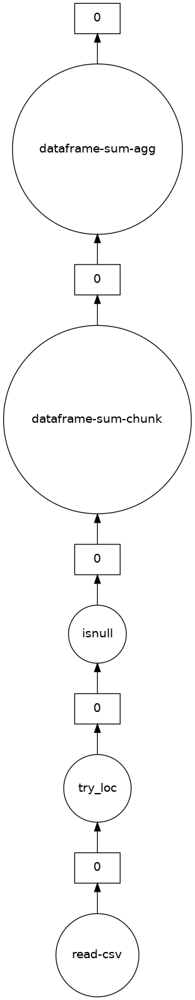

In [173]:
# All partitions are read and filtered.
missing_values = nyc_data_raw.loc[:1000].isnull().sum()
missing_values.visualize()

In [192]:
# Drop columns that have more than 50% missing values.
columns_to_drop = list(pct_missing[pct_missing >= 50].index)
print(columns_to_drop)

nyc_data_clean_stage1 = nyc_data_raw.drop(columns_to_drop, axis=1)

['Time First Observed', 'Intersecting Street', 'Violation Legal Code', 'Unregistered Vehicle?', 'Meter Number', 'No Standing or Stopping Violation', 'Hydrant Violation', 'Double Parking Violation']


In [199]:
# Impute missing values to the most common.
with ProgressBar():
    count_of_vehicle_colors = (
        nyc_data_clean_stage1["Vehicle Color"].value_counts().compute()
    )
    print("count_of_vehicle_colors\n%s" % count_of_vehicle_colors)
    most_common_color = count_of_vehicle_colors.sort_values(
        ascending=False
    ).index[0]
    print("most_common_color=", most_common_color)

[########################################] | 100% Completed | 414.07 ms
count_of_vehicle_colors
GY       1626
WH       1476
BK       1414
WHITE    1254
BLACK     577
         ... 
MAR         1
MUL         1
NAVY        1
ORB         1
LBL         1
Name: Vehicle Color, Length: 99, dtype: int64
most_common_color= GY


In [202]:
# Fill nans.
nyc_data_clean_stage2 = nyc_data_clean_stage1.fillna(
    {"Vehicle Color": most_common_color}
)
print(nyc_data_clean_stage2)

Dask DataFrame Structure:
              Summons Number Plate ID Registration State Plate Type Issue Date Violation Code Vehicle Body Type Vehicle Make Issuing Agency Street Code1 Street Code2 Street Code3 Vehicle Expiration Date Violation Location Violation Precinct Issuer Precinct Issuer Code Issuer Command Issuer Squad Violation Time Violation County Violation In Front Of Or Opposite House Number Street Name Date First Observed Law Section Sub Division Days Parking In Effect     From Hours In Effect To Hours In Effect Vehicle Color Vehicle Year Feet From Curb Violation Post Code Violation Description
npartitions=1                                                                                                                                                                                                                                                                                                                                                                                         

In [207]:
pct_missing

Summons Number                         0.000000
Plate ID                               0.000000
Registration State                     0.000000
Plate Type                             0.000000
Issue Date                             0.000000
Violation Code                         0.000000
Vehicle Body Type                      0.399600
Vehicle Make                           0.499500
Issuing Agency                         0.000000
Street Code1                           0.000000
Street Code2                           0.000000
Street Code3                           0.000000
Vehicle Expiration Date                0.000000
Violation Location                    19.280719
Violation Precinct                     0.000000
Issuer Precinct                        0.000000
Issuer Code                            0.000000
Issuer Command                        19.080919
Issuer Squad                          19.080919
Violation Time                         0.000000
Time First Observed                   93

In [206]:
# Dropping rows with missing data.
rows_to_drop = list(pct_missing[(pct_missing > 0) & (pct_missing < 5)].index)
print("rows_to_drop=", rows_to_drop)
nyc_data_clean_stage3 = nyc_data_clean_stage2.dropna(subset=rows_to_drop)

rows_to_drop= ['Vehicle Body Type', 'Vehicle Make', 'Violation County', 'Vehicle Color']


In [212]:
# Imputing multiple columns with missing values.
remaining_cols_to_clean = list(
    pct_missing[(pct_missing >= 5) & (pct_missing < 50)].index
)
print("remaining_cols_to_clean=", remaining_cols_to_clean)

remaining_cols_to_clean= ['Violation Location', 'Issuer Command', 'Issuer Squad', 'Violation In Front Of Or Opposite', 'House Number', 'Days Parking In Effect    ', 'From Hours In Effect', 'To Hours In Effect', 'Violation Post Code', 'Violation Description']


In [216]:
unknown_default_dict = dict(
    map(lambda columnName: (columnName, "Unknown"), remaining_cols_to_clean)
)
pprint.pprint(unknown_default_dict)

{'Days Parking In Effect    ': 'Unknown',
 'From Hours In Effect': 'Unknown',
 'House Number': 'Unknown',
 'Issuer Command': 'Unknown',
 'Issuer Squad': 'Unknown',
 'To Hours In Effect': 'Unknown',
 'Violation Description': 'Unknown',
 'Violation In Front Of Or Opposite': 'Unknown',
 'Violation Location': 'Unknown',
 'Violation Post Code': 'Unknown'}


In [218]:
nyc_data_clean_stage4 = nyc_data_clean_stage3.fillna(unknown_default_dict)

with ProgressBar():
    print(nyc_data_clean_stage4.isnull().sum().compute())

nyc_data_clean_stage4.persist()

[########################################] | 100% Completed | 676.63 ms
Summons Number                       0
Plate ID                             0
Registration State                   0
Plate Type                           0
Issue Date                           0
Violation Code                       0
Vehicle Body Type                    0
Vehicle Make                         0
Issuing Agency                       0
Street Code1                         0
Street Code2                         0
Street Code3                         0
Vehicle Expiration Date              0
Violation Location                   0
Violation Precinct                   0
Issuer Precinct                      0
Issuer Code                          0
Issuer Command                       0
Issuer Squad                         0
Violation Time                       0
Violation County                     0
Violation In Front Of Or Opposite    0
House Number                         0
Street Name                    

,Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Date First Observed,Law Section,Sub Division,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,uint32,object,object,object,object,uint16,object,object,object,uint32,uint32,uint32,object,object,float32,float32,float32,object,object,object,object,object,object,object,object,float32,object,object,object,object,object,float32,float32,object,object
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


## Recoding data

In [220]:
with ProgressBar():
    license_plate_types = (
        nyc_data_clean_stage4["Plate Type"].value_counts().compute()
    )

license_plate_types

[########################################] | 100% Completed | 829.81 ms


PAS    7420
COM    1601
OMT     422
SRF      83
OMS      83
999      51
IRP      47
MOT      24
OMR      18
TRC      17
ORG      12
APP      11
CMB      11
PSD      10
OML       9
TOW       8
SCL       8
MED       7
SPO       7
VAS       7
DLR       6
TRA       5
RGL       4
ORC       3
ITP       3
CSP       2
PHS       1
SEM       1
CMH       1
SRN       1
STA       1
TRL       1
Name: Plate Type, dtype: int64

In [223]:
# Replace the values not in PAS and COM with Other.
condition = nyc_data_clean_stage4["Plate Type"].isin(["PAS", "COM"])
# New series.
plate_type_masked = nyc_data_clean_stage4["Plate Type"].where(condition, "Other")
# Put the new series in the DataFrame.
nyc_data_recode_stage1 = nyc_data_clean_stage4.drop("Plate Type", axis=1)
nyc_data_recode_stage2 = nyc_data_recode_stage1.assign(
    PlateType=plate_type_masked
)
nyc_data_recode_stage3 = nyc_data_recode_stage2.rename(
    columns={"PlateType": "Plate Type"}
)

In [225]:
with ProgressBar():
    display(nyc_data_recode_stage3["Plate Type"].value_counts().compute())

[########################################] | 100% Completed | 518.41 ms


PAS      7420
COM      1601
Other     864
Name: Plate Type, dtype: int64

In [231]:
# Put all the unique color in Other.
single_color = list(count_of_vehicle_colors[count_of_vehicle_colors == 1].index)
print("single_color=", single_color)
# Create Series.
condition = nyc_data_clean_stage4["Vehicle Color"].isin(single_color)
vehicle_color_masked = nyc_data_clean_stage4["Vehicle Color"].mask(
    condition, "Other"
)
# Update data frame.
nyc_data_recode_stage4 = nyc_data_recode_stage3.drop("Vehicle Color", axis=1)
nyc_data_recode_stage5 = nyc_data_recode_stage4.assign(
    VehicleColor=vehicle_color_masked
)
nyc_data_recode_stage6 = nyc_data_recode_stage5.rename(
    columns={"VehicleColor": "Vehicle Color"}
)

with ProgressBar():
    display(nyc_data_recode_stage6.compute())

single_color= ['UNK', 'WHIT', 'SLVR', 'SLV', 'RD/', 'WH/', 'RD BK', 'YEL', 'SL.', 'WT.', 'BEIGE', 'PLE', 'ORW', 'BK.', 'BK/', 'BKGR', 'BKGY', 'BKRD', 'BL.', 'BL/', 'BLK/B', 'BLUG', 'BRONZ', 'BRWN', 'BURG', 'DKB', 'DKG', 'DKGR', 'DKTN', 'GD', 'GLD', 'GR/', 'GYBL', 'BGE', 'LT-GY', 'LTBR', 'MAR', 'MUL', 'NAVY', 'ORB', 'LBL']
[########################################] | 100% Completed | 645.20 ms


,Summons Number,Plate ID,Registration State,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,...,Sub Division,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description,Plate Type,Vehicle Color
0,797502185,GZH7067,NY,07/10/2016,7,SUBN,TOYOT,V,0,0,...,D,Unknown,Unknown,Unknown,2001.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,PAS,GY
1,797484362,GZH7067,NY,07/08/2016,7,SUBN,TOYOT,V,0,0,...,D,Unknown,Unknown,Unknown,2001.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,PAS,GY
2,4006265037,FZX9232,NY,08/23/2016,5,SUBN,FORD,V,0,0,...,C,Unknown,Unknown,Unknown,2004.0,0.0,Unknown,BUS LANE VIOLATION,PAS,BK
3,4183662532,66623ME,NY,06/14/2017,47,REFG,MITSU,T,10610,34330,...,l2,Y,0700A,0700P,2007.0,0.0,04,47-Double PKG-Midtown,COM,WH
4,3573333014,37033JV,NY,11/21/2016,69,DELV,INTER,T,10510,34310,...,h1,Y,0700A,0700P,2007.0,0.0,31 6,69-Failure to Disp Muni Recpt,COM,WHITE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,2736448575,HJV4099,NY,10/25/2016,71,4DSD,CHEVR,T,9520,40404,...,j6,YYYYYYY,Unknown,Unknown,2003.0,0.0,P 21,71A-Insp Sticker Expired (NYS),PAS,GR
9995,797876034,26340MH,NY,08/03/2016,7,VAN,FORD,V,0,0,...,D,Unknown,Unknown,Unknown,2009.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,COM,WH
9996,338924890,FPN7795,NY,05/15/2017,36,SUBN,LEXUS,V,0,0,...,B,Unknown,Unknown,Unknown,2004.0,0.0,Unknown,PHTO SCHOOL ZN SPEED VIOLATION,PAS,BL
9997,799239938,T696308C,NY,11/05/2016,7,4DSD,TOYOT,V,0,0,...,D,Unknown,Unknown,Unknown,2015.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,Other,BK


## Element wise operations

In [234]:
from datetime import datetime

# Create derived columns by applying functions.
issue_date_parsed = nyc_data_recode_stage6["Issue Date"].apply(
    lambda x: datetime.strptime(x, "%m/%d/%Y"), meta=datetime
)
nyc_data_derived_stage1 = nyc_data_recode_stage6.drop("Issue Date", axis=1)
nyc_data_derived_stage2 = nyc_data_derived_stage1.assign(
    IssueDate=issue_date_parsed
)
nyc_data_derived_stage3 = nyc_data_derived_stage2.rename(
    columns={"IssueDate": "Issue Date"}
)

with ProgressBar():
    display(nyc_data_derived_stage3["Issue Date"].head())

[                                        ] | 0% Completed | 106.12 ms

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:6753: FutureWarning: Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.
  warnings.warn(


[########################################] | 100% Completed | 537.69 ms


0   2016-07-10
1   2016-07-08
2   2016-08-23
3   2017-06-14
4   2016-11-21
Name: Issue Date, dtype: datetime64[ns]

In [235]:
# Create a column with year + month.
issue_date_month_year = nyc_data_derived_stage3["Issue Date"].apply(
    lambda dt: dt.strftime("%Y%m"), meta=str
)
nyc_data_derived_stage4 = nyc_data_derived_stage3.assign(
    IssueMonthYear=issue_date_month_year
)
nyc_data_derived_stage5 = nyc_data_derived_stage4.rename(
    columns={"IssueMonthYear": "Citation Issued Month Year"}
)

with ProgressBar():
    display(nyc_data_derived_stage5["Citation Issued Month Year"].head())

[                                        ] | 0% Completed | 101.57 ms

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:6753: FutureWarning: Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.
  warnings.warn(


[########################################] | 100% Completed | 687.35 ms


0    201607
1    201607
2    201608
3    201706
4    201611
Name: Citation Issued Month Year, dtype: object

## Filtering and reindexing DataFrames.

In [237]:
# Find citations in a certain month (i.e., October).
months = ["201310", "201410", "201510", "201610", "201710"]
condition = nyc_data_derived_stage5["Citation Issued Month Year"].isin(months)
october_citations = nyc_data_derived_stage5[condition]

with ProgressBar():
    display(october_citations.head())

[########################################] | 100% Completed | 765.71 ms


,Summons Number,Plate ID,Registration State,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,...,From Hours In Effect,To Hours In Effect,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description,Plate Type,Vehicle Color,Issue Date,Citation Issued Month Year
9,4006478550,VAD7274,VA,5,4D,BMW,V,0,0,0,...,Unknown,Unknown,2008.0,0.0,Unknown,BUS LANE VIOLATION,PAS,BLK,2016-10-05,201610
12,330959314,N102911C,NY,36,VAN,FORD,V,0,0,0,...,Unknown,Unknown,2008.0,0.0,Unknown,PHTO SCHOOL ZN SPEED VIOLATION,Other,WH,2016-10-27,201610
21,4177886046,HJN6543,NY,71,2DSD,LINCO,T,39680,23290,58590,...,Unknown,Unknown,1989.0,0.0,H 42,71A-Insp Sticker Expired (NYS),PAS,RD,2016-10-04,201610
55,3241377182,HAL6563,NY,38,SUBN,NISSA,T,54830,53970,50530,...,0800A,0400P,2005.0,0.0,14 3,38-Failure to Display Muni Rec,PAS,GY,2016-10-12,201610
60,4115039354,D53AUUN,NJ,9,4DSD,LEXUS,T,17730,10210,0,...,Unknown,Unknown,0.0,0.0,99 6,09-Blocking the Box,PAS,BLACK,2016-10-21,201610


In [238]:
# Find all the citations after a specific data.
bound_date = "2016-4-25"
condition = nyc_data_derived_stage5["Issue Date"] > bound_date
citations_after_bound = nyc_data_derived_stage5[condition]

with ProgressBar():
    display(citations_after_bound.head())

[########################################] | 100% Completed | 438.35 ms


,Summons Number,Plate ID,Registration State,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,...,From Hours In Effect,To Hours In Effect,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description,Plate Type,Vehicle Color,Issue Date,Citation Issued Month Year
0,797502185,GZH7067,NY,7,SUBN,TOYOT,V,0,0,0,...,Unknown,Unknown,2001.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,PAS,GY,2016-07-10,201607
1,797484362,GZH7067,NY,7,SUBN,TOYOT,V,0,0,0,...,Unknown,Unknown,2001.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,PAS,GY,2016-07-08,201607
2,4006265037,FZX9232,NY,5,SUBN,FORD,V,0,0,0,...,Unknown,Unknown,2004.0,0.0,Unknown,BUS LANE VIOLATION,PAS,BK,2016-08-23,201608
3,4183662532,66623ME,NY,47,REFG,MITSU,T,10610,34330,34350,...,0700A,0700P,2007.0,0.0,04,47-Double PKG-Midtown,COM,WH,2017-06-14,201706
4,3573333014,37033JV,NY,69,DELV,INTER,T,10510,34310,34330,...,0700A,0700P,2007.0,0.0,31 6,69-Failure to Disp Muni Recpt,COM,WHITE,2016-11-21,201611


In [ ]:
# If we want to join dataframes we should index them on the same index and sort.

In [256]:
with ProgressBar():
    # Find a subset of the data.
    condition = (nyc_data_derived_stage5["Issue Date"] > "2014-01-01") & (
        nyc_data_derived_stage5["Issue Date"] <= "2017-12-31"
    )
    nyc_data_filtered = nyc_data_derived_stage5[condition]
    # Reindex based on the month / year.
    nyc_data_new_index = nyc_data_filtered.set_index(
        "Citation Issued Month Year"
    )

display(nyc_data_new_index.head(10))

[########################################] | 100% Completed | 835.81 ms


,Summons Number,Plate ID,Registration State,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,...,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description,Plate Type,Vehicle Color,Issue Date
Citation Issued Month Year,,,,,,,,,,,,,,,,,,,,,
201607,797502185,GZH7067,NY,7,SUBN,TOYOT,V,0,0,0,...,Unknown,Unknown,Unknown,2001.0,0.0,Unknown,FAILURE TO STOP AT RED LIGHT,PAS,GY,2016-07-10
201607,3834093294,HCX9493,NY,21,4DSD,HONDA,T,29320,69820,43820,...,Y,0830A,0900A,2016.0,0.0,52 2,21-No Parking (street clean),PAS,WH,2016-07-16
201607,3755567713,GEP8830,NY,71,4DSD,FORD,T,18550,10210,10110,...,YYYYYYY,Unknown,Unknown,2013.0,0.0,15 7,71A-Insp Sticker Expired (NYS),PAS,BK,2016-07-10
201607,1412403455,GRS4025,NY,21,SUBN,FORD,S,68090,12990,13140,...,BYBBYBB,0730A,0800A,2008.0,0.0,Unknown,Unknown,PAS,WHITE,2016-07-19
201607,3753725712,DMF9091,NY,21,4DSD,HONDA,T,17430,10110,10010,...,Y Y,0930A,1100A,2006.0,0.0,F 17,21-No Parking (street clean),PAS,BLACK,2016-07-14
201607,2714952909,NOBOLONY,NY,46,REFG,PETER,T,25390,18820,18830,...,Unknown,Unknown,Unknown,2005.0,0.0,01 7,46B-Double Parking (Com-100Ft),COM,OTHER,2016-07-22
201607,2784038621,DHF9402,NY,24,4DSD,CHEVR,T,28870,0,0,...,YYYYY,0700A,0700P,2006.0,0.0,039,24-No Parking (exc auth veh),PAS,BR,2016-07-20
201607,4071037675,FZW2184,NY,37,4DSD,ME/BE,T,0,40404,40404,...,Y,0700A,1000P,2009.0,0.0,A 42,37-Expired Muni Meter,PAS,BK,2016-07-15
201607,3968587740,GDU4655,NY,40,SUBN,DODGE,T,36130,85530,19630,...,YYYYYYY,Unknown,Unknown,2013.0,0.0,A 31,40-Fire Hydrant,PAS,BK,2016-07-30


In [257]:
nyc_data_new_index

,Summons Number,Plate ID,Registration State,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Date First Observed,Law Section,Sub Division,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Year,Feet From Curb,Violation Post Code,Violation Description,Plate Type,Vehicle Color,Issue Date
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
201607,uint32,object,object,uint16,object,object,object,uint32,uint32,uint32,object,object,float32,float32,float32,object,object,object,object,object,object,object,object,float32,object,object,object,object,float32,float32,object,object,object,object,object
201706,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [259]:
!pip install fastparquet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 3.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 3.5 MB/s eta 0:00:0000:0100:01


In [265]:
# Repartition on the new index.
# years = ['2014', '2015', '2016', '2017']
years = ["2014"]
months = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12"]
divisions = [year + month for year in years for month in months]
divisions = ["201401", "201406"]
print("divisions=", divisions)

with ProgressBar():
    # ValueError: left side of old and new divisions are different
    # nyc_data_new_index.repartition(divisions=divisions)
    nyc_data_new_index.repartition(npartitions=2)
    # .to_parquet('nyc_data_date_index')#, compression='snappy')

# nyc_data_new_index = dd.read_parquet('nyc_data_date_index')

divisions= ['201401', '201406']


# Summarizing and analyzing df

# Visualizing df with Seaborn

# Working with Bags and Array

The format is 

```
product/productId: B001E4KFG0
review/userId: A3SGXH7AUHU8GW
review/profileName: delmartian
review/helpfulness: 1/1
review/score: 5.0
review/time: 1303862400
review/summary: Good Quality Dog Food
review/text: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.
```

In [271]:
!ls /data

 Dask_tutorial.ipynb
 Dockerfile
 Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv
 Parking_Violations_Issued_-_Fiscal_Year_2015.csv
 Parking_Violations_Issued_-_Fiscal_Year_2016.csv
 Parking_Violations_Issued_-_Fiscal_Year_2017.csv
 Parking_Violations_Issued_-_Fiscal_Year_2017.csv.zip
 Parking_Violations_Issued_-_Fiscal_Year_2017.small.csv
 bashrc
 delayed.ipynb
 docker_build.sh
 docker_jupyter.sh
 docker_run.sh
 download_data.sh
 finefoods.txt
 install_jupyter_extensions.sh
 kaggle.json
 mydask.png
 nyc-parking-tickets.zip
'nyc-parking-tickets?resource=download&select=Parking_Violations_Issued_-_Fiscal_Year_2014__August_2013___June_2014_.csv'
 nyc_data
 nyc_data_date_index
 run_jupyter.sh


In [272]:
import dask.bag as bag

raw_data = bag.read_text("/data/finefoods.txt")
raw_data

dask.bag<bag-from-delayed, npartitions=1>

In [274]:
# `take()` is equivalent to `head()`.
# Each element is a line.
raw_data.take(10)

('product/productId: B001E4KFG0\n',
 'review/userId: A3SGXH7AUHU8GW\n',
 'review/profileName: delmartian\n',
 'review/helpfulness: 1/1\n',
 'review/score: 5.0\n',
 'review/time: 1303862400\n',
 'review/summary: Good Quality Dog Food\n',
 'review/text: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.\n',
 '\n',
 'product/productId: B00813GRG4\n')

In [276]:
# Error since there are chars that can't be decoded with utf-8.
# raw_data.count().compute()

In [278]:
raw_data = bag.read_text("/data/finefoods.txt", encoding="cp1252")
raw_data.count().compute()

5116093

In [283]:
from dask.delayed import delayed


def get_next_part(file, start_index, span_index=0, blocksize=1000):
    # Read the next chunk.
    file.seek(start_index)
    buffer = file.read(blocksize + span_index).decode("cp1252")
    # Look for the end of the record.
    delimiter_position = buffer.find("\n\n")
    if delimiter_position == -1:
        # The delimiter is not found: try to read more data recursively.
        return get_next_part(file, start_index, span_index + blocksize)
    else:
        file.seek(start_index)
        return start_index, delimiter_position


with open("/data/finefoods.txt", "rb") as fh:
    # Get size of the file in bytes.
    size = fh.seek(0, 2) - 1
    more_data = True
    output = []
    curr_pos = next_pos = 0
    while more_data:
        # print(curr_pos, next_pos)
        if curr_pos >= size:
            # We have reached the end fo the file.
            more_data = False
        else:
            # Find the next record starting from the current position.
            curr_pos, next_pos = get_next_part(fh, curr_pos, 0)
            output.append((curr_pos, next_pos))
            # Add two position since there are two `\n`.
            curr_pos = curr_pos + next_pos + 2

0 0
473 471
865 390
1604 737
2020 414
2379 357
2997 616
3542 543
3901 357
4229 326
4574 343
5575 999
6164 587
6779 613
7087 306
7426 337
7812 384
8210 396
8542 330
9492 948
9843 349
10304 459
10828 522
11184 354
11469 283
11978 507
12359 379
12647 286
13060 411
13757 695
14758 999
15460 700
15785 323
17101 1314
17799 696
18566 765
19182 614
19657 473
20142 483
20859 715
21412 551
22306 892
23758 1450
24127 367
24528 399
24988 458
25405 415
25844 437
26159 313
26674 513
27055 379
27345 288
27943 596
29432 1487
29805 371
30413 606
30945 530
31357 410
31739 380
32153 412
32466 311
32850 382
33217 365
33494 275
34734 1238
35278 542
35666 386
36669 1001
37358 687
37821 461
38106 283
38686 578
39556 868
40150 592
42125 1973
42379 252
42678 297
43373 693
43917 542
44260 341
44626 364
45010 382
45346 334
47925 2577
48572 645
49144 570
49593 447
50232 637
50648 414
51502 852
51951 447
52388 435
52688 298
53092 402
54245 1151
54556 309
55115 557
56160 1043
56745 583
57390 643
57770 378
58189 417

768211 316
769692 1479
770240 546
770754 512
771181 425
771605 422
772173 566
772518 343
772914 394
774104 1188
774674 568
775076 400
775458 380
776199 739
776694 493
777193 497
777980 785
778467 485
779318 849
779931 611
780385 452
780710 323
781071 359
781653 580
782080 425
782440 358
782752 310
783116 362
783518 400
783861 341
784392 529
785071 677
785410 337
786127 715
786580 451
787555 973
787895 338
788442 545
788790 346
789427 635
789827 398
790217 388
790690 471
791429 737
792036 605
792354 316
792880 524
793313 431
793716 401
794441 723
795071 628
795446 373
795986 538
796360 372
796777 415
798279 1500
798888 607
799598 708
800033 433
800406 371
800874 466
801829 953
802220 389
802857 635
808274 5415
808861 585
809254 391
810136 880
812108 1970
812835 725
813202 365
813684 480
813968 282
814339 369
815022 681
815327 303
815747 418
816166 417
816536 368
816956 418
818112 1154
818648 534
818975 325
819307 330
820031 722
820548 515
821159 609
821601 440
821894 291
822378 482
8227

1328908 808
1329667 757
1330413 744
1331954 1539
1332313 357
1332816 501
1333667 849
1334237 568
1335259 1020
1335775 514
1336148 371
1336797 647
1337405 606
1337839 432
1338399 558
1341232 2831
1341847 613
1342973 1124
1343507 532
1343881 372
1344988 1105
1345563 573
1346062 497
1346521 457
1346953 430
1347737 782
1348895 1156
1349405 508
1349917 510
1350337 418
1350743 404
1351612 867
1352311 697
1352870 557
1353258 386
1353677 417
1354203 524
1354655 450
1355165 508
1355571 404
1355935 362
1356748 811
1357454 704
1358132 676
1358509 375
1359107 596
1359495 386
1359940 443
1360668 726
1360982 312
1362119 1135
1363891 1770
1364340 447
1364690 348
1365073 381
1365840 765
1366355 513
1366651 294
1367042 389
1367721 677
1368215 492
1368632 415
1368972 338
1369570 596
1369910 338
1371603 1691
1372516 911
1373158 640
1373593 433
1374195 600
1374965 768
1375660 693
1376412 750
1377630 1216
1378364 732
1379104 738
1380434 1328
1380837 401
1381195 356
1381515 318
1381998 481
1382478 478
13828

2204678 464
2205212 532
2206874 1660
2207294 418
2207686 390
2207998 310
2208722 722
2209246 522
2209678 430
2210220 540
2211487 1265
2212475 986
2212806 329
2213213 405
2213720 505
2214182 460
2214749 565
2215178 427
2215809 629
2216205 394
2216816 609
2217155 337
2217538 381
2217963 423
2218865 900
2219316 449
2219955 637
2220359 402
2220801 440
2222069 1266
2222432 361
2222947 513
2223269 320
2223717 446
2224114 395
2224505 389
2224908 401
2225774 864
2226690 914
2227373 681
2227719 344
2228752 1031
2229352 598
2229920 566
2230625 703
2231209 582
2231634 423
2232404 768
2233084 678
2233513 427
2233881 366
2234960 1077
2236761 1799
2237204 441
2237594 388
2238083 487
2238697 612
2239363 664
2239954 589
2240532 576
2240850 316
2241953 1101
2242426 471
2243163 735
2243613 448
2244093 478
2244918 823
2245394 474
2245690 294
2246123 431
2246650 525
2247186 534
2247639 451
2248012 371
2248423 409
2248756 331
2249354 596
2249682 326
2250345 661
2250657 310
2251566 907
2252216 648
2252527 3

3259587 824
3260438 849
3261126 686
3261649 521
3262528 877
3263380 850
3264015 633
3264339 322
3265160 819
3265993 831
3266790 795
3267261 469
3267612 349
3268591 977
3269995 1402
3270464 467
3270795 329
3271163 366
3272784 1619
3273336 550
3273889 551
3274215 324
3274512 295
3274803 289
3275428 623
3275752 322
3276110 356
3277147 1035
3277874 725
3278164 288
3279236 1070
3279787 549
3280511 722
3281535 1022
3282027 490
3282588 559
3283356 766
3283711 353
3284385 672
3284938 551
3285572 632
3286024 450
3287281 1255
3287921 638
3288454 531
3288826 370
3289288 460
3289849 559
3290255 404
3290659 402
3290962 301
3291345 381
3291648 301
3292372 722
3292825 451
3293497 670
3293819 320
3294145 324
3294456 309
3294762 304
3295151 387
3295461 308
3295869 406
3296285 414
3296647 360
3296969 320
3297302 331
3298260 956
3298781 519
3299115 332
3299528 411
3299876 346
3300329 451
3300699 368
3301039 338
3301421 380
3301889 466
3302380 489
3302780 398
3303110 328
3303482 370
3303939 455
3304378 43

4345224 456
4346098 872
4347460 1360
4349017 1555
4353878 4859
4354638 758
4357051 2411
4357874 821
4358866 990
4359445 577
4360296 849
4360691 393
4361225 532
4363135 1908
4363651 514
4364200 547
4365223 1021
4365718 493
4366762 1042
4367441 677
4368227 784
4368745 516
4370027 1280
4371197 1168
4371649 450
4372131 480
4372897 764
4374890 1991
4375468 576
4375876 406
4376637 759
4377315 676
4378138 821
4378513 373
4379248 733
4379811 561
4380466 653
4381349 881
4381937 586
4382430 491
4385254 2822
4385702 446
4386238 534
4386766 526
4387102 334
4387639 535
4388006 365
4388433 425
4389220 785
4390279 1057
4390882 601
4392565 1681
4393175 608
4393737 560
4394739 1000
4395605 864
4396192 585
4396890 696
4398751 1859
4401244 2491
4401766 520
4403035 1267
4404333 1296
4405312 977
4406406 1092
4407339 931
4407909 568
4409053 1142
4410137 1082
4410887 748
4411735 846
4412348 611
4413629 1279
4414163 532
4416262 2097
4417321 1057
4418798 1475
4419749 949
4420148 397
4420651 501
4420978 325
442

5039304 587
5039648 342
5040585 935
5041387 800
5042309 920
5044142 1831
5045688 1544
5046966 1276
5047958 990
5049149 1189
5050231 1080
5050952 719
5051271 317
5052657 1384
5052980 321
5053332 350
5053930 596
5054713 781
5055074 359
5055711 635
5056179 466
5056951 770
5057607 654
5057860 251
5058438 576
5058747 307
5060754 2005
5061265 509
5062318 1051
5063014 694
5063930 914
5064459 527
5065182 721
5065529 345
5065990 459
5066322 330
5066870 546
5067698 826
5068321 621
5068756 433
5069521 763
5070196 673
5071075 877
5071518 441
5071868 348
5072287 417
5072626 337
5073007 379
5073963 954
5074413 448
5075373 958
5076850 1475
5078257 1405
5078843 584
5079467 622
5080294 825
5080669 373
5081074 403
5081532 456
5082821 1287
5083438 615
5084380 940
5084712 330
5085812 1098
5086361 547
5086868 505
5087266 396
5087715 447
5089135 1418
5089521 384
5090002 479
5090322 318
5090817 493
5091254 435
5091788 532
5092461 671
5094079 1616
5094678 597
5095006 326
5095350 342
5095756 404
5096089 331
50

5686572 364
5686906 332
5687616 708
5688108 490
5688465 355
5689040 573
5689669 627
5690127 456
5690443 314
5691037 592
5691504 465
5691908 402
5692557 647
5693859 1300
5694319 458
5694952 631
5695474 520
5695903 427
5696304 399
5696623 317
5697167 542
5698016 847
5698964 946
5699300 334
5699932 630
5700965 1031
5701566 599
5701891 323
5702293 400
5703059 764
5703517 456
5703955 436
5704430 473
5704759 327
5705155 394
5705461 304
5705942 479
5706959 1015
5707751 790
5708140 387
5708603 461
5709148 543
5709782 632
5710166 382
5710743 575
5711852 1107
5712238 384
5713188 948
5713663 473
5714219 554
5714608 387
5714978 368
5715322 342
5716282 958
5716731 447
5717210 477
5717565 353
5717984 417
5718345 359
5718760 413
5719214 452
5719652 436
5720039 385
5720471 430
5720927 454
5721448 519
5722000 550
5722563 561
5723034 469
5723393 357
5724118 723
5725041 921
5726170 1127
5726539 367
5727133 592
5727452 317
5727881 427
5728839 956
5729180 339
5729782 600
5730178 394
5730491 311
5730854 361

6343892 313
6344393 499
6345041 646
6345453 410
6348292 2837
6349971 1677
6350487 514
6350853 364
6351172 317
6351573 399
6351969 394
6352351 380
6352768 415
6353223 453
6354340 1115
6354610 268
6355087 475
6355516 427
6356095 577
6357017 920
6357431 412
6358648 1215
6359256 606
6359801 543
6360584 781
6361040 454
6361517 475
6362196 677
6362522 324
6362860 336
6363640 778
6365227 1585
6366103 874
6366449 344
6367422 971
6368113 689
6368660 545
6369100 438
6369502 400
6369801 297
6370537 734
6370970 431
6371964 992
6372298 332
6372820 520
6373238 416
6373855 615
6374585 728
6375064 477
6375398 332
6376588 1188
6376937 347
6377269 330
6378639 1368
6379056 415
6379674 616
6380196 520
6381645 1447
6382085 438
6382724 637
6383032 306
6383401 367
6383868 465
6384322 452
6385005 681
6385446 439
6385989 541
6387271 1280
6389161 1888
6389607 444
6390519 910
6390921 400
6391275 352
6392139 862
6392616 475
6392988 370
6393345 355
6393838 491
6394161 321
6394635 472
6394989 352
6395347 356
639573

7019011 757
7019355 342
7019680 323
7020070 388
7020472 400
7021662 1188
7022708 1044
7024184 1474
7024601 415
7024938 335
7025893 953
7027062 1167
7027467 403
7027872 403
7029022 1148
7029847 823
7030239 390
7032293 2052
7032781 486
7033244 461
7033748 502
7034252 502
7034770 516
7035317 545
7035815 496
7036886 1069
7037621 733
7039228 1605
7040492 1262
7041974 1480
7042448 472
7043769 1319
7044122 351
7044736 612
7045449 711
7047499 2048
7047903 402
7048395 490
7048846 449
7049226 378
7049649 421
7050009 358
7050460 449
7051160 698
7051506 344
7051829 321
7052235 404
7052755 518
7054054 1297
7054455 399
7054907 450
7055306 397
7056134 826
7056641 505
7056966 323
7057540 572
7057850 308
7058169 317
7058725 554
7059487 760
7060218 729
7060721 501
7061017 294
7062208 1189
7062875 665
7063519 642
7064329 808
7064930 599
7065458 526
7065903 443
7066353 448
7067566 1211
7068407 839
7068970 561
7069616 644
7069958 340
7070689 729
7071121 430
7071473 350
7071888 413
7072827 937
7073701 872
7

8186745 324
8187049 302
8187569 518
8187841 270
8188303 460
8188798 493
8189514 714
8190419 903
8191126 705
8191630 502
8192330 698
8192658 326
8193567 907
8194012 443
8194509 495
8195183 672
8195780 595
8196499 717
8196810 309
8197190 378
8197569 377
8197866 295
8198262 394
8199124 860
8199491 365
8200272 779
8200959 685
8201362 401
8201861 497
8202249 386
8202613 362
8203320 705
8203915 593
8204512 595
8205026 512
8205677 649
8207354 1675
8207655 299
8207986 329
8208280 292
8208760 478
8209350 588
8209778 426
8210206 426
8210677 469
8211013 334
8211341 326
8212366 1023
8212704 336
8213357 651
8213902 543
8214241 337
8214545 302
8215279 732
8215733 452
8216082 347
8216778 694
8217140 360
8217603 461
8218131 526
8218623 490
8218989 364
8219622 631
8219993 369
8220863 868
8221228 363
8221662 432
8222291 627
8223001 708
8223611 608
8224139 526
8224752 611
8225189 435
8225607 416
8226143 534
8226593 448
8227171 576
8227572 399
8228113 539
8228762 647
8229405 641
8229718 311
8230013 293
82

8923679 1527
8924229 548
8925914 1683
8927674 1758
8928414 738
8928983 567
8929748 763
8930804 1054
8931504 698
8932852 1346
8933943 1089
8935144 1199
8937979 2833
8939058 1077
8940751 1691
8941550 797
8942066 514
8942605 537
8943506 899
8944905 1397
8945866 959
8946513 645
8947065 550
8948281 1214
8949688 1405
8950561 871
8951505 942
8954042 2535
8956377 2333
8957549 1170
8958980 1429
8959758 776
8961212 1452
8962599 1385
8963194 593
8963836 640
8964685 847
8966201 1514
8967777 1574
8969085 1306
8970106 1019
8971588 1480
8974398 2808
8976086 1686
8976969 881
8978048 1077
8979359 1309
8979843 482
8983875 4030
8986876 2999
8988004 1126
8988508 502
8989396 886
8991441 2043
8991965 522
8993375 1408
8994582 1205
8996195 1611
8997728 1531
8998917 1187
8999372 453
9002143 2769
9003480 1335
9004408 926
9005239 829
9006265 1024
9007669 1402
9008897 1226
9009818 919
9011830 2010
9012718 886
9013706 986
9014912 1204
9015654 740
9017818 2162
9019109 1289
9019583 472
9020138 553
9023090 2950
90238

9701988 290
9702351 361
9702660 307
9703080 418
9703465 383
9703845 378
9704333 486
9704746 411
9705045 297
9705373 326
9706018 643
9706948 928
9707932 982
9708476 542
9708828 350
9709180 350
9710023 841
9710703 678
9711774 1069
9712302 526
9713157 853
9713625 466
9713994 367
9714534 538
9714944 408
9715552 606
9716239 685
9717139 898
9717457 316
9719316 1857
9720106 788
9720787 679
9721365 576
9721703 336
9722134 429
9722570 434
9724244 1672
9724810 564
9725305 493
9725644 337
9726200 554
9726605 403
9727519 912
9727953 432
9729687 1732
9730026 337
9730697 669
9731654 955
9731958 302
9732648 688
9734667 2017
9736969 2300
9737567 596
9739081 1512
9740216 1133
9741806 1588
9744294 2486
9745647 1351
9746687 1038
9747389 700
9748242 851
9750560 2316
9752228 1666
9753613 1383
9754380 765
9755292 910
9756238 944
9756643 403
9757611 966
9759144 1531
9759534 388
9760677 1141
9761402 723
9762786 1382
9764078 1290
9765915 1835
9767936 2019
9769340 1402
9771083 1741
9771672 587
9772703 1029
9773

10466655 306
10466971 314
10467266 293
10467852 584
10468763 909
10469064 299
10469396 330
10469924 526
10470314 388
10470850 534
10471188 336
10472459 1269
10473028 567
10473418 388
10474101 681
10474529 426
10475053 522
10475366 311
10475719 351
10476132 411
10476473 339
10477106 631
10477470 362
10477925 453
10478408 481
10479295 885
10479655 358
10480038 381
10480747 707
10481393 644
10481822 427
10482171 347
10482683 510
10483022 337
10483349 325
10484379 1028
10484945 564
10485416 469
10485844 426
10486215 369
10486746 529
10487097 349
10487462 363
10488119 655
10488457 336
10488894 435
10489642 746
10490124 480
10490623 497
10490945 320
10491312 365
10491624 310
10491962 336
10493200 1236
10493624 422
10494011 385
10494530 517
10495145 613
10496365 1218
10496947 580
10497302 353
10497662 358
10498034 370
10498359 323
10498740 379
10499103 361
10499461 356
10499964 501
10500269 303
10500602 331
10501075 471
10501471 394
10501838 365
10502169 329
10502555 384
10502884 327
10503271

11293991 1004
11294873 880
11295642 767
11296385 741
11296686 299
11297073 385
11297989 914
11298339 348
11298625 284
11299350 723
11299765 413
11300828 1061
11301218 388
11301767 547
11302408 639
11302947 537
11303563 614
11304141 576
11304563 420
11305039 474
11305412 371
11305914 500
11306431 515
11306878 445
11307211 331
11307787 574
11308181 392
11308733 550
11309382 647
11309880 496
11310387 505
11311011 622
11311351 338
11311680 327
11312447 765
11313010 561
11313396 384
11313707 309
11314397 688
11315639 1240
11316433 792
11317113 678
11317435 320
11317935 498
11318327 390
11318958 629
11320024 1064
11320698 672
11321163 463
11321451 286
11321888 435
11322178 288
11322845 665
11323813 966
11324402 587
11325154 750
11325836 680
11326465 627
11326991 524
11327388 395
11327877 487
11328304 425
11329163 857
11330070 905
11331147 1075
11331732 583
11332171 437
11332580 407
11333204 622
11333832 626
11335110 1276
11335756 644
11336091 333
11337742 1649
11338151 407
11338495 342
11339

11984238 610
11984561 321
11985283 720
11985731 446
11986308 575
11986955 645
11987349 392
11987669 318
11988085 414
11988489 402
11988836 345
11989227 389
11989811 582
11990222 409
11991001 777
11991650 647
11992040 388
11992650 608
11993101 449
11993493 390
11994165 670
11994631 464
11994956 323
11995400 442
11995830 428
11996159 327
11996523 362
11996861 336
11997632 769
11997977 343
11998290 311
11998673 381
11998987 312
11999740 751
12000064 322
12000667 601
12001244 575
12001953 707
12003551 1596
12004437 884
12005413 974
12005774 359
12006768 992
12007149 379
12007559 408
12008005 444
12008706 699
12009648 940
12010011 361
12010465 452
12010931 464
12011650 717
12012118 466
12012748 628
12013059 309
12013465 404
12014204 737
12014753 547
12015561 806
12016777 1214
12017117 338
12017559 440
12017911 350
12018455 542
12018870 413
12019208 336
12019872 662
12020551 677
12020917 364
12021409 490
12023926 2515
12024465 537
12026525 2058
12028358 1831
12029299 939
12031003 1702
120314

12704238 398
12704735 495
12705283 546
12705823 538
12706125 300
12706989 862
12707430 439
12708067 635
12708521 452
12708862 339
12709756 892
12710687 929
12711008 319
12711387 377
12711885 496
12712644 757
12713441 795
12714675 1232
12715326 649
12715761 433
12716611 848
12717077 464
12717652 573
12718256 602
12719913 1655
12720431 516
12721194 761
12721679 483
12722566 885
12723520 952
12724723 1201
12725321 596
12725881 558
12726421 538
12727084 661
12727378 292
12727657 277
12728162 503
12728540 376
12728916 374
12729411 493
12729778 365
12730076 296
12730511 433
12731027 514
12731559 530
12732505 944
12733231 724
12733653 420
12734580 925
12735071 489
12735382 309
12735680 296
12736184 502
12736950 764
12737351 399
12738132 779
12738691 557
12739536 843
12740039 501
12740615 574
12741013 396
12742105 1090
12742678 571
12743019 339
12743377 356
12743970 591
12744755 783
12745240 483
12745562 320
12746187 623
12746761 572
12747335 572
12747864 527
12748319 453
12748903 582
12749225

13573212 911
13573601 387
13574001 398
13574584 581
13574919 333
13575276 355
13575887 609
13576240 351
13576888 646
13577611 721
13578481 868
13578960 477
13579414 452
13580093 677
13580559 464
13580881 320
13581242 359
13581712 468
13582292 578
13582936 642
13583248 310
13583828 578
13584282 452
13584838 554
13585263 423
13585587 322
13586459 870
13587568 1107
13588292 722
13588582 288
13588915 331
13589303 386
13590541 1236
13591126 583
13591754 626
13592170 414
13592470 298
13592986 514
13594148 1160
13594948 798
13595572 622
13596076 502
13596567 489
13597097 528
13597678 579
13598203 523
13598763 558
13599133 368
13599631 496
13600724 1091
13601252 526
13602919 1665
13603462 541
13604019 555
13606606 2585
13607152 544
13607632 478
13608095 461
13608459 362
13608998 537
13609437 437
13610272 833
13611008 734
13611998 988
13612358 358
13612923 563
13613401 476
13616051 2648
13616426 373
13616884 456
13617288 402
13617684 394
13618242 556
13618791 547
13619395 602
13619802 405
13620

14355845 410
14356333 486
14357225 890
14358153 926
14358692 537
14359559 865
14360501 940
14361395 892
14362360 963
14362694 332
14363093 397
14364490 1395
14365834 1342
14366164 328
14367199 1033
14367754 553
14368420 664
14369076 654
14369818 740
14370542 722
14371050 506
14371630 578
14372299 667
14373184 883
14373528 342
14374409 879
14374798 387
14375758 958
14376617 857
14377799 1180
14378202 401
14378538 334
14379366 826
14379932 564
14380314 380
14381297 981
14381695 396
14382036 339
14382814 776
14383309 493
14383789 478
14384441 650
14385083 640
14385583 498
14385900 315
14386401 499
14386914 511
14388003 1087
14388355 350
14389103 746
14389688 583
14390262 572
14390897 633
14391250 351
14391663 411
14392411 746
14392913 500
14394520 1605
14395004 482
14396957 1951
14398450 1491
14398773 321
14400817 2042
14401365 546
14402458 1091
14403546 1086
14404201 653
14404633 430
14406038 1403
14407161 1121
14407618 455
14409291 1671
14410018 725
14410415 395
14410975 558
14411331 35

15210087 670
15210539 450
15211168 627
15212225 1055
15212771 544
15213220 447
15213929 707
15214580 649
15215497 915
15215843 344
15216169 324
15216754 583
15218835 2079
15219187 350
15221241 2052
15221799 556
15222478 677
15223105 625
15223683 576
15224491 806
15224897 404
15225262 363
15226271 1007
15226674 401
15227000 324
15227711 709
15228055 342
15228487 430
15228800 311
15229127 325
15229535 406
15229940 403
15230376 434
15230932 554
15231351 417
15231824 471
15232194 368
15232590 394
15233479 887
15235202 1721
15235901 697
15236278 375
15236954 674
15237391 435
15237878 485
15239769 1889
15240167 396
15240521 352
15240954 431
15241574 618
15242272 696
15242572 298
15243009 435
15243566 555
15244108 540
15244605 495
15244961 354
15245379 416
15245765 384
15246108 341
15246516 406
15247213 695
15247884 669
15248637 751
15249242 603
15249661 417
15251022 1359
15252176 1152
15252774 596
15253293 517
15254447 1152
15254814 365
15255219 403
15256074 853
15256496 420
15257038 540
152

15936615 298
15936953 336
15937359 404
15937812 451
15938137 323
15938782 643
15939662 878
15939982 318
15940408 424
15940830 420
15941178 346
15941984 804
15942416 430
15942829 411
15943465 634
15943862 395
15944268 404
15945206 936
15945686 478
15946600 912
15947284 682
15947658 372
15948598 938
15949129 529
15949604 473
15949968 362
15950415 445
15950729 312
15951385 654
15952268 881
15952735 465
15953167 430
15953558 389
15954027 467
15954535 506
15954892 355
15955268 374
15955753 483
15956062 307
15956386 322
15956788 400
15957192 402
15957561 367
15957959 396
15958451 490
15959300 847
15960299 997
15960701 400
15961111 408
15961411 298
15961770 357
15962124 352
15962464 338
15962829 363
15963643 812
15964380 735
15965404 1022
15965894 488
15966445 549
15967036 589
15967318 280
15967641 321
15968436 793
15968782 344
15969279 495
15969661 380
15969975 312
15970295 318
15972017 1720
15972916 897
15973528 610
15974246 716
15976047 1799
15976975 926
15977872 895
15979540 1666
15980479

16721661 2740
16722130 467
16722559 427
16723898 1337
16724537 637
16724915 376
16725282 365
16725895 611
16726531 634
16726863 330
16727255 390
16727714 457
16728049 333
16728547 496
16728949 400
16729391 440
16729743 350
16730201 456
16730673 470
16731313 638
16731894 579
16732450 554
16732758 306
16733146 386
16733630 482
16734136 504
16734431 293
16735394 961
16736225 829
16737242 1015
16737685 441
16738370 683
16739009 637
16739717 706
16741071 1352
16744366 3293
16744853 485
16745473 618
16746095 620
16749316 3219
16749713 395
16753007 3292
16753391 382
16753918 525
16754575 655
16755000 423
16755598 596
16756548 948
16756930 380
16757492 560
16757845 351
16758296 449
16758971 673
16759521 548
16761144 1621
16761516 370
16761924 406
16762565 639
16763976 1409
16764304 326
16764943 637
16765927 982
16766289 360
16767739 1448
16768059 318
16768612 551
16768927 313
16770062 1133
16770387 323
16771575 1186
16771928 351
16772333 403
16773135 800
16773755 618
16774234 477
16774560 324


17433015 927
17433724 707
17434386 660
17434952 564
17435699 745
17436128 427
17436608 478
17437617 1007
17438039 420
17438323 282
17438829 504
17439613 782
17440037 422
17440674 635
17441293 617
17442161 866
17442776 613
17443514 736
17443874 358
17444466 590
17445871 1403
17446401 528
17446792 389
17447522 728
17448208 684
17448959 749
17449583 622
17450760 1175
17451701 939
17452130 427
17452759 627
17453461 700
17454169 706
17454628 457
17455229 599
17455688 457
17455984 294
17456889 903
17457651 760
17458050 397
17458560 508
17459085 523
17459424 337
17460018 592
17460340 320
17461343 1001
17461892 547
17462226 332
17462867 639
17463366 497
17464153 785
17464467 312
17464976 507
17466084 1106
17466551 465
17467301 748
17467956 653
17468297 339
17469054 755
17469753 697
17470072 317
17470856 782
17471629 771
17472790 1159
17473894 1102
17474291 395
17475039 746
17475506 465
17476045 537
17476560 513
17477099 537
17477675 574
17478366 689
17479357 989
17479862 503
17480744 880
17481

18168085 547
18168569 482
18168992 421
18169936 942
18170265 327
18170581 314
18170934 351
18171259 323
18171583 322
18172008 423
18172718 708
18173316 596
18173746 428
18174089 341
18174411 320
18174763 350
18175228 463
18175848 618
18176148 298
18177121 971
18177607 484
18177947 338
18178309 360
18178701 390
18179076 373
18179740 662
18180106 364
18181758 1650
18182369 609
18182811 440
18183200 387
18185987 2785
18186784 795
18187229 443
18187980 749
18190729 2747
18191119 388
18191541 420
18192181 638
18192713 530
18193251 536
18193829 576
18194524 693
18194838 312
18195753 913
18196093 338
18196627 532
18196962 333
18197373 409
18197708 333
18198216 506
18198758 540
18199599 839
18200153 552
18200973 818
18201397 422
18201720 321
18202323 601
18203135 810
18203968 831
18204722 752
18205062 338
18205447 383
18205947 498
18206314 365
18206777 461
18207205 426
18207696 489
18208619 921
18209465 844
18210576 1109
18210925 347
18211585 658
18212237 650
18212569 330
18213259 688
18213881

18795658 450
18796341 681
18797159 816
18797564 403
18798164 598
18798772 606
18799340 566
18799662 320
18800065 401
18800396 329
18800672 274
18801084 410
18801461 375
18801825 362
18802266 439
18802595 327
18803986 1389
18804424 436
18804832 406
18805125 291
18805421 294
18805944 521
18806262 316
18806926 662
18807382 454
18808119 735
18808409 288
18808957 546
18809323 364
18810354 1029
18810687 331
18811033 344
18811465 430
18811760 293
18812441 679
18813022 579
18813567 543
18813879 310
18814517 636
18814851 332
18815249 396
18815802 551
18816164 360
18816769 603
18817308 537
18817672 362
18818110 436
18818441 329
18818764 321
18819635 869
18819947 310
18820391 442
18820910 517
18821334 422
18821649 313
18821990 339
18822566 574
18823129 561
18824012 881
18824548 534
18824904 354
18825299 393
18825816 515
18826504 686
18827279 773
18828873 1592
18829240 365
18829628 386
18830022 392
18830398 374
18831543 1143
18832591 1046
18832914 321
18833269 353
18833891 620
18835130 1237
188358

19480300 491
19480702 400
19481148 444
19481631 481
19482494 861
19483028 532
19483482 452
19483939 455
19484360 419
19485007 645
19485664 655
19486655 989
19487038 381
19487775 735
19488306 529
19490936 2628
19492963 2025
19493469 504
19494022 551
19495213 1189
19496376 1161
19496710 332
19497027 315
19497811 782
19498709 896
19499078 367
19499452 372
19500212 758
19500638 424
19501083 443
19501396 311
19501883 485
19503283 1398
19503778 493
19504098 318
19504454 354
19505219 763
19505537 316
19505941 402
19506360 417
19506842 480
19507138 294
19507434 294
19508599 1163
19508929 328
19509283 352
19509781 496
19510401 618
19510764 361
19511110 344
19511433 321
19511738 303
19512102 362
19512541 437
19513019 476
19513770 749
19514293 521
19515668 1373
19516234 564
19516747 511
19517637 888
19518944 1305
19519436 490
19519743 305
19520397 652
19520827 428
19521277 448
19521885 606
19522355 468
19523262 905
19523579 315
19524053 472
19524673 618
19525454 779
19525812 356
19526312 498
1952

20130086 394
20130484 396
20130847 361
20131784 935
20132138 352
20132432 292
20133177 743
20133548 369
20133990 440
20134571 579
20135204 631
20136670 1464
20137185 513
20137543 356
20137888 343
20138232 342
20138621 387
20138957 334
20139264 305
20140005 739
20140749 742
20141079 328
20141399 318
20141771 370
20142465 692
20142757 290
20143095 336
20143479 382
20143848 367
20144139 289
20144442 301
20145068 624
20145542 472
20145857 313
20146159 300
20146704 543
20147201 495
20147964 761
20148306 340
20148810 502
20149264 452
20149806 540
20150564 756
20151063 497
20151413 348
20152184 769
20152662 476
20153935 1271
20154446 509
20155178 730
20155865 685
20156259 392
20156676 415
20157266 588
20158156 888
20158650 492
20158978 326
20159314 334
20159793 477
20160651 856
20161154 501
20161480 324
20161816 334
20162417 599
20162912 493
20163393 479
20163739 344
20164226 485
20165075 847
20165502 425
20166403 899
20166752 347
20167021 267
20167463 440
20167968 503
20169377 1407
20170101 

20783986 438
20784555 567
20785141 584
20786104 961
20786510 404
20787257 745
20787657 398
20788692 1033
20789048 354
20789690 640
20790091 399
20790382 289
20790897 513
20791351 452
20792032 679
20792328 294
20792707 377
20793102 393
20793649 545
20794128 477
20794522 392
20795025 501
20796092 1065
20797528 1434
20797952 422
20798526 572
20799153 625
20799811 656
20800280 467
20800696 414
20801110 412
20801435 323
20801889 452
20802182 291
20802510 326
20803053 541
20803658 603
20805132 1472
20805475 341
20805813 336
20806338 523
20806628 288
20807619 989
20808004 383
20808509 503
20809116 605
20809438 320
20810054 614
20810603 547
20811199 594
20811597 396
20811930 331
20812402 470
20812849 445
20813282 431
20813699 415
20814081 380
20814496 413
20814857 359
20815169 310
20815655 484
20817046 1389
20817603 555
20818060 455
20818386 324
20818967 579
20819322 353
20819715 391
20820174 457
20820545 369
20820919 372
20821608 687
20822002 392
20822458 454
20823092 632
20823360 266
2082389

21463334 816
21463635 299
21464240 603
21464602 360
21464959 355
21465369 408
21466209 838
21466538 327
21466883 343
21467247 362
21467594 345
21467994 398
21468498 502
21469661 1161
21470117 454
21470497 378
21470888 389
21471556 666
21472026 468
21472960 932
21473711 749
21474042 329
21474572 528
21475089 515
21475522 431
21475952 428
21476590 636
21477769 1177
21478359 588
21478722 361
21479596 872
21480013 415
21480371 356
21480794 421
21481218 422
21481917 697
21482432 513
21483283 849
21483816 531
21484368 550
21484872 502
21485267 393
21485633 364
21486148 513
21486500 350
21486812 310
21487144 330
21488045 899
21488778 731
21489636 856
21490494 856
21490847 351
21491686 837
21492291 603
21492754 461
21493113 357
21493826 711
21494132 304
21494448 314
21494757 307
21495186 427
21495508 320
21496032 522
21496618 584
21499108 2488
21499431 321
21500116 683
21500457 339
21500865 406
21501573 706
21502302 727
21503650 1346
21504254 602
21505078 822
21505424 344
21506148 722
21506703

22173125 321
22173480 353
22174025 543
22175047 1020
22175460 411
22175807 345
22176217 408
22176698 479
22177052 352
22177516 462
22178006 488
22178965 957
22180000 1033
22180713 711
22182240 1525
22182666 424
22183611 943
22184205 592
22184744 537
22185073 327
22186099 1024
22186439 338
22186971 530
22187962 989
22188648 684
22189804 1154
22190212 406
22190934 720
22192126 1190
22192975 847
22193366 389
22193745 377
22194196 449
22194604 406
22194929 323
22195304 373
22195665 359
22198599 2932
22199141 540
22200082 939
22200550 466
22201412 860
22202061 647
22202839 776
22203249 408
22203539 288
22203893 352
22204186 291
22204716 528
22205585 867
22206120 533
22206675 553
22207806 1129
22208559 751
22208956 395
22210498 1540
22210962 462
22211505 541
22212092 585
22212367 273
22212697 328
22213171 472
22213493 320
22213826 331
22214137 309
22214525 386
22214874 347
22215240 364
22216073 831
22217388 1313
22217756 366
22218158 400
22219232 1072
22219615 381
22220114 497
22220502 386
2

22842614 855
22843260 644
22843783 521
22844928 1143
22845557 627
22846326 767
22847696 1368
22848075 377
22848632 555
22849804 1170
22850942 1136
22851711 767
22852322 609
22853205 881
22854223 1016
22855383 1158
22855799 414
22856159 358
22856810 649
22857134 322
22857583 447
22857940 355
22858436 494
22858893 455
22859261 366
22859589 326
22859979 388
22860277 296
22860823 544
22861168 343
22862069 899
22862449 378
22862937 486
22863458 519
22863806 346
22864710 902
22865038 326
22866892 1852
22867213 319
22867708 493
22868495 785
22868899 402
22869244 343
22869567 321
22870073 504
22870744 669
22871625 879
22872027 400
22872450 421
22872904 452
22873259 353
22873566 305
22873979 411
22874415 434
22875026 609
22875448 420
22875910 460
22876660 748
22877296 634
22878047 749
22878489 440
22878965 474
22879635 668
22880018 381
22882827 2807
22883296 467
22884078 780
22884566 486
22885465 897
22886238 771
22886668 428
22887250 580
22888698 1446
22889047 347
22889427 378
22889874 445
228

23595793 3376
23596154 359
23596500 344
23596905 403
23598007 1100
23598330 321
23599098 766
23599494 394
23599960 464
23601155 1193
23601888 731
23602528 638
23603827 1297
23604355 526
23606648 2291
23606972 322
23607920 946
23608991 1069
23609405 412
23609758 351
23610672 912
23611143 469
23611645 500
23612054 407
23613009 953
23613444 433
23614334 888
23614978 642
23615466 486
23616374 906
23617524 1148
23618206 680
23618547 339
23621360 2811
23622167 805
23623816 1647
23625025 1207
23625679 652
23626980 1299
23627799 817
23628337 536
23629544 1205
23630541 995
23631057 514
23632253 1194
23633489 1234
23635463 1972
23636531 1066
23637330 797
23638625 1293
23639448 821
23643206 3756
23644028 820
23646202 2172
23647055 851
23647816 759
23649050 1232
23650598 1546
23651659 1059
23652365 704
23654140 1773
23655484 1342
23656682 1196
23657141 457
23658551 1408
23659519 966
23660098 577
23661460 1360
23662411 949
23663276 863
23664001 723
23664737 734
23665138 399
23665626 486
23666072 44

24322844 697
24323217 371
24324225 1006
24325305 1078
24325800 493
24326475 673
24326793 316
24327142 347
24327669 525
24328101 430
24328591 488
24328970 377
24329449 477
24330126 675
24330566 438
24330970 402
24331339 367
24331750 409
24332183 431
24332501 316
24332893 390
24333430 535
24333897 465
24334633 734
24335157 522
24335791 632
24336192 399
24337336 1142
24338189 851
24338822 631
24339621 797
24339928 305
24340744 814
24341170 424
24341529 357
24341933 402
24342550 615
24343085 533
24343715 628
24344087 370
24344580 491
24345693 1111
24346428 733
24346815 385
24350312 3495
24351339 1025
24352447 1106
24353057 608
24353621 562
24354002 379
24354314 310
24354925 609
24357157 2230
24358696 1537
24359025 327
24359350 323
24360073 721
24360595 520
24361433 836
24361815 380
24362698 881
24363013 313
24363474 459
24364157 681
24365115 956
24365465 348
24368146 2679
24368472 324
24369132 658
24369606 472
24370178 570
24370546 366
24370850 302
24371242 390
24372646 1402
24373150 502
2

25104089 345
25104449 358
25104730 279
25105415 683
25105712 295
25106551 837
25106859 306
25107271 410
25108763 1490
25109510 745
25110310 798
25110874 562
25111311 435
25111651 338
25111979 326
25112626 645
25113057 429
25113430 371
25114214 782
25114544 328
25114947 401
25115320 371
25115661 339
25116004 341
25116579 573
25117006 425
25117536 528
25118023 485
25118343 318
25119163 818
25122520 3355
25123213 691
25124197 982
25124751 552
25125286 533
25125883 595
25126372 487
25127024 650
25127436 410
25128032 594
25128319 285
25128740 419
25129193 451
25129699 504
25130002 301
25130306 302
25130916 608
25131313 395
25132153 838
25133317 1162
25134382 1063
25134822 438
25135247 423
25135563 314
25135900 335
25136806 904
25137440 632
25138077 635
25138953 874
25139339 384
25139900 559
25140406 504
25141036 628
25141630 592
25141932 300
25142592 658
25143362 768
25143689 325
25144465 774
25145000 533
25146462 1460
25146941 477
25147370 427
25147914 542
25148290 374
25149136 844
2514984

25729286 404
25729772 484
25730559 785
25731427 866
25732182 753
25732578 394
25732935 355
25733221 284
25734279 1056
25735035 754
25735421 384
25735932 509
25736355 421
25737289 932
25737614 323
25738438 822
25738916 476
25739452 534
25739918 464
25740813 893
25741728 913
25742210 480
25742535 323
25742872 335
25743235 361
25743765 528
25745606 1839
25746202 594
25746550 346
25746977 425
25747538 559
25747912 372
25748259 345
25749656 1395
25750038 380
25750675 635
25751185 508
25751847 660
25752242 393
25752612 368
25753015 401
25753382 365
25755051 1667
25755833 780
25756841 1006
25757684 841
25758632 946
25759169 535
25759893 722
25761333 1438
25762328 993
25762818 488
25763367 547
25763934 565
25764813 877
25765173 358
25765576 401
25766458 880
25767287 827
25767686 397
25768018 330
25768431 411
25768928 495
25769860 930
25770209 347
25770583 372
25771308 723
25771771 461
25772670 897
25773253 581
25773937 682
25774318 379
25774803 483
25775114 309
25775541 425
25776000 457
257766

26442556 475
26443865 1307
26444934 1067
26445330 394
26446335 1003
26447665 1328
26448160 493
26449156 994
26449462 304
26449865 401
26450345 478
26450652 305
26451202 548
26451528 324
26452013 483
26452393 378
26452705 310
26457370 4663
26457787 415
26458275 486
26459127 850
26459509 380
26460395 884
26460669 272
26461088 417
26461578 488
26462174 594
26463060 884
26463722 660
26465299 1575
26465629 328
26466003 372
26466334 329
26466915 579
26467247 330
26467606 357
26468078 470
26468477 397
26469025 546
26469595 568
26469952 355
26470450 496
26471037 585
26471560 521
26472913 1351
26473300 385
26474669 1367
26475039 368
26475470 429
26475944 472
26477540 1594
26478964 1422
26479567 601
26481031 1462
26482773 1740
26483835 1060
26485262 1425
26486045 781
26486446 399
26486845 397
26487479 632
26487937 456
26488297 358
26488676 377
26489285 607
26489728 441
26490105 375
26491246 1139
26492104 856
26493046 940
26493529 481
26493840 309
26494315 473
26494632 315
26494951 317
26495274 3

27187324 624
27187888 562
27188334 444
27188644 308
27189250 604
27189676 424
27190096 418
27190636 538
27191105 467
27191733 626
27192318 583
27192729 409
27193441 710
27194049 606
27194510 459
27194842 330
27195250 406
27195541 289
27196054 511
27196403 347
27196904 499
27197250 344
27198582 1330
27199109 525
27199482 371
27200592 1108
27201263 669
27201961 696
27202997 1034
27203484 485
27204001 515
27204633 630
27205396 761
27206049 651
27206437 386
27207005 566
27207698 691
27208816 1116
27209403 585
27209755 350
27210078 321
27210446 366
27211318 870
27212004 684
27212380 374
27213138 756
27213804 664
27214149 343
27214925 774
27215495 568
27216344 847
27219585 3239
27220026 439
27220345 317
27220784 437
27221562 776
27222220 656
27222542 320
27222929 385
27223339 408
27223839 498
27224593 752
27225401 806
27225845 442
27226699 852
27227096 395
27227420 322
27228592 1170
27229524 930
27230562 1036
27231006 442
27232302 1294
27233911 1607
27235025 1112
27235483 456
27236077 592
27

27936088 319
27936480 390
27937119 637
27937595 474
27937946 349
27938362 414
27938872 508
27939368 494
27939703 333
27940777 1072
27941282 503
27942137 853
27942573 434
27943159 584
27943491 330
27943766 273
27944177 409
27944521 342
27945148 625
27945554 404
27945917 361
27946430 511
27946759 327
27947326 565
27947739 411
27948378 637
27950545 2165
27951029 482
27951444 413
27952329 883
27952805 474
27954218 1411
27954645 425
27957103 2456
27958105 1000
27958940 833
27959707 765
27960280 571
27962090 1808
27963050 958
27963972 920
27964397 423
27964731 332
27965132 399
27965644 510
27966545 899
27967447 900
27967930 481
27968612 680
27969456 842
27970745 1287
27971513 766
27972588 1073
27973995 1405
27974809 812
27976587 1776
27977643 1054
27978035 390
27978715 678
27979111 394
27979441 328
27979871 428
27980192 319
27980584 390
27980916 330
27981425 507
27981902 475
27982426 522
27982776 348
27983225 447
27983588 361
27983942 352
27984302 358
27984641 337
27984968 325
27985328 358
2

28643506 5244
28643999 491
28644736 735
28645245 507
28646235 988
28646790 553
28647729 937
28648739 1008
28649067 326
28649437 368
28650404 965
28650776 370
28651151 373
28651533 380
28652397 862
28652763 364
28653207 442
28653561 352
28654137 574
28654579 440
28655010 429
28655365 353
28655844 477
28656302 456
28656682 378
28657891 1207
28658250 357
28658563 311
28659014 449
28659389 373
28659960 569
28660441 479
28660869 426
28661348 477
28661660 310
28662119 457
28662720 599
28663166 444
28663866 698
28665087 1219
28666511 1422
28666903 390
28667222 317
28667612 388
28668561 947
28669128 565
28669893 763
28671411 1516
28671783 370
28672153 368
28672531 376
28673050 517
28673739 687
28674195 454
28675622 1425
28676439 815
28677341 900
28677872 529
28678629 755
28678949 318
28679330 379
28679892 560
28680260 366
28681157 895
28681549 390
28681864 313
28682237 371
28682579 340
28683037 456
28683434 395
28683855 419
28684196 339
28684546 348
28685043 495
28685602 557
28685930 326
28686

29387082 351
29387739 655
29388216 475
29388697 479
29389225 526
29392485 3258
29392955 468
29393336 379
29393698 360
29394281 581
29394675 392
29395071 394
29395413 340
29395933 518
29396542 607
29396908 364
29397355 445
29397744 387
29398118 372
29399001 881
29399341 338
29399834 491
29400118 282
29400468 348
29401237 767
29401657 418
29402705 1046
29403121 414
29403463 340
29403828 363
29404292 462
29404724 430
29405298 572
29405679 379
29406136 455
29406700 562
29407165 463
29407800 633
29408113 311
29409014 899
29409387 371
29409850 461
29410241 389
29411236 993
29412002 764
29413217 1213
29413928 709
29414261 331
29414824 561
29415315 489
29415675 358
29417029 1352
29417418 387
29417788 368
29418120 330
29418979 857
29419426 445
29419845 417
29420213 366
29420553 338
29421553 998
29421969 414
29422281 310
29422822 539
29424006 1182
29424587 579
29424894 305
29425283 387
29426223 938
29426949 724
29427421 470
29427956 533
29428409 451
29428737 326
29429425 686
29430097 670
2943051

29990025 751
29990555 528
29991289 732
29991708 417
29992281 571
29993011 728
29993399 386
29993844 443
29994598 752
29994968 368
29995502 532
29996061 557
29996490 427
29997066 574
29997397 329
29998392 993
29998950 556
29999431 479
29999956 523
30000591 633
30001276 683
30001819 541
30002281 460
30002895 612
30003270 373
30003630 358
30004297 665
30004599 300
30005067 466
30005388 319
30005772 382
30006085 311
30006844 757
30007178 332
30007543 363
30007919 374
30008428 507
30008728 298
30009206 476
30009621 413
30010260 637
30010686 424
30011052 364
30012304 1250
30013082 776
30013572 488
30014029 455
30015830 1799
30016604 772
30017185 579
30017901 714
30018401 498
30018800 397
30019326 524
30019741 413
30020127 384
30020514 385
30021077 561
30021584 505
30021966 380
30022663 695
30023249 584
30023830 579
30024867 1035
30025928 1059
30026231 301
30027486 1253
30028017 529
30028344 325
30028906 560
30029289 381
30031118 1827
30032173 1053
30032968 793
30033287 317
30033982 693
30034

30774254 376
30774632 376
30774998 364
30775409 409
30775899 488
30776319 418
30776664 343
30777061 395
30777419 356
30778007 586
30778421 412
30778792 369
30779265 471
30779614 347
30780622 1006
30781103 479
30781743 638
30782153 408
30782555 400
30782907 350
30783315 406
30783690 373
30784418 726
30784853 433
30785255 400
30786028 771
30786500 470
30786816 314
30787347 529
30788743 1394
30789089 344
30789368 277
30789718 348
30790196 476
30790963 765
30791427 462
30791961 532
30792429 466
30792910 479
30793366 454
30793963 595
30794611 646
30795186 573
30796272 1084
30797246 972
30797737 489
30798220 481
30798573 351
30798904 329
30799264 358
30799914 648
30800215 299
30800553 336
30800881 326
30801227 344
30802312 1083
30802624 310
30803268 642
30803578 308
30804403 823
30804721 316
30805392 669
30805944 550
30806819 873
30807154 333
30807761 605
30808569 806
30809026 455
30809728 700
30812723 2993
30813103 378
30813567 462
30814500 931
30814976 474
30815489 511
30815989 498
3081642

31522808 546
31523278 468
31523670 390
31524012 340
31524715 701
31525032 315
31525994 960
31526345 349
31526755 408
31527150 393
31527493 341
31528029 534
31528508 477
31528848 338
31529146 296
31529580 432
31530302 720
31530635 331
31531046 409
31531768 720
31532101 331
31532481 378
31532853 370
31533369 514
31533989 618
31534834 843
31535317 481
31535756 437
31536330 572
31536688 356
31537222 532
31537564 340
31537932 366
31538237 303
31538756 517
31539058 300
31539622 562
31540006 382
31540473 465
31540872 397
31541183 309
31541491 306
31541985 492
31542363 376
31543015 650
31543321 304
31543806 483
31544171 363
31544635 462
31545375 738
31545706 329
31546074 366
31546429 353
31546861 430
31547250 387
31547582 330
31548134 550
31548860 724
31549351 489
31549686 333
31550175 487
31550707 530
31551198 489
31551581 381
31552144 561
31552438 292
31552865 425
31553850 983
31554493 641
31554934 439
31555239 303
31555615 374
31556250 633
31556777 525
31557267 488
31557581 312
31558358 775

32133890 787
32134692 800
32135769 1075
32136131 360
32136676 543
32138016 1338
32138369 351
32139065 694
32139652 585
32140131 477
32140726 593
32141254 526
32141640 384
32141963 321
32142556 591
32143379 821
32145100 1719
32145940 838
32146593 651
32146938 343
32147446 506
32148264 816
32149200 934
32150127 925
32150502 373
32150983 479
32151373 388
32151722 347
32152319 595
32152771 450
32153100 327
32153841 739
32154198 355
32154640 440
32155389 747
32155732 341
32156399 665
32157213 812
32157691 476
32158060 367
32158441 379
32159149 706
32159486 335
32161347 1859
32161894 545
32162442 546
32162803 359
32163209 404
32163787 576
32164474 685
32166848 2372
32167587 737
32168612 1023
32169232 618
32170038 804
32171230 1190
32171531 299
32172076 543
32172448 370
32173021 571
32174108 1085
32174964 854
32175561 595
32176886 1323
32177732 844
32178237 503
32179145 906
32179590 443
32179954 362
32181386 1430
32182000 612
32185521 3519
32185918 395
32186411 491
32187329 916
32187853 522
3

32630150 402
32630716 564
32631322 604
32631714 390
32632624 908
32633286 660
32633744 456
32634126 380
32634592 464
32634903 309
32635331 426
32636212 879
32637200 986
32637847 645
32638675 826
32639255 578
32639773 516
32640248 473
32640835 585
32641515 678
32642018 501
32643485 1465
32644156 669
32645086 928
32645470 382
32645784 312
32646419 633
32647449 1028
32647941 490
32648668 725
32649011 341
32649324 311
32650265 939
32650842 575
32651236 392
32651714 476
32652276 560
32652714 436
32653122 406
32653561 437
32654313 750
32654679 364
32655073 392
32655474 399
32656171 695
32656640 467
32656995 353
32657739 742
32658583 842
32659209 624
32659766 555
32660556 788
32661297 739
32662247 948
32662606 357
32662920 312
32663544 622
32664282 736
32664950 666
32665453 501
32666188 733
32666537 347
32666977 438
32667288 309
32667682 392
32668140 456
32668457 315
32668958 499
32669451 491
32669888 435
32670312 422
32670736 422
32671193 455
32671794 599
32672173 377
32672651 476
32673087 4

33513304 384
33513874 568
33514167 291
33514563 394
33514978 413
33515372 392
33515781 407
33516105 322
33516795 688
33517176 379
33518020 842
33518648 626
33519380 730
33519718 336
33520251 531
33520546 293
33521071 523
33521425 352
33521753 326
33522330 575
33522688 356
33523165 475
33523482 315
33524229 745
33524579 348
33525019 438
33525395 374
33525891 494
33526836 943
33527275 437
33527956 679
33528789 831
33529700 909
33530027 325
33530382 353
33531667 1283
33532153 484
33532699 544
33533242 541
33533817 573
33534374 555
33534740 364
33535056 314
33535397 339
33535873 474
33536203 328
33537021 816
33537643 620
33538033 388
33538961 926
33539298 335
33539890 590
33540837 945
33541362 523
33541741 377
33542105 362
33542427 320
33544027 1598
33546214 2185
33548231 2015
33550153 1920
33550549 394
33551043 492
33551674 629
33552291 615
33553183 890
33554121 936
33554757 634
33555218 459
33555674 454
33556367 691
33556927 558
33557326 397
33558042 714
33558488 444
33559148 658
3356058

34289158 649
34289781 621
34290450 667
34291281 829
34291757 474
34292268 509
34292768 498
34293601 831
34293971 368
34294340 367
34294676 334
34295000 322
34295400 398
34295886 484
34296284 396
34296706 420
34297152 444
34297501 347
34297907 404
34299000 1091
34299909 907
34302682 2771
34305122 2438
34306934 1810
34307389 453
34308035 644
34309134 1097
34309519 383
34310092 571
34310830 736
34311937 1105
34312322 383
34312785 461
34313405 618
34314054 647
34315090 1034
34315647 555
34316009 360
34316407 396
34317196 787
34317755 557
34318137 380
34318478 339
34318801 321
34319507 704
34320043 534
34320408 363
34320802 392
34321439 635
34321794 353
34322307 511
34323010 701
34323505 493
34323843 336
34324667 822
34325265 596
34325729 462
34326260 529
34326816 554
34327902 1084
34329194 1290
34329626 430
34330156 528
34330630 472
34331685 1053
34333513 1826
34333832 317
34336405 2571
34336823 416
34337196 371
34337924 726
34338454 528
34339178 722
34339678 498
34340299 619
34340665 364


35054550 413
35055122 570
35055772 648
35056111 337
35056990 877
35057552 560
35058084 530
35058367 281
35059039 670
35059423 382
35059849 424
35060203 352
35060566 361
35061031 463
35061347 314
35061735 386
35062214 477
35062659 443
35063345 684
35063982 635
35064430 446
35064755 323
35065412 655
35065882 468
35066521 637
35067076 553
35067401 323
35067861 458
35068649 786
35069015 364
35069434 417
35069740 304
35070298 556
35070622 322
35071089 465
35071422 331
35071730 306
35073057 1325
35073558 499
35074076 516
35074599 521
35074915 314
35075807 890
35076389 580
35077147 756
35077712 563
35078149 435
35078592 441
35079286 692
35079780 492
35080500 718
35080957 455
35081286 327
35081878 590
35082619 739
35083037 416
35084038 999
35084568 528
35085203 633
35085754 549
35086309 553
35086637 326
35087104 465
35087796 690
35088219 421
35088530 309
35089253 721
35089702 447
35090036 332
35090347 309
35090697 348
35091479 780
35092137 656
35092857 718
35093907 1048
35094274 365
35094592 3

35762427 302
35762908 479
35763503 593
35764248 743
35764629 379
35764996 365
35765268 270
35765719 449
35766325 604
35766911 584
35767655 742
35768026 369
35768332 304
35768818 484
35769174 354
35769535 359
35769882 345
35770287 403
35770608 319
35771019 409
35771496 475
35771896 398
35772882 984
35773236 352
35773717 479
35774060 341
35774462 400
35774839 375
35775421 580
35775811 388
35776195 382
35776613 416
35777323 708
35777647 322
35777938 289
35778327 387
35778808 479
35779162 352
35779653 489
35780002 347
35780731 727
35781075 342
35781587 510
35781923 334
35782317 392
35782862 543
35783435 571
35783823 386
35784248 423
35784620 370
35785318 696
35785699 379
35786204 503
35786540 334
35787240 698
35787855 613
35788167 310
35788652 483
35788955 301
35789275 318
35790069 792
35790416 345
35790765 347
35791188 421
35791479 289
35791889 408
35792204 313
35792534 328
35793033 497
35793377 342
35793782 403
35794204 420
35794830 624
35796740 1908
35797564 822
35798321 755
35800661 23

36423238 351
36425207 1967
36426369 1160
36427119 748
36428117 996
36428424 305
36429340 914
36430478 1136
36430879 399
36431322 441
36432025 701
36432518 491
36432882 362
36433474 590
36434070 594
36434468 396
36434899 429
36435286 385
36435964 676
36436376 410
36436736 358
36437225 487
36437782 555
36438218 434
36438568 348
36439344 774
36439921 575
36440278 355
36440647 367
36441361 712
36441975 612
36442393 416
36443103 708
36443552 447
36443879 325
36444434 553
36444960 524
36445984 1022
36446624 638
36447106 480
36448179 1071
36448618 437
36449159 539
36449560 399
36449950 388
36450326 374
36450749 421
36451587 836
36452010 421
36452577 565
36452977 398
36454298 1319
36455224 924
36455553 327
36455908 353
36456596 686
36457316 718
36457783 465
36458330 545
36458769 437
36459440 669
36460118 676
36460437 317
36462191 1752
36462882 689
36463221 337
36464412 1189
36464893 479
36465366 471
36465700 332
36466106 404
36467006 898
36467486 478
36467803 315
36468211 406
36468712 499
3646

37154734 538
37155460 724
37155795 333
37156145 348
37156494 347
37157620 1124
37157989 367
37159079 1088
37159734 653
37160401 665
37160833 430
37161319 484
37161846 525
37162171 323
37162506 333
37162932 424
37163528 594
37164047 517
37165149 1100
37165627 476
37166014 385
37166456 440
37167103 645
37167429 324
37167782 351
37168241 457
37168637 394
37169252 613
37169931 677
37170479 546
37171092 611
37171517 423
37172011 492
37172438 425
37173513 1073
37174785 1270
37176286 1499
37177142 854
37177478 334
37179263 1783
37179839 574
37180659 818
37181111 450
37182070 957
37182501 429
37182987 484
37183401 412
37183867 464
37185769 1900
37186319 548
37186845 524
37188070 1223
37188434 362
37188767 331
37189075 306
37189598 521
37190166 566
37191511 1343
37192005 492
37192394 387
37192739 343
37193567 826
37194233 664
37194601 366
37194928 325
37195473 543
37196564 1089
37197318 752
37198521 1201
37198849 326
37199341 490
37199995 652
37200387 390
37200825 436
37201135 308
37202016 879


37770490 492
37771135 643
37771636 499
37772161 523
37772986 823
37773943 955
37774710 765
37775058 346
37775414 354
37776020 604
37776402 380
37777116 712
37777442 324
37777781 337
37778836 1053
37779968 1130
37780715 745
37781203 486
37781728 523
37783178 1448
37783562 382
37783911 347
37784718 805
37785253 533
37785649 394
37786114 463
37786457 341
37787674 1215
37788036 360
37788558 520
37788933 373
37789285 350
37789674 387
37790331 655
37790837 504
37791306 467
37791654 346
37793054 1398
37794037 981
37794532 493
37794936 402
37795604 666
37795971 365
37796855 882
37797375 518
37797819 442
37799199 1378
37799762 561
37800247 483
37801014 765
37801308 292
37801654 344
37802060 404
37802690 628
37803104 412
37803604 498
37804332 726
37804641 307
37806370 1727
37806803 431
37807981 1176
37808482 499
37809233 749
37811198 1963
37811857 657
37812678 819
37814850 2170
37815642 790
37816099 455
37818080 1979
37818425 343
37819129 702
37819658 527
37820123 463
37820596 471
37820925 327
3

38392958 442
38393402 442
38393775 371
38394323 546
38394931 606
38395638 705
38396265 625
38396917 650
38397460 541
38397951 489
38398437 484
38398965 526
38399377 410
38400488 1109
38400807 317
38401560 751
38402044 482
38402426 380
38403217 789
38403604 385
38404195 589
38404836 639
38405212 374
38405661 447
38406512 849
38406916 402
38407469 551
38407852 381
38408207 353
38408617 408
38409095 476
38409626 529
38410237 609
38410609 370
38410955 344
38411472 515
38411775 301
38412405 628
38412880 473
38413193 311
38414226 1031
38414756 528
38415074 316
38415433 357
38416097 662
38416417 318
38416919 500
38417256 335
38418106 848
38418449 341
38419428 977
38420416 986
38421213 795
38421715 500
38422198 481
38422589 389
38425036 2445
38425456 418
38429266 3808
38431792 2524
38432210 416
38432623 411
38433103 478
38433409 304
38433786 375
38434280 492
38435186 904
38435831 643
38436542 709
38437647 1103
38438742 1093
38439614 870
38441338 1722
38442017 677
38442343 324
38443439 1094
384

39164117 2478
39164630 511
39166129 1497
39166873 742
39168666 1791
39169032 364
39170538 1504
39171243 703
39172124 879
39174432 2306
39175165 731
39176362 1195
39177151 787
39177886 733
39178488 600
39179235 745
39180131 894
39180878 745
39181499 619
39182055 554
39183174 1117
39183982 806
39184786 802
39185328 540
39186064 734
39186774 708
39187893 1117
39188569 674
39189198 627
39190275 1075
39191124 847
39192034 908
39192701 665
39193349 646
39194892 1541
39195309 415
39195802 491
39196236 432
39196535 297
39197703 1166
39198247 542
39199046 797
39200004 956
39200312 306
39201110 796
39201604 492
39202314 708
39202935 619
39204461 1524
39204981 518
39206103 1120
39206422 317
39206811 387
39207197 384
39208045 846
39208904 857
39209224 318
39210116 890
39210411 293
39210767 354
39211326 557
39211796 468
39212372 574
39213703 1329
39214790 1085
39215281 489
39216964 1681
39217414 448
39217815 399
39218117 300
39218549 430
39219008 457
39219360 350
39219717 355
39220129 410
39221027 

39965728 428
39966371 641
39967047 674
39967676 627
39969034 1356
39969390 354
39969890 498
39970742 850
39971131 387
39971895 762
39972659 762
39973202 541
39973726 522
39974366 638
39975685 1317
39976587 900
39977215 626
39977697 480
39978065 366
39978450 383
39978978 526
39979459 479
39979785 324
39980227 440
39980574 345
39980962 386
39981303 339
39981823 518
39983348 1523
39983950 600
39984279 327
39984899 618
39986161 1260
39986590 427
39986902 310
39987327 423
39987696 367
39988449 751
39988979 528
39989713 732
39990132 417
39990705 571
39991435 728
39991823 386
39992268 443
39993022 752
39993392 368
39993926 532
39994485 557
39994914 427
39995490 574
39995821 329
39996816 993
39997374 556
39997855 479
39998380 523
39999015 633
39999700 683
40000243 541
40000705 460
40001319 612
40001694 373
40002054 358
40002721 665
40003023 300
40003491 466
40003812 319
40004196 382
40004509 311
40005268 757
40005602 332
40005967 363
40006343 374
40006852 507
40007152 298
40007630 476
40008036

40592812 403
40593444 630
40593790 344
40594211 419
40594965 752
40595479 512
40596199 718
40596598 397
40597272 672
40597687 413
40598025 336
40598320 293
40599510 1188
40600146 634
40600630 482
40601019 387
40601313 292
40602425 1110
40602789 362
40603193 402
40603628 433
40603951 321
40604757 804
40605218 459
40605676 456
40606089 411
40606876 785
40607532 654
40608205 671
40608787 580
40609513 724
40610622 1107
40611469 845
40612166 695
40612930 762
40613741 809
40614519 776
40614827 306
40615220 391
40615728 506
40616171 441
40616500 327
40616831 329
40617718 885
40618050 330
40618800 748
40619138 336
40619986 846
40620358 370
40621115 755
40621458 341
40621875 415
40623438 1561
40624345 905
40625111 764
40625464 351
40626028 562
40626551 521
40627031 478
40627471 438
40627790 317
40628255 463
40628701 444
40628982 279
40629589 605
40630053 462
40630386 331
40631024 636
40631783 757
40632214 429
40632707 491
40633009 300
40633452 441
40633847 393
40634173 324
40634924 749
40635355

41367578 515
41368873 1293
41369513 638
41370162 647
41371679 1515
41372655 974
41373532 875
41373944 410
41374700 754
41375467 765
41376854 1385
41377205 349
41377824 617
41378919 1093
41379376 455
41380136 758
41381598 1460
41382325 725
41383026 699
41383464 436
41384606 1140
41385199 591
41386080 879
41387485 1403
41388225 738
41389007 780
41389478 469
41389865 385
41390334 467
41390812 476
41391947 1133
41392551 602
41393230 677
41394261 1029
41394758 495
41395476 716
41396050 572
41396731 679
41397581 848
41398290 707
41398819 527
41399509 688
41400729 1218
41402479 1748
41403456 975
41404117 659
41405034 915
41405730 694
41406213 481
41406663 448
41407665 1000
41408724 1057
41409288 562
41409753 463
41410612 857
41411629 1015
41412442 811
41413198 754
41413787 587
41414766 977
41415314 546
41415771 455
41416176 403
41417066 888
41418074 1006
41418583 507
41419167 582
41419664 495
41420245 579
41421024 777
41422462 1436
41422993 529
41423408 413
41423935 525
41424515 578
41425558 

42168549 361
42169895 1344
42170242 345
42170655 411
42170983 326
42171306 321
42172388 1080
42173276 886
42173890 612
42175295 1403
42175999 702
42176368 367
42176663 293
42177489 824
42177866 375
42178563 695
42179119 554
42179406 285
42179909 501
42180289 378
42181096 805
42181861 763
42182541 678
42183523 980
42184254 729
42185052 796
42185791 737
42186690 897
42187311 619
42187692 379
42188395 701
42188788 391
42189473 683
42190000 525
42190420 418
42191080 658
42191923 841
42192657 732
42193186 527
42193562 374
42193887 323
42194484 595
42194788 302
42195140 350
42195850 708
42196722 870
42197425 701
42197812 385
42198249 435
42198596 345
42199327 729
42200144 815
42201438 1292
42201915 475
42203468 1551
42204335 865
42205313 976
42206192 877
42206621 427
42207031 408
42207533 500
42208047 512
42208446 397
42209058 610
42209765 705
42211099 1332
42211498 397
42211823 323
42212184 359
42213013 827
42213470 455
42214410 938
42214701 289
42215040 337
42216678 1636
42217042 362
42217

42878630 676
42879389 757
42879915 524
42880447 530
42882042 1593
42882574 530
42883113 537
42883646 531
42884106 458
42884654 546
42885278 622
42885587 307
42885944 355
42886548 602
42887086 536
42887956 868
42888898 940
42889211 311
42889738 525
42890230 490
42891177 945
42891881 702
42892452 569
42893455 1001
42893874 417
42894314 438
42894671 355
42895051 378
42895364 311
42896006 640
42896681 673
42897284 601
42897799 513
42898973 1172
42900390 1415
42901263 871
42902014 749
42902924 908
42905813 2887
42906339 524
42907142 801
42907842 698
42908363 519
42908736 371
42909192 454
42910227 1033
42910561 332
42911345 782
42911948 601
42912296 346
42912722 424
42913058 334
42913443 383
42914005 560
42914353 346
42914671 316
42915493 820
42916205 710
42916572 365
42916927 353
42917496 567
42917997 499
42918379 380
42919111 730
42919451 338
42919950 497
42920366 414
42920908 540
42921212 302
42921614 400
42922091 475
42922510 417
42922818 306
42923443 623
42923931 486
42924726 793
429251

43706659 408
43707105 444
43707553 446
43707907 352
43708730 821
43709398 666
43709934 534
43710365 429
43710708 341
43711403 693
43712223 818
43712615 390
43713940 1323
43714548 606
43715167 617
43716766 1597
43718033 1265
43718773 738
43719486 711
43720860 1372
43721381 519
43721996 613
43722516 518
43723960 1442
43724719 757
43725093 372
43725483 388
43725816 331
43726130 312
43726461 329
43726973 510
43727590 615
43728549 957
43729217 666
43729974 755
43730942 966
43731376 432
43731759 381
43732363 602
43733252 887
43733677 423
43734117 438
43734652 533
43734961 307
43735357 394
43736232 873
43736869 635
43737643 772
43738501 856
43738952 449
43739507 553
43740632 1123
43741092 458
43741453 359
43742072 617
43742498 424
43742997 497
43743959 960
43744319 358
43744779 458
43745228 447
43745917 687
43746272 353
43746748 474
43747197 447
43747619 420
43748038 417
43748344 304
43748795 449
43749156 359
43749571 413
43750319 746
43750910 589
43751357 445
43751672 313
43752062 388
437524

44411899 365
44412298 397
44413013 713
44413595 580
44413969 372
44414544 573
44414927 381
44415564 635
44415892 326
44416835 941
44417581 744
44418283 700
44419028 743
44419354 324
44419893 537
44420881 986
44421602 719
44422434 830
44422944 508
44423617 671
44424097 478
44424955 856
44425769 812
44426393 622
44426940 545
44427660 718
44428225 563
44428902 675
44429228 324
44429919 689
44430466 545
44430906 438
44431308 400
44431607 297
44432343 734
44432776 431
44433770 992
44434104 332
44434626 520
44435044 416
44435661 615
44436391 728
44436870 477
44437204 332
44438394 1188
44438743 347
44439075 330
44440445 1368
44440862 415
44441480 616
44442002 520
44443451 1447
44443891 438
44444530 637
44444838 306
44445207 367
44445674 465
44446128 452
44446811 681
44447252 439
44447795 541
44449077 1280
44450967 1888
44451413 444
44452325 910
44452727 400
44453081 352
44453945 862
44454422 475
44454794 370
44455151 355
44455644 491
44455967 321
44456441 472
44456795 352
44457153 356
4445754

45092778 404
45094126 1346
45094694 566
45095076 380
45095876 798
45099792 3914
45100132 338
45100573 439
45101262 687
45101674 410
45102422 746
45102942 518
45103500 556
45104355 853
45104782 425
45105136 352
45105653 515
45106196 541
45106641 443
45107093 450
45107388 293
45107699 309
45108026 325
45108548 520
45109015 465
45109372 355
45109984 610
45110576 590
45111249 671
45111538 287
45111834 294
45112196 360
45112768 570
45113504 734
45114671 1165
45116389 1716
45116857 466
45117534 675
45117900 364
45118198 296
45118839 639
45119188 347
45119635 445
45120470 833
45122409 1937
45122880 469
45123512 630
45123968 454
45124260 290
45124633 371
45125139 504
45126164 1023
45126584 418
45127028 442
45131486 4456
45132079 591
45132624 543
45133184 558
45133852 666
45135057 1203
45135889 830
45137134 1243
45138108 972
45138570 460
45138992 420
45139503 509
45139864 359
45141774 1908
45142496 720
45143264 766
45144147 881
45144573 424
45145725 1150
45146185 458
45146638 451
45147218 578
4

45777864 754
45779590 1724
45780136 544
45781578 1440
45782016 436
45782879 861
45785039 2158
45785774 733
45786387 611
45787176 787
45788346 1168
45788803 455
45789235 430
45789631 394
45790688 1055
45790994 304
45791609 613
45791932 321
45792518 584
45793087 567
45793567 478
45794415 846
45794768 351
45796520 1750
45796897 375
45797435 536
45798030 593
45798696 664
45799058 360
45800171 1111
45800741 568
45801067 324
45802014 945
45802515 499
45802879 362
45803454 573
45804567 1111
45805496 927
45806374 876
45807913 1537
45808782 867
45809502 718
45810905 1401
45811462 555
45812762 1298
45814067 1303
45814749 680
45815312 561
45816036 722
45818014 1976
45820167 2151
45821858 1689
45823493 1633
45824087 592
45824723 634
45825384 659
45826122 736
45832097 5973
45832603 504
45833614 1009
45834141 525
45836151 2008
45836846 693
45837569 721
45838847 1276
45839365 516
45839726 359
45840493 765
45841330 835
45841930 598
45843073 1141
45843574 499
45844418 842
45844881 461
45845968 1085
458

46639437 499
46642800 3361
46643657 855
46644151 492
46644800 647
46647005 2203
46647414 407
46647871 455
46648260 387
46648668 406
46649146 476
46649544 396
46649917 371
46650368 449
46650844 474
46651609 763
46652777 1166
46653114 335
46654009 893
46654379 368
46654787 406
46655106 317
46655495 387
46656190 693
46656532 340
46656882 348
46657480 596
46658624 1142
46659307 681
46660025 716
46660329 302
46660780 449
46661490 708
46662166 674
46662527 359
46663012 483
46663414 400
46664418 1002
46664775 355
46665101 324
46665758 655
46666236 476
46666886 648
46667753 865
46668220 465
46668663 441
46670535 1870
46671342 805
46671870 526
46672305 433
46672896 589
46673683 785
46673997 312
46674993 994
46675657 662
46676502 843
46677066 562
46677401 333
46677843 440
46678844 999
46679483 637
46680167 682
46681368 1199
46681833 463
46682339 504
46682765 424
46683467 700
46683947 478
46684372 423
46685204 830
46685641 435
46686113 470
46686519 404
46687060 539
46687401 339
46687894 491
46688

47629981 347
47630464 481
47630911 445
47631212 299
47633844 2630
47634397 551
47634857 458
47635330 471
47635712 380
47636023 309
47636743 718
47637142 397
47637471 327
47637791 318
47639002 1209
47639487 483
47639818 329
47640279 459
47641757 1476
47642149 390
47642649 498
47643146 495
47643792 644
47644150 356
47644655 503
47645288 631
47645675 385
47646682 1005
47647838 1154
47650785 2945
47651186 399
47652318 1130
47652876 556
47653248 370
47653949 699
47654787 836
47655408 619
47656062 652
47657080 1016
47657507 425
47658085 576
47658485 398
47659033 546
47659725 690
47660176 449
47660854 676
47661755 899
47662181 424
47662600 417
47663107 505
47663517 408
47664369 850
47664748 377
47665845 1095
47666497 650
47666869 370
47667231 360
47667800 567
47670428 2626
47670844 414
47671705 859
47672485 778
47673870 1383
47674643 771
47675010 365
47675343 331
47676304 959
47677008 702
47677542 532
47677855 311
47678261 404
47678867 604
47679170 301
47680156 984
47680464 306
47680845 379
4

48325115 658
48326460 1343
48327140 678
48327719 577
48328348 627
48328882 532
48330706 1822
48331243 535
48331695 450
48332868 1171
48334047 1177
48334507 458
48334947 438
48335378 429
48336091 711
48337370 1277
48338149 777
48338450 299
48338934 482
48339463 527
48339800 335
48340332 530
48340734 400
48341406 670
48341859 451
48342163 302
48342541 376
48343813 1270
48344607 792
48346179 1570
48348584 2403
48348915 329
48349444 527
48349848 402
48350656 806
48351000 342
48351491 489
48354302 2809
48355074 770
48355648 572
48356180 530
48356671 489
48357206 533
48357576 368
48358538 960
48359012 472
48359565 551
48359853 286
48360356 501
48360779 421
48361110 329
48361739 627
48362613 872
48363558 943
48363900 340
48364664 762
48365945 1279
48366488 541
48367163 673
48368103 938
48368745 640
48369521 774
48370824 1301
48371327 501
48372198 869
48372967 767
48373597 628
48375041 1442
48376040 997
48376454 412
48377753 1297
48378852 1097
48379908 1054
48380771 861
48381557 784
48382662 1

49093884 652
49094326 440
49095292 964
49095669 375
49096151 480
49096730 577
49097117 385
49097614 495
49098531 915
49098948 415
49099302 352
49099838 534
49100299 459
49100784 483
49101186 400
49101713 525
49102142 427
49102897 753
49103766 867
49104084 316
49104547 461
49104889 340
49105225 334
49105706 479
49106092 384
49106644 550
49106983 337
49107417 432
49107807 388
49108370 561
49108778 406
49109227 447
49109694 465
49110051 355
49111251 1198
49111683 430
49112155 470
49112522 365
49112900 376
49113508 606
49113895 385
49114219 322
49114512 291
49114868 354
49115325 455
49115767 440
49116482 713
49117155 671
49117492 335
49117861 367
49118182 319
49118544 360
49119170 624
49119472 300
49119926 452
49120294 366
49120657 361
49121112 453
49121489 375
49121829 338
49122319 488
49122815 494
49123585 768
49124067 480
49124688 619
49125154 464
49125557 401
49125992 433
49126643 649
49127272 627
49127684 410
49128230 544
49128953 721
49129473 518
49129820 345
49130161 339
49130860 69

49874413 947
49875365 950
49875778 411
49876578 798
49877787 1207
49878315 526
49879089 772
49879729 638
49880462 731
49881454 990
49882041 585
49883025 982
49883543 516
49883843 298
49884606 761
49885787 1179
49886095 306
49886864 767
49887299 433
49888061 760
49888389 326
49888738 347
49889091 351
49889892 799
49890856 962
49891184 326
49891517 331
49891827 308
49892521 692
49893213 690
49893551 336
49893860 307
49894438 576
49895257 817
49895611 352
49896060 447
49896510 448
49897343 831
49897680 335
49898603 921
49899101 496
49899589 486
49900000 409
49900472 470
49900986 512
49901409 421
49901757 346
49902780 1021
49903359 577
49903779 418
49904383 602
49904861 476
49905560 697
49906268 706
49906847 577
49907915 1066
49908558 641
49909541 981
49910364 821
49910799 433
49911187 386
49911573 384
49911980 405
49912533 551
49913501 966
49913910 407
49914545 633
49915702 1155
49917344 1640
49918351 1005
49919105 752
49919863 756
49920870 1005
49921183 311
49921758 573
49922816 1056
499

50520991 482
50522559 1566
50523162 601
50523614 450
50524269 653
50524999 728
50526771 1770
50527549 776
50528135 584
50528973 836
50530696 1721
50531673 975
50532778 1103
50533432 652
50533937 503
50535390 1451
50536237 845
50536970 731
50537653 681
50538214 559
50538567 351
50538924 355
50539226 300
50541481 2253
50542158 675
50542583 423
50543357 772
50544323 964
50545101 776
50545894 791
50546482 586
50547346 862
50547864 516
50548807 941
50549241 432
50549848 605
50550865 1015
50551351 484
50552484 1131
50554623 2137
50555751 1126
50556249 496
50556631 380
50557125 492
50557477 350
50558357 878
50558886 527
50559597 709
50559928 329
50560286 356
50560641 353
50561130 487
50561486 354
50561971 483
50562382 409
50563193 809
50563771 576
50564802 1029
50565283 479
50565799 514
50566560 759
50567232 670
50567758 524
50568288 528
50568764 474
50569108 342
50569753 643
50570107 352
50570468 359
50570884 414
50571398 512
50571773 373
50572658 883
50573206 546
50574960 1752
50575720 758


51209422 1087
51209926 502
51210902 974
51212348 1444
51213437 1087
51213849 410
51214452 601
51214905 451
51215246 339
51215570 322
51216203 631
51216564 359
51217158 592
51217668 508
51218059 389
51218422 361
51218830 406
51219594 762
51221403 1807
51221713 308
51222126 411
51222447 319
51222747 298
51223463 714
51224216 751
51224561 343
51225449 886
51225914 463
51226345 429
51227456 1109
51227900 442
51228320 418
51228694 372
51229194 498
51229512 316
51230784 1270
51231807 1021
51232417 608
51232848 429
51233603 753
51233917 312
51234260 341
51234598 336
51235123 523
51235413 288
51236404 989
51236789 383
51237294 503
51237901 605
51238223 320
51238839 614
51239388 547
51239984 594
51240382 396
51240715 331
51241187 470
51241634 445
51242067 431
51242484 415
51242866 380
51243281 413
51243642 359
51243954 310
51244440 484
51245831 1389
51246388 555
51246845 455
51247171 324
51247752 579
51248107 353
51248500 391
51248959 457
51249330 369
51249704 372
51250393 687
51250787 392
5125

51972476 520
51972814 336
51973137 321
51973614 475
51973903 287
51974250 345
51974623 371
51975008 383
51975654 644
51976148 492
51976654 504
51977178 522
51977557 377
51977855 296
51978345 488
51978766 419
51979220 452
51979539 317
51979894 353
51980516 620
51980974 456
51981327 351
51981743 414
51982129 384
51982726 595
51983077 349
51984153 1074
51985031 876
51985437 404
51986076 637
51986442 364
51986760 316
51987066 304
51987493 425
51988097 602
51988498 399
51988915 415
51989295 378
51989751 454
51990114 361
51990616 500
51991017 399
51991553 534
51992270 715
51992906 634
51993521 613
51993887 364
51995198 1309
51995603 403
51995970 365
51996289 317
51996584 293
51996980 394
51997501 519
51998478 975
51998846 366
51999434 586
52000012 576
52000512 498
52001139 625
52001861 720
52002712 849
52003192 478
52003560 366
52003949 387
52004237 286
52004702 463
52005246 542
52005678 430
52006299 619
52006609 308
52007044 433
52008045 999
52008721 674
52009326 603
52010128 800
52010625 4

52661249 403
52661750 499
52662230 478
52662921 689
52663426 503
52663889 461
52664654 763
52664999 343
52665894 893
52666414 518
52667023 607
52668356 1331
52669323 965
52669795 470
52670203 406
52671466 1261
52671834 366
52672971 1135
52674154 1181
52675128 972
52676297 1167
52676698 399
52677004 304
52678199 1193
52680485 2284
52681727 1240
52682581 852
52683065 482
52683664 597
52684750 1084
52687381 2629
52688597 1214
52690292 1693
52691681 1387
52692596 913
52694261 1663
52695095 832
52695557 460
52696261 702
52696687 424
52697694 1005
52698792 1096
52699244 450
52699704 458
52700323 617
52700897 572
52702177 1278
52702780 601
52703743 961
52705383 1638
52705816 431
52706140 322
52706510 368
52707201 689
52707712 509
52708046 332
52708402 354
52711682 3278
52712274 590
52712744 468
52713619 873
52714324 703
52715199 873
52715586 385
52715909 321
52716444 533
52717471 1025
52717966 493
52718862 894
52719184 320
52719581 395
52721198 1615
52721739 539
52722345 604
52722663 316
5272

53439331 295
53439748 415
53440071 321
53440372 299
53440931 557
53442108 1175
53442810 700
53443284 472
53443619 333
53444401 780
53444883 480
53445520 635
53446331 809
53446794 461
53447295 499
53447605 308
53448102 495
53448496 392
53448884 386
53449474 588
53449805 329
53450234 427
53450800 564
53453086 2284
53453471 383
53453997 524
53454492 493
53455202 708
53455655 451
53456301 644
53457387 1084
53459508 2119
53459869 359
53460488 617
53461823 1333
53462638 813
53463768 1128
53464277 507
53464757 478
53465075 316
53465628 551
53465957 327
53466504 545
53467072 566
53467564 490
53468030 464
53468681 649
53469104 421
53469669 563
53470278 607
53470645 365
53471085 438
53471577 490
53472386 807
53472714 326
53473186 470
53474436 1248
53474953 515
53475330 375
53476217 885
53476994 775
53477652 656
53477977 323
53478293 314
53479522 1227
53480051 527
53481489 1436
53482092 601
53482407 313
53482842 433
53483367 523
53483896 527
53484367 469
53486183 1814
53488001 1816
53489190 1187


54206669 644
54207319 648
54207656 335
54208359 701
54209206 845
54210039 831
54210556 515
54211684 1126
54212161 475
54212495 332
54212875 378
54213244 367
54213639 393
54214128 487
54214671 541
54214982 309
54215374 390
54215759 383
54216163 402
54217019 854
54217557 536
54217875 316
54218301 424
54218960 657
54219542 580
54219880 336
54220333 451
54220970 635
54221268 296
54221749 479
54222066 315
54222359 291
54222715 354
54223285 568
54223942 655
54224323 379
54224755 430
54225104 347
54225839 733
54226258 417
54226632 372
54226963 329
54227316 351
54227847 529
54228168 319
54228617 447
54229132 513
54229546 412
54230156 608
54230635 477
54231180 543
54231501 319
54231957 454
54232406 447
54233494 1086
54234613 1117
54235276 661
54235650 372
54236604 952
54237458 852
54237995 535
54238512 515
54239920 1406
54240255 333
54241309 1052
54241930 619
54242477 545
54243483 1004
54243897 412
54244212 313
54244851 637
54245213 360
54245792 577
54246422 628
54247562 1138
54248578 1014
5425

54970196 589
54970682 484
54971476 792
54972248 770
54972624 374
54973043 417
54973353 308
54973672 317
54974300 626
54974641 339
54975192 549
54975585 391
54976170 583
54976638 466
54977015 375
54977668 651
54978162 492
54978557 393
54979374 815
54980000 624
54980470 468
54981571 1099
54982703 1130
54983090 385
54983479 387
54983886 405
54984669 781
54985290 619
54985767 475
54986099 330
54987162 1061
54987665 501
54988460 793
54989058 596
54989453 393
54989779 324
54990119 338
54990519 398
54991148 627
54992678 1528
54993126 446
54993765 637
54994280 513
54995327 1045
54995709 380
54996529 818
54996911 380
54997243 330
54997756 511
54998124 366
54998476 350
54998869 391
54999261 390
54999567 304
55000148 579
55000941 791
55001445 502
55002061 614
55002970 907
55003293 321
55004373 1078
55004870 495
55005204 332
55005592 386
55005919 325
55007001 1080
55007619 616
55008121 500
55008491 368
55008916 423
55009256 338
55009620 362
55010368 746
55010699 329
55011343 642
55011744 399
55012

55712512 1532
55713291 777
55714086 793
55714407 319
55714750 341
55715219 467
55715989 768
55716502 511
55716975 471
55717355 378
55717770 413
55718184 412
55718574 388
55719085 509
55719580 493
55720165 583
55720597 430
55720993 394
55721854 859
55722337 481
55723074 735
55723416 340
55724184 766
55724648 462
55725144 494
55725626 480
55726318 690
55726673 353
55729005 2330
55730029 1022
55730335 304
55730725 388
55731098 371
55732663 1563
55733251 586
55733992 739
55735325 1331
55736494 1167
55736901 405
55737245 342
55737760 513
55739086 1324
55739506 418
55740119 611
55740689 568
55741327 636
55743833 2504
55744406 571
55744975 567
55745452 475
55745934 480
55747560 1624
55748266 704
55748981 713
55749317 334
55749877 558
55750729 850
55751591 860
55751911 318
55752392 479
55752785 391
55753260 473
55753652 390
55754296 642
55755117 819
55755447 328
55756060 611
55756638 576
55757125 485
55757412 285
55757840 426
55758233 391
55758856 621
55759298 440
55759828 528
55760317 487
557

56393105 329
56393742 635
56394121 377
56394583 460
56395019 434
56395653 632
56396094 439
56397723 1627
56398210 485
56398806 594
56399377 569
56400362 983
56401014 650
56402110 1094
56402815 703
56403292 475
56403875 581
56404444 567
56404818 372
56405438 618
56406144 704
56406786 640
56407678 890
56408363 683
56409164 799
56409793 627
56410238 443
56410703 463
56411269 564
56411701 430
56412616 913
56413113 495
56413585 470
56414136 549
56414476 338
56415006 528
56415645 637
56416341 694
56416785 442
56417166 379
56417554 386
56418256 700
56419255 997
56419860 603
56420383 521
56420919 534
56421458 537
56422424 964
56423336 910
56423659 321
56424003 342
56424572 567
56424928 354
56425254 324
56425627 371
56425955 326
56426496 539
56426929 431
56427336 405
56427730 392
56428470 738
56429308 836
56429739 429
56430453 712
56430833 378
56431171 336
56431695 522
56432089 392
56432706 615
56433031 323
56433770 737
56434220 448
56434599 377
56434965 364
56435791 824
56436319 526
56437668 1

57159160 381
57159981 819
57160839 856
57161499 658
57163302 1801
57163662 358
57164682 1018
57165040 356
57165489 447
57166338 847
57167303 963
57167727 422
57168197 468
57168524 325
57169154 628
57169607 451
57169958 349
57170353 393
57170759 404
57171124 363
57171557 431
57172027 468
57172495 466
57172848 351
57174023 1173
57174337 312
57174993 654
57175429 434
57176008 577
57176325 315
57176621 294
57177069 446
57177944 873
57178300 354
57178744 442
57179983 1237
57180316 331
57180616 298
57181123 505
57181508 383
57181885 375
57182336 449
57182676 338
57183173 495
57183599 424
57184709 1108
57185118 407
57185791 671
57186295 502
57186794 497
57187351 555
57187684 331
57188000 314
57188447 445
57189186 737
57190021 833
57190443 420
57190822 377
57191328 504
57192253 923
57192783 528
57193221 436
57193674 451
57194016 340
57194398 380
57194955 555
57195520 563
57195918 396
57196393 473
57196974 579
57197374 398
57198630 1254
57199605 973
57200219 612
57201075 854
57201835 758
572028

57888163 588
57888586 421
57889294 706
57889688 392
57890175 485
57890567 390
57890925 356
57891395 468
57891812 415
57892165 351
57893009 842
57893468 457
57894244 774
57895279 1033
57895637 356
57895953 314
57896416 461
57896812 394
57897241 427
57897978 735
57898287 307
57898830 541
57899296 464
57899616 318
57900402 784
57900748 344
57901315 565
57901802 485
57902193 389
57902758 563
57903102 342
57903509 405
57903889 378
57904237 346
57904576 337
57904917 339
57905586 667
57905889 301
57906378 487
57906901 521
57907338 435
57907825 485
57908117 290
57908564 445
57908976 410
57909371 393
57909923 550
57910783 858
57911213 428
57912051 836
57912652 599
57913217 563
57913697 478
57914198 499
57914622 422
57914914 290
57915860 944
57916527 665
57917105 576
57917993 886
57918385 390
57918805 418
57919764 957
57920158 392
57920819 659
57921231 410
57921750 517
57922064 312
57922523 457
57923028 503
57923499 469
57924147 646
57924945 796
57926025 1078
57926433 406
57927042 607
57927359 3

58675873 1078
58676818 943
58677730 910
58678211 479
58678712 499
58679359 645
58680490 1129
58681869 1377
58682886 1015
58684199 1311
58684641 440
58685276 633
58687979 2701
58689092 1111
58689866 772
58690387 519
58691780 1391
58694549 2767
58695002 451
58695889 885
58697911 2020
58701231 3318
58702998 1765
58703517 517
58704689 1170
58705507 816
58706293 784
58707536 1241
58708475 937
58709262 785
58709638 374
58710582 942
58711909 1325
58712828 917
58713468 638
58714567 1097
58716500 1931
58721838 5336
58722713 873
58723688 973
58725800 2110
58727292 1490
58728318 1024
58728961 641
58729941 978
58731057 1114
58732614 1555
58733177 561
58734233 1054
58735010 775
58738601 3589
58739470 867
58740155 683
58740639 482
58740982 341
58741551 567
58742214 661
58743716 1500
58744628 910
58745354 724
58746423 1067
58746935 510
58747493 556
58748100 605
58748884 782
58749482 596
58750402 918
58753160 2756
58753699 537
58754250 549
58755112 860
58755517 403
58756780 1261
58757811 1029
58758798

59542942 532
59543624 680
59544039 413
59544569 528
59544914 343
59547597 2681
59548963 1364
59549928 963
59550857 927
59551454 595
59551801 345
59553180 1377
59553619 437
59554248 627
59554615 365
59554904 287
59555268 362
59556141 871
59556651 508
59557029 376
59557525 494
59557866 339
59558182 314
59558846 662
59559227 379
59559590 361
59559945 353
59560419 472
59560780 359
59561169 387
59561580 409
59562266 684
59562644 376
59563009 363
59563348 337
59564134 784
59564453 317
59564772 317
59565183 409
59566400 1215
59567029 627
59567956 925
59568528 570
59569102 572
59569470 366
59569813 341
59570134 319
59570530 394
59571025 493
59571388 361
59571874 484
59572387 511
59573099 710
59573577 476
59573897 318
59574312 413
59574621 307
59575930 1307
59576250 318
59576564 312
59577218 652
59577787 567
59578671 882
59579171 498
59579518 345
59579877 357
59580250 371
59580875 623
59581419 542
59582713 1292
59583304 589
59583789 483
59584751 960
59585327 574
59585739 410
59586376 635
595868

60181780 726
60182097 315
60182858 759
60183288 428
60183905 615
60185924 2017
60186481 555
60187444 961
60188295 849
60191390 3093
60192935 1543
60193321 384
60193788 465
60194743 953
60195650 905
60196642 990
60197379 735
60198223 842
60198933 708
60199797 862
60200180 381
60201013 831
60201465 450
60202143 676
60202584 439
60204311 1725
60204877 564
60205683 804
60206354 669
60206751 395
60207476 723
60207920 442
60208374 452
60208748 372
60209451 701
60209789 336
60210099 308
60211975 1874
60212539 562
60212873 332
60213465 590
60213960 493
60216660 2698
60217627 965
60217992 363
60218431 437
60218795 362
60219307 510
60219756 447
60220217 459
60221195 976
60221589 392
60221952 361
60222450 496
60222852 400
60223234 380
60223577 341
60223939 360
60224572 631
60224921 347
60225307 384
60225723 414
60226241 516
60226693 450
60227178 483
60227555 375
60228020 463
60228366 344
60228724 356
60229432 706
60230007 573
60230790 781
60231284 492
60231958 672
60233287 1327
60233913 624
60234

61004780 935
61005416 634
61005935 517
61006601 664
61007173 570
61007718 543
61008280 560
61008871 589
61009179 306
61009525 344
61009995 468
61010457 460
61011444 985
61011999 553
61012461 460
61012854 391
61013240 384
61013635 393
61014266 629
61014827 559
61016221 1392
61016630 407
61017236 604
61017734 496
61018429 693
61020162 1731
61020870 706
61021509 637
61021916 405
61022456 538
61022872 414
61023703 829
61024311 606
61024726 413
61025101 373
61025716 613
61026019 301
61026805 784
61027120 313
61027692 570
61028067 373
61028696 627
61029808 1110
61030300 490
61030997 695
61032069 1070
61033504 1433
61034899 1393
61035949 1048
61036980 1029
61037898 916
61038658 758
61039509 849
61040142 631
61041868 1724
61042755 885
61043497 740
61044713 1214
61045467 752
61046508 1039
61048483 1973
61049779 1294
61050788 1007
61051313 523
61052069 754
61054467 2396
61055401 932
61057100 1697
61057757 655
61059048 1289
61059818 768
61060741 921
61063055 2312
61063746 689
61064176 428
6106468

61745591 440
61746150 557
61746919 767
61748049 1128
61748789 738
61749133 342
61749515 380
61749824 307
61750441 615
61751232 789
61751679 445
61752130 449
61753621 1489
61754915 1292
61755515 598
61756622 1105
61757378 754
61758730 1350
61759034 302
61759369 333
61759825 454
61760145 318
61761079 932
61762935 1854
61763635 698
61764788 1151
61765134 344
61765653 517
61766591 936
61768269 1676
61768807 536
61769545 736
61770522 975
61771012 488
61771442 428
61773135 1691
61773519 382
61774016 495
61774461 443
61774921 458
61775348 425
61776109 759
61776433 322
61776802 367
61777627 823
61778009 380
61778512 501
61779044 530
61779967 921
61780291 322
61780857 564
61781177 318
61781554 375
61782250 694
61782831 579
61783297 464
61785582 2283
61786454 870
61787537 1081
61788108 569
61788585 475
61789056 469
61789502 444
61790046 542
61790386 338
61790770 382
61791100 328
61791481 379
61791985 502
61792434 447
61792766 330
61793762 994
61794298 534
61794971 671
61795560 587
61796120 558
6

62536746 408
62537186 438
62537497 309
62538379 880
62538826 445
62539165 337
62539483 316
62540244 759
62540570 324
62542051 1479
62542478 425
62542813 333
62543598 783
62544372 772
62545175 801
62545681 504
62546239 556
62546722 481
62547134 410
62547513 377
62548194 679
62548702 506
62549083 379
62549534 449
62550442 906
62551691 1247
62552102 409
62552718 614
62553155 435
62554045 888
62554367 320
62554972 603
62555577 603
62555951 372
62556588 635
62557023 433
62557603 578
62558068 463
62558644 574
62558992 346
62559705 711
62560244 537
62561771 1525
62562252 479
62563585 1331
62564019 432
62564894 873
62565771 875
62566145 372
62566468 321
62566854 384
62567704 848
62568153 447
62569266 1111
62569813 545
62570206 391
62570643 435
62571218 573
62571614 394
62571994 378
62572533 537
62573443 908
62573797 352
62574357 558
62574898 539
62575491 591
62576534 1041
62577751 1215
62578045 292
62578399 352
62579087 686
62579588 499
62580662 1072
62581147 483
62581748 599
62582339 589
6258

63241041 829
63241613 570
63242066 451
63242405 337
63243806 1399
63244273 465
63245277 1002
63245698 419
63246211 511
63246743 530
63247323 578
63247656 331
63248568 910
63249487 917
63250307 818
63250650 341
63251681 1029
63251995 312
63252406 409
63252756 348
63253356 598
63253681 323
63254571 888
63255274 701
63255857 581
63256401 542
63256839 436
63257179 338
63257682 501
63258303 619
63258925 620
63259453 526
63259944 489
63260457 511
63260995 536
63261505 508
63261860 353
63262693 831
63263146 451
63263655 507
63264847 1190
63265158 309
63265483 323
63266000 515
63266413 411
63266777 362
63267229 450
63267600 369
63268122 520
63268739 615
63269088 347
63269820 730
63271836 2014
63272257 419
63272553 294
63274058 1503
63274914 854
63276064 1148
63276828 762
63277176 346
63277569 391
63277966 395
63278445 477
63278867 420
63279363 494
63280286 921
63280767 479
63281146 377
63281636 488
63282396 758
63282812 414
63283198 384
63284115 915
63284968 851
63286023 1053
63286383 358
6328

64032701 376
64033086 383
64033419 331
64033897 476
64034590 691
64035011 419
64035807 794
64036153 344
64036719 564
64037095 374
64037559 462
64037992 431
64038815 821
64039687 870
64040517 828
64040809 290
64041387 576
64041790 401
64042403 611
64043141 736
64043484 341
64044239 753
64044543 302
64044999 454
64046371 1370
64046793 420
64047173 378
64047505 330
64048042 535
64048519 475
64048821 300
64049714 891
64050380 664
64051219 837
64051822 601
64053778 1954
64054973 1193
64055302 327
64055668 364
64056094 424
64056449 353
64056867 416
64057211 342
64057509 296
64057882 371
64058364 480
64059099 733
64059399 298
64059774 373
64060198 422
64060671 471
64061805 1132
64062112 305
64062578 464
64063043 463
64063484 439
64064074 588
64064436 360
64064938 500
64065337 397
64065723 384
64066120 395
64068565 2443
64068912 345
64069214 300
64069577 361
64070249 670
64070577 326
64071202 623
64071706 502
64072101 393
64072611 508
64074500 1887
64074908 406
64075324 414
64075961 635
640763

64767797 578
64768282 483
64768972 688
64769462 488
64769815 351
64770262 445
64770720 456
64771958 1236
64772382 422
64773065 681
64773813 746
64774302 487
64774871 567
64775698 825
64776013 313
64776481 466
64776797 314
64777297 498
64777572 273
64778077 503
64778459 380
64779059 598
64779815 754
64780851 1034
64781800 947
64782329 527
64783040 709
64783493 451
64784550 1055
64785012 460
64785547 533
64785951 402
64786232 279
64786532 298
64787018 484
64787619 599
64788309 688
64788749 438
64789115 364
64789510 393
64791234 1722
64791576 340
64792047 469
64792508 459
64792937 427
64793861 922
64794251 388
64794733 480
64795249 514
64796208 957
64796870 660
64797204 332
64797782 576
64800315 2531
64804085 3768
64804583 496
64805289 704
64805665 374
64806396 729
64807959 1561
64808979 1018
64810127 1146
64810670 541
64811196 524
64811629 431
64812173 542
64812618 443
64812972 352
64813279 305
64813833 552
64814326 491
64814792 464
64815106 312
64815464 356
64815840 374
64816331 489
648

65723380 385
65724032 650
65726078 2044
65726412 332
65727152 738
65727508 354
65727839 329
65728543 702
65728833 288
65729339 504
65729797 456
65730328 529
65730809 479
65731265 454
65731684 417
65732017 331
65732514 495
65732870 354
65734400 1528
65735145 743
65735538 391
65735931 391
65736625 692
65737125 498
65737618 491
65738142 522
65738662 518
65739057 393
65739423 364
65739797 372
65740138 339
65740528 388
65741081 551
65741479 396
65741801 320
65742270 467
65743180 908
65743497 315
65744048 549
65744365 315
65744870 503
65745212 340
65745632 418
65746112 478
65746701 587
65747152 449
65747633 479
65747954 319
65748764 808
65749152 386
65749756 602
65750074 316
65750616 540
65751728 1110
65752108 378
65752798 688
65753397 597
65753840 441
65754131 289
65754590 457
65754920 328
65755326 404
65755988 660
65758615 2625
65759024 407
65759343 317
65759851 506
65760290 437
65760798 506
65761313 513
65761775 460
65762127 350
65762587 458
65763398 809
65763935 535
65764847 910
65765487

66368642 547
66369034 390
66369362 326
66369993 629
66370410 415
66372130 1718
66372623 491
66372994 369
66373305 309
66373642 335
66374793 1149
66375399 604
66375903 502
66376405 500
66376777 370
66377122 343
66377547 423
66378040 491
66378390 348
66378723 331
66379041 316
66379482 439
66379861 377
66380425 562
66380802 375
66381218 414
66382361 1141
66382641 278
66384055 1412
66384396 339
66385589 1191
66386113 522
66386485 370
66387140 653
66388443 1301
66388954 509
66389875 919
66390306 429
66390996 688
66391892 894
66392215 321
66392574 357
66393273 697
66394180 905
66394732 550
66395069 335
66395419 348
66395741 320
66396096 353
66397528 1430
66398029 499
66398687 656
66399022 333
66399348 324
66399881 531
66400186 303
66400677 489
66401658 979
66402333 673
66402904 569
66403340 434
66403637 295
66404036 397
66404427 389
66404831 402
66405550 717
66406065 513
66406666 599
66407540 872
66408032 490
66410648 2614
66411560 910
66412468 906
66413034 564
66413726 690
66414032 304
6641

67080149 510
67080608 457
67081016 406
67081706 688
67082415 707
67083065 648
67083432 365
67083744 310
67084092 346
67084419 325
67085111 690
67085610 497
67086028 416
67086356 326
67086898 540
67087746 846
67088192 444
67088530 336
67089119 587
67089995 874
67090292 295
67090839 545
67091301 460
67092145 842
67092498 351
67092882 382
67093236 352
67093624 386
67094252 626
67094999 745
67095323 322
67095738 413
67096051 311
67097421 1368
67097856 433
67098618 760
67098981 361
67099722 739
67100171 447
67100830 657
67101220 388
67101979 757
67102335 354
67102704 367
67103092 386
67103771 677
67104190 417
67104703 511
67105122 417
67105490 366
67105867 375
67106157 288
67106667 508
67107019 350
67107750 729
67108312 560
67108964 650
67109456 490
67111191 1733
67111668 475
67112212 542
67112701 487
67113206 503
67113858 650
67115509 1649
67116245 734
67116588 341
67117283 693
67118103 818
67118495 390
67118884 387
67119776 890
67120583 805
67121094 509
67121422 326
67122136 712
67122679 

67748665 755
67748984 317
67749534 548
67750059 523
67750370 309
67750769 397
67751117 346
67751391 272
67751779 386
67752361 580
67752838 475
67753213 373
67753819 604
67754429 608
67755398 967
67755832 432
67756442 608
67757018 574
67757386 366
67757792 404
67758157 363
67758553 394
67759111 556
67759481 368
67761399 1916
67761879 478
67763717 1836
67764110 391
67764735 623
67765377 640
67765758 379
67766147 387
67766545 396
67766899 352
67767237 336
67767861 622
67768166 303
67768801 633
67769156 353
67769610 452
67770093 481
67770576 481
67771016 438
67771419 401
67772023 602
67772357 332
67773572 1213
67774343 769
67775285 940
67775717 430
67776196 477
67777308 1110
67778014 704
67778491 475
67778883 390
67779202 317
67779775 571
67780143 366
67781784 1639
67782364 578
67782790 424
67783545 753
67784918 1371
67785937 1017
67786418 479
67786826 406
67787342 514
67788136 792
67789400 1262
67790170 768
67790518 346
67791187 667
67791593 404
67792097 502
67792445 346
67792848 401
6779

68490376 748
68490764 386
68491166 400
68491511 343
68492231 718
68492752 519
68493069 315
68493375 304
68493657 280
68494098 439
68495682 1582
68496183 499
68496591 406
68496999 406
68497995 994
68498500 503
68498897 395
68499285 386
68499669 382
68500251 580
68500656 403
68500962 304
68501320 356
68502052 730
68502587 533
68503200 611
68503609 407
68503995 384
68504533 536
68505066 531
68505872 804
68507196 1322
68508169 971
68509435 1264
68510080 643
68510586 504
68511481 893
68512404 921
68513338 932
68513962 622
68514825 861
68515842 1015
68516916 1072
68517540 622
68518050 508
68518833 781
68519765 930
68520461 694
68521478 1015
68522670 1190
68524565 1893
68525850 1283
68526517 665
68527634 1115
68528056 420
68529263 1205
68529796 531
68530255 457
68531167 910
68532116 947
68533001 883
68533831 828
68534540 707
68534854 312
68535326 470
68536390 1062
68536899 507
68537335 434
68538131 794
68539049 916
68539495 444
68540027 530
68540620 591
68541001 379
68541380 377
68541930 548


69289513 532
69290752 1237
69291197 443
69291555 356
69292051 494
69292446 393
69292891 443
69293379 486
69294062 681
69294593 529
69295232 637
69295593 359
69296065 470
69296482 415
69296799 315
69297144 343
69297457 311
69298307 848
69298742 433
69299576 832
69299922 344
69300503 579
69301251 746
69301655 402
69302059 402
69302396 335
69302686 288
69303037 349
69303625 586
69304009 382
69304854 843
69305238 382
69305690 450
69306193 501
69306576 381
69307139 561
69307556 415
69308008 450
69308370 360
69308800 428
69309401 599
69309805 402
69310248 441
69311105 855
69311564 457
69311894 328
69312305 409
69312639 332
69313117 476
69313803 684
69314519 714
69315564 1043
69316181 615
69316844 661
69317313 467
69317733 418
69318158 423
69318586 426
69319371 783
69321136 1763
69321668 530
69322123 453
69322704 579
69323481 775
69324152 669
69324559 405
69324882 321
69325266 382
69325637 369
69326130 491
69326430 298
69327063 631
69327391 326
69328504 1111
69329128 622
69330084 954
69330729

69965306 456
69965791 483
69966215 422
69966658 441
69967009 349
69967416 405
69968195 777
69968913 716
69969436 521
69969821 383
69970445 622
69970768 321
69971631 861
69972071 438
69972795 722
69973390 593
69973776 384
69974248 470
69974806 556
69975248 440
69975555 305
69976385 828
69976722 335
69977255 531
69977599 342
69977902 301
69978280 376
69978675 393
69979022 345
69979362 338
69979795 431
69980275 478
69980821 544
69981280 457
69981574 292
69981947 371
69982373 424
69982839 464
69983430 589
69983792 360
69984147 353
69984528 379
69985228 698
69985507 277
69985827 318
69986582 753
69986931 347
69987346 413
69987798 450
69988291 491
69988671 378
69989806 1133
69990475 667
69991003 526
69991610 605
69992034 422
69992690 654
69993367 675
69994467 1098
69995160 691
69995713 551
69996196 481
69996548 350
69997137 587
69997486 347
69998271 783
69998766 493
69999116 348
69999439 321
69999921 480
70000248 325
70000726 476
70001121 393
70001709 586
70002509 798
70002825 314
70003370 5

70659240 433
70659566 324
70659988 420
70660435 445
70661141 704
70661689 546
70662073 382
70662912 837
70663328 414
70663708 378
70664164 454
70664862 696
70665292 428
70665754 460
70666621 865
70667160 537
70667545 383
70668090 543
70668726 634
70669031 303
70669312 279
70669856 542
70670248 390
70670612 362
70671126 512
70671900 772
70672483 581
70673117 632
70673463 344
70673957 492
70674254 295
70674561 305
70674888 325
70675294 404
70675949 653
70676829 878
70677150 319
70678013 861
70678488 473
70679342 852
70679961 617
70680493 530
70681171 676
70681681 508
70682196 513
70682790 592
70683226 434
70683662 434
70684209 545
70684505 294
70685064 557
70685487 421
70685839 350
70686191 350
70687288 1095
70687638 348
70687983 343
70688323 338
70689442 1117
70689761 317
70690305 542
70690699 392
70691163 462
70691665 500
70692412 745
70693638 1224
70694485 845
70694918 431
70695657 737
70696217 558
70696734 515
70697725 989
70698313 586
70699070 755
70699514 442
70699872 356
70700585 

71399685 1442
71400517 830
71401384 865
71402313 927
71402762 447
71403738 974
71404601 861
71405421 818
71407053 1630
71408877 1822
71409310 431
71410076 764
71410983 905
71411543 558
71412246 701
71412963 715
71413350 385
71415051 1699
71415838 785
71416957 1117
71417613 654
71417973 358
71418730 755
71419830 1098
71420268 436
71422482 2212
71423181 697
71423677 494
71424207 528
71425429 1220
71426287 856
71427054 765
71428275 1219
71428649 372
71429681 1030
71430350 667
71430864 512
71431852 986
71432700 846
71433576 874
71434129 551
71434657 526
71435333 674
71436050 715
71437031 979
71437373 340
71437926 551
71438427 499
71439138 709
71439657 517
71439915 256
71440347 430
71440637 288
71441334 695
71441828 492
71442557 727
71442866 307
71443479 611
71444336 855
71444844 506
71446444 1598
71446710 264
71447126 414
71447489 361
71447840 349
71448273 431
71449217 942
71449661 442
71450447 784
71450982 533
71451398 414
71452276 876
71452591 313
71453541 948
71453863 320
71454671 806
7

72218621 955
72219402 779
72221296 1892
72222094 796
72222813 717
72223765 950
72224764 997
72225705 939
72226688 981
72227665 975
72229049 1382
72230228 1177
72231246 1016
72232636 1388
72234579 1941
72234887 306
72235607 718
72236707 1098
72237420 711
72239064 1642
72239961 895
72240685 722
72241419 732
72242470 1049
72244566 2094
72245376 808
72247058 1680
72248322 1262
72249159 835
72250793 1632
72251604 809
72253888 2282
72255469 1579
72256196 725
72256597 399
72257402 803
72257726 322
72258277 549
72258649 370
72259746 1095
72260259 511
72260664 403
72261795 1129
72263860 2063
72264826 964
72265365 537
72265826 459
72266164 336
72266879 713
72267245 364
72267929 682
72268524 593
72269921 1395
72270855 932
72271165 308
72271498 331
72271934 434
72272305 369
72272633 326
72273066 431
72273404 336
72273941 535
72274328 385
72274943 613
72275313 368
72275658 343
72276263 603
72277137 872
72279034 1895
72279364 328
72280145 779
72280585 438
72281098 511
72281409 309
72281873 462
72282

73009128 1038
73010461 1331
73011570 1107
73012174 602
73012514 338
73013019 503
73013360 339
73014119 757
73014894 773
73016181 1285
73016533 350
73017007 472
73017397 388
73017847 448
73018656 807
73019445 787
73019785 338
73020434 647
73020957 521
73023699 2740
73024168 467
73024597 427
73025936 1337
73026986 1048
73027553 565
73028025 470
73028351 324
73028880 527
73029837 955
73030225 386
73030980 753
73031670 688
73032352 680
73032745 391
73033124 377
73033884 758
73034330 444
73035066 734
73035431 363
73035807 374
73036749 940
73037186 435
73037542 354
73038125 581
73038509 382
73038861 350
73039572 709
73039928 354
73040426 496
73040749 321
73041237 486
73041622 383
73042202 578
73042531 327
73043031 498
73043591 558
73043922 329
73045956 2032
73046322 364
73046668 344
73047404 734
73048311 905
73049055 742
73049724 667
73050122 396
73050807 683
73051136 327
73052552 1414
73052885 331
73053192 305
73053882 688
73054284 400
73054646 360
73055090 442
73055722 630
73056373 649
730

73713883 397
73715409 1524
73715793 382
73716894 1099
73717509 613
73718092 581
73718545 451
73718894 347
73719388 492
73719973 583
73720706 731
73721090 382
73721891 799
73722420 527
73722733 311
73723155 420
73723628 471
73724027 397
73724409 380
73724914 503
73725459 543
73725803 342
73726202 397
73726602 398
73727154 550
73728114 958
73729299 1183
73730161 860
73730778 615
73731228 448
73731584 354
73731987 401
73732464 475
73732838 372
73733363 523
73733690 325
73734347 655
73735036 687
73735379 341
73735967 586
73736400 431
73736779 377
73737122 341
73737499 375
73737895 394
73738961 1064
73739292 329
73739755 461
73740782 1025
73741276 492
73741900 622
73742445 543
73742742 295
73743113 369
73743558 443
73744052 492
73744334 280
73745362 1026
73745745 381
73746180 433
73746875 693
73747210 333
73747814 602
73748323 507
73748942 617
73749303 359
73750064 759
73750672 606
73751582 908
73752673 1089
73753552 877
73753917 363
73754548 629
73754911 361
73755390 477
73756032 640
73756

74417933 438
74418341 406
74418772 429
74419363 589
74419711 346
74420551 838
74420991 438
74421283 290
74422055 770
74422533 476
74423540 1005
74424049 507
74424743 692
74425085 340
74425368 281
74425757 387
74426151 392
74426437 284
74426750 311
74427103 351
74427711 606
74428243 530
74428667 422
74429562 893
74430153 589
74430815 660
74431090 273
74431563 471
74432020 455
74432492 470
74433282 788
74433699 415
74434064 363
74434591 525
74435452 859
74435948 494
74436716 766
74437007 289
74437745 736
74438195 448
74438480 283
74438882 400
74439174 290
74439521 345
74440459 936
74440949 488
74441275 324
74441879 602
74442616 735
74443018 400
74443707 687
74444206 497
74444692 484
74445131 437
74445495 362
74447041 1544
74447457 414
74447729 270
74448091 360
74448938 845
74449342 402
74449879 535
74450283 402
74451492 1207
74451795 301
74453863 2066
74454966 1101
74455341 373
74455842 499
74456171 327
74456583 410
74456979 394
74457902 921
74459599 1695
74460992 1391
74461561 567
74462

75182108 458
75182596 486
75183148 550
75183861 711
75184182 319
75184879 695
75185432 551
75186258 824
75186976 716
75187423 445
75187817 392
75188208 389
75188573 363
75188917 342
75189250 331
75189597 345
75189909 310
75190688 777
75192493 1803
75195108 2613
75196605 1495
75196973 366
75197703 728
75198479 774
75199134 653
75199547 411
75202846 3297
75203195 347
75206045 2848
75207039 992
75208384 1343
75209140 754
75209735 593
75210249 512
75212560 2309
75212923 361
75213525 600
75214680 1153
75215066 384
75215533 465
75215978 443
75216378 398
75216733 353
75217040 305
75217577 535
75218343 764
75220075 1730
75221504 1427
75222830 1324
75223387 555
75223886 497
75224544 656
75226918 2372
75227261 341
75228916 1653
75229294 376
75229589 293
75229894 303
75230261 365
75230955 692
75231746 789
75233006 1258
75234535 1527
75234868 331
75235490 620
75236355 863
75237119 762
75237478 357
75237783 303
75238180 395
75238573 391
75239212 637
75239584 370
75240484 898
75240995 509
75241495 4

75992325 959
75992669 342
75993384 713
75993838 452
75994209 369
75994805 594
75995251 444
75995652 399
75996049 395
75996723 672
75997271 546
75998253 980
75999507 1252
75999873 364
76000507 632
76001087 578
76001522 433
76002004 480
76002930 924
76003454 522
76003887 431
76005315 1426
76005695 378
76006096 399
76006674 576
76007104 428
76007559 453
76007932 371
76008375 441
76008792 415
76009432 638
76009949 515
76010346 395
76010784 436
76011866 1080
76012528 660
76013234 704
76013820 584
76014403 581
76015589 1184
76016018 427
76016537 517
76016940 401
76017546 604
76018131 583
76018654 521
76019166 510
76019765 597
76020192 425
76020497 303
76021850 1351
76022556 704
76022831 273
76023188 355
76023644 454
76024203 557
76024703 498
76025089 384
76025637 546
76026131 492
76026497 364
76027230 731
76028506 1274
76029384 876
76029708 322
76030118 408
76030855 735
76031313 456
76032668 1353
76035608 2938
76036159 549
76038491 2330
76039191 698
76039901 708
76040458 555
76041019 559
760

76776693 1475
76777409 714
76777934 523
76778337 401
76779014 675
76779642 626
76780554 910
76780895 339
76781354 457
76782059 703
76782526 465
76783185 657
76783520 333
76783868 346
76784406 536
76784753 345
76785276 521
76786226 948
76786794 566
76787252 456
76787620 366
76788216 594
76788831 613
76789377 544
76789754 375
76790222 466
76791034 810
76791483 447
76792278 793
76794596 2316
76796635 2037
76797084 447
76797905 819
76798234 327
76798600 364
76799183 581
76799526 341
76800316 788
76800759 441
76801980 1219
76802461 479
76803946 1483
76804843 895
76805429 584
76806211 780
76807868 1655
76808333 463
76808695 360
76809118 421
76809488 368
76810168 678
76810536 366
76811370 832
76811812 440
76812391 577
76813234 841
76813554 318
76813986 430
76815339 1351
76816076 735
76816704 626
76817205 499
76817606 399
76818344 736
76819147 801
76819484 335
76820227 741
76820587 358
76821058 469
76822294 1234
76822786 490
76823209 421
76824098 887
76824704 604
76825902 1196
76826964 1060
76

77442063 828
77443306 1241
77444469 1161
77445658 1187
77447434 1774
77449972 2536
77451591 1617
77452564 971
77454621 2055
77455669 1046
77457514 1843
77458428 912
77459683 1253
77461138 1453
77463332 2192
77464727 1393
77465485 756
77467086 1599
77469185 2097
77470835 1648
77472247 1410
77472822 573
77473459 635
77474038 577
77475411 1371
77476480 1067
77477574 1092
77479003 1427
77480474 1469
77481371 895
77483254 1881
77484209 953
77485275 1064
77486603 1326
77487673 1068
77488679 1004
77489259 578
77490126 865
77490986 858
77492369 1381
77493072 701
77495579 2505
77497551 1970
77498766 1213
77500532 1764
77501728 1194
77502751 1021
77504593 1840
77505930 1335
77506524 592
77507432 906
77508019 585
77508599 578
77509375 774
77510616 1239
77511580 962
77513076 1494
77515080 2002
77517128 2046
77517656 526
77518020 362
77518461 439
77519262 799
77520898 1634
77521571 671
77522071 498
77522515 442
77523535 1018
77524475 938
77525187 710
77525818 629
77526175 355
77526491 314
77527133 

78283230 483
78283605 373
78284120 513
78284556 434
78285083 525
78285489 404
78286077 586
78286475 396
78287407 930
78287996 587
78288444 446
78288768 322
78289209 439
78290661 1450
78291259 596
78291641 380
78292163 520
78293019 854
78293426 405
78293848 420
78294289 439
78294831 540
78295638 805
78295945 305
78296259 312
78296593 332
78297496 901
78297910 412
78298451 539
78298835 382
78299205 368
78299739 532
78300043 302
78300400 355
78301154 752
78301656 500
78301961 303
78302265 302
78302686 419
78303014 326
78303739 723
78304112 371
78304540 426
78305667 1125
78306234 565
78306681 445
78307138 455
78307417 277
78308092 673
78308746 652
78309538 790
78310338 798
78310783 443
78311087 302
78311728 639
78312117 387
78313106 987
78313448 340
78314054 604
78314731 675
78315495 762
78315861 364
78317248 1385
78317668 418
78318558 888
78318903 343
78320369 1464
78320916 545
78321238 320
78322016 776
78322312 294
78323559 1245
78324206 645
78324959 751
78325407 446
78325895 486
7832727

78925940 608
78926659 717
78926998 337
78927447 447
78927947 498
78928649 700
78929728 1077
78930455 725
78931193 736
78931890 695
78932285 393
78933528 1241
78934869 1339
78935823 952
78936158 333
78936541 381
78936954 411
78937775 819
78938200 423
78939322 1120
78939733 409
78940316 581
78940656 338
78941043 385
78941523 478
78943541 2016
78945091 1548
78946860 1767
78947191 329
78948032 839
78948755 721
78949333 576
78949814 479
78950369 553
78950862 491
78951366 502
78955697 4329
78956381 682
78956782 399
78957269 485
78957888 617
78959027 1137
78959447 418
78959794 345
78960540 744
78961503 961
78961843 338
78962409 564
78962811 400
78963156 343
78963747 589
78964092 343
78964518 424
78965134 614
78965583 447
78965911 326
78966621 708
78967399 776
78967956 555
78968315 357
78968635 318
78969368 731
78969698 328
78970715 1015
78971038 321
78971431 391
78971774 341
78972917 1141
78973276 357
78973636 358
78973971 333
78974450 477
78975244 792
78976148 902
78976571 421
78976912 339
7

79530297 1802
79531348 1049
79532113 763
79532533 418
79533083 548
79533437 352
79533844 405
79535019 1173
79535526 505
79535911 383
79536241 328
79536790 547
79537168 376
79537518 348
79537904 384
79538231 325
79538640 407
79538997 355
79539364 365
79540218 852
79540537 317
79541752 1213
79543001 1247
79544199 1196
79544785 584
79545753 966
79546806 1051
79547198 390
79547525 325
79548103 576
79548913 808
79549342 427
79549869 525
79550266 395
79550649 381
79551195 544
79551749 552
79552126 375
79553076 948
79553536 458
79553889 351
79554321 430
79555074 751
79555844 768
79557192 1346
79558103 909
79559028 923
79559548 518
79560376 826
79560896 518
79561309 411
79562119 808
79562570 449
79563275 703
79564107 830
79564718 609
79565275 555
79566420 1143
79567096 674
79567549 451
79567912 361
79569699 1785
79570025 324
79570459 432
79572193 1732
79572532 337
79572984 450
79573407 421
79574205 796
79574620 413
79575247 625
79575660 411
79575981 319
79576401 418
79576747 344
79577527 778
7

80252647 583
80253017 368
80253340 321
80253648 306
80254926 1276
80255566 638
80255969 401
80256346 375
80256700 352
80257077 375
80257650 571
80257982 330
80258296 312
80258755 457
80259141 384
80259711 568
80260013 300
80260318 303
80260701 381
80261561 858
80261965 402
80262420 453
80262761 339
80263118 355
80263436 316
80263997 559
80264617 618
80265473 854
80265854 379
80266400 544
80266931 529
80267334 401
80267722 386
80268156 432
80268558 400
80269067 507
80269465 396
80269825 358
80270153 326
80270593 438
80271070 475
80271536 464
80271888 350
80272493 603
80272914 419
80273252 336
80273785 531
80274277 490
80274718 439
80275048 328
80275442 392
80276457 1013
80277006 547
80278149 1141
80278664 513
80279207 541
80279744 535
80280851 1105
80281186 333
80281495 307
80281866 369
80282225 357
80282623 396
80283940 1315
80284451 509
80284904 451
80285226 320
80285611 383
80286006 393
80286434 426
80286957 521
80287278 319
80289009 1729
80289625 614
80290017 390
80291018 999
802914

80839966 268
80840384 416
80840892 506
80841222 328
80841547 323
80842313 764
80842760 445
80843106 344
80843434 326
80844074 638
80845235 1159
80845613 376
80846031 416
80847709 1676
80848254 543
80848591 335
80848976 383
80849322 344
80849739 415
80850362 621
80850880 516
80851242 360
80852595 1351
80853008 411
80855135 2125
80855660 523
80856398 736
80858618 2218
80859147 527
80860044 895
80860413 367
80860800 385
80861191 389
80861784 591
80862870 1084
80863526 654
80863978 450
80864333 353
80864838 503
80865243 403
80865934 689
80866238 302
80866581 341
80866909 326
80867275 364
80867614 337
80868002 386
80868345 341
80868639 292
80869030 389
80869325 293
80870506 1179
80871382 874
80871941 557
80872357 414
80872839 480
80873182 341
80875151 1967
80875880 727
80876318 436
80876744 424
80877895 1149
80878319 422
80878718 397
80879026 306
80879523 495
80879858 333
80880312 452
80880788 474
80881720 930
80882016 294
80883800 1782
80884343 541
80884759 414
80887265 2504
80887652 385
8

81328753 319
81329243 488
81329618 373
81330034 414
81330465 429
81330782 315
81332104 1320
81333177 1071
81333730 551
81334480 748
81334836 354
81335340 502
81335936 594
81336531 593
81337102 569
81337522 418
81337939 415
81338373 432
81338749 374
81339257 506
81339568 309
81339984 414
81340459 473
81340778 317
81342995 2215
81343469 472
81344145 674
81344811 664
81345167 354
81345931 762
81346570 637
81347391 819
81347749 356
81348480 729
81348968 486
81349725 755
81350232 505
81350868 634
81351440 570
81351848 406
81352283 433
81352617 332
81353123 504
81353902 777
81354553 649
81354984 429
81355383 397
81356316 931
81356660 342
81358702 2040
81359179 475
81360096 915
81360559 461
81361138 577
81361775 635
81362136 359
81362533 395
81362885 350
81363257 370
81363665 406
81363985 318
81364862 875
81365209 345
81365965 754
81366363 396
81366931 566
81367644 711
81367954 308
81368505 549
81368992 485
81369450 456
81370370 918
81370684 312
81371054 368
81371383 327
81371785 400
81372724

81813442 317
81813798 354
81814710 910
81816073 1361
81816687 612
81817182 493
81817670 486
81818233 561
81818605 370
81818994 387
81819691 695
81820552 859
81821178 624
81821571 391
81822049 476
81822365 314
81822793 426
81823481 686
81823819 336
81824430 609
81825028 596
81825752 722
81826200 446
81826916 714
81827371 453
81827680 307
81828199 517
81829380 1179
81830449 1067
81830972 521
81832144 1170
81832712 566
81833119 405
81833835 714
81834281 444
81834959 676
81835283 322
81836067 782
81836780 711
81837330 548
81837871 539
81838375 502
81838971 594
81839312 339
81839686 372
81840298 610
81840818 518
81841306 486
81841812 504
81842137 323
81842726 587
81843272 544
81843686 412
81844096 408
81844439 341
81845168 727
81845989 819
81846396 405
81847061 663
81847842 779
81848221 377
81848950 727
81849332 380
81849680 346
81850036 354
81850722 684
81851315 591
81851894 577
81852638 742
81853245 605
81853749 502
81857326 3575
81857665 337
81858009 342
81858416 405
81858871 453
8185926

82473786 308
82474162 374
82474803 639
82475452 647
82475780 326
82476097 315
82476699 600
82477161 460
82477885 722
82478221 334
82478733 510
82479090 355
82479901 809
82480345 442
82481231 884
82481608 375
82482118 508
82482855 735
82483210 353
82483620 408
82484074 452
82484427 351
82484786 357
82485113 325
82485676 561
82486397 719
82486998 599
82488341 1341
82489113 770
82489539 424
82489930 389
82490845 913
82491654 807
82492367 711
82493088 719
82493944 854
82494787 841
82495137 348
82496177 1038
82496533 354
82497047 512
82498082 1033
82498499 415
82498803 302
82499089 284
82499890 799
82500453 561
82500777 322
82501107 328
82501606 497
82502041 433
82502402 359
82502860 456
82503207 345
82503599 390
82504339 738
82504754 413
82505105 349
82507015 1908
82507357 340
82507790 431
82508591 799
82509178 585
82509853 673
82510452 597
82510856 402
82511221 363
82511862 639
82512310 446
82513066 754
82514050 982
82514645 593
82515166 519
82515914 746
82516247 331
82516695 446
82517041

83176458 397
83176917 457
83177448 529
83178118 668
83178550 430
83178884 332
83179889 1003
83180356 465
83181054 696
83181858 802
83182285 425
83183317 1030
83183599 280
83184033 432
83185112 1077
83185678 564
83186073 393
83186501 426
83187049 546
83187778 727
83188530 750
83188871 339
83189225 352
83189689 462
83190078 387
83190415 335
83191226 809
83191681 453
83192095 412
83192446 349
83193350 902
83193753 401
83194131 376
83194403 270
83194866 461
83195279 411
83195773 492
83196318 543
83196946 626
83197628 680
83198114 484
83199078 962
83199587 507
83199956 367
83200613 655
83201090 475
83201756 664
83202279 521
83202649 368
83203024 373
83203803 777
83204290 485
83204643 351
83205015 370
83205301 284
83206469 1166
83207991 1520
83209053 1060
83212197 3142
83212624 425
83213146 520
83214407 1259
83215621 1212
83216037 414
83216654 615
83217561 905
83218785 1222
83219318 531
83220911 1591
83222024 1111
83222813 787
83225534 2719
83226569 1033
83227586 1015
83228085 497
83228590 5

83888038 622
83888633 593
83889319 684
83889880 559
83890213 331
83890653 438
83891098 443
83892619 1519
83893217 596
83893937 718
83894810 871
83895602 790
83896122 518
83896823 699
83898600 1775
83899163 561
83900022 857
83900885 861
83901374 487
83901716 340
83902063 345
83902588 523
83903227 637
83905042 1813
83905469 425
83905915 444
83906665 748
83907147 480
83907565 416
83907913 346
83909596 1681
83909962 364
83911092 1128
83911607 513
83912049 440
83912394 343
83912784 388
83913805 1019
83914583 776
83914876 291
83915208 330
83915856 646
83916433 575
83916748 313
83917082 332
83917476 392
83917852 374
83918293 439
83918949 654
83919526 575
83919856 328
83920240 382
83921148 906
83921527 377
83922026 497
83922544 516
83922861 315
83924880 2017
83925156 274
83925588 430
83928654 3064
83928936 280
83929465 527
83930849 1382
83931474 623
83931897 421
83932208 309
83932552 342
83933446 892
83933810 362
83934401 589
83935219 816
83936809 1588
83937417 606
83937856 437
83938631 773
83

84261963 612
84262456 491
84262804 346
84263426 620
84263917 489
84264697 778
84265078 379
84265422 342
84266052 628
84266386 332
84266803 415
84267188 383
84267539 349
84267896 355
84268365 467
84269240 873
84269673 431
84270265 590
84270759 492
84271120 359
84271489 367
84272317 826
84272750 431
84273605 853
84274321 714
84274745 422
84275589 842
84276044 453
84277693 1647
84278145 450
84278502 355
84278787 283
84279802 1013
84280119 315
84280755 634
84281111 354
84281720 607
84282295 573
84282701 404
84283249 546
84283828 577
84284266 436
84284686 418
84285093 405
84286017 922
84286655 636
84286980 323
84287743 761
84288323 578
84288698 373
84289600 900
84289940 338
84290279 337
84290684 403
84291187 501
84291594 405
84291928 332
84292579 649
84293309 728
84293634 323
84293966 330
84294642 674
84294980 336
84295326 344
84295667 339
84296040 371
84296388 346
84296896 506
84297221 323
84297749 526
84298061 310
84298484 421
84299062 576
84299531 467
84299899 366
84300255 354
84300828 5

84734872 392
84735237 363
84735643 404
84735972 327
84736385 411
84736774 387
84737733 957
84738288 553
84738801 511
84739160 357
84739495 333
84739822 325
84740537 713
84740874 335
84741271 395
84742300 1027
84742759 457
84743236 475
84743828 590
84744197 367
84744682 483
84745154 470
84745519 363
84745945 424
84747776 1829
84749648 1870
84749973 323
84750427 452
84750751 322
84751199 446
84751785 584
84752321 534
84752677 354
84753168 489
84753500 330
84754093 591
84754954 859
84755318 362
84755641 321
84755940 297
84756346 404
84756766 418
84757157 389
84757925 766
84758429 502
84758839 408
84759322 481
84759789 465
84760127 336
84760444 315
84760808 362
84761241 431
84761865 622
84762225 358
84762614 387
84762998 382
84763771 771
84764666 893
84764996 328
84765330 332
84765616 284
84766215 597
84766605 388
84766926 319
84769537 2609
84769913 374
84771321 1406
84771780 457
84772826 1044
84773178 350
84773726 546
84774469 741
84775346 875
84776198 850
84776557 357
84777320 761
847778

85186980 357
85187710 728
85188364 652
85189180 814
85189562 380
85190444 880
85191647 1201
85192197 548
85192607 408
85193231 622
85193591 358
85194016 423
85194390 372
85194872 480
85195303 429
85195725 420
85196081 354
85196418 335
85196950 530
85197767 815
85199577 1808
85201447 1868
85201936 487
85202390 452
85202987 595
85204065 1076
85204412 345
85205034 620
85207023 1987
85207718 693
85208131 411
85208498 365
85209222 722
85209846 622
85210876 1028
85211653 775
85211947 292
85213453 1504
85214282 827
85215065 781
85215801 734
85216235 432
85216557 320
85217275 716
85217624 347
85217985 359
85218471 484
85218903 430
85219390 485
85219675 283
85219986 309
85220418 430
85220902 482
85221525 621
85223337 1810
85223728 389
85224284 554
85224638 352
85225006 366
85225421 413
85226498 1075
85227306 806
85227828 520
85229918 2088
85230313 393
85230651 336
85231467 814
85231996 527
85232339 341
85232889 548
85233565 674
85234028 461
85234395 365
85234703 306
85235105 400
85235434 327
85

85981373 316
85982103 728
85982645 540
85983148 501
85983658 508
85984069 409
85984666 595
85985085 417
85985372 285
85985819 445
85986246 425
85986635 387
85987012 375
85987350 336
85988241 889
85988994 751
85989932 936
85990487 553
85991034 545
85991512 476
85992080 566
85992608 526
85993123 513
85993474 349
85993992 516
85994490 496
85994922 430
85995770 846
85996512 740
85996935 421
85997400 463
85997892 490
85998680 786
85999394 712
85999825 429
86000174 347
86000933 757
86001821 886
86002147 324
86002568 419
86002953 383
86003521 566
86004387 864
86005085 696
86005927 840
86006276 347
86006813 535
86007212 397
86007623 409
86008160 535
86008495 333
86009063 566
86009498 433
86009925 425
86010981 1054
86011475 492
86011917 440
86012414 495
86012841 425
86013476 633
86014306 828
86014599 291
86015088 487
86015564 474
86016257 691
86016562 303
86017384 820
86017818 432
86018143 323
86018615 470
86019122 505
86019715 591
86020092 375
86020549 455
86021597 1046
86021989 390
86022375 3

86624846 280
86625256 408
86625691 433
86626025 332
86626417 390
86626799 380
86627125 324
86627871 744
86628695 822
86629072 375
86629502 428
86630009 505
86630391 380
86630887 494
86631179 290
86631502 321
86633504 2000
86634154 648
86634462 306
86635124 660
86635741 615
86636163 420
86636723 558
86637358 633
86638220 860
86639341 1119
86639819 476
86641083 1262
86641544 459
86641966 420
86642275 307
86643201 924
86644443 1240
86644906 461
86645368 460
86645897 527
86646391 492
86646929 536
86647995 1064
86648425 428
86649041 614
86649590 547
86650369 777
86651034 663
86651951 915
86653029 1076
86653454 423
86653766 310
86654868 1100
86655369 499
86656516 1145
86656906 388
86657461 553
86658000 537
86658311 309
86658609 296
86659153 542
86659462 307
86659880 416
86660191 309
86660519 326
86661062 541
86661801 737
86662147 344
86662902 753
86663724 820
86665634 1908
86666041 405
86666464 421
86667023 557
86667446 421
86668235 787
86668713 476
86669019 304
86672108 3087
86672989 879
86

87469168 2735
87471801 2631
87472902 1099
87473424 520
87474041 615
87474584 541
87475263 677
87476742 1477
87477410 666
87478289 877
87479027 736
87479872 843
87481989 2115
87483264 1273
87488072 4806
87489766 1692
87490228 460
87490600 370
87491267 665
87493276 2007
87493845 567
87495080 1233
87495522 440
87496034 510
87496428 392
87498605 2175
87499065 458
87500190 1123
87500730 538
87501271 539
87501829 556
87502382 551
87502950 566
87503993 1041
87505218 1223
87506133 913
87509080 2945
87509997 915
87510828 829
87512128 1298
87512690 560
87514153 1461
87516181 2026
87517246 1063
87517779 531
87518231 450
87518741 508
87519253 510
87520327 1072
87520771 442
87521194 421
87521519 323
87521852 331
87522486 632
87523038 550
87523525 485
87524272 745
87524594 320
87525676 1080
87526451 773
87527079 626
87528062 981
87529799 1735
87530380 579
87531458 1076
87532601 1141
87533874 1271
87534804 928
87535600 794
87536572 970
87537121 547
87537755 632
87538546 789
87539201 653
87541007 1804

88327776 569
88328113 335
88328525 410
88329236 709
88329578 340
88330053 473
88330391 336
88331107 714
88331513 404
88331891 376
88332835 942
88335373 2536
88335958 583
88336850 890
88337466 614
88337815 347
88338413 596
88338979 564
88339525 544
88339824 297
88340249 423
88340583 332
88341189 604
88341806 615
88342164 356
88343092 926
88344187 1093
88344813 624
88345262 447
88346013 749
88346418 403
88346815 395
88347208 391
88347718 508
88348604 884
88349546 940
88350260 712
88352146 1884
88352786 638
88353412 624
88353982 568
88354615 631
88355867 1250
88356360 491
88356743 381
88358062 1317
88358395 331
88360495 2098
88361534 1037
88361891 355
88362206 313
88362559 351
88362887 326
88363573 684
88363914 339
88365568 1652
88365943 373
88366302 357
88366659 355
88367390 729
88368842 1450
88369304 460
88369638 332
88370108 468
88370500 390
88370913 411
88371741 826
88372206 463
88372982 774
88373536 552
88373843 305
88374139 294
88374606 465
88374987 379
88375470 481
88375849 377
883

89192503 362
89192833 328
89193132 297
89193472 338
89194123 649
89194457 332
89195155 696
89195739 582
89196150 409
89196687 535
89197184 495
89197560 374
89197989 427
89198369 378
89198894 523
89199288 392
89200215 925
89200535 318
89200991 454
89201430 437
89201919 487
89202327 406
89202644 315
89202985 339
89203313 326
89203970 655
89206147 2175
89206524 375
89206909 383
89207331 420
89207757 424
89208097 338
89208568 469
89208933 363
89209963 1028
89210478 513
89210867 387
89211285 416
89213039 1752
89213755 714
89214384 627
89214926 540
89215515 587
89216078 561
89217145 1065
89218836 1689
89219150 312
89219681 529
89220156 473
89220525 367
89220906 379
89221297 389
89222125 826
89223337 1210
89224917 1578
89226402 1483
89226861 457
89228190 1327
89230132 1940
89230892 758
89231260 366
89232146 884
89233611 1463
89234407 794
89235237 828
89235603 364
89235972 367
89236394 420
89236878 482
89238444 1564
89239922 1476
89240345 421
89240753 406
89241126 371
89241680 552
89242563 881

89986137 354
89986559 420
89987250 689
89988880 1628
89989320 438
89989797 475
89990339 540
89991018 677
89991873 853
89993271 1396
89993700 427
89994186 484
89994700 512
89995553 851
89995862 307
89996961 1097
89997822 859
89998368 544
89998871 501
89999753 880
90000573 818
90001068 493
90001547 477
90002108 559
90002840 730
90003394 552
90004308 912
90004762 452
90005280 516
90006397 1115
90007247 848
90008079 830
90008437 356
90009122 683
90011155 2031
90011568 411
90016192 4622
90016673 479
90017356 681
90020436 3078
90020826 388
90021139 311
90021581 440
90021923 340
90022319 394
90022865 544
90023316 449
90023934 616
90024491 555
90025002 509
90025969 965
90026767 796
90027316 547
90027971 653
90029003 1030
90029391 386
90029792 399
90030151 357
90030645 492
90031265 618
90031799 532
90032154 353
90032797 641
90033106 307
90033659 551
90034190 529
90034721 529
90035163 440
90035803 638
90036789 984
90037825 1034
90038226 399
90038779 551
90039077 296
90039402 323
90039699 295
900

90760371 422
90760869 496
90761480 609
90761944 462
90762871 925
90763448 575
90763882 432
90764621 737
90765290 667
90765951 659
90766404 451
90766696 290
90767242 544
90767682 438
90768047 363
90769088 1039
90769625 535
90769970 343
90771100 1128
90771620 518
90772105 483
90772542 435
90772970 426
90773322 350
90773820 496
90774297 475
90775511 1212
90776109 596
90776417 306
90777588 1169
90778467 877
90778811 342
90779206 393
90780000 792
90780324 322
90780683 357
90781348 663
90782903 1553
90783587 682
90784262 673
90784710 446
90785139 427
90785551 410
90787241 1688
90787688 445
90788144 454
90788682 536
90789000 316
90789393 391
90789905 510
90790366 459
90790715 347
90791261 544
90792010 747
90792587 575
90792914 325
90793492 576
90793990 496
90794621 629
90795061 438
90795951 888
90797463 1510
90798479 1014
90798847 366
90799184 335
90799602 416
90800117 513
90800528 409
90800985 455
90801492 505
90801817 323
90802123 304
90802457 332
90803363 904
90804169 804
90804879 708
9080

91511765 521
91512419 652
91512850 429
91513206 354
91513694 486
91514280 584
91514772 490
91515231 457
91515863 630
91516822 957
91517532 708
91518442 908
91518982 538
91519725 741
91520664 937
91521433 767
91521803 368
91522148 343
91522775 625
91523101 324
91523543 440
91524054 509
91524923 867
91526269 1344
91526633 362
91527024 389
91527381 355
91527842 459
91528357 513
91529617 1258
91531029 1410
91531541 510
91532220 677
91532525 303
91532861 334
91533235 372
91533807 570
91535392 1583
91535815 421
91536149 332
91536483 332
91537065 580
91537580 513
91537978 396
91538346 366
91538745 397
91539088 341
91539421 331
91539873 450
91540244 369
91540671 425
91541055 382
91541481 424
91541935 452
91542548 611
91543277 727
91543785 506
91544541 754
91544837 294
91545244 405
91545593 347
91547234 1639
91548160 924
91548880 718
91549682 800
91550767 1083
91552458 1689
91552831 371
91554965 2132
91556084 1117
91559788 3702
91561445 1655
91561998 551
91562985 985
91564232 1245
91564694 460


92471225 801
92471609 382
92472158 547
92472556 396
92472880 322
92473773 891
92475020 1245
92475692 670
92476218 524
92476576 356
92476870 292
92478845 1973
92479578 731
92479988 408
92480501 511
92480991 488
92482071 1078
92482551 478
92483020 467
92483681 659
92483967 284
92484588 619
92485051 461
92485508 455
92486062 552
92486402 338
92486799 395
92487186 385
92487922 734
92488265 341
92488779 512
92489171 390
92489529 356
92489884 353
92490548 662
92490927 377
92491295 366
92491915 618
92492476 559
92493260 782
92493902 640
92494610 706
92495028 416
92495449 419
92495922 471
92496289 365
92496905 614
92497427 520
92498651 1222
92499182 529
92499547 363
92499958 409
92500305 345
92500632 325
92501006 372
92501993 985
92502742 747
92503279 535
92503785 504
92504204 417
92504701 495
92505057 354
92505379 320
92506044 663
92506565 519
92506925 358
92507341 414
92508642 1299
92509182 538
92510429 1245
92511368 937
92511687 317
92512541 852
92513238 695
92513990 750
92514382 390
925147

93151334 567
93151672 336
93152092 418
93152510 416
93152829 317
93153324 493
93153673 347
93154002 327
93155002 998
93155351 347
93155728 375
93156221 491
93156707 484
93156992 283
93157687 693
93158012 323
93158348 334
93158786 436
93159450 662
93159792 340
93160189 395
93160585 394
93160936 349
93161650 712
93162174 522
93162529 353
93162998 467
93163498 498
93163852 352
93164236 382
93164629 391
93165261 630
93165635 372
93165970 333
93166338 366
93166829 489
93167172 341
93167906 732
93168648 740
93169368 718
93169832 462
93170180 346
93170687 505
93171870 1181
93172231 359
93172817 584
93173553 734
93174092 537
93174425 331
93174771 344
93175094 321
93175521 425
93176205 682
93176638 431
93177167 527
93177770 601
93178116 344
93178430 312
93178784 352
93179161 375
93179877 714
93180254 375
93180696 440
93181018 320
93181405 385
93181720 313
93182161 439
93182539 376
93182878 337
93183254 374
93183550 294
93183897 345
93184230 331
93184572 340
93184907 333
93185241 332
93185642 39

93988008 295
93988405 395
93988814 407
93989151 335
93989515 362
93990084 567
93991888 1802
93992252 362
93992671 417
93993245 572
93993625 378
93994203 576
93994627 422
93995002 373
93995527 523
93995975 446
93996832 855
93997164 330
93997854 688
93998236 380
93998650 412
93999000 348
93999766 764
94000618 850
94001088 468
94001456 366
94002054 596
94002471 415
94002918 445
94003254 334
94004024 768
94005034 1008
94005396 360
94006615 1217
94007577 960
94008030 451
94008485 453
94008836 349
94009289 451
94009918 627
94010521 601
94011142 619
94011637 493
94011937 298
94012272 333
94012784 510
94013210 424
94013576 364
94014828 1250
94015606 776
94016096 488
94016553 455
94016991 436
94017456 463
94017851 393
94018616 763
94019089 471
94019562 471
94019876 312
94020798 920
94021324 524
94022389 1063
94022851 460
94023183 330
94023511 326
94023911 398
94024879 966
94025236 355
94025879 641
94026767 886
94027096 327
94027459 361
94028038 577
94028977 937
94029661 682
94030170 507
9403085

94693719 422
94694597 876
94695230 631
94695814 582
94696214 398
94696526 310
94696900 372
94697349 447
94698015 664
94699048 1031
94700581 1531
94701188 605
94701604 414
94702196 590
94702950 752
94703474 522
94705224 1748
94705592 366
94705968 374
94706446 476
94707095 647
94707667 570
94708620 951
94709099 477
94709608 507
94711285 1675
94711965 678
94712546 579
94712886 338
94713417 529
94713751 332
94714382 629
94715984 1600
94716453 467
94716919 464
94717627 706
94718736 1107
94719063 325
94719581 516
94721176 1593
94721918 740
94723588 1668
94724640 1050
94724974 332
94725317 341
94726405 1086
94726845 438
94728258 1411
94728955 695
94729276 319
94729777 499
94730622 843
94731133 509
94732173 1038
94732802 627
94733184 380
94733899 713
94734298 397
94734744 444
94735227 481
94735752 523
94736364 610
94737526 1160
94738262 734
94738729 465
94739153 422
94739449 294
94739963 512
94740268 303
94740707 437
94741356 647
94741667 309
94742050 381
94742805 753
94743377 570
94743870 491

95433989 324
95434414 423
95434824 408
95435156 330
95435532 374
95436213 679
95436553 338
95437040 485
95437443 401
95437815 370
95438683 866
95439266 581
95440185 917
95440625 438
95442174 1547
95442880 704
95444281 1399
95444652 369
95445030 376
95445613 581
95446069 454
95446915 844
95447256 339
95447744 486
95448097 351
95448434 335
95448812 376
95449508 694
95449867 357
95450178 309
95450619 439
95452245 1624
95453121 874
95453642 519
95454674 1030
95455142 466
95455911 767
95456821 908
95457511 688
95458357 844
95459233 874
95459720 485
95462438 2716
95463219 779
95463671 450
95464157 484
95464983 824
95466196 1211
95466683 485
95467345 660
95467670 323
95469562 1890
95469974 410
95470506 530
95471400 892
95471705 303
95472316 609
95474385 2067
95474920 533
95476039 1117
95476412 371
95477040 626
95477361 319
95477689 326
95478285 594
95478795 508
95479526 729
95480159 631
95480591 430
95482566 1973
95482983 415
95483546 561
95484034 486
95484811 775
95485542 729
95485976 432
95

96178668 477
96179154 484
96179757 601
96180818 1059
96181316 496
96181603 285
96181961 356
96182747 784
96183346 597
96183759 411
96184239 478
96184703 462
96185663 958
96186144 479
96187290 1144
96188750 1458
96189110 358
96189730 618
96190458 726
96190910 450
96192317 1405
96193639 1320
96194006 365
96194702 694
96195084 380
96195487 401
96196157 668
96197034 875
96198024 988
96198741 715
96199075 332
96199412 335
96199746 332
96200134 386
96200572 436
96201507 933
96202007 498
96202618 609
96203409 789
96204376 965
96204710 332
96205357 645
96205893 534
96207109 1214
96207443 332
96207988 543
96208324 334
96208906 580
96209255 347
96209576 319
96210370 792
96211857 1485
96212182 323
96212648 464
96213192 542
96213707 513
96215015 1306
96215702 685
96217159 1455
96217538 377
96217976 436
96218747 769
96219588 839
96219925 335
96220357 430
96220909 550
96221275 364
96221715 438
96222316 599
96222762 444
96223578 814
96224159 579
96224538 377
96225035 495
96225728 691
96226252 522
962

96900613 2356
96900934 319
96901305 369
96902099 792
96902475 374
96902988 511
96903464 474
96903876 410
96905243 1365
96905583 338
96905950 365
96906280 328
96906848 566
96907577 727
96907968 389
96908810 840
96909348 536
96909769 419
96910130 359
96911117 985
96911465 346
96912522 1055
96913043 519
96913539 494
96913839 298
96914546 705
96914879 331
96915974 1093
96917260 1284
96917937 675
96919271 1332
96919682 409
96921756 2072
96922146 388
96922643 495
96922942 297
96923340 396
96923729 387
96924585 854
96925115 528
96925559 442
96926032 471
96927236 1202
96927920 682
96928641 719
96929048 405
96930250 1200
96931677 1425
96932745 1066
96933160 413
96934551 1389
96935248 695
96935736 486
96936494 756
96936998 502
96938020 1020
96938446 424
96939952 1504
96940344 390
96941089 743
96941991 900
96942711 718
96943129 416
96943977 846
96944543 564
96945095 550
96946099 1002
96946542 441
96947070 526
96947891 819
96949073 1180
96950351 1276
96951290 937
96951753 461
96952363 608
96953332

97584710 296
97585292 580
97585651 357
97586044 391
97586471 425
97586936 463
97589272 2334
97589828 554
97591157 1327
97591560 401
97592076 514
97592475 397
97592765 288
97593085 318
97593441 354
97593715 272
97594196 479
97594577 379
97596013 1434
97596594 579
97597368 772
97598143 773
97599957 1812
97600543 584
97601810 1265
97602196 384
97602959 761
97603328 367
97604491 1161
97605140 647
97605509 367
97605979 468
97606433 452
97607797 1362
97608842 1043
97609231 387
97609670 437
97610282 610
97610940 656
97611894 952
97612267 371
97613329 1060
97614032 701
97614509 475
97615046 535
97615550 502
97615881 329
97616245 362
97617005 758
97617364 357
97618026 660
97618756 728
97619186 428
97619638 450
97620271 631
97620680 407
97621031 349
97621382 349
97621696 312
97622296 598
97622593 295
97623047 452
97623709 660
97624042 331
97624956 912
97625954 996
97626347 391
97627052 703
97627908 854
97628711 801
97629334 621
97630035 699
97630815 778
97631347 530
97632015 666
97633076 1059
97

98510889 372
98511284 393
98512371 1085
98513726 1353
98515081 1353
98516436 1353
98517020 582
98517339 317
98517947 606
98518687 738
98519282 593
98520348 1064
98521006 656
98521776 768
98522452 674
98523019 565
98523493 472
98524179 684
98524505 324
98524841 334
98525292 449
98525603 309
98525921 316
98526243 320
98526525 280
98526925 398
98527341 414
98528042 699
98528569 525
98529109 538
98529538 427
98529928 388
98530385 455
98530808 421
98531189 379
98531525 334
98531915 388
98532231 314
98532785 552
98533332 545
98534935 1601
98535655 718
98536334 677
98536676 340
98537238 560
98537698 458
98538043 343
98538636 591
98539330 692
98539998 666
98540422 422
98540797 373
98541431 632
98541777 344
98542269 490
98542618 347
98543343 723
98543944 599
98544491 545
98545009 516
98545338 327
98545876 536
98546264 386
98546592 326
98546916 322
98547670 752
98547947 275
98548308 359
98549400 1090
98549778 376
98550128 348
98550489 359
98550908 417
98551506 596
98552027 519
98552495 466
98552

99344624 542
99345190 564
99345580 388
99346504 922
99346965 459
99347522 555
99348455 931
99348795 338
99349323 526
99349671 346
99350254 581
99351030 774
99352167 1135
99352699 530
99353003 302
99353624 619
99354285 659
99354754 467
99355142 386
99355495 351
99355854 357
99356649 793
99356988 337
99357528 538
99357924 394
99358367 441
99358699 330
99359210 509
99359624 412
99360574 948
99361478 902
99361948 468
99362307 357
99362871 562
99363282 409
99363870 586
99364398 526
99364901 501
99365281 378
99365725 442
99366102 375
99367410 1306
99367965 553
99368288 321
99368874 584
99369187 311
99369543 354
99369955 410
99371097 1140
99371568 469
99371950 380
99372386 434
99373029 641
99373545 514
99374461 914
99375142 679
99375444 300
99376037 591
99376706 667
99377609 901
99377920 309
99378253 331
99378609 354
99379015 404
99379386 369
99379855 467
99380190 333
99380574 382
99380871 295
99381694 821
99382098 402
99382447 347
99383085 636
99383392 305
99383704 310
99384124 418
99384538 

99942191 404
99942647 454
99943176 527
99943589 411
99943916 325
99945361 1443
99946241 878
99947303 1060
99948061 756
99948878 815
99949194 314
99949551 355
99949836 283
99950388 550
99950945 555
99951287 340
99951646 357
99952076 428
99952357 279
99953810 1451
99954227 415
99954618 389
99955515 895
99955909 392
99956324 413
99957209 883
99957775 564
99958134 357
99958974 838
99959314 338
99959635 319
99960417 780
99960764 345
99961527 761
99962087 558
99962523 434
99962971 446
99963311 338
99963657 344
99964035 376
99964533 496
99964853 318
99965199 344
99965616 415
99965959 341
99966458 497
99967248 788
99968365 1115
99968919 552
99969252 331
99969701 447
99970118 415
99970529 409
99971062 531
99972045 981
99972381 334
99972893 510
99974717 1822
99975308 589
99975772 462
99976382 608
99976716 332
99977023 305
99977525 500
99977938 411
99978433 493
99979604 1169
99980870 1264
99981148 276
99981513 363
99981830 315
99982782 950
99983294 510
99983704 408
99983994 288
99984561 565
99984

100656762 405
100657135 371
100657624 487
100658296 670
100659106 808
100659480 372
100659823 341
100660320 495
100660736 414
100661362 624
100663543 2179
100664183 638
100664718 533
100665419 699
100666360 939
100666756 394
100667222 464
100667574 350
100668010 434
100668329 317
100668664 333
100669020 354
100669331 309
100669665 332
100670497 830
100670806 307
100672321 1513
100673055 732
100673391 334
100673893 500
100675070 1175
100675671 599
100676157 484
100677640 1481
100678609 967
100679224 613
100679870 644
100680256 384
100680982 724
100681409 425
100682545 1134
100683122 575
100683500 376
100683923 421
100684388 463
100685381 991
100685721 338
100686995 1272
100687809 812
100688134 323
100688735 599
100689756 1019
100690511 753
100691022 509
100691886 862
100692269 381
100693742 1471
100695030 1286
100695870 838
100696706 834
100697166 458
100697728 560
100698309 579
100699374 1063
100699833 457
100701061 1226
100701496 433
100701824 326
100702449 623
100702972 521
100703494

101486646 668
101487385 737
101488280 893
101490159 1877
101491284 1123
101492230 944
101493433 1201
101494561 1126
101495441 878
101496155 712
101496918 761
101497868 948
101498361 491
101499555 1192
101500619 1062
101501391 770
101502095 702
101502437 340
101503139 700
101503902 761
101504912 1008
101506063 1149
101506690 625
101508225 1533
101509521 1294
101511383 1860
101511707 322
101512570 861
101513171 599
101513902 729
101514498 594
101515204 704
101516196 990
101517576 1378
101518517 939
101519195 676
101519789 592
101520998 1207
101521962 962
101522901 937
101523375 472
101524286 909
101525210 922
101525653 441
101526354 699
101528702 2346
101529547 843
101530832 1283
101532234 1400
101533369 1133
101533790 419
101534467 675
101535584 1115
101536634 1048
101538258 1622
101538912 652
101540143 1229
101540825 680
101541432 605
101542025 591
101543312 1285
101544493 1179
101545263 768
101546868 1603
101547439 569
101547848 407
101548647 797
101549211 562
101550184 971
101550624 

102231154 424
102231667 511
102232644 975
102233037 391
102233403 364
102233916 511
102234683 765
102235583 898
102236009 424
102237206 1195
102237649 441
102238140 489
102238493 351
102238808 313
102239375 565
102240326 949
102240925 597
102241539 612
102242021 480
102242514 491
102242872 356
102243304 430
102244595 1289
102244925 328
102245272 345
102245971 697
102246938 965
102247394 454
102248707 1311
102253583 4874
102253892 307
102256511 2617
102257262 749
102257884 620
102260503 2617
102265378 4873
102267475 2095
102267920 443
102269060 1138
102269485 423
102269880 393
102270368 486
102271535 1165
102271887 350
102272632 743
102272947 313
102273776 827
102274203 425
102275158 953
102275518 358
102276028 508
102276535 505
102277572 1035
102278917 1343
102279390 471
102280308 916
102281078 768
102281687 607
102282387 698
102282782 393
102283123 339
102283802 677
102284618 814
102285321 701
102285613 290
102285910 295
102286249 337
102286769 518
102287488 717
102288450 960
10228878

102964674 334
102965224 548
102965633 407
102965976 341
102966533 555
102967067 532
102967651 582
102968158 505
102968788 628
102970900 2110
102971347 445
102971669 320
102972043 372
102972702 657
102973084 380
102973703 617
102974345 640
102974689 342
102975512 821
102975914 400
102976786 870
102977528 740
102978355 825
102979051 694
102979881 828
102980353 470
102981196 841
102981907 709
102982560 651
102983116 554
102983734 616
102984172 436
102984576 402
102984937 359
102985362 423
102985905 541
102986295 388
102986671 374
102987355 682
102987706 349
102988093 385
102988595 500
102988891 294
102989195 302
102989707 510
102990279 570
102990983 702
102991374 389
102991968 592
102992450 480
102992861 409
102993703 840
102994366 661
102995478 1110
102995919 439
102996752 831
102997493 739
102997921 426
102998391 468
102999362 969
102999933 569
103000455 520
103000760 303
103001257 495
103001987 728
103002467 478
103003075 606
103003442 365
103003835 391
103004370 533
103005049 677
1030

103737522 1130
103737926 402
103739754 1826
103740349 593
103740702 351
103741097 393
103741426 327
103741732 304
103742129 395
103742857 726
103743161 302
103744023 860
103744400 375
103744904 502
103745291 385
103746074 781
103746752 676
103747324 570
103747841 515
103748510 667
103748943 431
103749454 509
103749840 384
103750298 456
103750712 412
103751223 509
103751622 397
103752242 618
103752690 446
103753009 317
103753678 667
103754021 341
103754459 436
103754789 328
103755165 374
103755498 331
103756758 1258
103757288 528
103757841 551
103758761 918
103759091 328
103759808 715
103760182 372
103760584 400
103761657 1071
103762036 377
103762585 547
103763359 772
103763722 361
103764222 498
103764635 411
103764949 312
103765826 875
103766286 458
103766609 321
103767253 642
103767650 395
103768478 826
103769770 1290
103770353 581
103772790 2435
103775424 2632
103778458 3032
103779693 1233
103780033 338
103782465 2430
103783907 1440
103785119 1210
103785444 323
103785791 345
10378677

104481091 385
104481660 567
104482009 347
104482354 343
104482793 437
104483190 395
104483663 471
104484213 548
104484779 564
104485439 658
104485917 476
104486372 453
104486978 604
104487473 493
104488067 592
104489941 1872
104490254 311
104490621 365
104491043 420
104491571 526
104492250 677
104492951 699
104494600 1647
104495295 693
104497005 1708
104497319 312
104497710 389
104498236 524
104498665 427
104499294 627
104500132 836
104500783 649
104501500 715
104502019 517
104502377 356
104503573 1194
104503969 394
104504856 885
104505473 615
104505937 462
104506519 580
104506876 355
104507271 393
104507600 327
104507894 292
104508637 741
104509259 620
104509763 502
104510223 458
104510575 350
104511047 470
104511374 325
104511748 372
104512416 666
104512923 505
104513446 521
104513860 412
104514214 352
104514879 663
104515714 833
104516026 310
104516503 475
104516880 375
104517317 435
104517817 498
104518328 509
104518746 416
104519277 529
104519633 354
104520046 411
104520876 828
10

105170762 1043
105171393 629
105171746 351
105172399 651
105173174 773
105173572 396
105174045 471
105174347 300
105174732 383
105175741 1007
105176235 492
105177578 1341
105178201 621
105178701 498
105181992 3289
105182747 753
105183263 514
105183617 352
105184061 442
105184448 385
105184823 373
105186373 1548
105187167 792
105187665 496
105188039 372
105188450 409
105188989 537
105189446 455
105190117 669
105190715 596
105191227 510
105192089 860
105192656 565
105193040 382
105193719 677
105194169 448
105194624 453
105195105 479
105195572 465
105195979 405
105196333 352
105196924 589
105197939 1013
105198936 995
105199333 395
105199662 327
105200119 455
105200709 588
105201336 625
105202345 1007
105202684 337
105203165 479
105203662 495
105204195 531
105204735 538
105205322 585
105205694 370
105206217 521
105206612 393
105208587 1973
105208928 339
105209823 893
105210545 720
105211018 471
105211420 400
105211748 326
105212114 364
105212764 648
105213158 392
105213548 388
105214016 46

106032936 393
106033622 684
106034237 613
106035920 1681
106036573 651
106037053 478
106037507 452
106038713 1204
106039198 483
106040009 809
106040392 381
106040716 322
106041182 464
106041862 678
106042224 360
106043188 962
106043628 438
106044298 668
106044839 539
106045635 794
106046077 440
106046399 320
106046730 329
106047657 925
106047996 337
106048546 548
106048894 346
106049266 370
106049652 384
106050057 403
106050381 322
106050859 476
106051788 927
106052308 518
106053106 796
106053430 322
106053797 365
106054118 319
106054651 531
106055371 718
106055676 303
106056365 687
106057522 1155
106058116 592
106058839 721
106059474 633
106060361 885
106060873 510
106061501 626
106061854 351
106063590 1734
106064204 612
106064704 498
106065349 643
106065766 415
106066196 428
106066703 505
106067000 295
106067677 675
106068121 442
106068796 673
106069267 469
106069540 271
106070005 463
106070486 479
106070836 348
106071316 478
106071671 353
106072062 389
106072952 888
106073512 558
10

106793122 1015
106793503 379
106794775 1270
106795224 447
106795675 449
106797135 1458
106799365 2228
106799820 453
106801509 1687
106802633 1122
106802976 341
106803607 629
106804034 425
106804803 767
106805572 767
106805958 384
106806326 366
106806718 390
106807162 442
106807649 485
106808012 361
106808302 288
106809105 801
106809850 743
106810684 832
106811283 597
106811779 494
106812161 380
106812528 365
106813733 1203
106814805 1070
106815409 602
106816298 887
106816678 378
106817055 375
106817650 593
106818164 512
106820475 2309
106820838 361
106821440 600
106821790 348
106822203 411
106822608 403
106823086 476
106823612 524
106823936 322
106824237 299
106824767 528
106825290 521
106825610 318
106826430 818
106826810 378
106827220 408
106827732 510
106828325 591
106829027 700
106829593 564
106830000 405
106830325 323
106830745 418
106831203 456
106831656 451
106832468 810
106832797 327
106833167 368
106833713 544
106834125 410
106834488 361
106835269 779
106835576 305
106835960 3

107534715 278
107535145 428
107535682 535
107536112 428
107536388 274
107536850 460
107537355 503
107537765 408
107538203 436
107538671 466
107538954 281
107540704 1748
107542253 1547
107542844 589
107543940 1094
107544423 481
107544866 441
107545192 324
107545542 348
107546119 575
107547483 1362
107548102 617
107548442 338
107548873 429
107549353 478
107550032 677
107550381 347
107550683 300
107551106 421
107551510 402
107551863 351
107552211 346
107552713 500
107553048 333
107553845 795
107554396 549
107554985 587
107555350 363
107555851 499
107556276 423
107556698 420
107556995 295
107557657 660
107558007 348
107558434 425
107558897 461
107559370 471
107559954 582
107561534 1578
107562054 518
107562564 508
107563045 479
107563394 347
107563791 395
107564268 475
107564597 327
107565163 564
107565477 312
107565935 456
107566346 409
107566809 461
107567084 273
107567451 365
107567845 392
107568165 318
107568631 464
107569346 713
107569715 367
107570082 365
107570569 485
107571104 533
1

108197086 521
108197566 478
108198006 438
108198325 317
108198790 463
108199236 444
108199517 279
108200124 605
108200588 462
108200921 331
108201559 636
108202318 757
108202749 429
108203242 491
108203544 300
108203987 441
108204382 393
108204708 324
108205459 749
108205890 429
108206436 544
108206906 468
108207379 471
108207775 394
108208082 305
108208523 439
108208870 345
108209183 311
108209783 598
108210135 350
108210663 526
108211118 453
108211562 442
108211960 396
108213033 1071
108213431 396
108213801 368
108215008 1205
108215446 436
108215761 313
108216313 550
108216730 415
108217129 397
108217517 386
108218032 513
108218569 535
108218922 351
108219227 303
108219981 752
108220674 691
108222361 1685
108222841 478
108223735 892
108224653 916
108225006 351
108225619 611
108226349 728
108226918 567
108228082 1162
108228435 351
108228787 350
108229450 661
108229827 375
108230158 329
108230630 470
108231154 522
108231701 545
108232003 300
108232426 421
108233028 600
108233772 742
10

108977888 2095
108978333 443
108978630 295
108979060 428
108979453 391
108979735 280
108980186 449
108980556 368
108980880 322
108981418 536
108981739 319
108982526 785
108983100 572
108983404 302
108983845 439
108984251 404
108984587 334
108984927 338
108985223 294
108986238 1013
108987056 816
108987359 301
108987711 350
108988038 325
108988618 578
108988933 313
108990738 1803
108991045 305
108991999 952
108992826 825
108993266 438
108994008 740
108994448 438
108994901 451
108995385 482
108996295 908
108997114 817
108997704 588
108998263 557
108998644 379
108999560 914
109000042 480
109000536 492
109001237 699
109001614 375
109002802 1186
109003442 638
109004924 1480
109005482 556
109006262 778
109007028 764
109007474 444
109008097 621
109009160 1061
109011198 2036
109011805 605
109012590 783
109013258 666
109014367 1107
109014872 503
109015255 381
109015647 390
109016493 844
109017567 1072
109018117 548
109018848 729
109019327 477
109019977 648
109021142 1163
109021768 624
109023077 

109665987 1229
109666992 1003
109667637 643
109668224 585
109668891 665
109669217 324
109669653 434
109670138 483
109670562 422
109671234 670
109671686 450
109672170 482
109672639 467
109672972 331
109673357 383
109673745 386
109674302 555
109674726 422
109675039 311
109675467 426
109675884 415
109676448 562
109676808 358
109677109 299
109677530 419
109677921 389
109678271 348
109678626 353
109679267 639
109679635 366
109680108 471
109681369 1259
109681698 327
109682149 449
109683390 1239
109683729 337
109684154 423
109685082 926
109685442 358
109685849 405
109686569 718
109687124 553
109687450 324
109687783 331
109688113 328
109688418 303
109688729 309
109689369 638
109689726 355
109690310 582
109690716 404
109691071 353
109691389 316
109692342 951
109693442 1098
109693851 407
109694794 941
109696458 1662
109697182 722
109697705 521
109698135 428
109698822 685
109699277 453
109700074 795
109700483 407
109700961 476
109701349 386
109702054 703
109702442 386
109702930 486
109703278 346


110414978 300
110415297 317
110415618 319
110415994 374
110416528 532
110416972 442
110417377 403
110417779 400
110418162 381
110419032 868
110419310 276
110419685 373
110420595 908
110421289 692
110422127 836
110423173 1044
110424122 947
110424932 808
110425459 525
110425805 344
110426733 926
110427383 648
110427766 381
110428111 343
110428501 388
110428895 392
110429321 424
110429645 322
110430327 680
110430723 394
110431217 492
110432472 1253
110432854 380
110433349 493
110434298 947
110434623 323
110434927 302
110435730 801
110436103 371
110437586 1481
110438038 450
110438387 347
110438764 375
110439234 468
110439747 511
110440887 1138
110441312 423
110441819 505
110442470 649
110442898 426
110443212 312
110443583 369
110443971 386
110444326 353
110444739 411
110445134 393
110445593 457
110446023 428
110446369 344
110446784 413
110447220 434
110447958 736
110448280 320
110448709 427
110449859 1148
110450864 1003
110453006 2140
110453828 820
110454690 860
110455556 864
110456119 561

111193181 314
111193623 440
111193879 254
111194196 315
111194488 290
111195337 847
111195886 547
111196297 409
111196616 317
111196921 303
111197597 674
111199078 1479
111199623 543
111200480 855
111201036 554
111201957 919
111202888 929
111203759 869
111204238 477
111205390 1150
111205794 402
111206408 612
111206909 499
111207287 376
111208011 722
111209232 1219
111209840 606
111210542 700
111211229 685
111211535 304
111211986 449
111212375 387
111213054 677
111213503 447
111213890 385
111215030 1138
111215401 369
111216422 1019
111216727 303
111217843 1114
111218145 300
111218828 681
111219281 451
111219610 327
111220341 729
111220929 586
111221491 560
111222507 1014
111223204 695
111223622 416
111224384 760
111224880 494
111225283 401
111225635 350
111226485 848
111226807 320
111227522 713
111227879 355
111228612 731
111229093 479
111229543 448
111230082 537
111230604 520
111231124 518
111231575 449
111232038 461
111232465 425
111232916 449
111233327 409
111233699 370
111233995 294

111969948 1073
111971213 1263
111972074 859
111972801 725
111973662 859
111975198 1534
111976583 1383
111978217 1632
111979579 1360
111980074 493
111981678 1602
111982204 524
111983217 1011
111983772 553
111985398 1624
111986150 750
111986674 522
111987470 794
111988447 975
111988920 471
111990414 1492
111990805 389
111992462 1655
111993570 1106
111994621 1049
111995116 493
111997863 2745
111998229 364
111999309 1078
111999699 388
112000046 345
112001028 980
112001517 487
112002399 880
112003041 640
112003404 361
112003957 551
112005335 1376
112006400 1063
112006844 442
112011533 4687
112012183 648
112012566 381
112012967 399
112013440 471
112014083 641
112014979 894
112015336 355
112015991 653
112016423 430
112016877 452
112017618 739
112018017 397
112019134 1115
112019592 456
112020013 419
112020460 445
112021309 847
112021785 474
112022384 597
112022728 342
112023080 350
112024191 1109
112024585 392
112024983 396
112025806 821
112026150 342
112026649 497
112028343 1692
112028784 439

112630304 1128
112630659 353
112631056 395
112631534 476
112632128 592
112632582 452
112633380 796
112633758 376
112634092 332
112635201 1107
112635832 629
112636374 540
112637107 731
112637769 660
112638304 533
112638960 654
112639558 596
112640030 470
112640439 407
112641058 617
112641798 738
112642486 686
112643143 655
112643761 616
112644454 691
112644765 309
112645551 784
112645958 405
112646313 353
112647147 832
112647722 573
112648258 534
112649292 1032
112650072 778
112650392 318
112650709 315
112651173 462
112651842 667
112652601 757
112653162 559
112653611 447
112654641 1028
112655578 935
112656241 661
112656888 645
112657235 345
112657761 524
112658244 481
112658620 374
112659196 574
112659603 405
112660015 410
112661295 1278
112661591 294
112661900 307
112662388 486
112662764 374
112663268 502
112663736 466
112664543 805
112665203 658
112665531 326
112665923 390
112666243 318
112666537 292
112668187 1648
112668967 778
112669409 440
112669893 482
112670207 312
112670930 721


113426144 2587
113426488 342
113427366 876
113427694 326
113428102 406
113428502 398
113429003 499
113429337 332
113429779 440
113430367 586
113430913 544
113431210 295
113431748 536
113432034 284
113432643 607
113432989 344
113433529 538
113434283 752
113434825 540
113435842 1015
113436273 429
113436770 495
113437168 396
113437683 513
113438264 579
113438607 341
113439666 1057
113440125 457
113440460 333
113440825 363
113441205 378
113442188 981
113443015 825
113443602 585
113444473 869
113445029 554
113445771 740
113446130 357
113446627 495
113447012 383
113447854 840
113448729 873
113449171 440
113450520 1347
113450931 409
113451874 941
113452313 437
113452763 448
113453639 874
113454131 490
113454508 375
113455437 927
113455924 485
113456386 460
113456925 537
113457386 459
113457863 475
113458193 328
113458525 330
113458956 429
113459886 928
113460751 863
113461121 368
113461432 309
113461944 510
113462464 518
113462986 520
113463340 352
113463874 532
113465178 1302
113465762 582
1

114095739 382
114096292 551
114096781 487
114097800 1017
114098830 1028
114099398 566
114100057 657
114101036 977
114101406 368
114102204 796
114102677 471
114103010 331
114103410 398
114103824 412
114104283 457
114104727 442
114105142 413
114105749 605
114106483 732
114107439 954
114108468 1027
114109392 922
114109756 362
114110132 374
114110536 402
114111114 576
114111568 452
114111899 329
114112239 338
114112717 476
114113129 410
114113618 487
114113952 332
114114332 378
114114857 523
114115338 479
114115960 620
114116305 343
114116821 514
114117212 389
114117589 375
114118143 552
114118659 514
114119149 488
114119619 468
114119894 273
114120387 491
114120861 472
114121226 363
114121565 337
114121908 341
114122296 386
114122729 431
114123059 328
114123724 663
114124026 300
114124346 318
114124975 627
114125418 441
114126938 1518
114127283 343
114127802 517
114128744 940
114129531 785
114130274 741
114130726 450
114131389 661
114131741 350
114132293 550
114132816 521
114133690 872
11

114898941 1444
114900030 1087
114900442 410
114901045 601
114901498 451
114901839 339
114902163 322
114902796 631
114903157 359
114903751 592
114904261 508
114904652 389
114905015 361
114905423 406
114906187 762
114907996 1807
114908306 308
114908719 411
114909040 319
114909340 298
114910056 714
114910809 751
114911154 343
114912042 886
114912507 463
114912938 429
114914049 1109
114914493 442
114914913 418
114915287 372
114915787 498
114916105 316
114917377 1270
114917846 467
114918912 1064
114919240 326
114919666 424
114920008 340
114920530 520
114920882 350
114921329 445
114922433 1102
114923103 668
114923476 371
114924028 550
114924360 330
114925659 1297
114926255 594
114926799 542
114927185 384
114927645 458
114928078 431
114928610 530
114929379 767
114929804 423
114930335 529
114930698 361
114931096 396
114931584 486
114931971 385
114932476 503
114932878 400
114934255 1375
114934658 401
114935068 408
114935503 433
114935994 489
114936736 740
114937179 441
114937552 371
114937973 4

115669944 775
115670499 553
115670950 449
115671368 416
115672555 1185
115672920 363
115673298 376
115674216 916
115675551 1333
115676004 451
115676937 931
115677444 505
115677982 536
115679104 1120
115680092 986
115682072 1978
115683098 1024
115683967 867
115684999 1030
115685798 797
115687441 1641
115688114 671
115688533 417
115689551 1016
115690104 551
115690814 708
115691360 544
115692588 1226
115694423 1833
115695359 934
115696074 713
115697342 1266
115697766 422
115698473 705
115699250 775
115700131 879
115700878 745
115701365 485
115702074 707
115702402 326
115703243 839
115703939 694
115704696 755
115705391 693
115707786 2393
115709232 1444
115710218 984
115711325 1105
115712371 1044
115713493 1120
115714188 693
115714626 436
115714924 296
115715926 1000
115717086 1158
115717483 395
115718129 644
115718706 575
115719701 993
115720132 429
115720848 714
115722024 1174
115722452 426
115723102 648
115723451 347
115723796 343
115724351 553
115724775 422
115725281 504
115725800 517
1

116440467 942
116440925 456
116441499 572
116442443 942
116442813 368
116443185 370
116444644 1457
116445268 622
116446006 736
116446374 366
116446652 276
116447021 367
116448276 1253
116448946 668
116449335 387
116449904 567
116450377 471
116450681 302
116451095 412
116451458 361
116451758 298
116452291 531
116452701 408
116453016 313
116453586 568
116455221 1633
116455730 507
116456794 1062
116457122 326
116457585 461
116463037 5450
116463384 345
116464137 751
116464512 373
116465103 589
116465636 531
116466031 393
116466499 466
116466958 457
116467867 907
116468312 443
116468809 495
116469483 672
116469821 336
116470188 365
116470538 348
116472521 1981
116473152 629
116473939 785
116474230 289
116474650 418
116475052 400
116475398 344
116475764 364
116476119 353
116476429 308
116476810 379
116477142 330
116478187 1043
116478497 308
116478811 312
116479093 280
116480405 1310
116481671 1264
116482234 561
116482715 479
116483300 583
116484382 1080
116485363 979
116485847 482
116487949 

117246466 646
117246998 530
117247685 685
117248443 756
117249453 1008
117250380 925
117251101 719
117252589 1486
117253236 645
117255646 2408
117255988 340
117256555 565
117257156 599
117257922 764
117258413 489
117258841 426
117259291 448
117260218 925
117263259 3039
117263882 621
117264862 978
117265916 1052
117266303 385
117267307 1002
117267979 670
117268393 412
117269096 701
117269481 383
117270184 701
117270628 442
117271025 395
117271428 401
117272126 696
117272900 772
117273557 655
117273956 397
117274420 462
117274905 483
117275249 342
117275652 401
117275985 331
117276395 408
117276878 481
117277643 763
117278013 368
117278487 472
117278840 351
117279559 717
117280136 575
117281142 1004
117281731 587
117282353 620
117282677 322
117283072 393
117283566 492
117284049 481
117285088 1037
117285483 393
117287240 1755
117288213 971
117288676 461
117289017 339
117289471 452
117289849 376
117290717 866
117291140 421
117291505 363
117292446 939
117293614 1166
117294212 596
117294513 

117862070 442
117862650 578
117863006 354
117863321 313
117863620 297
117864088 466
117864566 476
117865117 549
117865509 390
117867333 1822
117867818 483
117868214 394
117869042 826
117869533 489
117870734 1199
117871136 400
117871853 715
117872279 424
117872646 365
117873073 425
117873409 334
117873726 315
117874638 910
117875506 866
117876098 590
117876572 472
117877292 718
117877775 481
117878111 334
117878558 445
117878891 331
117879438 545
117880405 965
117881254 847
117881643 387
117882014 369
117882379 363
117882814 433
117883143 327
117883572 427
117884054 480
117884420 364
117885734 1312
117886213 477
117886894 679
117887539 643
117888061 520
117888397 334
117889046 647
117889931 883
117890633 700
117891706 1071
117892176 468
117892947 769
117893232 283
117893754 520
117894297 541
117894656 357
117895059 401
117895383 322
117896021 636
117896386 363
117896738 350
117897571 831
117898168 595
117898679 509
117899298 617
117899647 347
117900566 917
117901121 553
117901557 434
11

118624105 519
118624388 281
118625097 707
118625626 527
118626099 471
118626607 506
118627335 726
118628107 770
118628611 502
118629190 577
118629868 676
118630459 589
118631115 654
118631576 459
118633086 1508
118633867 779
118634229 360
118634715 484
118635284 567
118635625 339
118635918 291
118636362 442
118636807 443
118637191 382
118637695 502
118638359 662
118638675 314
118639715 1038
118640698 981
118641326 626
118641713 385
118642144 429
118642934 788
118643436 500
118643736 298
118644178 440
118644723 543
118645086 361
118645883 795
118646318 433
118647252 932
118647577 323
118648197 618
118649077 878
118649647 568
118649988 339
118650352 362
118651305 951
118652120 813
118652678 556
118652999 319
118653691 690
118654155 462
118654563 406
118654911 346
118655588 675
118656641 1051
118657016 373
118657382 364
118657965 581
118658784 817
118659842 1056
118660803 959
118661583 778
118662009 424
118662551 540
118663325 772
118663848 521
118664687 837
118665313 624
118665881 566
11

119307178 429
119307785 605
119308521 734
119309025 502
119309448 421
119310151 701
119310959 806
119311415 454
119311922 505
119312899 975
119313882 981
119314408 524
119315110 700
119317059 1947
119319118 2057
119319738 618
119320451 711
119323500 3047
119323921 419
119324440 517
119324810 368
119325501 689
119326425 922
119327237 810
119327854 615
119328300 444
119328706 404
119329708 1000
119330821 1111
119331164 341
119331752 586
119332116 362
119333048 930
119333485 435
119334142 655
119334677 533
119335271 592
119335819 546
119336115 294
119336424 307
119336792 366
119337289 495
119338132 841
119338827 693
119339219 390
119340169 948
119340507 336
119341155 646
119341496 339
119341896 398
119342317 419
119343626 1307
119344666 1038
119345606 938
119346429 821
119347122 691
119347600 476
119347983 381
119348678 693
119349017 337
119349425 406
119349775 348
119350382 605
119350752 368
119351433 679
119351907 472
119352683 774
119353200 515
119353737 535
119354086 347
119355231 114

120100250 643
120100693 441
120101256 561
120102524 1266
120103128 602
120103473 343
120103802 327
120104305 501
120104642 335
120106070 1426
120107055 983
120107957 900
120109204 1245
120109600 394
120110468 866
120110799 329
120111196 395
120111729 531
120112204 473
120112719 513
120113069 348
120113769 698
120114311 540
120114648 335
120115021 371
120116036 1013
120116494 456
120116947 451
120117319 370
120118131 810
120119207 1074
120119598 389
120120578 978
120121921 1341
120122741 818
120123142 399
120123914 770
120124868 952
120125661 791
120125980 317
120127083 1101
120128560 1475
120130063 1501
120130601 536
120130903 300
120131703 798
120132424 719
120133258 832
120134368 1108
120134939 569
120135836 895
120136495 657
120136829 332
120137268 437
120137762 492
120138213 449
120138687 472
120139004 315
120139692 686
120140007 313
120140495 486
120140881 384
120141187 304
120142157 968
120142504 345
120142868 362
120143338 468
120145427 2087
120145759 330
120146333 572
120147132

120889006 1221
120889405 397
120890053 646
120890651 596
120891028 375
120891376 346
120891966 588
120893086 1118
120894312 1224
120894959 645
120895497 536
120896029 530
120896686 655
120897265 577
120899997 2730
120900446 447
120900745 297
120901133 386
120901633 498
120902022 387
120902463 439
120902850 385
120903208 356
120904026 816
120904647 619
120905138 489
120905454 314
120905748 292
120906239 489
120906522 281
120906895 371
120907380 483
120908520 1138
120908910 388
120909863 951
120910178 313
120910562 382
120911258 694
120911759 499
120912435 674
120912790 353
120913243 451
120914834 1589
120915800 964
120916187 385
120916785 596
120917116 329
120917538 420
120918348 808
120918721 371
120919351 628
120919783 430
120920187 402
120920556 367
120920958 400
120921354 394
120922418 1062
120922796 376
120923218 420
120923540 320
120924228 686
120925096 866
120925595 497
120925954 357
120926508 552
120926814 304
120927675 859
120928104 427
120928647 541
120929043 394
120929970 925

121714930 504
121715581 649
121716113 530
121716794 679
121717233 437
121717789 554
121718413 622
121720227 1812
121720804 575
121721455 649
121721809 352
121722152 341
121722880 726
121723697 815
121724119 420
121724589 468
121725295 704
121725697 400
121726466 767
121726822 354
121728762 1938
121729954 1190
121730381 425
121731181 798
121731966 783
121732416 448
121732900 482
121733730 828
121734893 1161
121736484 1589
121737275 789
121737992 715
121738740 746
121740022 1280
121740371 347
121740812 439
121741235 421
121741801 564
121742161 358
121742470 307
121742911 439
121743439 526
121744499 1058
121745073 572
121745376 301
121745808 430
121746255 445
121746900 643
121747605 703
121747969 362
121748994 1023
121749461 465
121750012 549
121750319 305
121750752 431
121751457 703
121752303 844
121752753 448
121753358 603
121753767 407
121754186 417
121754576 388
121755103 525
121755478 373
121755862 382
121756309 445
121756731 420
121757072 339
121757447 373
121757856 407
121758803 94

122529039 572
122529385 344
122529907 520
122530326 417
122530706 378
122531394 686
122531699 303
122532233 532
122532593 358
122532895 300
122533482 585
122535379 1895
122535778 397
122536186 406
122536626 438
122536973 345
122537740 765
122538182 440
122538712 528
122539713 999
122540205 490
122540635 428
122541320 683
122541776 454
122542096 318
122542846 748
122543234 386
122543636 400
122543981 343
122544701 718
122545222 519
122545539 315
122545845 304
122546127 280
122546568 439
122548152 1582
122548653 499
122549061 406
122549469 406
122550465 994
122550970 503
122551367 395
122551755 386
122552139 382
122552721 580
122553126 403
122553432 304
122553790 356
122554522 730
122555057 533
122555670 611
122556079 407
122556465 384
122557003 536
122557536 531
122558342 804
122559666 1322
122560639 971
122561905 1264
122562550 643
122563056 504
122563951 893
122564874 921
122565808 932
122566432 622
122567295 861
122568312 1015
122569386 1072
122570010 622
122570520 508
122571303 781


123297230 999
123298072 840
123299165 1091
123299843 676
123300415 570
123301970 1553
123303465 1493
123304342 875
123304856 512
123305604 746
123306148 542
123306523 373
123307573 1048
123307948 373
123308603 653
123310159 1554
123311655 1494
123312783 1126
123313287 502
123313810 521
123314348 536
123315544 1194
123316137 591
123316444 305
123317299 853
123317948 647
123318531 581
123318975 442
123319464 487
123319789 323
123320711 920
123321286 573
123321629 341
123322589 958
123323269 678
123323961 690
123324785 822
123325265 478
123325649 382
123326654 1003
123327045 389
123327609 562
123329043 1432
123329879 834
123330659 778
123331196 535
123331673 475
123332188 513
123332892 702
123333413 519
123334078 663
123334718 638
123335202 482
123335839 635
123336413 572
123337081 666
123337879 796
123338669 788
123339132 461
123340097 963
123341134 1035
123341973 837
123342467 492
123343128 659
123343492 362
123343984 490
123344808 822
123345383 573
123346026 641
123347213 1185
12334789

123919904 320
123920866 960
123921193 325
123921957 762
123922605 646
123922954 347
123923250 294
123923667 415
123924116 447
123924469 351
123925299 828
123928336 3035
123928936 598
123929290 352
123929934 642
123930334 398
123930634 298
123930986 350
123931393 405
123932454 1059
123932924 468
123933682 756
123934073 389
123934477 402
123935392 913
123936527 1133
123936990 461
123938079 1087
123938588 507
123938903 313
123939441 536
123939810 367
123940128 316
123940695 565
123941186 489
123941714 526
123942135 419
123943250 1113
123943834 582
123944189 353
123944569 378
123944854 283
123945399 543
123945705 304
123946181 474
123946549 366
123947009 458
123947640 629
123948751 1109
123949305 552
123949817 510
123951072 1253
123951492 418
123951856 362
123952244 386
123952603 357
123953297 692
123953598 299
123954197 597
123955206 1007
123957248 2040
123957627 377
123958393 764
123958917 522
123959400 481
123959814 412
123960604 788
123960955 349
123961547 590
123961900 351
123962450 5

124611931 629
124612379 446
124612753 372
124614410 1655
124614868 456
124615264 394
124615665 399
124615978 311
124616878 898
124617244 364
124617684 438
124621396 3710
124621933 535
124622327 392
124622627 298
124623631 1002
124624146 513
124624531 383
124624837 304
124625333 494
124625698 363
124626074 374
124626720 644
124627288 566
124627948 658
124628472 522
124628860 386
124631763 2901
124632395 630
124632763 366
124633588 823
124635400 1810
124635696 294
124636322 624
124637015 691
124638026 1009
124639313 1285
124639867 552
124640608 739
124641133 523
124641937 802
124642377 438
124643860 1481
124644291 429
124644626 333
124645382 754
124646557 1173
124647102 543
124647686 582
124648068 380
124648496 426
124649140 642
124649872 730
124651535 1661
124651962 425
124652278 314
124652604 324
124652965 359
124653338 371
124653986 646
124654556 568
124654826 268
124655357 529
124655661 302
124656072 409
124656840 766
124657483 641
124658035 550
124658480 443
124659073 591
124660766 

125372167 2248
125372494 325
125373006 510
125373579 571
125373940 359
125374240 298
125374795 553
125375172 375
125375529 355
125375888 357
125376313 423
125376694 379
125377256 560
125378139 881
125378520 379
125379348 826
125379833 483
125380783 948
125381357 572
125381659 300
125383175 1514
125383698 521
125384043 343
125384526 481
125385306 778
125386009 701
125386843 832
125387263 418
125387736 471
125388235 497
125388757 520
125389125 366
125389477 350
125389885 406
125390274 387
125396190 5914
125400787 4595
125401183 394
125401655 470
125402276 619
125402907 629
125403340 431
125404085 743
125404423 336
125404846 421
125405420 572
125406178 756
125406836 656
125407344 506
125407624 278
125408330 704
125409606 1274
125411100 1492
125411566 464
125412064 496
125412651 585
125412967 314
125413439 470
125413791 350
125414556 763
125415053 495
125415664 609
125421238 5572
125421771 531
125422261 488
125422812 549
125423292 478
125423968 674
125424823 853
125426109 1284
125426516 40

126131518 393
126132486 966
126133125 637
126133629 502
126134334 703
126134862 526
126136006 1142
126136476 468
126136972 494
126137411 437
126137851 438
126138180 327
126138760 578
126139297 535
126139769 470
126140530 759
126141002 470
126141407 403
126141778 369
126142269 489
126143561 1290
126144401 838
126144885 482
126145771 884
126146135 362
126146526 389
126147017 489
126147576 557
126148148 570
126148675 525
126149903 1226
126150184 279
126150793 607
126151346 551
126152052 704
126152603 549
126153072 467
126153530 456
126154717 1185
126155191 472
126155613 420
126156312 697
126156632 318
126157355 721
126157732 375
126158336 602
126158659 321
126159179 518
126159545 364
126159904 357
126160322 416
126160789 465
126161200 409
126161603 401
126161940 335
126162267 325
126162782 513
126163203 419
126163532 327
126164106 572
126164452 344
126164974 520
126165393 417
126165773 378
126166461 686
126166766 303
126167300 532
126167660 358
126167962 300
126168549 585
126170446 1895
1

126837412 409
126837708 294
126838072 362
126839484 1410
126840692 1206
126841278 584
126843564 2284
126844208 642
126844976 766
126845620 642
126846907 1285
126848831 1922
126849308 475
126849569 259
126850282 711
126850619 335
126851303 682
126852622 1317
126853066 442
126853415 347
126854039 622
126854509 468
126855399 888
126856806 1405
126857391 583
126857759 366
126858125 364
126858687 560
126859195 506
126859572 375
126860337 763
126860867 528
126861513 644
126861838 323
126862201 361
126862697 494
126863403 704
126863734 329
126864740 1004
126865088 346
126865420 330
126865707 285
126866093 384
126866614 519
126867097 481
126867673 574
126868062 387
126868641 577
126868967 324
126869633 664
126870645 1010
126871055 408
126871891 834
126872738 845
126873349 609
126874000 649
126874418 416
126874736 316
126875023 285
126875476 451
126875972 494
126876353 379
126876930 575
126877288 356
126878561 1271
126878970 407
126879453 481
126879829 374
126880156 325
126880637 479
126881094 

127429109 933
127429510 399
127429931 419
127430357 424
127430819 460
127431240 419
127431648 406
127431967 317
127432398 429
127432715 315
127433349 632
127433939 588
127434373 432
127434700 325
127435067 365
127435486 417
127435831 343
127436732 899
127437058 324
127437378 318
127438235 855
127439329 1092
127439732 401
127440260 526
127440899 637
127441450 549
127441983 531
127442471 486
127442952 479
127443293 339
127443738 443
127444065 325
127444429 362
127444835 404
127445148 311
127445640 490
127446593 951
127447161 566
127448146 983
127448497 349
127449292 793
127449677 383
127450062 383
127450508 444
127450946 436
127451714 766
127452011 295
127452304 291
127452910 604
127453210 298
127453693 481
127454264 569
127454655 389
127455411 754
127456138 725
127456560 420
127457536 974
127458162 624
127458709 545
127459383 672
127460450 1065
127460966 514
127461718 750
127462113 393
127463347 1232
127464106 757
127464493 385
127465150 655
127465821 669
127466652 829
127467019 365
127

127870204 504
127871530 1324
127871878 346
127874588 2708
127876356 1766
127877682 1324
127878164 480
127878755 589
127880273 1516
127880954 679
127882148 1192
127883169 1019
127884354 1183
127885007 651
127885400 391
127885961 559
127887299 1336
127887986 685
127888980 992
127889583 601
127890165 580
127890667 500
127891530 861
127892510 978
127893678 1166
127894985 1305
127896524 1537
127897141 615
127898437 1294
127899006 567
127899714 706
127900396 680
127902192 1794
127903179 985
127903672 491
127904657 983
127905579 920
127906261 680
127907302 1039
127908468 1164
127910091 1621
127910650 557
127911260 608
127911957 695
127912645 686
127915451 2804
127915995 542
127917016 1019
127918317 1299
127919694 1375
127921371 1675
127922812 1439
127923822 1008
127924347 523
127924775 426
127925626 849
127926714 1086
127927831 1115
127928787 954
127930257 1468
127930911 652
127931460 547
127932192 730
127933230 1036
127934200 968
127935496 1294
127937101 1603
127937797 694
127938584 785
1279

128818819 427
128819152 331
128819635 481
128820005 368
128820544 537
128820973 427
128821923 948
128823218 1293
128823755 535
128824463 706
128824944 479
128825376 430
128826780 1402
128827188 406
128827528 338
128827958 428
128828364 404
128828798 432
128829320 520
128829673 351
128830571 896
128831144 571
128831572 426
128832088 514
128833233 1143
128833722 487
128834092 368
128834843 749
128835628 783
128836509 879
128836826 315
128837251 423
128837696 443
128838468 770
128838946 476
128839455 507
128839991 534
128840470 477
128841455 983
128842138 681
128842623 483
128843012 387
128843390 376
128844100 708
128844748 646
128845199 449
128845609 408
128846140 529
128847032 890
128847623 589
128848227 602
128848746 517
128849926 1178
128850448 520
128851607 1157
128851949 340
128852763 812
128853143 378
128853512 367
128853878 364
128854498 618
128854968 468
128855400 430
128855943 541
128856672 727
128857223 549
128857636 411
128858006 368
128858772 764
128859534 760
128860109 573
1

129535162 613
129535590 426
129536416 824
129537048 630
129537447 397
129538074 625
129538381 305
129538986 603
129540164 1176
129540650 484
129541540 888
129542254 712
129542801 545
129543739 936
129544120 379
129544466 344
129545115 647
129545680 563
129546293 611
129546636 341
129547033 395
129547699 664
129548485 784
129548832 345
129550083 1249
129550436 351
129551337 899
129554253 2914
129554815 560
129555296 479
129555671 373
129556056 383
129556698 640
129557018 318
129557464 444
129558282 816
129558907 623
129559509 600
129561599 2088
129561907 306
129562300 391
129562985 683
129563299 312
129563667 366
129564223 554
129564546 321
129564977 429
129565442 463
129566187 743
129567331 1142
129569192 1859
129569758 564
129570242 482
129570681 437
129571034 351
129571618 582
129571990 370
129572629 637
129573134 503
129573654 518
129574100 444
129576710 2608
129578362 1650
129578765 401
129579655 888
129580527 870
129581277 748
129581759 480
129582335 574
129582774 437
129583510 73

130233111 459
130233440 327
130233831 389
130234163 330
130234497 332
130235508 1009
130236535 1025
130237088 551
130238163 1073
130238703 538
130240109 1404
130240766 655
130241414 646
130242346 930
130243486 1138
130244898 1410
130245315 415
130245864 547
130246896 1030
130247210 312
130247674 462
130248186 510
130248780 592
130249194 412
130249766 570
130251317 1549
130251924 605
130252522 596
130252992 468
130253745 751
130254395 648
130255103 706
130255469 364
130256140 669
130256940 798
130257778 836
130258528 748
130259164 634
130259730 564
130260318 586
130260704 384
130261015 309
130261331 314
130261673 340
130262084 409
130262850 764
130263280 428
130263656 374
130263983 325
130266145 2160
130266667 520
130267083 414
130267586 501
130268510 922
130268926 414
130269335 407
130269977 640
130270602 623
130271785 1181
130272393 606
130272916 521
130273407 489
130273875 466
130274318 441
130274646 326
130275476 828
130275930 452
130276505 573
130276808 301
130277129 319
130277477 

130903369 421
130903798 427
130904316 516
130904829 511
130905774 943
130906076 300
130906614 536
130907070 454
130907555 483
130908284 727
130909577 1291
130910236 657
130911405 1167
130911903 496
130912376 471
130913010 632
130914025 1013
130914416 389
130914993 575
130916001 1006
130916527 524
130918548 2019
130919296 746
130919620 322
130920032 410
130920926 892
130921377 449
130922287 908
130922915 626
130923425 508
130923863 436
130924614 749
130924990 374
130925379 387
130925771 390
130926172 399
130927239 1065
130927593 352
130928007 412
130928428 419
130928835 405
130929174 337
130929549 373
130930116 565
130930498 380
130930864 364
130931353 487
130931824 469
130932235 409
130933059 822
130933484 423
130933920 434
130934385 463
130936559 2172
130936880 319
130937209 327
130937880 669
130938254 372
130938599 343
130940151 1550
130940477 324
130940908 429
130941221 311
130941567 344
130941975 406
130942294 317
130942942 646
130946552 3608
130947196 642
130947731 533
130948705 9

131624036 1021
131624948 910
131625442 492
131625800 356
131626124 322
131626612 486
131627383 769
131628024 639
131628424 398
131630256 1830
131630961 703
131631585 622
131634063 2476
131634654 589
131635024 368
131635503 477
131635848 343
131636383 533
131636915 530
131637560 643
131637938 376
131638805 865
131639609 802
131640871 1260
131641231 358
131641680 447
131642134 452
131642470 334
131643403 931
131644156 751
131644600 442
131645046 444
131646238 1190
131647203 963
131647795 590
131648586 789
131648925 337
131649337 410
131649614 275
131649945 329
131650503 556
131652749 2244
131653221 470
131653946 723
131655092 1144
131655977 883
131656341 362
131656688 345
131657314 624
131658121 805
131658490 367
131659194 702
131659982 786
131660300 316
131660736 434
131661138 400
131661689 549
131664055 2364
131664836 779
131665242 404
131666455 1211
131666875 418
131668145 1268
131668457 310
131668769 310
131669684 913
131670310 624
131671986 1674
131672476 488
131673455 977
131673805

132331395 345
132331685 288
132332129 442
132332666 535
132333376 708
132334440 1062
132334775 333
132335758 981
132336083 323
132336817 732
132337263 444
132337675 410
132338689 1012
132339125 434
132339626 499
132341259 1631
132342103 842
132342883 778
132343862 977
132344259 395
132344860 599
132345179 317
132345733 552
132346257 522
132346717 458
132347099 380
132347470 369
132347792 320
132348402 608
132348831 427
132349548 715
132350064 514
132350925 859
132351387 460
132351968 579
132352307 337
132352772 463
132353110 336
132353434 322
132353773 337
132354180 405
132354595 413
132354948 351
132355282 332
132355629 345
132356198 567
132356548 348
132356950 400
132357354 402
132358103 747
132358885 780
132359974 1087
132360436 460
132361523 1085
132361840 315
132362237 395
132362634 395
132363242 606
132364057 813
132364433 374
132364963 528
132365582 617
132366032 448
132366627 593
132367015 386
132367943 926
132368677 732
132369009 330
132369541 530
132370080 537
132370494 412
1

132936882 666
132937179 295
132937508 327
132938492 982
132938871 377
132939359 486
132939999 638
132940831 830
132941207 374
132941642 433
132943316 1672
132944428 1110
132945315 885
132945866 549
132947006 1138
132948637 1629
132949224 585
132951228 2002
132952415 1185
132953992 1575
132955604 1610
132958505 2899
132959064 557
132959721 655
132960493 770
132961793 1298
132962586 791
132964314 1726
132965802 1486
132966169 365
132967282 1111
132967814 530
132968257 441
132968986 727
132969858 870
132970473 613
132970790 315
132971532 740
132971853 319
132972632 777
132973118 484
132973596 476
132974292 694
132975206 912
132975943 735
132976249 304
132976589 338
132977452 861
132978009 555
132978357 346
132978869 510
132979272 401
132979669 395
132980148 477
132980453 303
132980916 461
132982062 1144
132982516 452
132982954 436
132983356 400
132983974 616
132984548 572
132984991 441
132985359 366
132986103 742
132986594 489
132986919 323
132987253 332
132987531 276
132988095 562
132988

133544424 280
133544827 401
133545518 689
133545846 326
133546178 330
133546745 565
133547185 438
133547571 384
133548151 578
133548613 460
133549938 1323
133550203 263
133550570 365
133551002 430
133551350 346
133551916 564
133552388 470
133552705 315
133553847 1140
133555236 1387
133557488 2250
133558009 519
133558339 328
133558960 619
133559458 496
133559793 333
133560601 806
133561112 509
133562718 1604
133563169 449
133563526 355
133563958 430
133564364 404
133565274 908
133566233 957
133566681 446
133567443 760
133567950 505
133569339 1387
133571132 1791
133571717 583
133572294 575
133572747 451
133573196 447
133573532 334
133573948 414
133574948 998
133575638 688
133576048 408
133576818 768
133577331 511
133577926 593
133578583 655
133579065 480
133579375 308
133579787 410
133580113 324
133580554 439
133580965 409
133581309 342
133582216 905
133582658 440
133584760 2100
133585132 370
133585536 402
133585853 315
133586556 701
133587570 1012
133587937 365
133588369 430
133588717 3

134190608 1147
134192996 2386
134193396 398
134195442 2044
134195894 450
134196260 364
134196688 426
134197465 775
134198023 556
134198375 350
134198825 448
134199356 529
134200272 914
134200603 329
134201116 511
134201686 568
134202745 1057
134203472 725
134204028 554
134204356 326
134205046 688
134205579 531
134207901 2320
134208539 636
134209302 761
134209895 591
134210673 776
134211097 422
134211942 843
134212500 556
134212865 363
134213451 584
134213926 473
134214403 475
134214825 420
134216633 1806
134219074 2439
134219447 371
134220232 783
134220615 381
134222250 1633
134223644 1392
134224719 1073
134225640 919
134227082 1440
134227583 499
134228335 750
134229218 881
134230225 1005
134230756 529
134232072 1314
134233263 1189
134234068 803
134235933 1863
134236713 778
134237460 745
134237895 433
134238393 496
134241430 3035
134242779 1347
134243206 425
134243648 440
134244159 509
134246633 2472
134248204 1569
134249298 1092
134250295 995
134251304 1007
134251819 513
134252417 596

134934617 1023
134934960 341
134935305 343
134935681 374
134935996 313
134936531 533
134936823 290
134938044 1219
134940688 2642
134941370 680
134941729 357
134942662 931
134943148 484
134943796 646
134944293 495
134944974 679
134945600 624
134946319 717
134946732 411
134947234 500
134947609 373
134948644 1033
134949390 744
134949816 424
134950304 486
134950664 358
134951253 587
134951568 313
134952555 985
134953483 926
134954232 747
134954619 385
134956056 1435
134956624 566
134957209 583
134957616 405
134958259 641
134959422 1161
134960276 852
134960609 331
134960991 380
134961701 708
134961994 291
134962613 617
134963250 635
134963630 378
134964207 575
134965396 1187
134965765 367
134966294 527
134966848 552
134967560 710
134968056 494
134969263 1205
134970259 994
134970734 473
134971316 580
134972138 820
134972477 337
134972789 310
134973382 591
134973763 379
134974149 384
134974771 620
134975348 575
134975702 352
134976135 431
134976743 606
134977158 413
134978199 1039
134978629 4

135733746 958
135734748 1000
135736272 1522
135736650 376
135737150 498
135737689 537
135738050 359
135738406 354
135738803 395
135739217 412
135739579 360
135740121 540
135740456 333
135740888 430
135741221 331
135741779 556
135742246 465
135742578 330
135743491 911
135743844 351
135744289 443
135744754 463
135745063 307
135745592 527
135746607 1013
135747731 1122
135748049 316
135749287 1236
135750262 973
135750655 391
135751006 349
135751352 344
135751828 474
135752146 316
135752888 740
135753299 409
135753654 353
135754304 648
135754758 452
135755126 366
135755478 350
135756400 920
135758263 1861
135759348 1083
135759780 430
135762179 2397
135762963 782
135763783 818
135764159 374
135764910 749
135765365 453
135765906 539
135766418 510
135766921 501
135767488 565
135768091 601
135768586 493
135768945 357
135769349 402
135769669 318
135770108 437
135770792 682
135771665 871
135772071 404
135773342 1269
135775359 2015
135776019 658
135777867 1846
135778247 378
135778598 349
135779231

136386383 456
136386823 438
136387734 909
136388828 1092
136389143 313
136389833 688
136390367 532
136391857 1488
136392215 356
136392514 297
136392982 466
136393427 443
136393924 495
136394278 352
136394739 459
136395110 369
136395430 318
136396099 667
136396485 384
136397207 720
136398550 1341
136398906 354
136399765 857
136400672 905
136401623 949
136401984 359
136402729 743
136403716 985
136404676 958
136405061 383
136405417 354
136405880 461
136406503 621
136406937 432
136407242 303
136407805 561
136408495 688
136408844 347
136409192 346
136409798 604
136410192 392
136410681 487
136411011 328
136411770 757
136412251 479
136412559 306
136413062 501
136413927 863
136414505 576
136415561 1054
136415885 322
136416274 387
136416750 474
136417516 764
136418032 514
136418615 581
136418939 322
136419419 478
136419748 327
136420265 515
136420590 323
136421010 418
136421678 666
136422139 459
136422479 338
136422927 446
136423365 436
136423820 453
136424637 815
136425867 1228
136426214 345
1

137182395 397
137182773 376
137183224 449
137183535 309
137183925 388
137184505 578
137184862 355
137185680 816
137186177 495
137186502 323
137186992 488
137187365 371
137188040 673
137188603 561
137189375 770
137189854 477
137190211 355
137190517 304
137190978 459
137191489 509
137192178 687
137192987 807
137193512 523
137194010 496
137194379 367
137194730 349
137195510 778
137196779 1267
137198058 1277
137199456 1396
137200698 1240
137201458 758
137201981 521
137202308 325
137202871 561
137203592 719
137204193 599
137205536 1341
137206308 770
137206734 424
137207125 389
137208040 913
137208849 807
137209562 711
137210283 719
137211139 854
137211982 841
137212332 348
137213372 1038
137213728 354
137214242 512
137215277 1033
137215694 415
137215998 302
137216284 284
137217085 799
137217648 561
137217972 322
137218302 328
137218801 497
137219236 433
137220047 809
137220542 493
137220971 427
137221879 906
137222271 390
137222859 586
137223337 476
137223854 515
137224389 533
137224723 332

137945906 1164
137949176 3268
137949572 394
137950232 658
137951194 960
137952547 1351
137953295 746
137954416 1119
137955475 1057
137955882 405
137956181 297
137956875 692
137957541 664
137957876 333
137958350 472
137958801 449
137959450 647
137960997 1545
137961449 450
137971425 9974
137971914 487
137973822 1906
137974473 649
137975687 1212
137977025 1336
137977688 661
137980466 2776
137984584 4116
137987265 2679
137989377 2110
137992210 2831
137993286 1074
137996575 3287
137997696 1119
137998404 706
137999847 1441
138001045 1196
138001814 767
138002267 451
138002928 659
138003631 701
138005005 1372
138005464 457
138007248 1782
138011005 3755
138014023 3016
138014831 806
138015496 663
138016280 782
138016568 286
138017394 824
138017677 281
138018057 378
138019247 1188
138020219 970
138021557 1336
138021980 421
138023767 1785
138024309 540
138024973 662
138025722 747
138026264 540
138026714 448
138029764 3048
138030678 912
138031812 1132
138032913 1099
138033681 766
138034465 782
1380

138602074 318
138603132 1056
138603571 437
138603897 324
138604448 549
138604858 408
138605354 494
138606355 999
138607235 878
138608063 826
138608485 420
138610953 2466
138611575 620
138614176 2599
138614782 604
138616134 1350
138617819 1683
138619043 1222
138619979 934
138620541 560
138623493 2950
138623988 493
138624416 426
138624819 401
138626308 1487
138627895 1585
138628340 443
138628671 329
138629299 626
138629727 426
138630707 978
138631601 892
138632089 486
138632540 449
138633230 688
138633630 398
138633978 346
138634498 518
138635644 1144
138635954 308
138636283 327
138637058 773
138637647 587
138638061 412
138638569 506
138639554 983
138640157 601
138640722 563
138641495 771
138641817 320
138642378 559
138642761 381
138643183 420
138643487 302
138643844 355
138644237 391
138645048 809
138645375 325
138645828 451
138646461 631
138647077 614
138650436 3357
138650913 475
138651528 613
138652073 543
138652850 775
138653513 661
138654190 675
138654680 488
138655623 941
138655988

139372526 1518
139373304 776
139374496 1190
139375556 1058
139376300 742
139377642 1340
139379296 1652
139379803 505
139380647 842
139381011 362
139381467 454
139381965 496
139382823 856
139384085 1260
139384723 636
139385655 930
139386606 949
139387236 628
139387795 557
139388695 898
139389277 580
139389559 280
139389837 276
139390295 456
139390751 454
139392424 1671
139394527 2101
139395412 883
139396263 849
139396809 544
139397671 860
139398244 571
139400467 2221
139401389 920
139402403 1012
139404602 2197
139405036 432
139406951 1913
139408455 1502
139412995 4538
139416229 3232
139416796 565
139418981 2183
139421434 2451
139424378 2942
139425771 1391
139427968 2195
139428610 640
139428910 298
139429589 677
139430300 709
139430770 468
139431980 1208
139432620 638
139432982 360
139433609 625
139434506 895
139435284 776
139436038 752
139438223 2183
139440408 2183
139441163 753
139441704 539
139442459 753
139442859 398
139446283 3422
139447172 887
139449382 2208
139449834 450
139451078

140083304 773
140084225 919
140084943 716
140085316 371
140085796 478
140086237 439
140086618 379
140087234 614
140087980 744
140088597 615
140089010 411
140089561 549
140090435 872
140090883 446
140091309 424
140091610 299
140092181 569
140092682 499
140093058 374
140093414 354
140093938 522
140094393 453
140094812 417
140095391 577
140096006 613
140096759 751
140097123 362
140097570 445
140098104 532
140098551 445
140099390 837
140099741 349
140100595 852
140101205 608
140101564 357
140101956 390
140102491 533
140103241 748
140104508 1265
140104881 371
140105214 331
140105617 401
140106055 436
140106864 807
140107183 317
140107795 610
140108488 691
140109223 733
140109566 341
140109896 328
140110302 404
140110715 411
140111153 436
140111684 529
140112305 619
140112769 462
140113703 932
140114125 420
140114479 352
140114920 439
140115566 644
140115903 335
140116281 376
140116884 601
140117801 915
140119994 2191
140120322 326
140121097 773
140121725 626
140122453 726
140122812 357
1401

140717055 855
140718394 1337
140719345 949
140720043 696
140720573 528
140721215 640
140722350 1133
140723012 660
140723968 954
140724697 727
140725502 803
140726444 940
140727798 1352
140728145 345
140728476 329
140729656 1178
140730089 431
140730595 504
140731261 664
140731865 602
140732366 499
140733303 935
140734041 736
140734539 496
140736503 1962
140736876 371
140737426 548
140738267 839
140738792 523
140739306 512
140739631 323
140739938 305
140740260 320
140740785 523
140741626 839
140742691 1063
140743383 690
140744610 1225
140745335 723
140745689 352
140746152 461
140746581 427
140747670 1087
140748030 358
140748539 507
140749231 690
140749822 589
140750189 365
140750661 470
140752000 1337
140752423 421
140753083 658
140753592 507
140754126 532
140754608 480
140755719 1109
140756367 646
140756800 431
140757421 619
140757995 572
140758870 873
140760502 1630
140760863 359
140761381 516
140761889 506
140762456 565
140762787 329
140763089 300
140763601 510
140764007 404
140764709

141381831 675
141382500 667
141383196 694
141383876 678
141384182 304
141384869 685
141385330 459
141385638 306
141386207 567
141386631 422
141387374 741
141387758 382
141388397 637
141389253 854
141390068 813
141390462 392
141390940 476
141391861 919
141392493 630
141392908 413
141393288 378
141393608 318
141393958 348
141395493 1533
141395841 346
141396344 501
141396682 336
141397449 765
141397816 365
141398338 520
141398979 639
141399422 441
141400020 596
141400345 323
141401312 965
141401692 378
141402507 813
141403152 643
141403472 318
141403898 424
141404441 541
141405002 559
141405755 751
141406258 501
141406550 290
141407034 482
141408209 1173
141408583 372
141408956 371
141409493 535
141409889 394
141410710 819
141411008 296
141411390 380
141412191 799
141412720 527
141413033 311
141413455 420
141413928 471
141414327 397
141414709 380
141415214 503
141415759 543
141416103 342
141416502 397
141416902 398
141417454 550
141418414 958
141419599 1183
141420461 860
141421078 615
141

142098593 283
142099138 543
142099444 304
142099920 474
142100288 366
142100748 458
142101379 629
142102490 1109
142103044 552
142103556 510
142104811 1253
142105231 418
142105595 362
142105983 386
142106342 357
142107036 692
142107337 299
142107936 597
142108945 1007
142110987 2040
142111366 377
142112132 764
142112656 522
142113139 481
142113553 412
142114343 788
142114694 349
142115286 590
142115639 351
142116189 548
142116626 435
142117451 823
142117780 327
142118558 776
142118923 363
142119654 729
142120056 400
142120436 378
142120940 502
142121459 517
142121873 412
142122376 501
142122879 501
142123255 374
142123704 447
142124696 990
142125127 429
142126241 1112
142126672 429
142127014 340
142127359 343
142127966 605
142128391 423
142128790 397
142129109 317
142129793 682
142130089 294
142131208 1117
142131670 460
142132133 461
142132484 349
142133479 993
142133789 308
142134093 302
142135798 1703
142137500 1700
142137838 336
142138425 585
142139054 627
142140007 951
142141796 17

142887197 538
142887619 420
142888153 532
142888628 473
142889076 446
142889423 345
142889720 295
142890065 343
142890580 513
142890960 378
142891372 410
142891719 345
142892174 453
142892480 304
142893319 837
142893780 459
142894211 429
142894543 330
142895179 634
142895520 339
142895800 278
142896387 585
142896826 437
142897265 437
142897736 469
142898563 825
142899364 799
142899825 459
142900583 756
142901274 689
142902213 937
142903115 900
142903611 494
142904244 631
142904883 637
142905306 421
142905967 659
142906335 366
142906670 333
142907142 470
142908549 1405
142909121 570
142909431 308
142909799 366
142910457 656
142911008 549
142911409 399
142911889 478
142912203 312
142912543 338
142913132 587
142913709 575
142915129 1418
142916249 1118
142916633 382
142916967 332
142917390 421
142918473 1081
142918889 414
142919305 414
142919978 671
142920782 802
142921489 705
142922409 918
142922942 531
142923392 448
142923778 384
142924484 704
142925846 1360
142926443 595
142927219 774
1

143548145 499
143549292 1145
143549682 388
143550237 553
143550776 537
143551087 309
143551385 296
143551929 542
143552238 307
143552656 416
143552967 309
143553295 326
143553838 541
143554577 737
143554923 344
143555678 753
143556500 820
143558410 1908
143558817 405
143559240 421
143559799 557
143560222 421
143561011 787
143561489 476
143561795 304
143564884 3087
143565765 879
143566094 327
143566451 355
143567112 659
143567403 289
143567793 388
143568260 465
143568812 550
143569961 1147
143572349 2386
143572749 398
143574795 2044
143575247 450
143575613 364
143576041 426
143576818 775
143577376 556
143577728 350
143578178 448
143578709 529
143579625 914
143579956 329
143580469 511
143581039 568
143582098 1057
143582825 725
143583381 554
143583709 326
143584399 688
143584932 531
143587254 2320
143587892 636
143588655 761
143589248 591
143590026 776
143590450 422
143591295 843
143591853 556
143592419 564
143592720 299
143593110 388
143593795 683
143594134 337
143594564 428
143595066 50

144423574 857
144424007 431
144424495 486
144424975 478
144425385 408
144425665 278
144426650 983
144427181 529
144427694 511
144428326 630
144428726 398
144429125 397
144429475 348
144429853 376
144430365 510
144431398 1031
144431707 307
144432034 325
144432366 330
144432720 352
144433437 715
144433897 458
144435154 1255
144435619 463
144436343 722
144436997 652
144437565 566
144438528 961
144439105 575
144440063 956
144440359 294
144440671 310
144441204 531
144441514 308
144441846 330
144442194 346
144442502 306
144442849 345
144443281 430
144443812 529
144444577 763
144444905 326
144445265 358
144445772 505
144446319 545
144446838 517
144447528 688
144448035 505
144448519 482
144449019 498
144449954 933
144450234 278
144450796 560
144451178 380
144451533 353
144451855 320
144452362 505
144453780 1416
144454547 765
144454897 348
144455280 381
144455747 465
144456194 445
144456528 332
144457826 1296
144458763 935
144459152 387
144460387 1233
144460876 487
144461574 696
144462094 518
1

145159167 357
145159691 522
145160119 426
145160602 481
145161237 633
145162071 832
145162449 376
145162776 325
145163693 915
145164512 817
145164859 345
145165306 445
145165736 428
145166135 397
145166670 533
145167180 508
145167516 334
145167819 301
145168158 337
145168623 463
145168950 325
145169540 588
145169974 432
145170412 436
145170780 366
145171219 437
145171641 420
145172836 1193
145173166 328
145173611 443
145174025 412
145174527 500
145174964 435
145175693 727
145176065 370
145176415 348
145176734 317
145177093 357
145177400 305
145177893 491
145179231 1336
145179725 492
145180037 310
145180737 698
145182048 1309
145182420 370
145182761 339
145183133 370
145183463 328
145183931 466
145184463 530
145184817 352
145185182 363
145185605 421
145185995 388
145186331 334
145186674 341
145187047 371
145187791 742
145188254 461
145189340 1084
145190064 722
145190436 370
145190869 431
145191181 310
145191568 385
145191993 423
145192370 375
145192834 462
145193126 290
145193437 309
14

145916897 589
145917265 366
145917605 338
145917988 381
145918342 352
145918920 576
145919379 457
145919889 508
145920595 704
145921356 759
145921921 563
145922592 669
145922945 351
145924823 1876
145925246 421
145925932 684
145926755 821
145927109 352
145927440 329
145930334 2892
145930668 332
145932183 1513
145933287 1102
145934232 943
145934588 354
145935404 814
145935772 366
145936342 568
145936949 605
145937329 378
145937936 605
145938240 302
145938726 484
145939307 579
145939975 666
145940391 414
145940814 421
145941274 458
145941984 708
145942658 672
145943313 653
145944020 705
145944874 852
145945324 448
145946049 723
145947046 995
145947730 682
145948098 366
145948600 500
145950104 1502
145950470 364
145950809 337
145951177 366
145951581 402
145952043 460
145952415 370
145952790 373
145953120 328
145953630 508
145953986 354
145955031 1043
145955409 376
145957083 1672
145957555 470
145958250 693
145958561 309
145958984 421
145959297 311
145959916 617
145960644 726
145961049 403

146796802 402
146797235 431
146797652 415
146797993 339
146798439 444
146799232 791
146799900 666
146800770 868
146801299 527
146802259 958
146802547 286
146803094 545
146803901 805
146804330 427
146804671 339
146805043 370
146807330 2285
146807784 452
146808625 839
146809032 405
146809602 568
146809932 328
146810276 342
146811022 744
146811632 608
146811942 308
146812348 404
146812880 530
146813409 527
146813874 463
146814382 506
146814929 545
146815353 422
146815861 506
146816194 331
146816613 417
146817009 394
146817327 316
146817713 384
146818017 302
146819404 1385
146820350 944
146820810 458
146821187 375
146821645 456
146823174 1527
146823634 458
146824155 519
146824496 339
146825162 664
146825593 429
146826101 506
146827074 971
146827383 307
146827943 558
146828851 906
146829152 299
146829489 335
146829987 496
146830277 288
146830725 446
146831090 363
146831464 372
146831790 324
146832187 395
146832620 431
146833286 664
146833898 610
146834586 686
146835376 788
146835819 441
146

147510350 333
147510780 428
147511175 393
147511598 421
147512030 430
147512497 465
147512869 370
147513287 416
147513681 392
147514140 457
147514487 345
147514828 339
147515157 327
147515483 324
147516530 1045
147517173 641
147517621 446
147517925 302
147518297 370
147519255 956
147520376 1119
147520856 478
147521651 793
147522176 523
147522656 478
147523468 810
147524000 530
147524841 839
147525148 305
147525438 288
147525856 416
147526485 627
147526914 427
147527310 394
147527645 333
147528295 648
147528735 438
147529267 530
147529736 467
147530287 549
147530664 375
147531134 468
147531467 331
147531950 481
147532535 583
147532838 301
147533904 1064
147534603 697
147534917 312
147535329 410
147535827 496
147536783 954
147537360 575
147537665 303
147538632 965
147539016 382
147539385 367
147539916 529
147540328 410
147541128 798
147541460 330
147541903 441
147542490 585
147543210 718
147543630 418
147543972 340
147544430 456
147544713 281
147545287 572
147545639 350
147546122 481
147

148345276 701
148345859 581
148346403 542
148346841 436
148347181 338
148347684 501
148348305 619
148348927 620
148349455 526
148349946 489
148350459 511
148350997 536
148351507 508
148351862 353
148352695 831
148353148 451
148353657 507
148354849 1190
148355160 309
148355485 323
148356002 515
148356415 411
148356779 362
148357231 450
148357602 369
148358124 520
148358741 615
148359090 347
148359822 730
148361838 2014
148362259 419
148362555 294
148364060 1503
148364916 854
148366066 1148
148366830 762
148367178 346
148367571 391
148367968 395
148368447 477
148368869 420
148369365 494
148370288 921
148370769 479
148371148 377
148371638 488
148372398 758
148372814 414
148373200 384
148374117 915
148374970 851
148376025 1053
148376385 358
148376687 300
148377639 950
148378279 638
148378632 351
148379231 597
148380028 795
148383469 3439
148383867 396
148384226 357
148384623 395
148385008 383
148385342 332
148385704 360
148386053 347
148386500 445
148387157 655
148387593 434
148388088 493


148973784 967
148974525 739
148974898 371
148975490 590
148976717 1225
148977447 728
148977925 476
148979308 1381
148980150 840
148981328 1176
148983273 1943
148983614 339
148984002 386
148984666 662
148985732 1064
148986460 726
148987264 802
148987589 323
148987974 383
148988375 399
148988716 339
148989788 1070
148990388 598
148991303 913
148992007 702
148992571 562
148992948 375
148993412 462
148994149 735
148994525 374
148995084 557
148995620 534
148996350 728
148997834 1482
148998383 547
148998729 344
148999235 504
148999564 327
149000158 592
149000640 480
149001581 939
149002075 492
149002634 557
149003075 439
149004159 1082
149005018 857
149005628 608
149005943 313
149006651 706
149007584 931
149008078 492
149008493 413
149008966 471
149009593 625
149010280 685
149011630 1348
149012092 460
149012751 657
149013104 351
149013472 366
149014605 1131
149014941 334
149015490 547
149015953 461
149016320 365
149016734 412
149017407 671
149017735 326
149018025 288
149018601 574
149018993 

149624354 493
149624713 357
149625310 595
149625979 667
149626741 760
149627057 314
149627468 409
149628091 621
149628404 311
149628940 534
149629864 922
149630235 369
149630656 419
149631531 873
149633911 2378
149634567 654
149635169 600
149636122 951
149637128 1004
149637452 322
149639110 1656
149640399 1287
149641386 985
149642279 891
149642666 385
149644056 1388
149644724 666
149646246 1520
149646940 692
149647799 857
149648147 346
149648474 325
149649148 672
149649637 487
149650190 551
149650531 339
149651095 562
149651480 383
149651945 463
149652351 404
149652982 629
149653294 310
149653828 532
149654170 340
149654571 399
149654887 314
149657084 2195
149657372 286
149657806 432
149658144 336
149658627 481
149658968 339
149659371 401
149659739 366
149660833 1092
149662851 2016
149664583 1730
149665289 704
149667751 2460
149668794 1041
149671157 2361
149671485 326
149671894 407
149673591 1695
149674398 805
149674918 518
149675702 782
149676002 298
149676663 659
149677114 449
149677

150140476 361
150141799 1321
150142580 779
150143035 453
150143715 678
150144029 312
150144521 490
150144911 388
150145438 525
150146435 995
150146983 546
150147418 433
150147978 558
150148703 723
150149019 314
150149447 426
150149845 396
150150638 791
150151218 578
150151561 341
150152160 597
150152464 302
150152905 439
150153615 708
150153945 328
150154455 508
150154863 406
150155330 465
150155644 312
150155996 350
150156325 327
150156694 367
150157056 360
150157845 787
150158228 381
150158881 651
150159335 452
150159805 468
150160273 466
150160660 385
150160973 311
150161573 598
150162078 503
150162579 499
150163414 833
150164619 1203
150164980 359
150165905 923
150166391 484
150166750 357
150167181 429
150167512 329
150167929 415
150168263 332
150169277 1012
150170014 735
150170407 391
150171060 651
150171519 457
150172153 632
150173311 1156
150173854 541
150174225 369
150174547 320
150174855 306
150175260 403
150175618 356
150175969 349
150176300 329
150176846 544
150177273 425
15

150546187 414
150546471 282
150547046 573
150547591 543
150548033 440
150549273 1238
150549588 313
150549896 306
150550212 314
150550553 339
150551895 1340
150554343 2446
150554805 460
150555194 387
150555984 788
150556324 338
150556919 593
150557451 530
150557957 504
150558442 483
150558849 405
150559476 625
150559983 505
150560566 581
150561199 631
150561598 397
150562149 549
150562466 315
150563013 545
150563485 470
150563949 462
150564445 494
150564849 402
150565514 663
150565887 371
150566157 268
150566765 606
150567087 320
150567665 576
150568234 567
150568563 327
150568918 353
150569575 655
150569961 384
150570270 307
150571185 913
150572248 1061
150572690 440
150573092 400
150576629 3535
150577113 482
150577398 283
150578015 615
150578730 713
150579508 776
150580231 721
150581520 1287
150582088 566
150582944 854
150583488 542
150583835 345
150585708 1871
150586149 439
150586497 346
150586850 351
150587274 422
150587620 344
150588203 581
150589636 1431
150590518 880
150591601 10

150981753 307
150982052 297
150982531 477
150983045 512
150983804 757
150984133 327
150984937 802
150985378 439
150985684 304
150986733 1047
150987097 362
150987626 527
150987952 324
150988568 614
150988922 352
150989842 918
150990443 599
150990812 367
150991557 743
150991967 408
150992821 852
150993279 456
150993593 312
150993889 294
150994211 320
150995004 791
150995335 329
150995726 389
150996300 572
150996688 386
150996965 275
150997448 481
150998105 655
150998600 493
150999401 799
151000413 1010
151000874 459
151001396 520
151002073 675
151003038 963
151003632 592
151004058 424
151004988 928
151005525 535
151007282 1755
151007748 464
151008274 524
151009978 1702
151010338 358
151010815 475
151011150 333
151011840 688
151012234 392
151012612 376
151013231 617
151013825 592
151014162 335
151014504 340
151014832 326
151015503 669
151015931 426
151016428 495
151017132 702
151017432 298
151018158 724
151018452 292
151018768 314
151019321 551
151019700 377
151020111 409
151020461 348
15

151626945 723
151627306 359
151627657 349
151628025 366
151629284 1257
151629686 400
151630113 425
151630537 422
151630835 296
151632023 1186
151632629 604
151632951 320
151633423 470
151635690 2265
151636925 1233
151637365 438
151637910 543
151638257 345
151638626 367
151639073 445
151639653 578
151641365 1710
151642346 979
151643277 929
151643742 463
151645046 1302
151645729 681
151646677 946
151647079 400
151647422 341
151647873 449
151648633 758
151649411 776
151650492 1079
151651186 692
151651660 472
151652222 560
151652604 380
151653042 436
151653378 334
151656132 2752
151656806 672
151657147 339
151657505 356
151657921 414
151658308 385
151658628 318
151658956 326
151660013 1055
151660349 334
151660830 479
151661294 462
151661895 599
151662345 448
151662694 347
151663043 347
151663330 285
151663620 288
151663956 334
151664266 308
151664548 280
151665060 510
151665620 558
151667684 2062
151668180 494
151669375 1193
151670205 828
151671376 1169
151672674 1296
151673291 615
1516736

152287802 609
152288325 521
152288945 618
152289303 356
152289661 356
152289967 304
152290300 331
152290747 445
152292078 1329
152293433 1353
152294652 1217
152294997 343
152295394 395
152295926 530
152296454 526
152297456 1000
152298402 944
152300575 2171
152300902 325
152301352 448
152302047 693
152302608 559
152302958 348
152303445 485
152304047 600
152304457 408
152305214 755
152305583 367
152306122 537
152306500 376
152307778 1276
152308785 1005
152309308 521
152309902 592
152310316 412
152310756 438
152311481 723
152312220 737
152313318 1096
152314104 784
152314451 345
152314809 356
152315349 538
152316324 973
152317043 717
152317617 572
152318079 460
152318464 383
152318993 527
152319584 589
152320057 471
152320408 349
152320714 304
152321138 422
152321518 378
152321841 321
152322678 835
152323020 340
152323358 336
152323948 588
152324483 533
152324897 412
152325210 311
152326075 863
152326571 494
152327177 604
152328079 900
152328918 837
152330029 1109
152330890 859
152331446 5

153108367 686
153108975 606
153109349 372
153111655 2304
153112960 1303
153113635 673
153114021 384
153114628 605
153115086 456
153116188 1100
153116547 357
153118022 1473
153118369 345
153119049 678
153119549 498
153119964 413
153120297 331
153120725 426
153121047 320
153121376 327
153122235 857
153122801 564
153123348 545
153124707 1357
153125038 329
153125339 299
153126271 930
153126846 573
153127174 326
153127703 527
153128036 331
153128524 486
153128799 273
153129328 527
153131062 1732
153131943 879
153133217 1272
153134099 880
153135279 1178
153135964 683
153136474 508
153136797 321
153137502 703
153138015 511
153139033 1016
153139816 781
153141117 1299
153141512 393
153142173 659
153142708 533
153143215 505
153143979 762
153144480 499
153144876 394
153145315 437
153145791 474
153146225 432
153146733 506
153147205 470
153147621 414
153147999 376
153148547 546
153148954 405
153149555 599
153149977 420
153150430 451
153151274 842
153151618 342
153151943 323
153152424 479
153152865 

153780484 1683
153780911 425
153783266 2353
153783727 459
153784225 496
153784644 417
153785219 573
153785567 346
153786080 511
153786472 390
153787317 843
153787667 348
153788058 389
153788826 766
153789166 338
153791718 2550
153792186 466
153792886 698
153793322 434
153794121 797
153794601 478
153795083 480
153796069 984
153796739 668
153797245 504
153797804 557
153798166 360
153799671 1503
153800264 591
153801103 837
153801591 486
153802356 763
153802927 569
153803605 676
153804194 587
153804488 292
153804835 345
153805278 441
153806092 812
153806461 367
153806806 343
153807564 756
153807893 327
153808522 627
153808868 344
153809576 706
153810095 517
153811405 1308
153811888 481
153812321 431
153813324 1001
153813721 395
153814264 541
153815101 835
153816017 914
153816472 453
153816994 520
153817707 711
153818628 919
153819020 390
153819987 965
153821001 1012
153821845 842
153822199 352
153822883 682
153823272 387
153823611 337
153824436 823
153824868 430
153825258 388
153825613 353

154394081 495
154394585 502
154395118 531
154395599 479
154396566 965
154397420 852
154397740 318
154398245 503
154398569 322
154399054 483
154399718 662
154400521 801
154401040 517
154401339 297
154401702 361
154402181 477
154402517 334
154402837 318
154403951 1112
154404468 515
154404898 428
154405361 461
154405744 381
154406087 341
154406562 473
154407253 689
154407784 529
154408581 795
154408936 353
154409758 820
154410254 494
154410588 332
154411102 512
154414748 3644
154415137 387
154415634 495
154415980 344
154416947 965
154417270 321
154417665 393
154418243 576
154418518 273
154418823 303
154419538 713
154420060 520
154420973 911
154421980 1005
154423078 1096
154423848 768
154424498 648
154425220 720
154425658 436
154426920 1260
154427364 442
154428011 645
154428583 570
154430057 1472
154430607 548
154431195 586
154432332 1135
154432863 529
154433273 408
154434014 739
154434655 639
154435400 743
154435894 492
154436237 341
154437167 928
154437584 415
154438175 589
154438828 651

155027699 628
155028345 644
155029737 1390
155030167 428
155030682 513
155031128 444
155032067 937
155032485 416
155033415 928
155033824 407
155034215 389
155035535 1318
155035998 461
155036549 549
155036938 387
155037371 431
155038160 787
155038668 506
155039332 662
155039723 389
155040166 441
155040805 637
155041281 474
155042000 717
155042577 575
155043060 481
155043475 413
155044336 859
155046138 1800
155046588 448
155046953 363
155047539 584
155047923 382
155048790 865
155049140 348
155049825 683
155050401 574
155050998 595
155051336 336
155051998 660
155052442 442
155052873 429
155053404 529
155054172 766
155054676 502
155055086 408
155055569 481
155056036 465
155056374 336
155056691 315
155057055 362
155057488 431
155058112 622
155058472 358
155058861 387
155059245 382
155060018 771
155060913 893
155061995 1080
155062290 293
155062694 402
155063043 347
155063372 327
155063986 612
155064369 381
155065342 971
155065761 417
155066838 1075
155067178 338
155067585 405
155068103 516
1

155737462 321
155737970 506
155738420 448
155738954 532
155739314 358
155739713 397
155740972 1257
155741389 415
155741877 486
155742278 399
155742580 300
155742900 318
155743458 556
155744188 728
155744756 566
155745037 279
155745389 350
155745866 475
155746409 541
155746777 366
155747095 316
155749164 2067
155749542 376
155750201 657
155750821 618
155751378 555
155752115 735
155752886 769
155753406 518
155754137 729
155754798 659
155755231 431
155755692 459
155756046 352
155756490 442
155756956 464
155757438 480
155758022 582
155758631 607
155759128 495
155759789 659
155760721 930
155761179 456
155761485 304
155761840 353
155762443 601
155762804 359
155763163 357
155763485 320
155763876 389
155764370 492
155765023 651
155765443 418
155766146 701
155766520 372
155766892 370
155767338 444
155768520 1180
155768925 403
155769439 512
155770298 857
155770747 447
155771235 486
155771578 341
155772002 422
155772357 353
155773111 752
155773508 395
155773835 325
155774431 594
155774817 384
155

156388584 851
156389120 534
156389924 802
156390276 350
156391003 725
156391418 413
156391755 335
156392749 992
156393143 392
156393577 432
156394062 483
156394417 353
156394943 524
156395262 317
156395603 339
156395955 350
156396762 805
156397110 346
156397627 515
156398082 453
156398582 498
156399191 607
156400505 1312
156401145 638
156401972 825
156402403 429
156402816 411
156403178 360
156403803 623
156404122 317
156404666 542
156405012 344
156405852 838
156406709 855
156407050 339
156407398 346
156407760 360
156408129 367
156408685 554
156409122 435
156409838 714
156410326 486
156410659 331
156411549 888
156412135 584
156412679 542
156413205 524
156413607 400
156414060 451
156414719 657
156415394 673
156415942 546
156416304 360
156416612 306
156417009 395
156417344 333
156417740 394
156418196 454
156418517 319
156418936 417
156419507 569
156419834 325
156420267 431
156420687 418
156421097 408
156421647 548
156422073 424
156422446 371
156422827 379
156423211 382
156423704 491
15642

157135848 316
157137297 1447
157137693 394
157138078 383
157138397 317
157138880 481
157139382 500
157140132 748
157140740 606
157141166 424
157141627 459
157141995 366
157142374 377
157142931 555
157143586 653
157143901 313
157144442 539
157144887 443
157145381 492
157145980 597
157146838 856
157147744 904
157148615 869
157149198 581
157149671 471
157150239 566
157151146 905
157152865 1717
157154205 1338
157155736 1529
157156255 517
157156667 410
157157323 654
157158118 793
157158547 427
157158987 438
157159291 302
157159824 531
157160417 591
157161222 803
157161625 401
157162312 685
157162954 640
157164229 1273
157164547 316
157165241 692
157165558 315
157166790 1230
157167537 745
157168321 782
157168752 429
157169266 512
157169660 392
157170021 359
157170642 619
157171008 364
157171667 657
157172631 962
157173043 410
157173492 447
157174398 904
157174708 308
157175180 470
157180125 4943
157180637 510
157181639 1000
157182284 643
157182610 324
157183019 407
157183496 475
157184166 66

157810310 370
157810904 592
157811777 871
157812484 705
157813444 958
157814036 590
157814818 780
157815229 409
157816282 1051
157816649 365
157816996 345
157817756 758
157819306 1548
157819684 376
157820820 1134
157821306 484
157822351 1043
157823214 861
157824934 1718
157825592 656
157826039 445
157826495 454
157826939 442
157827832 891
157828386 552
157828743 355
157829286 541
157829606 318
157830037 429
157830666 627
157832190 1522
157832654 462
157833186 530
157833567 379
157834106 537
157834428 320
157834990 560
157835343 351
157835880 535
157836262 380
157836917 653
157837792 873
157838741 947
157839208 465
157839644 434
157840225 579
157843917 3690
157844632 713
157845052 418
157845470 416
157846369 897
157846867 496
157847281 412
157847909 626
157848487 576
157848796 307
157849416 618
157850784 1366
157853195 2409
157853529 332
157854374 843
157855287 911
157856197 908
157856793 594
157857480 685
157858203 721
157858532 327
157859061 527
157859433 370
157859714 279
157860668 9

158706935 304
158707411 474
158707853 440
158710952 3097
158711338 384
158711768 428
158712226 456
158712569 341
158713068 497
158713372 302
158713995 621
158714313 316
158715273 958
158716219 944
158716536 315
158716870 332
158717320 448
158717723 401
158718319 594
158718794 473
158719192 396
158719573 379
158719982 407
158720685 701
158721293 606
158721627 332
158721938 309
158722398 458
158723496 1096
158724092 594
158724699 605
158724986 285
158725306 318
158726013 705
158726544 529
158726833 287
158727429 594
158728727 1296
158729290 561
158729797 505
158730539 740
158730905 364
158731395 488
158732265 868
158732962 695
158733301 337
158733967 664
158734503 534
158735218 713
158735895 675
158736873 976
158737585 710
158738482 895
158738829 345
158739124 293
158740083 957
158740529 444
158740841 310
158741441 598
158742037 594
158742645 606
158744906 2259
158746189 1281
158746856 665
158747467 609
158748240 771
158749704 1462
158750355 649
158751119 762
158752642 1521
158753631 987

159555792 659
159556340 546
159556704 362
159557340 634
159557744 402
159558225 479
159558955 728
159559747 790
159560280 531
159560661 379
159561177 514
159561745 566
159562148 401
159563229 1079
159564956 1725
159565303 345
159565869 564
159567151 1280
159568908 1755
159570682 1772
159571838 1154
159573180 1340
159576212 3030
159578404 2190
159580197 1791
159580772 573
159583208 2434
159584187 977
159585391 1202
159585940 547
159586459 517
159586851 390
159588064 1211
159588888 822
159589387 497
159590059 670
159591741 1680
159592712 969
159593823 1109
159595388 1563
159596677 1287
159597169 490
159597806 635
159599553 1745
159603485 3930
159604585 1098
159606413 1826
159607015 600
159607468 451
159608234 764
159609384 1148
159609726 340
159610162 434
159610677 513
159611726 1047
159613935 2207
159614332 395
159615807 1473
159616681 872
159617064 381
159617501 435
159618284 781
159618580 294
159619051 469
159619628 575
159620145 515
159620775 628
159621450 673
159621890 438
159622716

160263777 423
160264091 312
160264578 485
160265534 954
160265974 438
160266467 491
160266733 264
160267314 579
160267628 312
160267957 327
160268419 460
160269014 593
160269354 338
160269763 407
160270076 311
160270487 409
160270838 349
160271187 347
160271872 683
160272383 509
160273271 886
160274113 840
160274721 606
160275116 393
160276072 954
160276595 521
160277224 627
160277732 506
160278108 374
160279521 1411
160279896 373
160280289 391
160281218 927
160281666 446
160282084 416
160282664 578
160283190 524
160283759 567
160284141 380
160284541 398
160285942 1399
160286256 312
160286925 667
160287285 358
160287611 324
160288217 604
160288726 507
160289134 406
160289913 777
160290579 664
160291038 457
160291567 527
160293246 1677
160293816 568
160294983 1165
160295789 804
160296737 946
160297386 647
160297851 463
160298170 317
160298545 373
160299195 648
160299589 392
160299981 390
160300342 359
160300763 419
160301279 514
160301752 471
160302242 488
160302645 401
160303255 608
16

160968380 354
160968970 588
160969409 437
160969902 491
160970930 1026
160971908 976
160972231 321
160972574 341
160973131 555
160973494 361
160973859 363
160974865 1004
160975433 566
160976139 704
160976500 359
160977201 699
160977957 754
160978336 377
160978845 507
160979320 473
160980017 695
160980876 857
160981228 350
160981896 666
160982890 992
160983426 534
160984332 904
160985137 803
160986145 1006
160986893 746
160987791 896
160988139 346
160988630 489
160989037 405
160989561 522
160990043 480
160990615 570
160990921 304
160991309 386
160991753 442
160992365 610
160992981 614
160993976 993
160994628 650
160995116 486
160995466 348
160995861 393
160996356 493
160996736 378
160997171 433
160997934 761
160998453 517
160998765 310
160999261 494
160999641 378
161000250 607
161000957 705
161001309 350
161001702 391
161002234 530
161003524 1288
161004814 1288
161005290 474
161005969 677
161006618 647
161007303 683
161008002 697
161008423 419
161008920 495
161009514 592
161010137 621
1

161751563 367
161751896 331
161753243 1345
161753566 321
161754126 558
161754831 703
161755556 723
161756337 779
161757083 744
161757700 615
161758058 356
161758463 403
161758791 326
161759448 655
161760315 865
161760980 663
161761329 347
161761921 590
161762276 353
161762602 324
161763031 427
161763769 736
161764189 418
161764540 349
161765057 515
161765890 831
161766649 757
161767607 956
161768069 460
161768946 875
161769874 926
161770619 743
161771150 529
161771458 306
161771930 470
161772285 353
161773072 785
161773726 652
161774601 873
161775062 459
161775441 377
161775777 334
161776671 892
161777624 951
161778243 617
161778670 425
161779300 628
161779621 319
161780992 1369
161781645 651
161782443 796
161783047 602
161784136 1087
161784866 728
161785210 342
161785580 368
161785923 341
161786892 967
161787224 330
161787540 314
161788220 678
161788591 369
161789421 828
161790314 891
161790905 589
161791336 429
161791917 579
161792825 906
161793354 527
161793894 538
161794335 439
161

162573342 902
162574224 880
162574831 605
162575187 354
162576461 1272
162577183 720
162579649 2464
162580180 529
162581238 1056
162581924 684
162582834 908
162583282 446
162583612 328
162583942 328
162584359 415
162584834 473
162585725 889
162587118 1391
162587501 381
162588109 606
162588725 614
162589627 900
162590582 953
162590885 301
162591369 482
162591850 479
162592730 878
162593268 536
162594168 898
162594985 815
162595357 370
162596689 1330
162596998 307
162597539 539
162597910 369
162598280 368
162598599 317
162599100 499
162599541 439
162600077 534
162600731 652
162601292 559
162601581 287
162601904 321
162602352 446
162603098 744
162603722 622
162604347 623
162604779 430
162606622 1841
162606947 323
162607378 429
162607717 337
162608978 1259
162609337 357
162609690 351
162610050 358
162612545 2493
162614501 1954
162615156 653
162616220 1062
162617501 1279
162617861 358
162618232 369
162619079 845
162619906 825
162620495 587
162620958 461
162622139 1179
162622653 512
16262316

163381206 1137
163382276 1068
163383543 1265
163384232 687
163385077 843
163386042 963
163387807 1763
163388357 548
163388996 637
163389706 708
163390211 503
163390709 496
163391637 926
163392136 497
163392884 746
163393725 839
163395364 1637
163396354 988
163397025 669
163398401 1374
163398973 570
163399877 902
163400479 600
163401145 664
163402051 904
163403649 1596
163404611 960
163405281 668
163406200 917
163407079 877
163408137 1056
163409143 1004
163410110 965
163410674 562
163411484 808
163412072 586
163413148 1074
163413680 530
163414088 406
163415168 1078
163415951 781
163416448 495
163418803 2353
163419567 762
163420227 658
163420938 709
163421839 899
163422547 706
163422959 410
163424356 1395
163424788 430
163425624 834
163426156 530
163426795 637
163427590 793
163428664 1072
163430013 1347
163430599 584
163431274 673
163435900 4624
163438179 2277
163438663 482
163439709 1044
163440618 907
163441260 640
163442208 946
163443076 866
163444185 1107
163445632 1445
163446838 1204

164176209 502
164176547 336
164176984 435
164177390 404
164177958 566
164178490 530
164179231 739
164179939 706
164180744 803
164181057 311
164181472 413
164181900 426
164182210 308
164182684 472
164182980 294
164183296 314
164183867 569
164184479 610
164185011 530
164185758 745
164186481 721
164187479 996
164187873 392
164188249 374
164188893 642
164189227 332
164189851 622
164190702 849
164191180 476
164191776 594
164192354 576
164193076 720
164194876 1798
164195541 663
164195994 451
164196637 641
164196994 355
164198209 1213
164198892 681
164199375 481
164199775 398
164200070 293
164200498 426
164201613 1113
164202030 415
164202656 624
164203296 638
164203665 367
164204413 746
164205575 1160
164205943 366
164206337 392
164206978 639
164207866 886
164209609 1741
164210009 398
164211093 1082
164212078 983
164212866 786
164214297 1429
164214716 417
164215323 605
164215863 538
164216528 663
164217434 904
164218135 699
164218911 774
164219466 553
164220449 981
164221537 1086
164222536 99

165126719 569
165127273 552
165127921 646
165129222 1299
165130157 933
165130763 604
165131160 395
165131496 334
165132035 537
165133259 1222
165133613 352
165134464 849
165135263 797
165135960 695
165136288 326
165136727 437
165137399 670
165138248 847
165138858 608
165139335 475
165139903 566
165140500 595
165140996 494
165141357 359
165141995 636
165142882 885
165143332 448
165143633 299
165143963 328
165144596 631
165144909 311
165145269 358
165145596 325
165146100 502
165146421 319
165146868 445
165147315 445
165148405 1088
165149133 726
165149604 469
165150231 625
165151280 1047
165151757 475
165152358 599
165153237 877
165153754 515
165154154 398
165154702 546
165155151 447
165155487 334
165155955 466
165156311 354
165156801 488
165157102 299
165157744 640
165158266 520
165158608 340
165158968 358
165159553 583
165159966 411
165160662 694
165161160 496
165161487 325
165161825 336
165162930 1103
165163783 851
165164240 455
165164580 338
165165176 594
165166380 1202
165166957 575


165819894 1281
165820831 935
165821431 598
165822252 819
165822916 662
165823407 489
165826912 3503
165827550 636
165828084 532
165828899 813
165830928 2027
165831633 703
165832546 911
165832824 276
165835852 3026
165836459 605
165836974 513
165837279 303
165837724 443
165838637 911
165839774 1135
165840130 354
165840779 647
165841332 551
165842130 796
165842912 780
165843585 671
165844161 574
165845552 1389
165845993 439
165846435 440
165847014 577
165847990 974
165849719 1727
165850444 723
165851311 865
165852196 883
165853395 1197
165854541 1144
165855069 526
165855494 423
165855906 410
165856675 767
165857002 325
165857408 404
165857930 520
165858460 528
165859018 556
165859635 615
165860351 714
165861344 991
165862948 1602
165863752 802
165864453 699
165865088 633
165865710 620
165866238 526
165866670 430
165867229 557
165867869 638
165868507 636
165869322 813
165869800 476
165870274 472
165871066 790
165871633 565
165872126 491
165874835 2707
165875485 648
165875834 347
165876157

166499234 401
166500244 1008
166501499 1253
166501966 465
166502483 515
166503419 934
166504080 659
166504815 733
166505158 341
166505616 456
166506063 445
166506371 306
166507084 711
166507973 887
166508767 792
166509384 615
166509875 489
166510417 540
166511165 746
166511577 410
166511980 401
166512453 471
166512863 408
166513180 315
166515614 2432
166515974 358
166516887 911
166517240 351
166517862 620
166518360 496
166518998 636
166519292 292
166519719 425
166520270 549
166520765 493
166521296 529
166521980 682
166522651 669
166523768 1115
166525196 1426
166527606 2408
166528129 521
166528527 396
166528831 302
166529392 559
166529805 411
166530295 488
166530873 576
166532715 1840
166533249 532
166534297 1046
166534910 611
166535417 505
166535703 284
166536000 295
166536949 947
166538678 1727
166539036 356
166539409 371
166540725 1314
166541196 469
166541661 463
166542147 484
166542524 375
166542893 367
166543338 443
166543700 360
166544169 467
166544925 754
166545327 400
166547137 

167267614 630
167269301 1685
167270095 792
167271614 1517
167272733 1117
167274893 2158
167275602 707
167277915 2311
167278282 365
167279018 734
167279480 460
167280081 599
167280948 865
167281614 664
167282571 955
167282981 408
167283811 828
167284214 401
167284742 526
167285686 942
167286163 475
167286684 519
167287307 621
167287742 433
167288299 555
167288957 656
167289344 385
167290080 734
167291190 1108
167291797 605
167293497 1698
167294109 610
167295133 1022
167295664 529
167296719 1053
167297442 721
167298141 697
167299550 1407
167301033 1481
167301892 857
167303154 1260
167303799 643
167304327 526
167304804 475
167306761 1955
167307280 517
167307911 629
167308325 412
167308628 301
167309019 389
167309521 500
167311094 1571
167311500 404
167311885 383
167312570 683
167313144 572
167313460 314
167313999 537
167314607 606
167315066 457
167315514 446
167316200 684
167317087 885
167318113 1024
167318532 417
167319345 811
167319968 621
167320662 692
167321271 607
167321690 417
16732

167955770 647
167956308 536
167960062 3752
167960618 554
167961089 469
167961415 324
167962175 758
167962535 358
167962832 295
167963271 437
167963709 436
167964045 334
167964438 391
167965308 868
167966380 1070
167967197 815
167967546 347
167967961 413
167968358 395
167968659 299
167969051 390
167969394 341
167971332 1936
167971842 508
167972206 362
167972558 350
167973010 450
167973377 365
167973934 555
167974608 672
167975767 1157
167976096 327
167976705 607
167977074 367
167977388 312
167977779 389
167978326 545
167978933 605
167980694 1759
167981547 851
167982082 533
167982651 567
167983075 422
167983442 365
167983867 423
167984503 634
167984926 421
167985541 613
167985949 406
167986677 726
167987401 722
167988274 871
167988935 659
167989999 1062
167991302 1301
167991863 559
167992470 605
167993468 996
167993889 419
167995614 1723
167997081 1465
167997680 597
167998117 435
167999162 1043
167999790 626
168000904 1112
168001344 438
168001739 393
168002209 468
168002644 433
168003004

168658786 447
168660133 1345
168661031 896
168661339 306
168661875 534
168663008 1131
168663819 809
168664256 435
168664619 361
168664992 371
168665351 357
168665881 528
168666330 447
168666786 454
168667188 400
168667521 331
168667838 315
168668280 440
168668651 369
168669102 449
168670078 974
168670510 430
168670987 475
168671336 347
168671676 338
168672205 527
168672962 755
168673668 704
168674008 338
168674517 507
168675004 485
168675354 348
168675989 633
168676587 596
168677391 802
168678135 742
168679236 1099
168680061 823
168681150 1087
168681672 520
168682174 500
168683031 855
168683408 375
168683896 486
168684679 781
168685105 424
168685631 524
168686297 664
168687268 969
168688170 900
168689013 841
168690043 1028
168692245 2200
168692743 496
168693138 393
168693713 573
168694436 721
168694817 379
168695191 372
168695710 517
168696307 595
168697162 853
168698063 899
168698699 634
168699062 361
168699428 364
168699792 362
168700417 623
168700777 358
168701108 329
168701668 558


169346316 465
169346819 501
169347172 351
169347498 324
169347884 384
169348208 322
169348851 641
169349251 398
169349721 468
169350066 343
169350558 490
169350928 368
169351274 344
169351821 545
169353000 1177
169353358 356
169353977 617
169354545 566
169354843 296
169355497 652
169355824 325
169356242 416
169357316 1072
169357658 340
169358666 1006
169359306 638
169359639 331
169360277 636
169360834 555
169361576 740
169361871 293
169362179 306
169362861 680
169363307 444
169363783 474
169364505 720
169364862 355
169365162 298
169365920 756
169366315 393
169366725 408
169367050 323
169367377 325
169367697 318
169368120 421
169368405 283
169368992 585
169369475 481
169369881 404
169370330 447
169370817 485
169371231 412
169371941 708
169372295 352
169372610 313
169373019 407
169373474 453
169373927 451
169374294 365
169374709 413
169375321 610
169375758 435
169376547 787
169377320 771
169377773 451
169378156 381
169378856 698
169379286 428
169380253 965
169381638 1383
169382192 552
16

170143039 733
170143824 783
170144544 718
170145120 574
170145992 870
170146300 306
170146656 354
170147460 802
170148011 549
170148554 541
170149393 837
170149879 484
170150241 360
170150772 529
170151176 402
170151848 670
170152392 542
170153524 1130
170153928 402
170155756 1826
170156351 593
170156704 351
170157099 393
170157428 327
170157734 304
170158131 395
170158859 726
170159163 302
170160025 860
170160402 375
170160906 502
170161293 385
170162076 781
170162754 676
170163326 570
170163843 515
170164512 667
170164945 431
170165456 509
170165842 384
170166300 456
170166714 412
170167225 509
170167624 397
170168244 618
170168692 446
170169011 317
170169680 667
170170023 341
170170461 436
170170791 328
170171167 374
170171500 331
170172760 1258
170173290 528
170173843 551
170174763 918
170175093 328
170175810 715
170176184 372
170176586 400
170177659 1071
170178038 377
170178587 547
170179361 772
170179724 361
170180224 498
170180637 411
170180951 312
170181828 875
170182288 458
17

170875207 579
170876201 992
170877123 920
170877520 395
170877809 287
170878404 593
170879284 878
170879599 313
170880271 670
170881768 1495
170882219 449
170882680 459
170883015 333
170883402 385
170884113 709
170886146 2031
170886654 506
170887053 397
170887966 911
170888708 740
170889223 513
170889626 401
170890419 791
170891486 1065
170892045 557
170892395 348
170892855 458
170893454 597
170895233 1777
170895874 639
170896215 339
170896597 380
170897340 741
170897681 339
170898305 622
170898706 399
170899252 544
170899576 322
170900022 444
170900337 313
170901189 850
170901647 456
170901961 312
170902318 355
170902835 515
170903679 842
170904036 355
170904383 345
170904755 370
170905073 316
170905423 348
170905787 362
170906278 489
170906727 447
170907141 412
170907519 376
170907884 363
170908237 351
170908741 502
170909142 399
170909503 359
170909959 454
170910512 551
170910900 386
170911366 464
170913134 1766
170913493 357
170913853 358
170914571 716
170914934 361
170915257 321
1

171457908 324
171458959 1049
171459318 357
171459654 334
171460019 363
171460375 354
171460831 454
171461207 374
171461529 320
171462011 480
171462376 363
171463543 1165
171464896 1351
171465286 388
171465600 312
171466312 710
171466655 341
171467096 439
171467923 825
171468498 573
171470093 1593
171470713 618
171471231 516
171471828 595
171472149 319
171472487 336
171473267 778
171473857 588
171474245 386
171474638 391
171475329 689
171475883 552
171476769 884
171477565 794
171478538 971
171480327 1787
171481020 691
171481637 615
171482510 871
171483316 804
171483604 286
171484063 457
171484416 351
171485163 745
171485545 380
171486013 466
171486327 312
171486982 653
171488491 1507
171488848 355
171489299 449
171489603 302
171490043 438
171490369 324
171490994 623
171492110 1114
171492836 724
171493473 635
171494110 635
171494816 704
171495463 645
171496143 678
171496859 714
171497283 422
171498039 754
171498587 546
171499189 600
171500166 975
171500913 745
171501935 1020
171502298 36

172140747 326
172141034 285
172141470 434
172142399 927
172143235 834
172143577 340
172143945 366
172144526 579
172145164 636
172146071 905
172147109 1036
172147439 328
172148510 1069
172149182 670
172149928 744
172150490 560
172151165 673
172151528 361
172152072 542
172152783 709
172153893 1108
172154219 324
172155031 810
172155407 374
172155748 339
172156454 704
172157002 546
172157386 382
172158225 837
172158641 414
172159021 378
172159477 454
172160175 696
172160605 428
172161067 460
172161934 865
172162473 537
172162858 383
172163403 543
172164039 634
172164344 303
172164625 279
172165169 542
172165561 390
172165925 362
172166439 512
172167213 772
172167796 581
172168430 632
172168776 344
172169270 492
172169567 295
172169874 305
172170201 325
172170607 404
172171262 653
172172142 878
172172463 319
172173326 861
172173801 473
172174655 852
172175274 617
172175806 530
172176484 676
172176994 508
172177509 513
172178103 592
172178539 434
172178975 434
172179522 545
172179818 294
172

172870688 404
172871208 518
172872507 1297
172872908 399
172873360 450
172873759 397
172874587 826
172875094 505
172875419 323
172875993 572
172876303 308
172876622 317
172877178 554
172877940 760
172878671 729
172879174 501
172879470 294
172880661 1189
172881328 665
172881972 642
172882782 808
172883383 599
172883911 526
172884356 443
172884806 448
172886019 1211
172886860 839
172887423 561
172888069 644
172888411 340
172889142 729
172889574 430
172889926 350
172890341 413
172891280 937
172892154 872
172892493 337
172893002 507
172893439 435
172893972 531
172895278 1304
172895651 371
172896470 817
172897434 962
172898486 1050
172899175 687
172899665 488
172900226 559
172901568 1340
172902330 760
172902689 357
172903215 524
172904673 1456
172905016 341
172905294 276
172906066 770
172906681 613
172907036 353
172909195 2157
172910148 951
172910793 643
172911587 792
172911936 347
172913032 1094
172913548 514
172916400 2850
172917100 698
172918305 1203
172918690 383
172919148 456
172919678

173502000 1080
173502548 546
173503515 965
173504437 920
173504900 461
173505338 436
173506241 901
173506671 428
173507302 629
173507819 515
173508163 342
173508565 400
173509236 669
173509573 335
173510032 457
173510445 411
173510910 463
173511490 578
173512054 562
173512569 513
173513126 555
173513860 732
173514200 338
173514891 689
173515395 502
173515703 306
173516011 306
173516336 323
173516685 347
173517150 463
173517559 407
173518034 473
173518405 369
173518743 336
173519619 874
173520043 422
173520383 338
173520819 434
173521332 511
173521826 492
173522159 331
173522816 655
173523189 371
173524595 1404
173524951 354
173525577 624
173525941 362
173527162 1219
173528394 1230
173529017 621
173529389 370
173531509 2118
173531853 342
173532420 565
173532739 317
173533194 453
173533652 456
173533967 313
173534250 281
173534618 366
173535230 610
173536270 1038
173536747 475
173537144 395
173537577 431
173537932 353
173538348 414
173539001 651
173539397 394
173539870 471
173540535 663


174523303 485
174523968 663
174524337 367
174524758 419
174525078 318
174525438 358
174526361 921
174526999 636
174527374 373
174527837 461
174528206 367
174528537 329
174528937 398
174529439 500
174529922 481
174530724 800
174531599 873
174533169 1568
174533732 561
174534114 380
174534536 420
174534878 340
174535224 344
174535913 687
174536604 689
174536990 384
174537367 375
174537991 622
174538368 375
174539318 948
174539778 458
174540131 351
174540563 430
174541316 751
174542086 768
174543434 1346
174544345 909
174545270 923
174545790 518
174546618 826
174547407 787
174548312 903
174548679 365
174549523 842
174550177 652
174550819 640
174552167 1346
174553698 1529
174555335 1635
174556489 1152
174557099 608
174557820 719
174558298 476
174559201 901
174560075 872
174560431 354
174561060 627
174561490 428
174562759 1267
174565088 2327
174565688 598
174566382 692
174567039 655
174567782 741
174568158 374
174569318 1158
174569696 376
174570377 679
174571407 1028
174572587 1178
174572884

175320184 1248
175321730 1544
175324165 2433
175326288 2121
175327947 1657
175329443 1494
175330678 1233
175332214 1534
175334138 1922
175335050 910
175336036 984
175337242 1204
175337830 586
175339448 1616
175340714 1264
175342690 1974
175343221 529
175343926 703
175344718 790
175345444 724
175345844 398
175346366 520
175346994 626
175348189 1193
175348770 579
175349945 1173
175350333 386
175350966 631
175351730 762
175352431 699
175353073 640
175353446 371
175354091 643
175355712 1619
175356132 418
175356661 527
175357006 343
175357358 350
175357917 557
175358263 344
175358687 422
175359860 1171
175360558 696
175360868 308
175361254 384
175362041 785
175362673 630
175363169 494
175363677 506
175364429 750
175365231 800
175365848 615
175367062 1212
175367891 827
175369189 1296
175369912 721
175370308 394
175371079 769
175371636 555
175371968 330
175372649 679
175373103 452
175373577 472
175374150 571
175374621 469
175375090 467
175375418 326
175375796 376
175376168 370
175377160 990
1

176108381 379
176109195 812
176109577 380
176109896 317
176110668 770
176111104 434
176111682 576
176112063 379
176112579 514
176112874 293
176113242 366
176113569 325
176114178 607
176114980 800
176115414 432
176115774 358
176116870 1094
176117382 510
176117816 432
176118154 336
176118521 365
176119029 506
176120080 1049
176120472 390
176120902 428
176121206 302
176121627 419
176122276 647
176122969 691
176124001 1030
176124607 604
176124905 296
176125245 338
176126044 797
176126367 321
176126831 462
176127829 996
176129087 1256
176129423 334
176130769 1344
176131120 349
176131643 521
176131988 343
176132351 361
176132948 595
176133547 597
176133921 372
176134631 708
176135063 430
176135384 319
176136586 1200
176137429 841
176138679 1248
176140066 1385
176141106 1038
176141509 401
176142391 880
176143662 1269
176145336 1672
176145860 522
176146227 365
176146744 515
176149107 2361
176149451 342
176150081 628
176151174 1091
176151719 543
176152031 310
176152789 756
176153110 319
1761536

176870885 1879
176873089 2202
176874186 1095
176875392 1204
176876478 1084
176877205 725
176877707 500
176878148 439
176878620 470
176878986 364
176879830 842
176880738 906
176881908 1168
176882452 542
176883085 631
176883514 427
176884351 835
176886773 2420
176889257 2482
176890341 1082
176891191 848
176893456 2263
176894300 842
176896403 2101
176896960 555
176898547 1585
176899843 1294
176903126 3281
176904046 918
176904994 946
176906026 1030
176907467 1439
176908925 1456
176909852 925
176911161 1307
176912948 1785
176913648 698
176914633 983
176915913 1278
176917102 1187
176919401 2297
176919953 550
176920537 582
176921545 1006
176921893 346
176923206 1311
176923904 696
176925132 1226
176925685 551
176926289 602
176926684 393
176927419 733
176927996 575
176928796 798
176930006 1208
176930621 613
176931240 617
176932443 1201
176933332 887
176933961 627
176935373 1410
176937517 2142
176938028 509
176938557 527
176938924 365
176939309 383
176939691 380
176940234 541
176941308 1072
1769

177607582 675
177608348 764
177610438 2088
177610895 455
177611489 592
177611929 438
177612466 535
177614124 1656
177614773 647
177615225 450
177616079 852
177616468 387
177616850 380
177617283 431
177617640 355
177618042 400
177618360 316
177618803 441
177619184 379
177619543 357
177620690 1145
177622058 1366
177622863 803
177623375 510
177624505 1128
177624917 410
177625421 502
177626518 1095
177627957 1437
177629708 1749
177630741 1031
177631162 419
177631849 685
177632173 322
177633566 1391
177634362 794
177635355 991
177635968 611
177636609 639
177637258 647
177638087 827
177638585 496
177638927 340
177639284 355
177639992 706
177640546 552
177641702 1154
177643230 1526
177644885 1653
177645959 1072
177646315 354
177646693 376
177647325 630
177648560 1233
177649052 490
177650417 1363
177651663 1244
177652706 1041
177654230 1522
177655261 1029
177657734 2471
177659192 1456
177660282 1088
177660968 684
177661539 569
177662050 509
177663491 1439
177663953 460
177664582 627
177665451 

178389162 937
178389621 457
178391743 2120
178392797 1052
178395005 2206
178396055 1048
178397499 1442
178398331 830
178399198 865
178400127 927
178400576 447
178401552 974
178402415 861
178403235 818
178404867 1630
178406691 1822
178407124 431
178407890 764
178408797 905
178409357 558
178410060 701
178410777 715
178411164 385
178412865 1699
178413652 785
178414771 1117
178415427 654
178415787 358
178416544 755
178417644 1098
178418082 436
178420296 2212
178420995 697
178421491 494
178422021 528
178423243 1220
178424101 856
178424868 765
178426089 1219
178426463 372
178427495 1030
178428164 667
178428678 512
178429666 986
178430514 846
178431390 874
178431943 551
178432471 526
178433147 674
178433864 715
178434845 979
178435187 340
178435740 551
178436241 499
178436952 709
178437471 517
178437729 256
178438161 430
178438451 288
178439148 695
178439642 492
178440371 727
178440680 307
178441293 611
178442150 855
178442658 506
178444258 1598
178444524 264
178444940 414
178445303 361
17844

179122095 390
179122404 307
179123228 822
179125429 2199
179125910 479
179126871 959
179127589 716
179127887 296
179128633 744
179128971 336
179129359 386
179129739 378
179130607 866
179131281 672
179133701 2418
179134969 1266
179135646 675
179136925 1277
179137901 974
179138778 875
179139431 651
179139844 411
179140638 792
179141546 906
179142775 1227
179143405 628
179143809 402
179144437 626
179145477 1038
179145901 422
179146759 856
179147437 676
179147842 403
179148753 909
179149115 360
179150567 1450
179151019 450
179151573 552
179152811 1236
179153774 961
179154626 850
179155202 574
179155967 763
179156626 657
179157036 408
179157704 666
179158532 826
179159212 678
179160230 1016
179160628 396
179162228 1598
179162812 582
179163779 965
179164247 466
179165078 829
179165864 784
179166518 652
179167169 649
179167672 501
179168544 870
179169620 1074
179170156 534
179170690 532
179171010 318
179172150 1138
179173267 1115
179173706 437
179174092 384
179174485 391
179175070 583
1791753

179814289 595
179814744 453
179815167 421
179815822 653
179816445 621
179816857 410
179817339 480
179817726 385
179818332 604
179819510 1176
179820609 1097
179821352 741
179821926 572
179822898 970
179823402 502
179824056 652
179825142 1084
179825526 382
179826302 774
179827601 1297
179828565 962
179829348 781
179829939 589
179830397 456
179830743 344
179831286 541
179831637 349
179832145 506
179833569 1422
179833928 357
179834547 617
179835381 832
179835757 374
179837658 1899
179838566 906
179839142 574
179840283 1139
179842184 1899
179842467 281
179843127 658
179845857 2728
179846417 558
179846755 336
179847081 324
179847510 427
179848165 653
179848458 291
179848954 494
179849502 546
179849976 472
179850325 347
179850874 547
179851450 574
179851989 537
179852338 347
179852831 491
179853479 646
179853821 340
179854207 384
179854768 559
179855045 275
179855600 553
179856143 541
179856637 492
179857015 376
179857626 609
179858015 387
179858788 771
179859274 484
179859671 395
179860492 8

180418834 669
180419484 648
180419971 485
180420367 394
180420858 489
180421607 747
180422262 653
180422573 309
180422921 346
180423611 688
180424159 546
180424691 530
180425298 605
180426070 770
180426989 917
180427381 390
180427668 285
180428444 774
180428847 401
180429475 626
180429914 437
180430217 301
180430819 600
180431172 351
180431692 518
180432530 836
180432916 384
180433407 489
180433787 378
180434266 477
180435041 773
180435683 640
180436266 581
180436603 335
180437052 447
180437660 606
180438070 408
180438418 346
180439057 637
180440035 976
180441308 1271
180442896 1586
180443464 566
180443972 506
180444466 492
180444888 420
180445684 794
180446284 598
180446812 526
180447771 957
180448636 863
180449814 1176
180450329 513
180450956 625
180451514 556
180452212 696
180452556 342
180453732 1174
180454070 336
180454661 589
180457909 3246
180458333 422
180458652 317
180459070 416
180459436 364
180459861 423
180460196 333
180460756 558
180461222 464
180461941 717
180462332 389
1

181164310 1496
181164817 505
181165592 773
181166158 564
181166885 725
181167263 376
181167627 362
181169283 1654
181170210 925
181170691 479
181171103 410
181174042 2937
181174469 425
181174782 311
181175116 332
181176132 1014
181176570 436
181177423 851
181177832 407
181178359 525
181178836 475
181179186 348
181179780 592
181182186 2404
181182520 332
181183091 569
181183489 396
181183908 417
181184341 431
181185256 913
181185917 659
181186602 683
181187095 491
181187581 484
181188003 420
181188510 505
181189155 643
181189544 387
181189902 356
181190688 784
181191084 394
181192266 1180
181192623 355
181193354 729
181193809 453
181194258 447
181194569 309
181195289 718
181196557 1266
181197021 462
181198258 1235
181198920 660
181199622 700
181200066 442
181200467 399
181201437 968
181201797 358
181202409 610
181202772 361
181203178 404
181203508 328
181203825 315
181204359 532
181204680 319
181205039 357
181205850 809
181206241 389
181206616 373
181207180 562
181207751 569
181208150 39

181932655 334
181934236 1579
181936212 1974
181936936 722
181937347 409
181937755 406
181938609 852
181939837 1226
181941217 1378
181944873 3654
181945390 515
181945763 371
181946767 1002
181947851 1082
181948977 1124
181949275 296
181950461 1184
181951471 1008
181952024 551
181953278 1252
181954655 1375
181955466 809
181956034 566
181956759 723
181958036 1275
181958679 641
181959086 405
181960715 1627
181961189 472
181962950 1759
181963269 317
181963632 361
181963995 361
181965130 1133
181965795 663
181966605 808
181967368 761
181968970 1600
181969470 498
181971018 1546
181971737 717
181972555 816
181972941 384
181973412 469
181974504 1090
181975415 909
181975880 463
181976839 957
181977590 749
181978268 676
181978967 697
181979598 629
181980667 1067
181981178 509
181982119 939
181982504 383
181983414 908
181983881 465
181984395 512
181984892 495
181985693 799
181986112 417
181986455 341
181986800 343
181987680 878
181988136 454
181989085 947
181989787 700
181990334 545
181990628 292


182588726 545
182589249 521
182589565 314
182589960 393
182590549 587
182591195 644
182591569 372
182592047 476
182593599 1550
182594522 921
182594912 388
182595467 553
182596093 624
182597543 1448
182598244 699
182598662 416
182599092 428
182599425 331
182600229 802
182600584 353
182601122 536
182601459 335
182602024 563
182602341 315
182602897 554
182604151 1252
182604725 572
182605656 929
182606719 1061
182608480 1759
182608990 508
182609343 351
182609927 582
182610637 708
182611419 780
182612333 912
182613215 880
182613546 329
182614159 611
182614851 690
182615181 328
182615762 579
182616845 1081
182617681 834
182618152 469
182618605 451
182619287 680
182619798 509
182620271 471
182620674 401
182621010 334
182621350 338
182621943 591
182622626 681
182623083 455
182623487 402
182624661 1172
182624968 305
182625285 315
182625687 400
182626115 426
182626696 579
182627228 530
182627500 270
182627924 422
182628303 377
182628594 289
182629184 588
182629890 704
182630641 749
182630943 300

183410265 761
183411000 733
183411337 335
183411970 631
183412805 833
183413536 729
183414314 776
183415080 764
183416661 1579
183417210 547
183417888 676
183418414 524
183418817 401
183419153 334
183419484 329
183419806 320
183421171 1363
183421648 475
183422061 411
183422474 411
183422956 480
183423433 475
183423881 446
183424311 428
183425322 1009
183425916 592
183426369 451
183426685 314
183426974 287
183427465 489
183427889 422
183428640 749
183429273 631
183429787 512
183430056 267
183430890 832
183433255 2363
183433958 701
183436388 2428
183437271 881
183438157 884
183439076 917
183440110 1032
183440616 504
183442125 1507
183442764 637
183443694 928
183444529 833
183444960 429
183445334 372
183445779 443
183446204 423
183447374 1168
183448484 1108
183449016 530
183451608 2590
183452634 1024
183453044 408
183453725 679
183454229 502
183454911 680
183455457 544
183455948 489
183457522 1572
183459006 1482
183459654 646
183460985 1329
183461486 499
183461824 336
183463163 1337
18346

184092422 668
184092873 449
184095678 2803
184096056 376
184096497 439
184096816 317
184097929 1111
184098830 899
184099224 392
184099575 349
184100505 928
184100988 481
184101983 993
184102484 499
184102885 399
184103531 644
184103976 443
184104421 443
184104712 289
184105447 733
184106098 649
184106722 622
184107182 458
184107716 532
184108368 650
184109250 880
184109791 539
184110279 486
184111504 1223
184112022 516
184112639 615
184113110 469
184113795 683
184114100 303
184114681 579
184115061 378
184115614 551
184116085 469
184116397 310
184117159 760
184117527 366
184117821 292
184118326 503
184118921 593
184119542 619
184119854 310
184120192 336
184120505 311
184120843 336
184122095 1250
184122425 328
184124158 1731
184124660 500
184125366 704
184125713 345
184126199 484
184126789 588
184127158 367
184127661 501
184128345 682
184128876 529
184129237 359
184129826 587
184130279 451
184130613 332
184130939 324
184131269 328
184131647 376
184131987 338
184132301 312
184132786 483
1

184587894 456
184588458 562
184589014 554
184589433 417
184589906 471
184590276 368
184590642 364
184591001 357
184591832 829
184592335 501
184593887 1550
184594630 741
184595472 840
184596072 598
184596589 515
184597024 433
184597478 452
184598404 924
184598827 421
184599687 858
184600363 674
184601591 1226
184601936 343
184602448 510
184602953 503
184603933 978
184604311 376
184604792 479
184605294 500
184605828 532
184606417 587
184606756 337
184607391 633
184607764 371
184608234 468
184608660 424
184608945 283
184609507 560
184609867 358
184610597 728
184611196 597
184611524 326
184612139 613
184612551 410
184612930 377
184613315 383
184613971 654
184614550 577
184615060 508
184615664 602
184616051 385
184616455 402
184616901 444
184617326 423
184618109 781
184618909 798
184619286 375
184619711 423
184620053 340
184620340 285
184620663 321
184621112 447
184621487 373
184621880 391
184622454 572
184623517 1061
184623909 390
184624924 1013
184625618 692
184626581 961
184628001 1418
1

185355926 334
185356251 323
185356768 515
185357156 386
185357643 485
185358185 540
185358701 514
185359072 369
185360417 1343
185360740 321
185361598 856
185363119 1519
185363431 310
185364221 788
185364617 394
185365571 952
185366052 479
185366518 464
185367505 985
185368229 722
185368590 359
185369810 1218
185370155 343
185370922 765
185371527 603
185372117 588
185372458 339
185372976 516
185373620 642
185375006 1384
185376283 1275
185376876 591
185377482 604
185378163 679
185378573 408
185379182 607
185379548 364
185380586 1036
185381101 513
185381521 418
185382087 564
185382608 519
185383252 642
185383649 395
185383985 334
185384424 437
185384788 362
185385395 605
185385850 453
185386261 409
185386595 332
185386953 356
185387530 575
185388878 1346
185389170 290
185389580 408
185390967 1385
185391720 751
185392078 356
185392821 741
185393396 573
185393763 365
185394353 588
185395108 753
185395482 372
185396262 778
185397432 1168
185398604 1170
185399024 418
185399550 524
185400314 

185868989 1408
185869734 743
185870315 579
185870779 462
185871214 433
185871763 547
185872707 942
185873455 746
185873928 471
185874759 829
185876310 1549
185877288 976
185877838 548
185878307 467
185878926 617
185879768 840
185880450 680
185881280 828
185882154 872
185882703 547
185884942 2237
185885495 551
185886833 1336
185887298 463
185887792 492
185888768 974
185889941 1171
185890305 362
185891329 1022
185893637 2306
185894542 903
185895622 1078
185896585 961
185897479 892
185898830 1349
185899557 725
185900238 679
185901729 1489
185902623 892
185903053 428
185903978 923
185904954 974
185905500 544
185906614 1112
185907433 817
185908408 973
185909072 662
185910341 1267
185911038 695
185911689 649
185912296 605
185912930 632
185913558 626
185914758 1198
185917616 2856
185918384 766
185918763 377
185919387 622
185919877 488
185920373 494
185921433 1058
185922562 1127
185922958 394
185923379 419
185924620 1239
185925277 655
185925730 451
185926406 674
185927115 707
185927868 751
185

186372270 509
186372791 519
186373184 391
186373631 445
186374301 668
186378167 3864
186380129 1960
186380737 606
186381352 613
186381950 596
186383505 1553
186384132 625
186384990 856
186385568 576
186386202 632
186386591 387
186387106 513
186387421 313
186388214 791
186388690 474
186389119 427
186389451 330
186390122 669
186390549 425
186390902 351
186391322 418
186391803 479
186392295 490
186393328 1031
186393647 317
186394129 480
186394566 435
186395260 692
186395662 400
186395974 310
186396405 429
186396750 343
186398667 1915
186399154 485
186399552 396
186400307 753
186400760 451
186401353 591
186402863 1508
186403300 435
186404830 1528
186405326 494
186405985 657
186406633 646
186406976 341
186407366 388
186407765 397
186408149 382
186408685 534
186409133 446
186409440 305
186409767 325
186410153 384
186411163 1008
186411599 434
186412252 651
186412638 384
186414236 1596
186414744 506
186415325 579
186415915 588
186416285 368
186416610 323
186417054 442
186417370 314
186418426 1

187209026 510
187210051 1023
187211730 1677
187212312 580
187213147 833
187214034 885
187215523 1487
187216214 689
187216589 373
187218067 1476
187222807 4738
187223601 792
187224293 690
187224970 675
187225832 860
187226777 943
187227655 876
187231555 3898
187233333 1776
187234218 883
187236057 1837
187237033 974
187239096 2061
187240183 1085
187241530 1345
187243069 1537
187244070 999
187245226 1154
187245959 731
187247436 1475
187248605 1167
187249615 1008
187251398 1781
187252769 1369
187253497 726
187254911 1412
187256414 1501
187257098 682
187259775 2675
187260603 826
187262226 1621
187263369 1141
187264586 1215
187265126 538
187266155 1027
187266794 637
187267341 545
187267943 600
187268568 623
187269301 731
187269952 649
187270647 693
187271844 1195
187272371 525
187275309 2936
187276191 880
187276982 789
187277847 863
187279103 1254
187279791 686
187280718 925
187282243 1523
187282764 519
187283830 1064
187284838 1006
187285920 1080
187286893 971
187287682 787
187289067 1383
1

188066837 398
188067959 1120
188068427 466
188069800 1371
188070218 416
188070720 500
188071090 368
188071540 448
188072146 604
188072852 704
188074502 1648
188075273 769
188075734 459
188076272 536
188076763 489
188077245 480
188077646 399
188077964 316
188078883 917
188079313 428
188079715 400
188080192 475
188080583 389
188081010 425
188081584 572
188082028 442
188082544 514
188083056 510
188083354 296
188083730 374
188084087 355
188084480 391
188085875 1393
188086475 598
188087190 713
188087642 450
188087969 325
188088595 624
188089255 658
188089574 317
188089949 373
188090534 583
188091014 478
188091401 385
188091725 322
188092100 373
188092426 324
188092851 423
188093261 408
188093593 330
188093969 374
188094650 679
188094990 338
188095477 485
188095880 401
188096252 370
188097120 866
188097703 581
188098622 917
188099062 438
188099582 518
188100048 464
188100984 934
188101368 382
188102053 683
188102584 529
188105934 3348
188106592 656
188107121 527
188107929 806
188108736 805
1

188545281 748
188546334 1051
188546848 512
188547300 450
188547638 336
188548157 517
188548902 743
188549718 814
188550606 886
188550951 343
188551819 866
188552317 496
188554016 1697
188554661 643
188555426 763
188555990 562
188556552 560
188557437 883
188558373 934
188558789 414
188559652 861
188560228 574
188560655 425
188561488 831
188562519 1029
188563130 609
188563690 558
188564209 517
188565090 879
188565537 445
188566061 522
188566683 620
188567674 989
188568585 909
188570193 1606
188571043 848
188571900 855
188573328 1426
188573769 439
188575228 1457
188575563 333
188576348 783
188576714 364
188577126 410
188577467 339
188577812 343
188578189 375
188579582 1391
188580067 483
188580974 905
188581473 497
188581958 483
188582469 509
188583547 1076
188584085 536
188584647 560
188585325 676
188585785 458
188586092 305
188586604 510
188589069 2463
188589642 571
188591468 1824
188592365 895
188592868 501
188593898 1028
188595386 1486
188596453 1065
188597042 587
188597646 602
1885982

189408548 364
189409138 588
189409718 578
189410645 925
189410919 272
189411193 272
189411856 661
189412606 748
189413510 902
189413969 457
189414424 453
189414782 356
189415162 378
189415570 406
189416085 513
189416529 442
189416895 364
189417245 348
189417575 328
189418391 814
189418793 400
189419152 357
189419501 347
189419927 424
189420355 426
189421619 1262
189422348 727
189422825 475
189423973 1146
189424357 382
189425475 1116
189425858 381
189426301 441
189427108 805
189427542 432
189428221 677
189429216 993
189429539 321
189431000 1459
189431600 598
189432284 682
189433279 993
189433958 677
189434443 483
189435309 864
189435701 390
189436448 745
189436861 411
189437352 489
189437721 367
189438140 417
189438510 368
189438890 378
189439269 377
189439630 359
189440292 660
189443530 3236
189443818 286
189444139 319
189444645 504
189445000 353
189445432 430
189445869 435
189446405 534
189446826 419
189448011 1183
189449280 1267
189449617 335
189450219 600
189450865 644
189451242 375

190165491 380
190166291 798
190170207 3914
190170547 338
190170988 439
190171677 687
190172089 410
190172837 746
190173357 518
190173915 556
190174770 853
190175197 425
190175551 352
190176068 515
190176611 541
190177056 443
190177508 450
190177803 293
190178114 309
190178441 325
190178963 520
190179430 465
190179787 355
190180399 610
190180991 590
190181664 671
190181953 287
190182249 294
190182611 360
190183183 570
190183919 734
190185086 1165
190186804 1716
190187272 466
190187949 675
190188315 364
190188613 296
190189254 639
190189603 347
190190050 445
190190885 833
190192824 1937
190193295 469
190193927 630
190194383 454
190194675 290
190195048 371
190195554 504
190196579 1023
190196999 418
190197443 442
190201901 4456
190202494 591
190203039 543
190203599 558
190204267 666
190205472 1203
190206304 830
190207549 1243
190208523 972
190208985 460
190209407 420
190209918 509
190210279 359
190212189 1908
190212911 720
190213679 766
190214562 881
190214988 424
190216140 1150
190216600 

190894112 323
190894479 365
190894769 288
190895156 385
190895439 281
190895995 554
190897769 1772
190898311 540
190899623 1310
190900889 1264
190901452 561
190901933 479
190902472 537
190902844 370
190903621 775
190904403 780
190905109 704
190905576 465
190906323 745
190906673 348
190907038 363
190907403 363
190907949 544
190908341 390
190908641 298
190910214 1571
190910977 761
190911462 483
190911788 324
190913061 1271
190913548 485
190914002 452
190915151 1147
190916165 1012
190917117 950
190917458 339
190918552 1092
190918915 361
190919445 528
190919804 357
190920139 333
190921036 895
190921614 576
190922459 843
190925361 2900
190926091 728
190926505 412
190927347 840
190927822 473
190928197 373
190929246 1047
190929869 621
190930239 368
190931838 1597
190932517 677
190933144 625
190934227 1081
190935097 868
190935541 442
190936784 1241
190937107 321
190937551 442
190938430 877
190938851 419
190939546 693
190939849 301
190940227 376
190941167 938
190941825 656
190946702 4875
190947

191609721 788
191610492 769
191611149 655
191611535 384
191614855 3318
191616338 1481
191622356 6016
191623570 1212
191626911 3339
191627879 966
191628748 867
191629805 1055
191631201 1394
191632089 886
191632623 532
191634228 1603
191635298 1068
191636668 1368
191637336 666
191637916 578
191639928 2010
191641103 1173
191642753 1648
191643506 751
191645094 1586
191645560 464
191646305 743
191647447 1140
191648828 1379
191649714 884
191650913 1197
191651862 947
191652704 840
191653292 586
191653863 569
191654456 591
191655424 966
191656074 648
191657484 1408
191658204 718
191659322 1116
191660653 1329
191662425 1770
191663269 842
191664503 1232
191666165 1660
191666912 745
191668083 1169
191669004 919
191669465 459
191669860 393
191670920 1058
191671317 395
191672310 991
191674303 1991
191675057 752
191675571 512
191676032 459
191677237 1203
191677750 511
191678670 918
191679096 424
191680003 905
191681081 1076
191681745 662
191683194 1447
191684227 1031
191685368 1139
191686921 1551
19

192476618 1823
192476967 347
192477375 406
192477755 378
192478789 1032
192479187 396
192479936 747
192480335 397
192480711 374
192481025 312
192481395 368
192481992 595
192483419 1425
192483756 335
192484124 366
192484554 428
192485138 582
192485552 412
192486136 582
192486480 342
192486821 339
192487483 660
192487843 358
192488246 401
192488634 386
192488932 296
192489349 415
192490364 1013
192490999 633
192491482 481
192492460 976
192493167 705
192493672 503
192493988 314
192494453 463
192494843 388
192495331 486
192495635 302
192496169 532
192496711 540
192497289 576
192497632 341
192497964 330
192498270 304
192498591 319
192498941 348
192499526 583
192499970 442
192500284 312
192501392 1106
192501751 357
192502340 587
192503152 810
192503488 334
192504030 540
192504419 387
192504809 388
192505132 321
192505455 321
192506439 982
192506754 313
192507139 383
192507823 682
192508176 351
192508490 312
192508837 345
192509316 477
192509932 614
192510355 421
192510661 304
192511354 691
1

193138826 499
193139201 373
193139561 358
193139880 317
193140291 409
193140914 621
193141300 384
193141828 526
193142352 522
193142798 444
193143179 379
193143558 377
193143967 407
193144466 497
193144785 317
193146500 1713
193147258 756
193147834 574
193148194 358
193148721 525
193149423 700
193150004 579
193150544 538
193151043 497
193151394 349
193152195 799
193152553 356
193153029 474
193153746 715
193154324 576
193155116 790
193155724 606
193156622 896
193157295 671
193157578 281
193158236 656
193158772 534
193159139 365
193159642 501
193160756 1112
193161159 401
193161540 379
193162056 514
193162562 504
193163173 609
193163637 462
193163950 311
193164310 358
193165232 920
193165669 435
193166050 379
193168342 2290
193169306 962
193169944 636
193170307 361
193170692 383
193171703 1009
193172392 687
193172806 412
193173172 364
193173735 561
193174336 599
193174800 462
193176186 1384
193176527 339
193177278 749
193177623 343
193178388 763
193178903 513
193179319 414
193180230 909
1

193901316 402
193901903 585
193902305 400
193903067 760
193903646 577
193904124 476
193904515 389
193905045 528
193905514 467
193905828 312
193906398 568
193907042 642
193907818 774
193908724 904
193909226 500
193909628 400
193910149 519
193910661 510
193911140 477
193911594 452
193911938 342
193912474 534
193912862 386
193913172 308
193913898 724
193914361 461
193914695 332
193915056 359
193916038 980
193916365 325
193916909 542
193917297 386
193917782 483
193918470 686
193918861 389
193919842 979
193920434 590
193921105 669
193921997 890
193922419 420
193923171 750
193923576 403
193924206 628
193924516 308
193924878 360
193925315 435
193925710 393
193926267 555
193926772 503
193927132 358
193927416 282
193927883 465
193928197 312
193928640 441
193929238 596
193929782 542
193930219 435
193930771 550
193931409 636
193931941 530
193932487 544
193932806 317
193933103 295
193933523 418
193933834 309
193935030 1194
193935768 736
193936168 398
193936577 407
193936951 372
193937278 325
19393

194670335 640
194670823 486
194671849 1024
194673201 1350
194673541 338
194674068 525
194674426 356
194675009 581
194675605 594
194676558 951
194676863 303
194677467 602
194677921 452
194678499 576
194679818 1317
194680202 382
194680535 331
194680856 319
194681273 415
194682051 776
194682355 302
194682746 389
194683334 586
194683996 660
194684332 334
194684867 533
194686057 1188
194686905 846
194687560 653
194687935 373
194688278 341
194688601 321
194688919 316
194689225 304
194689545 318
194690009 462
194690630 619
194691369 737
194691948 577
194692339 389
194692818 477
194693624 804
194694302 676
194694611 307
194695023 410
194695335 310
194695657 320
194695978 319
194696360 380
194697238 876
194698607 1367
194699462 853
194699931 467
194700305 372
194700633 326
194700978 343
194701247 267
194701827 578
194702111 282
194702596 483
194703445 847
194704157 710
194705168 1009
194705499 329
194706210 709
194706558 346
194706974 414
194707445 469
194707749 302
194708098 347
194708787 687


195349357 556
195349899 540
195350450 549
195350902 450
195351232 328
195354102 2868
195356338 2234
195356922 582
195357683 759
195358077 392
195358566 487
195358968 400
195359569 599
195361701 2130
195362592 889
195363666 1072
195365249 1581
195366518 1267
195367128 608
195367494 364
195368356 860
195369843 1485
195370521 676
195372062 1539
195372692 628
195373114 420
195373539 423
195375700 2159
195376144 442
195376775 629
195377108 331
195377860 750
195378996 1134
195380024 1026
195380556 530
195381212 654
195381992 778
195382977 983
195383853 874
195384256 401
195384593 335
195384908 313
195386741 1831
195387309 566
195387878 567
195388232 352
195389221 987
195389956 733
195390675 717
195391051 374
195391549 496
195391979 428
195392598 617
195393101 501
195393942 839
195394454 510
195395082 626
195395708 624
195396504 794
195396916 410
195397406 488
195397906 498
195398297 389
195398766 467
195399481 713
195400724 1241
195401038 312
195401630 590
195402793 1161
195403462 667
195403

196050907 2341
196051521 612
196051861 338
196052303 440
196052635 330
196053182 545
196054052 868
196055112 1058
196055818 704
196056774 954
196058593 1817
196058922 327
196059563 639
196059859 294
196060269 408
196060644 373
196061359 713
196061693 332
196062038 343
196062486 446
196062843 355
196063189 344
196064550 1359
196066238 1686
196066864 624
196067323 457
196067766 441
196068123 355
196068756 631
196069390 632
196069905 513
196070289 382
196071179 888
196071490 309
196072065 573
196072482 415
196073103 619
196073565 460
196073981 414
196074589 606
196075735 1144
196077140 1403
196078182 1040
196079062 878
196080746 1682
196081624 876
196082037 411
196083596 1557
196084226 628
196086482 2254
196086851 367
196087210 357
196087630 418
196089240 1608
196089762 520
196090193 429
196090714 519
196091112 396
196091491 377
196092189 696
196092582 391
196093075 491
196093436 359
196093848 410
196094538 688
196094968 428
196095535 565
196095904 367
196096514 608
196097444 928
19609780

196711623 582
196711929 304
196712459 528
196713023 562
196713389 364
196713760 369
196714102 340
196714545 441
196714923 376
196715617 692
196716023 404
196716511 486
196717045 532
196717382 335
196717896 512
196718221 323
196718875 652
196719224 347
196720036 810
196720398 360
196720861 461
196722648 1785
196723057 407
196723444 385
196725782 2336
196726923 1139
196727510 585
196729108 1596
196729770 660
196730311 539
196732097 1784
196732474 375
196734314 1838
196735995 1679
196736447 450
196737044 595
196737570 524
196737914 342
196738918 1002
196739253 333
196739936 681
196741029 1091
196741616 585
196742065 447
196742504 437
196743411 905
196743898 485
196744552 652
196745283 729
196745726 441
196746302 574
196746925 621
196747421 494
196747798 375
196748217 417
196748571 352
196749201 628
196749518 315
196750340 820
196750828 486
196751199 369
196751552 351
196752131 577
196752512 379
196752840 326
196753262 420
196753787 523
196754397 608
196755203 804
196755565 360
196755917 3

197429397 1066
197429807 408
197430212 403
197431022 808
197431339 315
197431782 441
197432480 696
197432875 393
197434583 1706
197435214 629
197435551 335
197435987 434
197436313 324
197437075 760
197437491 414
197438124 631
197438504 378
197439583 1077
197439988 403
197440534 544
197441247 711
197441526 277
197441930 402
197442248 316
197442937 687
197443230 291
197443569 337
197443993 422
197444630 635
197445005 373
197445477 470
197446286 807
197447002 714
197447418 414
197448041 621
197450141 2098
197452150 2007
197452483 331
197453023 538
197454290 1265
197454652 360
197455365 711
197455660 293
197456010 348
197457023 1011
197457562 537
197457993 429
197458704 709
197459137 431
197463512 4373
197464603 1089
197465348 743
197465985 635
197466507 520
197467266 757
197469389 2121
197470095 704
197470351 254
197470744 391
197471223 477
197472075 850
197472980 903
197473518 536
197474305 785
197475273 966
197476031 756
197477326 1293
197478351 1023
197478740 387
197482312 3570
1974828

198178881 537
198180839 1956
198181205 364
198181694 487
198182082 386
198182474 390
198182828 352
198183264 434
198184663 1397
198186289 1624
198188326 2035
198188749 421
198189444 693
198190726 1280
198191618 890
198192316 696
198193993 1675
198194347 352
198194872 523
198195590 716
198196209 617
198196788 577
198197203 413
198197793 588
198198131 336
198198468 335
198199347 877
198199790 441
198200233 441
198200855 620
198201204 347
198201739 533
198202138 397
198202453 313
198202881 426
198204819 1936
198205449 628
198205852 401
198206526 672
198207520 992
198208096 574
198208844 746
198209292 446
198209608 314
198209964 354
198210357 391
198210938 579
198211268 328
198211660 390
198212502 840
198212789 285
198213203 412
198213924 719
198214403 477
198214942 537
198215282 338
198215661 377
198216035 372
198216573 536
198216997 422
198217319 320
198217902 581
198218836 932
198219562 724
198219898 334
198220262 362
198220614 350
198220948 332
198221531 581
198221895 362
198222470 573

198844866 739
198845342 474
198845866 522
198846341 473
198846757 414
198847054 295
198847727 671
198848056 327
198848550 492
198848934 382
198849444 508
198850468 1022
198851154 684
198851798 642
198852563 763
198853455 890
198853748 291
198854098 348
198854398 298
198854860 460
198855298 436
198855729 429
198856071 340
198856541 468
198857128 585
198857561 431
198858438 875
198859675 1235
198860189 512
198860602 411
198860986 382
198863226 2238
198863640 412
198863928 286
198864374 444
198865618 1242
198865936 316
198868323 2385
198868648 323
198869011 361
198869371 358
198869659 286
198869983 322
198870363 378
198870794 429
198871769 973
198872630 859
198873474 842
198873841 365
198874140 297
198874673 531
198875772 1097
198876109 335
198877700 1589
198878396 694
198879036 638
198879678 640
198880104 424
198880470 364
198881722 1250
198882500 776
198882990 488
198883447 455
198883820 371
198884332 510
198884807 473
198885469 660
198885853 382
198886237 382
198886766 527
198887771 10

199477132 324
199477874 740
199478217 341
199478615 396
199479024 407
199479466 440
199480003 535
199481154 1149
199481510 354
199482118 606
199482684 564
199483041 355
199484073 1030
199484683 608
199485515 830
199485813 296
199486642 827
199487216 572
199487866 648
199488276 408
199488792 514
199489920 1126
199490243 321
199490674 429
199491017 341
199491319 300
199492543 1222
199492991 446
199493526 533
199493980 452
199494289 307
199494784 493
199495856 1070
199496147 289
199496569 420
199497009 438
199497539 528
199497890 349
199498221 329
199498530 307
199498826 294
199499570 742
199500314 742
199500727 411
199501346 617
199502563 1215
199502951 386
199503331 378
199503794 461
199505515 1719
199506061 544
199506490 427
199507243 751
199507799 554
199509382 1581
199510300 916
199510680 378
199511055 373
199511368 311
199511891 521
199512392 499
199514056 1662
199514388 330
199514979 589
199515466 485
199515789 321
199516180 389
199516627 445
199517625 996
199518452 825
199520665 2

200162784 1920
200163237 451
200164805 1566
200165196 389
200165901 703
200166210 307
200166824 612
200167566 740
200168381 813
200169170 787
200169742 570
200170561 817
200171164 601
200171499 333
200171898 397
200172317 417
200172693 374
200173023 328
200173507 482
200173956 447
200174315 357
200174633 316
200174966 331
200176232 1264
200176803 569
200177935 1130
200178754 817
200179235 479
200179735 498
200180160 423
200180620 458
200181062 440
200181638 574
200182157 517
200182471 312
200183211 738
200183776 563
200184210 432
200184523 311
200185021 496
200185672 649
200186004 330
200186477 471
200186986 507
200187267 279
200187816 547
200188138 320
200188625 485
200189077 450
200190400 1321
200191292 890
200192050 756
200192981 929
200193698 715
200194873 1173
200195330 455
200195770 438
200196351 579
200197523 1170
200197974 449
200199211 1235
200200676 1463
200201511 833
200202619 1106
200203279 658
200203870 589
200204396 524
200204851 453
200205296 443
200205752 454
200206167 

201014055 878
201014426 369
201015063 635
201015712 647
201016177 463
201016516 337
201016879 361
201017432 551
201017844 410
201018183 337
201018905 720
201020072 1165
201022647 2573
201023003 354
201023610 605
201023973 361
201024374 399
201024826 450
201025205 377
201025674 467
201026192 516
201027142 948
201028162 1018
201028922 758
201029538 614
201029875 335
201030228 351
201030597 367
201031035 436
201031456 419
201032516 1058
201032884 366
201033673 787
201034277 602
201034681 402
201035679 996
201036220 539
201037039 817
201037425 384
201037886 459
201038285 397
201038608 321
201039298 688
201039724 424
201040221 495
201040594 371
201040966 370
201041379 411
201041855 474
201043072 1215
201043477 403
201044266 787
201044750 482
201045172 420
201045457 283
201045939 480
201047163 1222
201047794 629
201048345 549
201048885 538
201049385 498
201049669 282
201050799 1128
201051168 367
201051915 745
201052734 817
201053275 539
201054099 822
201055087 986
201055545 456
201057620 207

201767632 341
201768112 478
201768765 651
201769412 645
201769846 432
201770430 582
201771127 695
201771494 365
201772195 699
201772901 704
201773725 822
201774351 624
201775301 948
201775760 457
201776161 399
201776469 306
201776805 334
201777227 420
201778210 981
201779287 1075
201782548 3259
201782878 328
201784344 1464
201784638 292
201785274 634
201786174 898
201786559 383
201786898 337
201787353 453
201788065 710
201788486 419
201788956 468
201789660 702
201790104 442
201790955 849
201791452 495
201792643 1189
201793195 550
201793764 567
201796252 2486
201796691 437
201797053 360
201797635 580
201798185 548
201798528 341
201798907 377
201799794 885
201800297 501
201800849 550
201801177 326
201802532 1353
201802923 389
201804194 1269
201804947 751
201805378 429
201806077 697
201806497 418
201806944 445
201807956 1010
201808385 427
201809396 1009
201809972 574
201810556 582
201811074 516
201811548 472
201812272 722
201814616 2342
201815114 496
201815775 659
201816162 385
201816675 

202430648 1471
202431171 521
202431695 522
202432408 711
202432995 585
202433415 418
202433749 332
202434657 906
202434966 307
202435362 394
202435791 427
202436155 362
202436815 658
202437324 507
202437807 481
202438113 304
202438929 814
202439325 394
202439723 396
202442377 2652
202442850 471
202443568 716
202443901 331
202444214 311
202444606 390
202447002 2394
202447481 477
202448083 600
202448988 903
202450160 1170
202450744 582
202451384 638
202451676 290
202452027 349
202452734 705
202453140 404
202454269 1127
202454817 546
202455633 814
202456002 367
202456771 767
202457405 632
202458100 693
202458582 480
202458997 413
202459308 309
202459809 499
202460228 417
202460576 346
202461109 531
202461573 462
202461931 356
202462348 415
202462651 301
202463210 557
202463601 389
202463928 325
202464478 548
202464826 346
202465165 337
202465520 353
202465989 467
202466295 304
202466577 280
202466905 326
202467574 667
202467998 422
202468325 325
202468979 652
202469326 345
202469793 465
2

203135600 328
203135995 393
203137667 1670
203138673 1004
203139325 650
203139731 404
203140842 1109
203141549 705
203142104 553
203142683 577
203143056 371
203143502 444
203143832 328
203144759 925
203145288 527
203145733 443
203146193 458
203146914 719
203147567 651
203148140 571
203148492 350
203148940 446
203151156 2214
203151827 669
203153014 1185
203153398 382
203153802 402
203154162 358
203155595 1431
203156156 559
203156752 594
203157065 311
203157718 651
203158096 376
203158746 648
203159149 401
203159626 475
203159998 370
203160373 373
203160860 485
203161300 438
203162100 798
203162531 429
203162967 434
203163319 350
203163673 352
203164235 560
203165712 1475
203166113 399
203166660 545
203167475 813
203169022 1545
203170070 1046
203170388 316
203170726 336
203171130 402
203171468 336
203171948 478
203172426 476
203172859 431
203173130 269
203173517 385
203173857 338
203174426 567
203174883 455
203175428 543
203175878 448
203176293 413
203176622 327
203177342 718
203177826 4

203833546 602
203833976 428
203834444 466
203835226 780
203835716 488
203836123 405
203836506 381
203836870 362
203837503 631
203837834 329
203838315 479
203838701 384
203839143 440
203839435 290
203839869 432
203840475 604
203840815 338
203841837 1020
203842271 432
203842621 348
203842987 364
203843851 862
203844454 601
203844966 510
203845329 361
203845677 346
203846023 344
203846312 287
203846937 623
203847593 654
203847929 334
203848472 541
203848854 380
203849308 452
203850153 843
203850460 305
203850872 410
203851258 384
203851574 314
203852890 1314
203853736 844
203855057 1319
203855607 548
203856576 967
203857004 426
203857343 337
203857688 343
203858021 331
203858619 596
203859154 533
203859617 461
203859936 317
203860371 433
203860670 297
203860996 324
203861406 408
203861900 492
203862362 460
203862790 426
203864004 1212
203864486 480
203865296 808
203865738 440
203866284 544
203866983 697
203868060 1075
203868393 331
203868885 490
203869499 612
203869803 302
203870149 344
2

204469124 485
204469732 606
204470758 1024
204471374 614
204472104 728
204474675 2569
204475177 500
204475806 627
204476379 571
204476952 571
204478609 1655
204478947 336
204479324 375
204479829 503
204480297 466
204481179 880
204482141 960
204482649 506
204483142 491
204483564 420
204484653 1087
204485039 384
204485768 727
204486147 377
204486646 497
204487040 392
204489576 2534
204490194 616
204490543 347
204490833 288
204491246 411
204491628 380
204492366 736
204493269 901
204493730 459
204494099 367
204494418 317
204495073 653
204495472 397
204496105 631
204497018 911
204497526 506
204498078 550
204498531 451
204498892 359
204499267 373
204499702 433
204500214 510
204500520 304
204501084 562
204501548 462
204501908 358
204502757 847
204503288 529
204503726 436
204504020 292
204504570 548
204504901 329
204505275 372
204505673 396
204506057 382
204506643 584
204507424 779
204508050 624
204508593 541
204511484 2889
204512224 738
204512840 614
204513240 398
204513623 381
204514214 589


205199233 1413
205199814 579
205200623 807
205201096 471
205201681 583
205202670 987
205203335 663
205203962 625
205204310 346
205204806 494
205205299 491
205205975 674
205206370 393
205207352 980
205208279 925
205209506 1225
205210007 499
205210817 808
205211908 1089
205212731 821
205213047 314
205213980 931
205214470 488
205215585 1113
205216181 594
205216906 723
205217381 473
205217720 337
205218131 409
205218645 512
205219072 425
205220135 1061
205220705 568
205221392 685
205221773 379
205222297 522
205222760 461
205223328 566
205223950 620
205224338 386
205224930 590
205226324 1392
205227019 693
205227370 349
205228485 1113
205229092 605
205229489 395
205229898 407
205230193 293
205231524 1329
205232118 592
205232673 553
205233110 435
205233565 453
205234735 1168
205235045 308
205235567 520
205236509 940
205237698 1187
205239971 2271
205240517 544
205241113 594
205241462 347
205241776 312
205243076 1298
205243480 402
205243889 407
205244294 403
205245150 854
205245982 830
20524642

205816308 1723
205816953 643
205817598 643
205817975 375
205818335 358
205818933 596
205819244 309
205819642 396
205819962 318
205820323 359
205821477 1152
205821792 313
205822685 891
205823163 476
205823921 756
205825012 1089
205825393 379
205826247 852
205826708 459
205827091 381
205827460 367
205827933 471
205828466 531
205828863 395
205830067 1202
205830644 575
205830974 328
205831652 676
205832129 475
205832595 464
205832887 290
205833451 562
205833876 423
205834355 477
205835171 814
205835671 498
205835982 309
205836378 394
205836772 392
205837330 556
205838016 684
205838690 672
205839128 436
205839500 370
205840054 552
205840387 331
205840756 367
205841269 511
205841695 424
205842019 322
205842841 820
205843528 685
205844044 514
205844369 323
205844856 485
205845161 303
205845786 623
205846567 779
205847087 518
205847688 599
205848218 528
205848876 656
205849363 485
205849807 442
205850580 771
205851160 578
205851798 636
205852369 569
205852743 372
205853126 381
205853581 453
20

206656158 480
206656625 465
206658345 1718
206658836 489
206659196 358
206659543 345
206659928 383
206660258 328
206660806 546
206661420 612
206661987 565
206662335 346
206662895 558
206663600 703
206664014 412
206664367 351
206664643 274
206665260 615
206665810 548
206666377 565
206667090 711
206667660 568
206668160 498
206668862 700
206669582 718
206670099 515
206670735 634
206671084 347
206671390 304
206671720 328
206672265 543
206672573 306
206673161 586
206673647 484
206673987 338
206674384 395
206674802 416
206675135 331
206676018 881
206676403 383
206677492 1087
206677828 334
206678620 790
206678975 353
206679414 437
206680323 907
206680908 583
206681689 779
206682050 359
206682427 375
206682862 433
206683632 768
206683966 332
206684305 337
206684639 332
206685260 619
206685664 402
206686112 446
206686637 523
206687023 384
206687454 429
206687863 407
206688616 751
206689555 937
206690037 480
206690818 779
206691152 332
206691459 305
206691961 500
206692374 411
206692869 493
2066

207329519 845
207329899 378
207330380 479
207330718 336
207332088 1368
207333099 1009
207333803 702
207334456 651
207334913 455
207335480 565
207336092 610
207336417 323
207337305 886
207337724 417
207338100 374
207338455 353
207338767 310
207341530 2761
207343566 2034
207344236 668
207344799 561
207345123 322
207346018 893
207346368 348
207346890 520
207348354 1462
207348710 354
207349357 645
207349669 310
207350253 582
207350908 653
207351292 382
207351636 342
207352313 675
207352880 565
207353226 344
207353628 400
207354200 570
207354526 324
207355227 699
207355582 353
207355889 305
207356235 344
207356695 458
207357135 438
207358316 1179
207358826 508
207359463 635
207360077 612
207360546 467
207360915 367
207361246 329
207361824 576
207362454 628
207364283 1827
207364630 345
207364987 355
207365478 489
207365922 442
207366216 292
207366556 338
207366953 395
207367492 537
207367936 442
207368903 965
207370562 1657
207370902 338
207371697 793
207372125 426
207373368 1241
207373683 3

208010468 1259
208011179 709
208011992 811
208012346 352
208012691 343
208013365 672
208013988 621
208014417 427
208014754 335
208015359 603
208016636 1275
208017059 421
208017535 474
208018037 500
208019059 1020
208022679 3618
208023274 593
208023610 334
208024476 864
208024813 335
208025259 444
208025626 365
208026043 415
208026468 423
208026791 321
208027178 385
208027922 742
208029211 1287
208029557 344
208030049 490
208030594 543
208031562 966
208032068 504
208032485 415
208033220 733
208033581 359
208034021 438
208034324 301
208034721 395
208036914 2191
208037381 465
208037792 409
208038195 401
208038532 335
208038859 325
208039374 513
208039795 419
208040124 327
208040698 572
208041044 344
208041566 520
208041985 417
208042365 378
208043053 686
208043358 303
208043892 532
208044252 358
208044554 300
208045141 585
208047038 1895
208047437 397
208047845 406
208048285 438
208048632 345
208049399 765
208049841 440
208050371 528
208051372 999
208051749 375
208052136 385
208052825 687

208805971 917
208806607 634
208807376 767
208807973 595
208809963 1988
208810295 330
208810799 502
208812530 1729
208813080 548
208813641 559
208813970 327
208814314 342
208814682 366
208815029 345
208815518 487
208815820 300
208816247 425
208816669 420
208816991 320
208817374 381
208817725 349
208819865 2138
208820216 349
208820618 400
208820939 319
208821399 458
208821825 424
208822166 339
208822556 388
208822911 353
208823307 394
208823815 506
208824303 486
208824702 397
208825375 671
208825765 388
208826184 417
208826474 288
208827142 666
208827703 559
208828037 332
208828569 530
208829040 469
208829557 515
208829943 384
208830607 662
208830958 349
208831387 427
208831744 355
208832144 398
208832677 531
208833501 822
208834092 589
208834514 420
208834828 312
208835389 559
208835851 460
208836316 463
208837486 1168
208838361 873
208838753 390
208839754 999
208840135 379
208840736 599
208841203 465
208841558 353
208841938 378
208843553 1613
208843876 321
208844575 697
208845063 486
2

209417423 566
209417901 476
209418261 358
209419254 991
209419633 377
209420051 416
209420413 360
209421103 688
209421497 392
209421999 500
209422694 693
209423011 315
209423826 813
209424578 750
209425174 594
209425654 478
209426026 370
209426708 680
209428242 1532
209428561 317
209429407 844
209429832 423
209430321 487
209430676 353
209432183 1505
209432560 375
209433408 846
209433883 473
209434202 317
209434903 699
209436243 1338
209436932 687
209437474 540
209438011 535
209438323 310
209438926 601
209439641 713
209439942 299
209440289 345
209440673 382
209441064 389
209442088 1022
209443256 1166
209444368 1110
209444827 457
209445233 404
209445585 350
209446563 976
209447441 876
209447984 541
209448391 405
209448885 492
209449315 428
209449816 499
209450536 718
209451078 540
209453075 1995
209453575 498
209453885 308
209454447 560
209455617 1168
209456716 1097
209457621 903
209458112 489
209459153 1039
209460005 850
209461155 1148
209461771 614
209462262 489
209462835 571
209464665

210243328 364
210244190 860
210245677 1485
210246355 676
210247896 1539
210248526 628
210248948 420
210249373 423
210251534 2159
210251978 442
210252609 629
210252942 331
210253694 750
210254830 1134
210255858 1026
210256390 530
210257046 654
210257826 778
210258811 983
210259687 874
210260090 401
210260427 335
210260742 313
210262575 1831
210263143 566
210263712 567
210264066 352
210265055 987
210265790 733
210266509 717
210266885 374
210267383 496
210267813 428
210268432 617
210268935 501
210269776 839
210270288 510
210270916 626
210271542 624
210272338 794
210272750 410
210273240 488
210273740 498
210274131 389
210274600 467
210275315 713
210276558 1241
210276872 312
210277464 590
210278627 1161
210279296 667
210279828 530
210280431 601
210280855 422
210281422 565
210281823 399
210282213 388
210283137 922
210283517 378
210284105 586
210284689 582
210285381 690
210285961 578
210286381 418
210287037 654
210287758 719
210288236 476
210288538 300
210289935 1395
210290449 512
210292237 1

210934202 1104
210934930 726
210935271 339
210936053 780
210936686 631
210937434 746
210937779 343
210938191 410
210938706 513
210939118 410
210939459 339
210939813 352
210940124 309
210940496 370
210941075 577
210941541 464
210941942 399
210942606 662
210943110 502
210943511 399
210944131 618
210944406 273
210945128 720
210945704 574
210946118 412
210946430 310
210947131 699
210947843 710
210948578 733
210949385 805
210950160 773
210950525 363
210951834 1307
210952651 815
210952979 326
210953499 518
210953827 326
210954219 390
210954683 462
210955669 984
210956185 514
210956520 333
210959643 3121
210960039 394
210960844 803
210961226 380
210961568 340
210961930 360
210962909 977
210963285 374
210964662 1375
210965119 455
210965446 325
210965974 526
210967614 1638
210968005 389
210968584 577
210969348 762
210969752 402
210970106 352
210970589 481
210971072 481
210971499 425
210972852 1351
210973475 621
210973892 415
210974298 404
210974730 430
210975417 685
210977082 1663
210977490 406

211742182 393
211742899 715
211743451 550
211743879 426
211744583 702
211745144 559
211745762 616
211746261 497
211747332 1069
211747824 490
211748190 364
211748647 455
211749023 374
211749411 386
211749807 394
211750292 483
211750924 630
211751271 345
211751788 515
211752095 305
211752436 339
211753183 745
211753822 637
211754654 830
211755137 481
211755626 487
211756285 657
211756817 530
211757115 296
211757407 290
211757749 340
211758479 728
211758857 376
211759192 333
211760031 837
211760468 435
211760913 443
211761479 564
211762317 836
211762769 450
211763908 1137
211764876 966
211765461 583
211766710 1247
211767567 855
211767905 336
211769283 1376
211769958 673
211772633 2673
211773144 509
211773804 658
211774942 1136
211775561 617
211775927 364
211777500 1571
211778535 1033
211779487 950
211780516 1027
211781667 1149
211782276 607
211782909 631
211784308 1397
211786801 2491
211787589 786
211787894 303
211788805 909
211789500 693
211789991 489
211790605 612
211791109 502
21179164

212508974 480
212509413 437
212510233 818
212510655 420
212511612 955
212512040 426
212512331 289
212512873 540
212513303 428
212513696 391
212514731 1033
212516412 1679
212516951 537
212517752 799
212518357 603
212518844 485
212519286 440
212519804 516
212520347 541
212520870 521
212521355 483
212521807 450
212522194 385
212522561 365
212523131 568
212523492 359
212523805 311
212524887 1080
212525395 506
212526674 1277
212527220 544
212528921 1699
212529392 469
212529740 346
212531883 2141
212534410 2525
212534766 354
212535627 859
212535958 329
212536295 335
212536582 285
212536987 403
212537444 455
212538546 1100
212539705 1157
212540194 487
212540997 801
212542707 1708
212543563 854
212545206 1641
212545639 431
212546391 750
212547158 765
212547624 464
212547921 295
212548652 729
212549047 393
212549465 416
212549874 407
212552335 2459
212552943 606
212553456 511
212554226 768
212554899 671
212555308 407
212556647 1337
212557208 559
212558189 979
212559108 917
212560095 985
2125607

213242453 707
213242854 399
213243219 363
213243858 637
213244253 393
213245276 1021
213245620 342
213246357 735
213247407 1048
213249132 1723
213250388 1254
213251534 1144
213252019 483
213253848 1827
213254194 344
213254731 535
213255055 322
213255490 433
213255916 424
213256752 834
213257756 1002
213258295 537
213259215 918
213262341 3124
213262701 358
213263069 366
213263673 602
213264011 336
213265538 1525
213267863 2323
213268616 751
213269218 600
213269993 773
213270346 351
213271336 988
213271677 339
213272148 469
213272557 407
213273000 441
213273891 889
213274229 336
213275252 1021
213276343 1089
213276728 383
213277062 332
213277455 391
213278292 835
213278871 577
213279270 397
213279643 371
213279967 322
213280365 396
213280841 474
213281975 1132
213282803 826
213283311 506
213283656 343
213284612 954
213285220 606
213286170 948
213286903 731
213287765 860
213288295 528
213289744 1447
213290883 1137
213291631 746
213292180 547
213292977 795
213293428 449
213293750 320
21329

213882652 421
213882988 334
213883733 743
213884150 415
213884655 503
213885119 462
213885525 404
213886206 679
213886595 387
213887147 550
213887735 586
213888162 425
213888473 309
213889218 743
213889815 595
213890177 360
213890521 342
213890836 313
213891417 579
213892686 1267
213893558 870
213895427 1867
213895763 334
213896497 732
213896977 478
213897402 423
213898061 657
213898970 907
213899269 297
213899625 354
213900174 547
213901113 937
213902000 885
213902553 551
213903029 474
213904223 1192
213904513 288
213905102 587
213905444 340
213906124 678
213906567 441
213907079 510
213907518 437
213907981 461
213908713 730
213909165 450
213909515 348
213910115 598
213910493 376
213910938 443
213911261 321
213911913 650
213912313 398
213913195 880
213913856 659
213914351 493
213914965 612
213915365 398
213915733 366
213916416 681
213918220 1802
213918528 306
213918823 293
213919419 594
213919928 507
213920433 503
213921431 996
213922843 1410
213923195 350
213923810 613
213925254 1442


214426841 851
214427445 602
214429051 1604
214429539 486
214430937 1396
214431529 590
214432299 768
214433243 942
214434180 935
214434960 778
214435625 663
214436406 779
214437450 1042
214438424 972
214439310 884
214440263 951
214441130 865
214441701 569
214442465 762
214443489 1022
214444134 643
214445320 1184
214446898 1576
214447415 515
214448241 824
214448574 331
214449044 468
214449524 478
214450268 742
214450782 512
214451184 400
214451709 523
214452055 344
214452406 349
214453109 701
214453606 495
214454204 596
214454542 336
214454887 343
214455350 461
214455811 459
214456167 354
214456536 367
214456922 384
214457502 578
214457872 368
214458444 570
214458776 330
214459998 1220
214460428 428
214460761 331
214461489 726
214461774 283
214462234 458
214462594 358
214463051 455
214463702 649
214464312 608
214465093 779
214465471 376
214465827 354
214466286 457
214466689 401
214467035 344
214467524 487
214467859 333
214468505 644
214468844 337
214469186 340
214469778 590
214470624 844

215098643 598
215099304 659
215099659 353
215100562 901
215101025 461
215102094 1067
215103611 1515
215104271 658
215105110 837
215105515 403
215105933 416
215106307 372
215107538 1229
215108638 1098
215110013 1373
215110441 426
215111396 953
215112087 689
215112496 407
215112907 409
215113226 317
215113785 557
215114205 418
215114656 449
215114978 320
215115516 536
215115975 457
215116778 801
215117932 1152
215118406 472
215119687 1279
215120011 322
215120333 320
215120802 467
215121149 345
215121751 600
215122258 505
215122756 496
215123057 299
215123376 317
215123895 517
215124214 317
215124655 439
215125082 425
215125702 618
215126368 664
215126733 363
215127084 349
215127541 455
215127845 302
215128234 387
215128993 757
215129494 499
215130440 944
215130818 376
215131125 305
215131825 698
215132269 442
215132882 611
215133465 581
215134096 629
215134522 424
215135158 634
215135497 337
215135903 404
215136279 374
215137141 860
215137905 762
215138250 343
215138767 515
215139082 313

215817699 522
215818253 552
215818650 395
215819150 498
215820342 1190
215821879 1535
215823125 1244
215824110 983
215825321 1209
215826988 1665
215828520 1530
215829908 1386
215830409 499
215831224 813
215831614 388
215832631 1015
215832932 299
215833673 739
215834112 437
215834852 738
215837554 2700
215838212 656
215838846 632
215839355 507
215839624 267
215840223 597
215841082 857
215841544 460
215842159 613
215842509 348
215843391 880
215844164 771
215845072 906
215845450 376
215845771 319
215846095 322
215846461 364
215847005 542
215847468 461
215848125 655
215848529 402
215848981 450
215849673 690
215850044 369
215850404 358
215850809 403
215851585 774
215852121 534
215852764 641
215853215 449
215853651 434
215853998 345
215854815 815
215855395 578
215855971 574
215856931 958
215857282 349
215857696 412
215858119 421
215858486 365
215859002 514
215859484 480
215859846 360
215860630 782
215861012 380
215861418 404
215861902 482
215862283 379
215863252 967
215864687 1433
215867013 

216484300 1868
216484757 455
216485295 536
216485663 366
216485960 295
216486397 435
216486777 378
216487157 378
216487475 316
216487810 333
216488259 447
216488782 521
216489206 422
216489613 405
216490016 401
216490377 359
216490681 302
216491223 540
216491728 503
216492045 315
216493602 1555
216495159 1555
216495539 378
216495999 458
216496470 469
216497265 793
216497746 479
216498772 1024
216499103 329
216499432 327
216501086 1652
216501621 533
216502039 416
216502503 462
216502879 374
216503203 322
216503614 409
216503997 381
216504390 391
216504763 371
216505595 830
216506045 448
216506510 463
216506978 466
216507288 308
216507610 320
216507923 311
216508327 402
216508650 321
216509521 869
216509880 357
216510579 697
216511319 738
216511869 548
216512281 410
216512652 369
216512952 298
216513276 322
216513714 436
216514125 409
216514808 681
216515138 328
216515909 769
216516225 314
216516589 362
216516894 303
216517554 658
216517969 413
216518283 312
216518743 458
216519451 706
2

217056327 292
217057094 765
217057792 696
217058605 811
217059107 500
217059530 421
217059909 377
217061061 1150
217061434 371
217061955 519
217062596 639
217063294 696
217063616 320
217063966 348
217064335 367
217064997 660
217065663 664
217066121 456
217066625 502
217067743 1116
217068206 461
217068861 653
217069610 747
217069938 326
217070557 617
217070923 364
217071759 834
217072329 568
217072818 487
217073133 313
217073613 478
217080968 7353
217082360 1390
217082968 606
217083485 515
217084213 726
217085167 952
217087055 1886
217088284 1227
217089611 1325
217091078 1465
217092408 1328
217092969 559
217093910 939
217094421 509
217095097 674
217097441 2342
217098836 1393
217099924 1086
217101293 1367
217102377 1082
217103572 1193
217104617 1043
217106093 1474
217106449 354
217106873 422
217107546 671
217108016 468
217109119 1101
217109584 463
217110630 1044
217110950 318
217111906 954
217113287 1379
217113681 392
217116385 2702
217117701 1314
217118569 866
217119335 764
217119741 40

217816708 299
217817272 562
217817599 325
217817932 331
217820123 2189
217820666 541
217821041 373
217821913 870
217822291 376
217822633 340
217823064 429
217823433 367
217824087 652
217824458 369
217825457 997
217825817 358
217826597 778
217827262 663
217827639 375
217828002 361
217829349 1345
217830142 791
217830614 470
217830915 299
217831244 327
217831765 519
217832156 389
217832520 362
217833211 689
217833724 511
217834046 320
217834519 471
217835010 489
217835305 293
217835610 303
217835970 358
217836538 566
217836907 367
217837454 545
217838019 563
217838573 552
217839311 736
217839677 364
217840635 956
217841321 684
217842020 697
217842455 433
217843068 611
217843536 466
217843861 323
217844170 307
217844591 419
217845135 542
217845467 330
217845813 344
217846269 454
217846693 422
217848153 1458
217848550 395
217849169 617
217849924 753
217850755 829
217851637 880
217852477 838
217852812 333
217854805 1991
217855940 1133
217856413 471
217856761 346
217857081 318
217857389 306
2

218611059 736
218611465 404
218612380 913
218612821 439
218613287 464
218613806 517
218614185 377
218614655 468
218615038 381
218615467 427
218615797 328
218616286 487
218617209 921
218618181 970
218619829 1646
218620342 511
218620980 636
218621376 394
218621755 377
218622188 431
218622673 483
218623838 1163
218624261 421
218624653 390
218625599 944
218626639 1038
218627354 713
218628725 1369
218629411 684
218629825 412
218630193 366
218630663 468
218631097 432
218631534 435
218632033 497
218632930 895
218633290 358
218633804 512
218634147 341
218634881 732
218635384 501
218636568 1182
218638410 1840
218639226 814
218640216 988
218641018 800
218641704 684
218642647 941
218643205 556
218643849 642
218646200 2349
218646986 784
218647478 490
218647862 382
218648354 490
218649257 901
218649840 581
218650425 583
218651578 1151
218651968 388
218652473 503
218653483 1008
218654107 622
218654601 492
218654913 310
218655418 503
218656043 623
218656587 542
218656898 309
218657390 490
218657889 4

219289470 528
219290290 818
219290785 493
219291170 383
219291616 444
219291978 360
219292914 934
219293540 624
219293974 432
219295000 1024
219296667 1665
219297610 941
219298798 1186
219299130 330
219299443 311
219299852 407
219300741 887
219301120 377
219301819 697
219302297 476
219303723 1424
219304314 589
219305106 790
219305583 475
219305911 326
219306265 352
219306729 462
219307433 702
219307931 496
219308626 693
219308925 297
219309368 441
219310704 1334
219311540 834
219311978 436
219312475 495
219312832 355
219313354 520
219313790 434
219314353 561
219314845 490
219315198 351
219316166 966
219316795 627
219317235 438
219317670 433
219318579 907
219318996 415
219319985 987
219324750 4763
219325250 498
219325572 320
219325937 363
219326314 375
219326643 327
219326990 345
219327371 379
219327667 294
219327998 329
219328373 373
219329036 661
219329369 331
219329891 520
219330230 337
219330619 387
219331196 575
219332625 1427
219333186 559
219333671 483
219333973 300
219334377 402

219981212 520
219982029 815
219982368 337
219982795 425
219983135 338
219984317 1180
219984685 366
219985076 389
219985545 467
219986319 772
219986813 492
219987594 779
219988139 543
219988691 550
219989549 856
219989874 323
219992034 2158
219993107 1071
219993628 519
219994439 809
219994959 518
219995686 725
219996023 335
219996915 890
219997313 396
219997784 469
219998256 470
219998889 631
220000086 1195
220001520 1432
220001930 408
220002970 1038
220003421 449
220004288 865
220004613 323
220005592 977
220008154 2560
220008539 383
220008874 333
220011113 2237
220011836 721
220012204 366
220012785 579
220013572 785
220014559 985
220015227 666
220015627 398
220015997 368
220016445 446
220016927 480
220017731 802
220018648 915
220020248 1598
220021476 1226
220022353 875
220022741 386
220023269 526
220024146 875
220024622 474
220025026 402
220025357 329
220025798 439
220026281 481
220027124 841
220028414 1288
220028751 335
220029371 618
220029893 520
220030246 351
220030588 340
220031095

220614584 1161
220614900 314
220615691 789
220616651 958
220617385 732
220618596 1209
220619186 588
220619568 380
220620130 560
220620410 278
220620975 563
220621809 832
220622452 641
220622887 433
220623284 395
220623594 308
220624017 421
220624413 394
220624854 439
220625212 356
220625645 431
220626050 403
220626582 530
220626983 399
220627381 396
220627970 587
220628330 358
220628885 553
220629419 532
220629783 362
220630281 496
220630591 308
220630938 345
220631313 373
220631876 561
220632218 340
220632604 384
220633084 478
220633430 344
220633720 288
220634106 384
220634507 399
220634870 361
220635435 563
220635810 373
220636294 482
220637319 1023
220637725 404
220638058 331
220638519 459
220638966 445
220639690 722
220640219 527
220640535 314
220640862 325
220641236 372
220641957 719
220642663 704
220643583 918
220644543 958
220644843 298
220645166 321
220645529 361
220646009 478
220646382 371
220647533 1149
220648231 696
220648972 739
220650083 1109
220650406 321
220650735 327
2

221400878 519
221401212 332
221401732 518
221402336 602
221402902 564
221403449 545
221405581 2130
221406228 645
221406562 332
221407094 530
221407672 576
221408460 786
221409288 826
221409803 513
221410556 751
221411098 540
221412073 973
221412442 367
221413243 799
221413661 416
221414045 382
221414532 485
221415430 896
221415805 373
221416345 538
221416715 368
221417473 756
221419885 2410
221420703 816
221421084 379
221421520 434
221421877 355
221422264 385
221422814 548
221423180 364
221423496 314
221423824 326
221424410 584
221425143 731
221425941 796
221427508 1565
221428483 973
221429218 733
221430092 872
221430482 388
221430892 408
221431235 341
221432120 883
221432487 365
221433795 1306
221434380 583
221434847 465
221435662 813
221435978 314
221436440 460
221436830 388
221437192 360
221437601 407
221438142 539
221438471 327
221438878 405
221439696 816
221441194 1496
221441751 555
221442042 289
221443391 1347
221444106 713
221444432 324
221445619 1185
221446018 397
221446498 478

222128080 473
222128761 679
222129280 517
222129663 381
222130277 612
222131019 740
222131834 813
222132623 787
222133195 570
222134014 817
222134617 601
222134952 333
222135351 397
222135770 417
222136146 374
222136476 328
222136960 482
222137409 447
222137768 357
222138086 316
222138419 331
222139685 1264
222140256 569
222141388 1130
222142207 817
222142688 479
222143188 498
222143613 423
222144073 458
222144515 440
222145091 574
222145610 517
222145924 312
222146664 738
222147229 563
222147663 432
222147976 311
222148474 496
222149125 649
222149457 330
222149930 471
222150439 507
222150720 279
222151269 547
222151591 320
222152078 485
222152530 450
222153853 1321
222154745 890
222155503 756
222156434 929
222157151 715
222158326 1173
222158783 455
222159223 438
222159804 579
222160976 1170
222161427 449
222162664 1235
222164129 1463
222164964 833
222166072 1106
222166732 658
222167323 589
222167849 524
222168304 453
222168749 443
222169205 454
222169620 413
222170013 391
222170822 80

222792336 454
222792724 386
222793157 431
222793851 692
222794267 414
222796342 2073
222797024 680
222798029 1003
222798417 386
222799091 672
222799606 513
222800451 843
222801639 1186
222802069 428
222803193 1122
222803533 338
222804384 849
222804836 450
222805788 950
222806423 633
222806719 294
222807158 437
222807722 562
222808036 312
222808612 574
222809020 406
222809360 338
222809842 480
222810147 303
222810744 595
222811201 455
222811689 486
222812144 453
222812500 354
222813241 739
222813610 367
222814240 628
222814895 653
222815224 327
222815630 404
222816207 575
222816531 322
222817523 990
222819129 1604
222819789 658
222820296 505
222820855 557
222822253 1396
222822676 421
222823394 716
222823851 455
222824177 324
222824654 475
222824984 328
222825490 504
222826059 567
222826469 408
222828052 1581
222828494 440
222829360 864
222830044 682
222830383 337
222830720 335
222831088 366
222831559 469
222832130 569
222832766 634
222833446 678
222834083 635
222834640 555
222835470 828

223543786 427
223544532 744
223545155 621
223545553 396
223546017 462
223547341 1322
223547919 576
223548196 275
223548825 627
223549387 560
223550234 845
223550802 566
223551379 575
223551968 587
223552648 678
223553150 500
223553825 673
223554223 396
223554595 370
223554997 400
223555853 854
223556378 523
223556808 428
223557140 330
223558529 1387
223559102 571
223559393 289
223559845 450
223560185 338
223560710 523
223561044 332
223561505 459
223561847 340
223562831 982
223563216 383
223564236 1018
223565543 1305
223566110 565
223566546 434
223567158 610
223567938 778
223568222 282
223568689 465
223569016 325
223569430 412
223570020 588
223570786 764
223571519 731
223571981 460
223572457 474
223573803 1344
223574460 655
223574889 427
223575272 381
223575682 408
223576543 859
223577851 1306
223578367 514
223578711 342
223579577 864
223579942 363
223580442 498
223582470 2026
223583348 876
223584106 756
223584815 707
223585152 335
223585525 371
223586337 810
223586698 359
223587132 432

224251657 354
224251980 321
224252408 426
224252762 352
224253254 490
224253636 380
224254373 735
224254935 560
224255402 465
224256189 785
224256687 496
224257063 374
224257514 449
224259026 1510
224259416 388
224259939 521
224260356 415
224260789 431
224261557 766
224261886 327
224262400 512
224262899 497
224263248 347
224263760 510
224264415 653
224264755 338
224265664 907
224267772 2106
224268439 665
224269158 717
224269603 443
224270690 1085
224272822 2130
224273530 706
224273916 384
224275026 1108
224275602 574
224277675 2071
224278251 574
224278966 713
224279468 500
224279920 450
224280228 306
224281190 960
224281569 377
224282162 591
224282761 597
224283139 376
224283543 402
224283918 373
224284517 597
224285265 746
224286075 808
224286381 304
224286731 348
224287264 531
224287642 376
224288508 864
224289089 579
224289472 381
224289888 414
224290368 478
224290819 449
224291379 558
224292348 967
224292702 352
224293532 828
224294223 689
224294541 316
224294895 352
224295257 360


225013207 341
225013578 369
225014576 996
225014890 312
225015236 344
225015977 739
225017899 1920
225018514 613
225019402 886
225019813 409
225020126 311
225020555 427
225020880 323
225021215 333
225021741 524
225022433 690
225022862 427
225023259 395
225023644 383
225024320 674
225024734 412
225025398 662
225025753 353
225026197 442
225026525 326
225027374 847
225028354 978
225028808 452
225029300 490
225029803 501
225030210 405
225030581 369
225031181 598
225031548 365
225031936 386
225032278 340
225032685 405
225033035 348
225033327 290
225033635 306
225033990 353
225034309 317
225034651 340
225035009 356
225035489 478
225036022 531
225036421 397
225036685 262
225039299 2612
225039821 520
225040262 439
225041643 1379
225042070 425
225043072 1000
225043847 773
225044431 582
225045143 710
225045625 480
225046547 920
225047012 463
225047729 715
225048466 735
225049217 749
225049767 548
225051190 1421
225051879 687
225052341 460
225053285 942
225053745 458
225054401 654
225055397 994
2

225718323 337
225718689 364
225719298 607
225719715 415
225720393 676
225720889 494
225721303 412
225721609 304
225722134 523
225722976 840
225723789 811
225724521 730
225725085 562
225725709 622
225726097 386
225726429 330
225726870 439
225727250 378
225727756 504
225728142 384
225728684 540
225729233 547
225729625 390
225729964 337
225730591 625
225730929 336
225731956 1025
225732584 626
225732892 306
225733602 708
225734054 450
225734740 684
225735502 760
225735805 301
225736299 492
225736704 403
225737073 367
225737641 566
225738071 428
225738412 339
225738804 390
225739222 416
225739795 571
225740125 328
225740613 486
225742225 1610
225742751 524
225743150 397
225743523 371
225743902 377
225744978 1074
225747292 2312
225748554 1260
225749733 1177
225750468 733
225752596 2126
225753207 609
225753846 637
225754543 695
225755173 628
225755697 522
225756670 971
225757499 827
225757862 361
225758179 315
225758726 545
225759485 757
225760016 529
225760710 692
225761170 458
225762314 114

226552663 568
226553113 448
226553734 619
226554439 703
226555249 808
226555894 643
226556410 514
226556808 396
226557120 310
226558369 1247
226559501 1130
226560361 858
226560708 345
226562098 1388
226562527 427
226563145 616
226564035 888
226564734 697
226565253 517
226566172 917
226566784 610
226567111 325
226567666 553
226568577 909
226568970 391
226569491 519
226569849 356
226571221 1370
226571890 667
226572431 539
226572820 387
226573648 826
226574087 437
226574463 374
226574906 441
226575411 503
226575884 471
226576213 327
226576608 393
226577052 442
226577751 697
226578112 359
226578454 340
226580824 2368
226581295 469
226581668 371
226582092 422
226582510 416
226582889 377
226583337 446
226583875 536
226584643 766
226585244 599
226585718 472
226586071 351
226586526 453
226587290 762
226587845 553
226588220 373
226588745 523
226589144 397
226589517 371
226589857 338
226590509 650
226590859 348
226591401 540
226591976 573
226592433 455
226593185 750
226593631 444
226594033 400
2

227120259 1089
227120674 413
227121056 380
227121496 438
227122842 1344
227123258 414
227123594 334
227124267 671
227124762 493
227125069 305
227125399 328
227125945 544
227126322 375
227127066 742
227127500 432
227127966 464
227129028 1060
227130296 1266
227131114 816
227131472 356
227132023 549
227132356 331
227132776 418
227133097 319
227133502 403
227134057 553
227136230 2171
227136603 371
227136947 342
227138406 1457
227139119 711
227140564 1443
227142207 1641
227142892 683
227143349 455
227143853 502
227144464 609
227144775 309
227145258 481
227146088 828
227146422 332
227147189 765
227147500 309
227148124 622
227148571 445
227149236 663
227149643 405
227150157 512
227150489 330
227151156 665
227151653 495
227152270 615
227152648 376
227153042 392
227153596 552
227154090 492
227154571 479
227155079 506
227155396 315
227155963 565
227157046 1081
227157741 693
227158119 376
227158883 762
227159904 1019
227160379 473
227160742 361
227162691 1947
227163061 368
227163510 447
227163916

227740825 680
227741251 424
227741700 447
227742407 705
227742757 348
227743121 362
227743702 579
227744017 313
227744478 459
227744811 331
227745386 573
227745813 425
227746277 462
227746941 662
227747469 526
227748123 652
227748462 337
227748801 337
227749349 546
227749894 543
227750257 361
227750668 409
227751028 358
227751664 634
227751960 294
227752793 831
227753584 789
227754303 717
227754984 679
227755628 642
227756152 522
227756527 373
227757145 616
227757632 485
227757933 299
227758361 426
227758679 316
227759401 720
227759806 403
227760365 557
227760908 541
227761385 475
227762874 1487
227763508 632
227763856 346
227764165 307
227765012 845
227765626 612
227766024 396
227766384 358
227767234 848
227767570 334
227768268 696
227768639 369
227769066 425
227770085 1017
227770454 367
227770802 346
227771255 451
227771569 312
227771900 329
227772240 338
227772623 381
227772931 306
227773331 398
227773866 533
227774306 438
227774863 555
227775393 528
227775881 486
227776590 707
2277

228488282 310
228489104 820
228490067 961
228490801 732
228491759 956
228492377 616
228492814 435
228493309 493
228493912 601
228494836 922
228495759 921
228498849 3088
228499520 669
228499985 463
228501900 1913
228502528 626
228503202 672
228503780 576
228504096 314
228504669 571
228505508 837
228505956 446
228507544 1586
228508132 586
228508870 736
228509550 678
228509997 445
228510594 595
228510997 401
228511838 839
228512232 392
228512892 658
228513402 508
228513721 317
228514127 404
228514716 587
228515366 648
228515815 447
228516255 438
228517142 885
228517482 338
228517876 392
228518329 451
228518848 517
228519702 852
228520105 401
228520540 433
228521338 796
228522004 664
228523665 1659
228524136 469
228524710 572
228525345 633
228525746 399
228526069 321
228526443 372
228526799 354
228527090 289
228527584 492
228528262 676
228528689 425
228529085 394
228529553 466
228530069 514
228530424 353
228530823 397
228531217 392
228531819 600
228532285 464
228532913 626
228533246 331
22

229194368 352
229194739 369
229195444 703
229195905 459
229196417 510
229196756 337
229197160 402
229197615 453
229197941 324
229198446 503
229198756 308
229199211 453
229199576 363
229199961 383
229200369 406
229200701 330
229201323 620
229201688 363
229202202 512
229203241 1037
229204684 1441
229205176 490
229205906 728
229206535 627
229206988 451
229207950 960
229208382 430
229208917 533
229209455 536
229210302 845
229211697 1393
229212239 540
229213569 1328
229214354 783
229214809 453
229215553 742
229215927 372
229216307 378
229218048 1739
229218501 451
229219408 905
229219922 512
229220261 337
229220645 382
229221363 716
229221711 346
229223146 1433
229223718 570
229224131 411
229224489 356
229224852 361
229225417 563
229225965 546
229226469 502
229226810 339
229228070 1258
229229482 1410
229229963 479
229230479 514
229231010 529
229231772 760
229232259 485
229232586 325
229233074 486
229233436 360
229233911 473
229234223 310
229234594 369
229235195 599
229235719 522
229237780 20

229879938 981
229880410 470
229880762 350
229881218 454
229881678 458
229882091 411
229882638 545
229883296 656
229883630 332
229884110 478
229885476 1364
229886231 753
229886705 472
229887091 384
229887488 395
229887899 409
229888518 617
229889279 759
229889779 498
229890242 461
229891311 1067
229892828 1515
229893488 658
229894327 837
229894732 403
229895150 416
229895524 372
229896755 1229
229897855 1098
229899230 1373
229899658 426
229900613 953
229901304 689
229901713 407
229902124 409
229902443 317
229903002 557
229903422 418
229903873 449
229904195 320
229904733 536
229905192 457
229905995 801
229907149 1152
229907623 472
229908904 1279
229909228 322
229909550 320
229910019 467
229910366 345
229910968 600
229911475 505
229911973 496
229912274 299
229912593 317
229913112 517
229913431 317
229913872 439
229914299 425
229914919 618
229915585 664
229915950 363
229916301 349
229916758 455
229917062 302
229917451 387
229918210 757
229918711 499
229919657 944
229920035 376
229920342 30

230509571 1351
230510228 655
230511793 1563
230512471 676
230513072 599
230513580 506
230513955 373
230514885 928
230515483 596
230516184 699
230516917 731
230517492 573
230518747 1253
230519366 617
230519893 525
230520628 733
230521056 426
230523006 1948
230523686 678
230524157 469
230524680 521
230525217 535
230525755 536
230526392 635
230527091 697
230527589 496
230528296 705
230529779 1481
230530839 1058
230531699 858
230532241 540
230532805 562
230533243 436
230533601 356
230534317 714
230534804 485
230535737 931
230536384 645
230538328 1942
230539063 733
230539712 647
230540037 323
230540685 646
230541177 490
230541607 428
230542227 618
230542563 334
230542995 430
230543467 470
230543985 516
230544449 462
230544773 322
230545480 705
230545872 390
230546187 313
230546534 345
230547279 743
230547753 472
230548414 659
230548960 544
230550128 1166
230550959 829
230551814 853
230552510 694
230553311 799
230553680 367
230554320 638
230555020 698
230555415 393
230555762 345
230556120 35

230933583 653
230933961 376
230935734 1771
230936201 465
230937439 1236
230938237 796
230938625 386
230939125 498
230939503 376
230939811 306
230940199 386
230940564 363
230942465 1899
230943335 868
230943746 409
230945065 1317
230945438 371
230945753 313
230946455 700
230947406 949
230948505 1097
230948824 317
230949233 407
230949811 576
230950099 286
230950439 338
230951153 712
230951867 712
230952338 469
230953196 856
230953491 293
230954466 973
230954984 516
230955399 413
230955822 421
230956953 1129
230957429 474
230957831 400
230958267 434
230959789 1520
230960767 976
230961720 951
230964184 2462
230966669 2483
230967110 439
230968764 1652
230969628 862
230970166 536
230970647 479
230971073 424
230971646 571
230972355 707
230974771 2414
230975630 857
230976874 1242
230978457 1581
230978956 497
230984036 5078
230985805 1767
230986805 998
230987492 685
230990208 2714
230990904 694
230991488 582
230991869 379
230992236 365
230992608 370
230992987 377
230993330 341
230993757 425
2309

231688057 443
231689201 1142
231689511 308
231690181 668
231690710 527
231691634 922
231691983 347
231692258 273
231692657 397
231693292 633
231693766 472
231694110 342
231694500 388
231694800 298
231695401 599
231695823 420
231696352 527
231696692 338
231697151 457
231697534 381
231697947 411
231698709 760
231699110 399
231699681 569
231700138 455
231700453 313
231700763 308
231701137 372
231701519 380
231701990 469
231702536 544
231702882 344
231703740 856
231704308 566
231704876 566
231705381 503
231706607 1224
231707086 477
231707635 547
231708072 435
231708566 492
231709020 452
231709410 388
231709906 494
231710382 474
231710798 414
231711148 348
231714004 2854
231715351 1345
231715993 640
231717812 1817
231718735 921
231719197 460
231719574 375
231720645 1069
231721437 790
231721979 540
231722477 496
231722833 354
231723171 336
231725739 2566
231726675 934
231727080 403
231727596 514
231728387 789
231728915 526
231730783 1866
231731201 416
231732169 966
231733280 1109
231734113 8

232316320 428
232316848 526
232317198 348
232317562 362
232318132 568
232318786 652
232319172 384
232320989 1815
232321425 434
232322488 1061
232323014 524
232323430 414
232324241 809
232324846 603
232325906 1058
232327331 1423
232328640 1307
232329014 372
232329964 948
232330339 373
232330963 622
232331395 430
232331939 542
232333205 1264
232334569 1362
232335018 447
232335959 939
232336603 642
232337641 1036
232338727 1084
232339238 509
232339687 447
232340136 447
232340639 501
232341754 1113
232342338 582
232342693 353
232343073 378
232343358 283
232343903 543
232344209 304
232344685 474
232345053 366
232345513 458
232346144 629
232347255 1109
232347809 552
232348321 510
232349576 1253
232349996 418
232350360 362
232350748 386
232351107 357
232351801 692
232352102 299
232352701 597
232353710 1007
232355752 2040
232356131 377
232356897 764
232357421 522
232357904 481
232358318 412
232359108 788
232359459 349
232360051 590
232360404 351
232360954 548
232361391 435
232362216 823
232362

233136364 892
233136688 322
233137199 509
233137781 580
233138172 389
233138842 668
233139173 329
233139567 392
233140021 452
233140391 368
233140962 569
233141573 609
233141890 315
233142764 872
233143320 554
233143845 523
233144183 336
233144606 421
233144875 267
233145341 464
233146258 915
233147056 796
233147448 390
233147893 443
233148940 1045
233149770 828
233150079 307
233150582 501
233151222 638
233151606 382
233153058 1450
233154252 1192
233155599 1345
233155948 347
233156376 426
233156845 467
233157581 734
233158286 703
233160409 2121
233160975 564
233161331 354
233162011 678
233162336 323
233162880 542
233163377 495
233164259 880
233164629 368
233165348 717
233165731 381
233166271 538
233166654 381
233167540 884
233168103 561
233168541 436
233169143 600
233169533 388
233169973 438
233170932 957
233171817 883
233172493 674
233173165 670
233173898 731
233174888 988
233175328 438
233175880 550
233176753 871
233177317 562
233177675 356
233178027 350
233178439 410
233178835 394
2

233651841 591
233652356 513
233652921 563
233653381 458
233653970 587
233654470 498
233654996 524
233655388 390
233656026 636
233656384 356
233659195 2809
233659637 440
233659964 325
233660269 303
233660691 420
233661128 435
233661466 336
233661760 292
233662362 600
233662891 527
233663841 948
233664757 914
233665214 455
233665676 460
233665969 291
233666697 726
233667041 342
233667508 465
233667816 306
233668242 424
233668668 424
233669322 652
233670151 827
233670550 397
233671854 1302
233673001 1145
233673390 387
233674161 769
233674737 574
233675154 415
233676164 1008
233676460 294
233676820 358
233677761 939
233678205 442
233678697 490
233679422 723
233679904 480
233680274 368
233680762 486
233681275 511
233681801 524
233682110 307
233682556 444
233683194 636
233684167 971
233685287 1118
233686620 1331
233687277 655
233688621 1342
233689266 643
233689575 307
233689922 345
233690270 346
233692657 2385
233692983 324
233694095 1110
233694455 358
233694946 489
233695237 289
233695587 3

234292591 1685
234293039 446
234294053 1012
234295514 1459
234297533 2017
234299731 2196
234300782 1049
234301473 689
234302419 944
234304604 2183
234305217 611
234305719 500
234306190 469
234306579 387
234306931 350
234307258 325
234307903 643
234308413 508
234309847 1432
234310354 505
234311031 675
234311637 604
234312507 868
234313079 570
234313606 525
234314810 1202
234315813 1001
234316564 749
234317242 676
234317649 405
234317990 339
234318549 557
234319060 509
234320264 1202
234320911 645
234321346 433
234321949 601
234322343 392
234322813 468
234323139 324
234323527 386
234323874 345
234324322 446
234324844 520
234325494 648
234325825 329
234326463 636
234327103 638
234327562 457
234328164 600
234328999 833
234329516 515
234329853 335
234330193 338
234330840 645
234331215 373
234331769 552
234332421 650
234333088 665
234333693 603
234334555 860
234335137 580
234335963 824
234336779 814
234337432 651
234338561 1127
234339595 1032
234340232 635
234340742 508
234341539 795
2343419

234819356 379
234820309 951
234821302 991
234821688 384
234822598 908
234822950 350
234823337 385
234823745 406
234824384 637
234825056 670
234826405 1347
234826963 556
234827437 472
234827996 557
234830051 2053
234830929 876
234831847 916
234832244 395
234832739 493
234833536 795
234834160 622
234835090 928
234835697 605
234836815 1116
234837457 640
234837866 407
234838473 605
234838863 388
234839725 860
234840479 752
234841112 631
234841532 418
234842052 518
234842731 677
234843379 646
234843782 401
234844299 515
234844818 517
234845351 531
234845662 309
234845955 291
234846291 334
234847295 1002
234847898 601
234848624 724
234850503 1877
234851633 1128
234852323 688
234852766 441
234853369 601
234853746 375
234854317 569
234854725 406
234855286 559
234856100 812
234856523 421
234856880 355
234857450 568
234857855 403
234858202 345
234858558 354
234859019 459
234859498 477
234859919 419
234860308 387
234860625 315
234861164 537
234861647 481
234862151 502
234862580 427
234863288 706


235525285 596
235525929 642
235526530 599
235527038 506
235527879 839
235528344 463
235528874 528
235529388 512
235530064 674
235531038 972
235531496 456
235532002 504
235533214 1210
235533714 498
235534602 886
235536031 1427
235536384 351
235537372 986
235538031 657
235538450 417
235539242 790
235539798 554
235540234 434
235540756 520
235541123 365
235541892 767
235542681 787
235543167 484
235544027 858
235544968 939
235545306 336
235546516 1208
235547166 648
235547697 529
235548218 519
235548673 453
235549771 1096
235550164 391
235550978 812
235551311 331
235551640 327
235551947 305
235552757 808
235554170 1411
235554603 431
235555117 512
235555607 488
235555936 327
235556426 488
235556816 388
235557151 333
235557650 497
235558538 886
235559006 466
235559675 667
235560484 807
235561336 850
235561942 604
235562486 542
235563098 610
235563813 713
235565120 1305
235565963 841
235566548 583
235567550 1000
235568181 629
235568578 395
235569805 1225
235570230 423
235571208 976
235571594 38

235975664 1156
235976092 426
235976447 353
235977285 836
235978274 987
235979131 855
235979507 374
235980650 1141
235981380 728
235981799 417
235982146 345
235982574 426
235983182 606
235983583 399
235983950 365
235984419 467
235985066 645
235985607 539
235985930 321
235986531 599
235987255 722
235988150 893
235989007 855
235989897 888
235991834 1935
235992954 1118
235993563 607
235993920 355
235994539 617
235995159 618
235995526 365
235995901 373
235996442 539
235996928 484
235997226 296
235997518 290
235998110 590
235998673 561
235999070 395
235999474 402
236000156 680
236000778 620
236001395 615
236001747 350
236002300 551
236002862 560
236003499 635
236003796 295
236004442 644
236005105 661
236005473 366
236006192 717
236006986 792
236007706 718
236008180 472
236009102 920
236009587 483
236010201 612
236010790 587
236011595 803
236012248 651
236012982 732
236013474 490
236013801 325
236014754 951
236015250 494
236015809 557
236016352 541
236017212 858
236018317 1103
236018663 344
2

236734860 383
236735727 865
236736195 466
236737190 993
236738228 1036
236738609 379
236738968 357
236739447 477
236739747 298
236740107 358
236740757 648
236741369 610
236741871 500
236742248 375
236742920 670
236743805 883
236744155 348
236745053 896
236745817 762
236746565 746
236746894 327
236748386 1490
236749048 660
236749809 759
236750345 534
236750824 477
236751708 882
236752627 917
236753036 407
236753519 481
236754001 480
236754948 945
236756227 1277
236756568 339
236757854 1284
236758775 919
236759246 469
236759764 516
236760377 611
236761253 874
236761637 382
236762134 495
236764844 2708
236765597 751
236766159 560
236766867 706
236767232 363
236767563 329
236768054 489
236768644 588
236769468 822
236770392 922
236771411 1017
236771715 302
236772097 380
236772684 585
236773057 371
236773735 676
236774494 757
236775020 524
236775552 530
236777147 1593
236777679 530
236778218 537
236778751 531
236779211 458
236779759 546
236780383 622
236780692 307
236781049 355
236781653 602

237376608 478
237377086 476
237378021 933
237378353 330
237378799 444
237379331 530
237379867 534
237380264 395
237380579 313
237380977 396
237381606 627
237382094 486
237382777 681
237383435 656
237383822 385
237384317 493
237384942 623
237386011 1067
237386720 707
237387117 395
237387521 402
237387875 352
237388388 511
237388832 442
237389348 514
237389677 327
237389970 291
237390819 847
237391121 300
237391565 442
237391975 408
237392375 398
237392712 335
237393010 296
237393414 402
237393720 304
237394340 618
237394790 448
237395153 361
237395954 799
237396410 454
237396850 438
237397270 418
237397678 406
237398027 347
237398481 452
237398785 302
237399188 401
237399460 270
237400085 623
237400440 353
237401074 632
237401577 501
237402013 434
237402303 288
237402926 621
237405068 2140
237406175 1105
237406727 550
237407086 357
237407378 290
237407826 446
237408737 909
237409145 406
237409733 586
237410103 368
237410502 397
237410942 438
237411752 808
237412110 356
237412433 321
237

237807659 456
237808154 493
237808488 332
237809051 561
237809738 685
237810078 338
237810966 886
237811293 325
237811595 300
237811918 321
237812206 286
237812635 427
237813085 448
237813581 494
237814110 527
237814437 325
237815021 582
237818729 3706
237819346 615
237820037 689
237820628 589
237821808 1178
237822290 480
237822887 595
237823179 290
237824144 963
237825567 1421
237826104 535
237826740 634
237827063 321
237827572 507
237827928 354
237828243 313
237828909 664
237829623 712
237829922 297
237830872 948
237831213 339
237831753 538
237832152 397
237832632 478
237832995 361
237833355 358
237833791 434
237834207 414
237835031 822
237835839 806
237836119 278
237837933 1812
237838367 432
237838736 367
237839284 546
237840332 1046
237840852 518
237841247 393
237842827 1578
237843191 362
237843531 338
237843931 398
237844262 329
237844743 479
237845162 417
237845636 472
237846546 908
237846891 343
237847636 743
237848410 772
237848744 332
237849204 458
237849626 420
237849932 304


238660612 403
238661341 727
238661755 412
238662558 801
238663751 1191
238664660 907
238665009 347
238665763 752
238666223 458
238667015 790
238667384 367
238667851 465
238668268 415
238668596 326
238668951 353
238669549 596
238670152 601
238671171 1017
238672809 1636
238673509 698
238675462 1951
238676772 1308
238677892 1118
238678434 540
238680273 1837
238681568 1293
238681964 394
238682680 714
238683689 1007
238684571 880
238685747 1174
238686155 406
238686611 454
238687672 1059
238688774 1100
238689396 620
238689750 352
238691071 1319
238691442 369
238692215 771
238692862 645
238693920 1056
238695190 1268
238695858 666
238696665 805
238697645 978
238697977 330
238698435 456
238699023 586
238699958 933
238700291 331
238700627 334
238701496 867
238702312 814
238702752 438
238703469 715
238703885 414
238704414 527
238704830 414
238705126 294
238706139 1011
238706712 571
238707283 569
238708779 1494
238709123 342
238709643 518
238710253 608
238710676 421
238711691 1013
238712338 645
23

239419928 1060
239420450 520
239423197 2745
239423521 322
239423967 444
239424306 337
239425969 1661
239426263 292
239427157 892
239427566 407
239428104 536
239428484 378
239429134 648
239429888 752
239430619 729
239431096 475
239431808 710
239432435 625
239432749 312
239433191 440
239433513 320
239433973 458
239434332 357
239435127 793
239435690 561
239436178 486
239436955 775
239437686 729
239438120 432
239438796 674
239439158 360
239439576 416
239440027 449
239440463 434
239440851 386
239441333 480
239441735 400
239442204 467
239442911 705
239444482 1569
239445234 750
239446267 1031
239446803 534
239447770 965
239448140 368
239449031 889
239449714 681
239450200 484
239450567 365
239451410 841
239451805 393
239452607 800
239453660 1051
239454389 727
239455052 661
239455559 505
239455915 354
239456564 647
239456896 330
239457294 396
239457655 359
239459558 1901
239460612 1052
239461248 634
239461873 623
239462399 524
239462910 509
239463393 481
239463890 495
239464261 369
239464558 29

240048099 2028
240048704 603
240049330 624
240051213 1881
240052566 1351
240055383 2815
240055802 417
240057480 1676
240058121 639
240059163 1040
240060281 1116
240061693 1410
240062617 922
240063446 827
240064272 824
240064922 648
240065274 350
240065583 307
240066268 683
240067065 795
240068711 1644
240069295 582
240069684 387
240070666 980
240071535 867
240072047 510
240072733 684
240075578 2843
240076861 1281
240077621 758
240078343 720
240079373 1028
240080617 1242
240081429 810
240081954 523
240082226 270
240083445 1217
240083960 513
240085552 1590
240086376 822
240087424 1046
240088209 783
240089874 1663
240090346 470
240090965 617
240091996 1029
240092400 402
240092824 422
240093364 538
240094355 989
240094831 474
240095847 1014
240096567 718
240097817 1248
240099072 1253
240100384 1310
240101753 1367
240102494 739
240103185 689
240104175 988
240105016 839
240106151 1133
240106647 494
240110693 4044
240111114 419
240112462 1346
240113590 1126
240114256 664
240114634 376
2401149

240569289 760
240570114 823
240570495 379
240570834 337
240572334 1498
240572758 422
240573357 597
240574056 697
240574678 620
240575521 841
240576098 575
240577806 1706
240578170 362
240578530 358
240579206 674
240579646 438
240580047 399
240580718 669
240581901 1181
240582308 405
240582790 480
240583289 497
240583751 460
240584196 443
240584587 389
240585295 706
240585798 501
240586246 446
240586712 464
240587233 519
240587847 612
240588145 296
240588482 335
240588812 328
240589078 264
240589597 517
240590631 1032
240591377 744
240591951 572
240592503 550
240592913 408
240593520 605
240594108 586
240595225 1115
240596197 970
240596717 518
240597270 551
240597642 370
240598034 390
240598453 417
240598791 336
240599191 398
240599479 286
240600197 716
240600582 383
240601031 447
240601570 537
240602042 470
240602467 423
240602973 504
240603548 573
240603951 401
240604412 459
240604874 460
240605187 311
240605591 402
240605955 362
240606647 690
240606989 340
240607611 620
240607905 292
2

241241464 444
241242438 972
241244742 2302
241245675 931
241246797 1120
241247152 353
241247672 518
241248038 364
241248765 725
241249117 350
241249453 334
241250088 633
241250474 384
241250829 353
241251560 729
241252438 876
241252867 427
241253288 419
241253788 498
241254397 607
241255212 813
241257186 1972
241258678 1490
241259592 912
241260395 801
241262234 1837
241263210 974
241264205 993
241264623 416
241265366 741
241265886 518
241266750 862
241270105 3353
241270986 879
241273663 2675
241275147 1482
241275810 661
241276807 995
241277871 1062
241279355 1482
241284685 5328
241286138 1451
241286580 440
241286945 363
241288015 1068
241288536 519
241288932 394
241289368 434
241289846 476
241291152 1304
241293104 1950
241293879 773
241294630 749
241295559 927
241296164 603
241296506 340
241297630 1122
241299533 1901
241300549 1014
241301028 477
241301656 626
241302068 410
241302465 395
241302794 327
241303116 320
241304006 888
241304406 398
241305117 709
241306055 936
241306414 357
24

241774090 690
241774559 467
241776281 1720
241777033 750
241777425 390
241778040 613
241778440 398
241778981 539
241779714 731
241780297 581
241781069 770
241781528 457
241782147 617
241782887 738
241784440 1551
241784934 492
241786260 1324
241786758 496
241787399 639
241788089 688
241789563 1472
241790552 987
241791186 632
241791873 685
241792701 826
241793012 309
241793947 933
241795508 1559
241796200 690
241797173 971
241797854 679
241798527 671
241798906 377
241799626 718
241800393 765
241801392 997
241801922 528
241802467 543
241803124 655
241803522 396
241804044 520
241804642 596
241805008 364
241805722 712
241806127 403
241806528 399
241807045 515
241807569 522
241808093 522
241808513 418
241808885 370
241809507 620
241810057 548
241810818 759
241811286 466
241812016 728
241814084 2066
241814506 420
241815245 737
241815791 544
241816150 357
241816559 407
241817077 516
241817469 390
241817969 498
241818365 394
241818853 486
241819438 583
241820058 618
241820514 454
241821060 544


242592256 3408
242592797 539
242593477 678
242593784 305
242594291 505
242595026 733
242595597 569
242596015 416
242596431 414
242597077 644
242597516 437
242598038 520
242598414 374
242598857 441
242599185 326
242599611 424
242599912 299
242600266 352
242600581 313
242600908 325
242601225 315
242601553 326
242602136 581
242602633 495
242602941 306
242603378 435
242603675 295
242604092 415
242604415 321
242604716 299
242605275 557
242606452 1175
242607154 700
242607628 472
242607963 333
242608745 780
242609227 480
242609864 635
242610675 809
242611138 461
242611639 499
242611949 308
242612446 495
242612840 392
242613228 386
242613818 588
242614149 329
242614578 427
242615144 564
242617430 2284
242617815 383
242618928 1111
242619637 707
242620283 644
242621146 861
242621620 472
242621914 292
242623615 1699
242625295 1678
242626729 1432
242627822 1091
242628552 728
242628923 369
242629579 654
242630010 429
242630521 509
242631280 757
242631938 656
242633033 1093
242633521 486
242634285 7

243286218 354
243286518 298
243286906 386
243287264 356
243288067 801
243288608 539
243289878 1268
243291267 1387
243291823 554
243292338 513
243292923 583
243293501 576
243293995 492
243294993 996
243296535 1540
243296812 275
243297294 480
243299149 1853
243300590 1439
243300958 366
243302207 1247
243302874 665
243303353 477
243304057 702
243304633 574
243305139 504
243305912 771
243306560 646
243307284 722
243307790 504
243308667 875
243309501 832
243310354 851
243311364 1008
243311911 545
243312492 579
243313188 694
243314407 1217
243314965 556
243315364 397
243316755 1389
243317054 297
243319539 2483
243322438 2897
243323680 1240
243325424 1742
243326498 1072
243328553 2053
243329526 971
243330661 1133
243331963 1300
243333891 1926
243334389 496
243335676 1285
243336952 1274
243338014 1060
243338520 504
243338977 455
243339408 429
243339753 343
243340052 297
243340701 647
243341063 360
243341919 854
243342353 432
243343282 927
243344740 1456
243345214 472
243345848 632
243346212 36

243929453 479
243930016 561
243930608 590
243931771 1161
243932888 1115
243933445 555
243933910 463
243935070 1158
243935914 842
243936368 452
243936664 294
243937261 595
243937673 410
243937987 312
243938406 417
243938770 362
243939645 873
243940077 430
243940455 376
243940989 532
243941878 887
243942602 722
243943280 676
243943749 467
243944323 572
243944987 662
243946635 1646
243946955 318
243947351 394
243947791 438
243948817 1024
243950060 1241
243950396 334
243950721 323
243951264 541
243951817 551
243952571 752
243953187 614
243953495 306
243954333 836
243954692 357
243955254 560
243955926 670
243956584 656
243957108 522
243957422 312
243959094 1670
243959530 434
243959934 402
243961005 1069
243961369 362
243962067 696
243962559 490
243963247 686
243963670 421
243964094 422
243964717 621
243965174 455
243965728 552
243966222 492
243966687 463
243967396 707
243967969 571
243968294 323
243968690 394
243968978 286
243969464 484
243969854 388
243970508 652
243971084 574
243971922 83

244464937 388
244465344 405
244465742 396
244466303 559
244466640 335
244467416 774
244468029 611
244468455 424
244468815 358
244469209 392
244469666 455
244470035 367
244471821 1784
244472125 302
244472523 396
244473014 489
244473352 336
244473956 602
244474432 474
244475117 683
244475753 634
244476320 565
244477216 894
244477775 557
244478211 434
244478745 532
244479262 515
244479621 357
244480145 522
244480536 389
244480976 438
244481576 598
244481908 330
244482333 423
244482679 344
244483100 419
244483497 395
244484042 543
244484407 363
244486348 1939
244487043 693
244487488 443
244487866 376
244488218 350
244488793 573
244489485 690
244489910 423
244490379 467
244490821 440
244492159 1336
244492767 606
244493123 354
244493533 408
244493929 394
244494247 316
244494780 531
244495630 848
244496011 379
244496468 455
244496738 268
244497109 369
244497402 291
244498625 1221
244499479 852
244499956 475
244500244 286
244500985 739
244501744 757
244502708 962
244503620 910
244504061 439
24

245307338 436
245309893 2553
245313269 3374
245313872 601
245314269 395
245314586 315
245315014 426
245315337 321
245315689 350
245316281 590
245316972 689
245317487 513
245317895 406
245318183 286
245319956 1771
245320283 325
245321776 1491
245322161 383
245323225 1062
245323898 671
245325132 1232
245325828 694
245327252 1422
245327966 712
245328357 389
245328682 323
245329133 449
245329567 432
245330149 580
245330474 323
245330906 430
245331207 299
245331529 320
245331863 332
245332304 439
245333055 749
245336047 2990
245336464 415
245336888 422
245337494 604
245338093 597
245338521 426
245338985 462
245340607 1620
245341350 741
245342765 1413
245343207 440
245343659 450
245345093 1432
245347406 2311
245348004 596
245349404 1398
245350420 1014
245352473 2051
245358523 6048
245359579 1054
245360063 482
245363414 3349
245364008 592
245365063 1053
245366094 1029
245367099 1003
245367909 808
245368235 324
245368839 602
245369611 770
245371772 2159
245372373 599
245372787 412
245375210 24

245963435 462
245964070 633
245964623 551
245965075 450
245965859 782
245966733 872
245967585 850
245967999 412
245969633 1632
245969974 339
245970500 524
245971266 764
245971689 421
245972507 816
245973104 595
245973716 610
245974054 336
245974525 469
245974948 421
245975733 783
245976135 400
245976608 471
245976925 315
245978080 1153
245978407 325
245978767 358
245979363 594
245979994 629
245980438 442
245981341 901
245982021 678
245982628 605
245982920 290
245983301 379
245984395 1092
245984747 350
245985149 400
245985554 403
245986533 977
245987107 572
245987489 380
245987858 367
245988229 369
245988642 411
245988965 321
245989449 482
245989863 412
245990680 815
245991020 338
245991330 308
245991746 414
245992494 746
245992818 322
245993176 356
245994769 1591
245995150 379
245995796 644
245996191 393
245996559 366
245997378 817
245997707 327
245998024 315
245998777 751
245999338 559
245999606 266
245999946 338
246000394 446
246002053 1657
246003133 1078
246004032 897
246004788 754


246552684 539
246553096 410
246553794 696
246554152 356
246554902 748
246555277 373
246555696 417
246557110 1412
246557721 609
246558097 374
246558609 510
246559053 442
246559445 390
246559834 387
246560472 636
246560993 519
246561329 334
246561718 387
246562022 302
246562371 347
246562735 362
246563084 347
246563468 382
246564057 587
246564515 456
246564853 336
246565640 785
246566271 629
246566795 522
246567670 873
246568154 482
246568557 401
246568986 427
246569643 655
246571076 1431
246571631 553
246572136 503
246572955 817
246573281 324
246573714 431
246574099 383
246576938 2837
246577297 357
246577593 294
246577986 391
246578325 337
246578859 532
246579346 485
246580368 1020
246581138 768
246581844 704
246582197 351
246582804 605
246583365 559
246584041 674
246584495 452
246584960 463
246586106 1144
246587118 1010
246587678 558
246588315 635
246588611 294
246589031 418
246589745 712
246590207 460
246591487 1278
246591818 329
246592522 702
246592821 297
246593242 419
246593817 573

247294647 379
247294987 338
247296092 1103
247296429 335
247297371 940
247297896 523
247298351 453
247298863 510
247300370 1505
247300803 431
247301188 383
247302152 962
247302546 392
247302913 365
247303731 816
247304355 622
247305098 741
247305532 432
247306011 477
247306374 361
247307450 1074
247308217 765
247308636 417
247309044 406
247309553 507
247309853 298
247310185 330
247310634 447
247310955 319
247311281 324
247311579 296
247312241 660
247313603 1360
247314143 538
247314457 312
247314925 466
247315212 285
247315706 492
247316122 414
247316753 629
247317138 383
247317669 529
247318701 1030
247319252 549
247319585 331
247319922 335
247320356 432
247320783 425
247321418 633
247323052 1632
247323436 382
247323940 502
247324711 769
247325907 1194
247326349 440
247327275 924
247327616 339
247328139 521
247328523 382
247329289 764
247329986 695
247330486 498
247331143 655
247331954 809
247332807 851
247333117 308
247333580 461
247334164 582
247334633 467
247335028 393
247335995 965

247829132 327
247829425 291
247830274 847
247830576 300
247831020 442
247831430 408
247831830 398
247832167 335
247832465 296
247832869 402
247833175 304
247833795 618
247834245 448
247834608 361
247835409 799
247835865 454
247836305 438
247836725 418
247837133 406
247837482 347
247837936 452
247838240 302
247838643 401
247838915 270
247839540 623
247839895 353
247840529 632
247841032 501
247841468 434
247841758 288
247842381 621
247844523 2140
247845630 1105
247846182 550
247846541 357
247846833 290
247847281 446
247848192 909
247848600 406
247849188 586
247849558 368
247849957 397
247850397 438
247851207 808
247851565 356
247851888 321
247852239 349
247852646 405
247853891 1243
247854228 335
247854529 299
247854867 336
247855631 762
247856376 743
247856729 351
247857177 446
247857932 753
247858235 301
247858945 708
247859605 658
247860660 1053
247861275 613
247861871 594
247862462 589
247863171 707
247864608 1435
247865097 487
247865937 838
247866314 375
247866728 412
247868142 1412


248400124 365
248400818 692
248401531 711
248402128 595
248403049 919
248403827 776
248405396 1567
248409152 3754
248410564 1410
248411271 705
248411886 613
248417093 5205
248417674 579
248420163 2487
248420633 468
248421231 596
248421641 408
248422661 1018
248423193 530
248423591 396
248424263 670
248425243 978
248426487 1242
248426898 409
248427909 1009
248428982 1071
248429404 420
248430748 1342
248432180 1430
248433849 1667
248434364 513
248434882 516
248435529 645
248436462 931
248436926 462
248438456 1528
248438993 535
248439526 531
248440282 754
248441609 1325
248443432 1821
248445737 2303
248446481 742
248446848 365
248447283 433
248447973 688
248448423 448
248448778 353
248449455 675
248449934 477
248452036 2100
248452681 643
248453395 712
248453890 493
248454219 327
248454870 649
248456462 1590
248457722 1258
248458351 627
248459113 760
248459910 795
248460542 630
248461381 837
248461791 408
248462138 345
248462775 635
248463245 468
248463764 517
248464067 301
248464701 632
2

249573641 547
249574070 427
249574441 369
249574802 359
249575176 372
249575505 327
249576529 1022
249576940 409
249577683 741
249578109 424
249578750 639
249579175 423
249579576 399
249580030 452
249580605 573
249581498 891
249582148 648
249582573 423
249582961 386
249583278 315
249584082 802
249584529 445
249585013 482
249586064 1049
249586560 494
249587963 1401
249588323 358
249589061 736
249589434 371
249590184 748
249591029 843
249591798 767
249592396 596
249592683 285
249593101 416
249593458 355
249594090 630
249595040 948
249595526 484
249596043 515
249596394 349
249596822 426
249597578 754
249597911 331
249598299 386
249598742 441
249599226 482
249599784 556
249600143 357
249600596 451
249601974 1376
249602674 698
249603668 992
249604420 750
249604892 470
249605379 485
249605787 406
249606313 524
249606691 376
249607148 455
249607651 501
249608031 378
249609205 1172
249609707 500
249610621 912
249610968 345
249611760 790
249612246 484
249612889 641
249613682 791
249614034 350
2

250306717 1033
250307011 292
250307499 486
250307921 420
250308370 447
250308824 452
250309302 476
250310634 1330
250311109 473
250311825 714
250312469 642
250313471 1000
250314049 576
250314756 705
250315396 638
250316694 1296
250317762 1066
250318408 644
250318721 311
250319073 350
250320509 1434
250320984 473
250321466 480
250321938 470
250322257 317
250322597 338
250323035 436
250323413 376
250323876 461
250324451 573
250324866 413
250325676 808
250326515 837
250327339 822
250328179 838
250328739 558
250329074 333
250329643 567
250330348 703
250330857 507
250331527 668
250332328 799
250332752 422
250333294 540
250333651 355
250335547 1894
250335845 296
250336462 615
250338037 1573
250338708 669
250339361 651
250339727 364
250340342 613
250341037 693
250341458 419
250342329 869
250343075 744
250343411 334
250343825 412
250344490 663
250344795 303
250345122 325
250345950 826
250346924 972
250347386 460
250347758 370
250348097 337
250350178 2079
250351147 967
250351872 723
250352233 3

250715736 1281
250716238 500
250717025 785
250717984 957
250718676 690
250719458 780
250719807 347
250720582 773
250721376 792
250721716 338
250722524 806
250722887 361
250723224 335
250723598 372
250724475 875
250724954 477
250725482 526
250725799 315
250726225 424
250727358 1131
250728513 1153
250730264 1749
250731228 962
250731562 332
250731869 305
250732266 395
250732606 338
250732955 347
250733420 463
250733891 469
250734214 321
250735647 1431
250736062 413
250736685 621
250737013 326
250737348 333
250737724 374
250740285 2559
250741798 1511
250742129 329
250742443 312
250742808 363
250743194 384
250743650 454
250744311 659
250744683 370
250745154 469
250746350 1194
250746993 641
250747648 653
250748057 407
250749185 1126
250749956 769
250750548 590
250751136 586
250752544 1406
250752924 378
250753383 457
250753679 294
250754286 605
250755185 897
250756104 917
250756485 379
250756915 428
250757270 353
250757921 649
250758325 402
250758833 506
250759182 347
250759558 374
250759864 

251466832 1020
251467532 698
251467953 419
251468321 366
251470976 2653
251471714 736
251472093 377
251473540 1445
251474104 562
251474624 518
251475751 1125
251476458 705
251477131 671
251477480 347
251477794 312
251478424 628
251479023 597
251479451 426
251480141 688
251480602 459
251481126 522
251481636 508
251481979 341
251483421 1440
251483759 336
251484338 577
251486638 2298
251487664 1024
251488024 358
251488698 672
251489094 394
251489495 399
251490348 851
251490659 309
251491299 638
251491598 297
251491962 362
251492501 537
251493078 575
251493597 517
251494392 793
251495622 1228
251496156 532
251497031 873
251497579 546
251497961 380
251498301 338
251498805 502
251499307 500
251499874 565
251500249 373
251500569 318
251501843 1272
251505038 3193
251505647 607
251506227 578
251506612 383
251507676 1062
251508260 582
251509237 975
251509572 333
251510345 771
251510703 356
251511061 356
251512216 1153
251513903 1685
251514611 706
251515330 717
251516155 823
251516847 690
2515175

252271948 1533
252273244 1294
252275106 1860
252275430 322
252276293 861
252276894 599
252277625 729
252278221 594
252278927 704
252279919 990
252281299 1378
252282240 939
252282918 676
252283512 592
252284721 1207
252285685 962
252286624 937
252287098 472
252288009 909
252288933 922
252289376 441
252290077 699
252292425 2346
252293270 843
252294555 1283
252295957 1400
252297092 1133
252297513 419
252298190 675
252299307 1115
252300357 1048
252301981 1622
252302635 652
252303866 1229
252304548 680
252305155 605
252305748 591
252307035 1285
252308216 1179
252308986 768
252310591 1603
252311162 569
252311571 407
252312370 797
252312934 562
252313907 971
252314347 438
252315638 1289
252316604 964
252317078 472
252317685 605
252318423 736
252318962 537
252320024 1060
252320781 755
252322607 1824
252323723 1114
252324475 750
252325670 1193
252326629 957
252327200 569
252329681 2479
252330334 651
252332930 2594
252333761 829
252334641 878
252335320 677
252336467 1145
252336829 360
252337504 

253011860 462
253012307 445
253012581 272
253012916 333
253013184 266
253013536 350
253013884 346
253014236 350
253014977 739
253015740 761
253016681 939
253017122 439
253017546 422
253018628 1080
253019959 1329
253020739 778
253021068 327
253021440 370
253022137 695
253022497 358
253023286 787
253023680 392
253024115 433
253024451 334
253025144 691
253025608 462
253026000 390
253026947 945
253027733 784
253028499 764
253029310 809
253030164 852
253030819 653
253031259 438
253031986 725
253032496 508
253032799 301
253033490 689
253033803 311
253034178 373
253034761 581
253035384 621
253035830 444
253036546 714
253037081 533
253037454 371
253037844 388
253038439 593
253038862 421
253040281 1417
253040607 324
253041240 631
253042283 1041
253042665 380
253042977 310
253043601 622
253044082 479
253044731 647
253045294 561
253045989 693
253047057 1066
253047467 408
253047872 403
253048682 808
253048999 315
253049442 441
253050140 696
253050535 393
253052243 1706
253052874 629
253053211 335


253781127 672
253782572 1443
253783843 1269
253784164 319
253784647 481
253785189 540
253785509 318
253786087 576
253787047 958
253787565 516
253787933 366
253788428 493
253788869 439
253789245 374
253790241 994
253790600 357
253790924 322
253791359 433
253791686 325
253792481 793
253793083 600
253793658 573
253794070 410
253794398 326
253795691 1291
253796525 832
253797740 1213
253798531 789
253799356 823
253799747 389
253800571 822
253800935 362
253801274 337
253801700 424
253802098 396
253802469 369
253802959 488
253803389 428
253803703 312
253804031 326
253804548 515
253805177 627
253805598 419
253806197 597
253806594 395
253807108 512
253807609 499
253808138 527
253808889 749
253810136 1245
253810925 787
253811470 543
253812103 631
253813281 1176
253814185 902
253814512 325
253814883 369
253815377 492
253817897 2518
253818228 329
253818754 524
253819381 625
253820300 917
253820697 395
253821157 458
253821764 605
253822525 759
253823261 734
253823969 706
253824416 445
253824844 426

254404036 485
254404498 460
254404890 390
254405396 504
254405723 325
254406210 485
254406568 356
254407741 1171
254408160 417
254408460 298
254408834 372
254409229 393
254409575 344
254410044 467
254410381 335
254410828 445
254411889 1059
254412698 807
254413334 634
254414363 1027
254415553 1188
254416309 754
254416643 332
254416949 304
254417249 298
254417753 502
254418081 326
254418418 335
254419096 676
254420063 965
254420480 415
254420932 450
254421505 571
254421894 387
254423611 1715
254424144 531
254425052 906
254425803 749
254426109 304
254427098 987
254427677 577
254429243 1564
254430155 910
254432421 2264
254432879 456
254433205 324
254433680 473
254434198 516
254435072 872
254435401 327
254435717 314
254436765 1046
254437463 696
254438118 653
254438662 542
254439319 655
254439608 287
254440145 535
254440580 433
254441031 449
254441742 709
254442890 1146
254443270 378
254443911 639
254444581 668
254444901 318
254445908 1005
254446674 764
254447111 435
254447721 608
254448499 

254927540 800
254928195 653
254928825 628
254929417 590
254929846 427
254930154 306
254930445 289
254931236 789
254931702 464
254932099 395
254934427 2326
254934858 429
254935307 447
254935742 433
254936050 306
254936432 380
254936949 515
254937974 1023
254938423 447
254938824 399
254940008 1182
254940638 628
254941194 554
254941603 407
254942158 553
254942730 570
254943727 995
254944380 651
254944960 578
254945468 506
254946199 729
254946739 538
254947257 516
254948140 881
254948772 630
254949494 720
254950272 776
254951085 811
254951707 620
254952205 496
254952768 561
254953896 1126
254954218 320
254954540 320
254955721 1179
254956554 831
254956948 392
254957261 311
254957811 548
254958490 677
254958797 305
254959169 370
254959934 763
254961262 1326
254961900 636
254962243 341
254964613 2368
254965060 445
254965457 395
254965812 353
254966294 480
254966725 429
254967175 448
254967860 683
254968397 535
254968948 549
254969553 603
254969898 343
254970376 476
254971631 1253
254972342 70

255817080 357
255817527 445
255818347 818
255818864 515
255819241 375
255819987 744
255820436 447
255821353 915
255821685 330
255822058 371
255822541 481
255823267 724
255823813 544
255824622 807
255825043 419
255825402 357
255825742 338
255826118 374
255826523 403
255827150 625
255828038 886
255828557 517
255829161 602
255829512 349
255829869 355
255830301 430
255830863 560
255831405 540
255832146 739
255832757 609
255833198 439
255833516 316
255834244 726
255834579 333
255835127 546
255835788 659
255836378 588
255836962 582
255837768 804
255838208 438
255838578 368
255838888 308
255839516 626
255840140 622
255840727 585
255841222 493
255841988 764
255842694 704
255843224 528
255843553 327
255844271 716
255844797 524
255845307 508
255845688 379
255846633 943
255847432 797
255847863 429
255848534 669
255848872 336
255849854 980
255851979 2123
255853209 1228
255853896 685
255855193 1295
255856270 1075
255858363 2091
255859962 1597
255861339 1375
255862479 1138
255863366 885
255864189 82

256517934 841
256518291 355
256518784 491
256519293 507
256519622 327
256520165 541
256520527 360
256520902 373
256521348 444
256521854 504
256522253 397
256522570 315
256523613 1041
256524476 861
256525196 718
256525595 397
256526119 522
256526750 629
256527351 599
256528151 798
256528607 454
256528962 353
256529741 777
256530485 742
256530809 322
256531165 354
256532714 1547
256535053 2337
256535517 462
256536357 838
256536876 517
256537234 356
256538075 839
256540059 1982
256540620 559
256541066 444
256541611 543
256542323 710
256542955 630
256543394 437
256544225 829
256545114 887
256545919 803
256546714 793
256547048 332
256547502 452
256547879 375
256548372 491
256548759 385
256549134 373
256549552 416
256549999 445
256550546 545
256551036 488
256551381 343
256552155 772
256552788 631
256553438 648
256553896 456
256554361 463
256555536 1173
256555866 328
256556283 415
256556889 604
256557238 347
256557556 316
256558589 1031
256559051 460
256559424 371
256559843 417
256560914 1069

257226160 647
257227462 1300
257227922 458
257228555 631
257229077 520
257229506 427
257229907 399
257230226 317
257230770 542
257231619 847
257232567 946
257232903 334
257233535 630
257234568 1031
257235169 599
257235494 323
257235896 400
257236662 764
257237120 456
257237558 436
257238033 473
257238362 327
257238758 394
257239064 304
257239545 479
257240562 1015
257241354 790
257241743 387
257242206 461
257242751 543
257243385 632
257243769 382
257244346 575
257245455 1107
257245841 384
257246791 948
257247266 473
257247822 554
257248211 387
257248581 368
257248925 342
257249885 958
257250334 447
257250813 477
257251168 353
257251587 417
257251948 359
257252363 413
257252817 452
257253255 436
257253642 385
257254074 430
257254530 454
257255051 519
257255603 550
257256166 561
257256637 469
257256996 357
257257721 723
257258644 921
257259773 1127
257260142 367
257260736 592
257261055 317
257261484 427
257262442 956
257262783 339
257263385 600
257263781 394
257264094 311
257264457 361
2

257901221 1991
257902003 780
257902274 269
257902872 596
257903166 292
257903703 535
257904057 352
257904428 369
257904850 420
257905196 344
257906025 827
257906398 371
257906975 575
257907483 506
257908353 868
257908639 284
257909111 470
257910079 966
257911081 1000
257912967 1884
257913350 381
257913688 336
257914207 517
257915322 1113
257915803 479
257916188 383
257916600 410
257917111 509
257918366 1253
257919081 713
257919500 417
257920082 580
257920429 345
257921706 1275
257922025 317
257923079 1052
257923595 514
257923976 379
257924346 368
257924655 307
257925033 376
257925338 303
257925869 529
257926216 345
257926519 301
257927018 497
257927804 784
257928195 389
257928594 397
257929022 426
257929757 733
257930542 783
257931262 718
257931838 574
257932710 870
257933018 306
257933374 354
257934178 802
257934729 549
257935272 541
257936111 837
257936597 484
257936959 360
257937490 529
257937894 402
257938566 670
257939110 542
257940242 1130
257940646 402
257942474 1826
257943069 5

258467316 884
258467637 319
258468316 677
258468659 341
258469017 356
258469759 740
258470693 932
258471642 947
258472089 445
258472861 770
258473514 651
258473942 426
258474505 561
258475308 801
258476324 1014
258477727 1401
258478125 396
258478563 436
258479020 455
258479496 474
258481218 1720
258481854 634
258482345 489
258482811 464
258483666 853
258484247 579
258485024 775
258485670 644
258486052 380
258486581 527
258487046 463
258487515 467
258487953 436
258488446 491
258488832 384
258489385 551
258489964 577
258490480 514
258490892 410
258491546 652
258492366 818
258492656 288
258492939 281
258493424 483
258493922 496
258494856 932
258495791 933
258497437 1644
258497873 434
258499291 1416
258501366 2073
258501923 555
258503081 1156
258508778 5695
258509794 1014
258510875 1079
258511496 619
258511977 479
258512729 750
258513617 886
258514430 811
258515070 638
258516651 1579
258517262 609
258517850 586
258518268 416
258519254 984
258519637 381
258520313 674
258522363 2048
25852322

258901021 428
258901778 755
258902206 426
258902824 616
258904265 1439
258904871 604
258905584 711
258907168 1582
258907516 346
258907929 411
258908300 369
258908833 531
258909325 490
258909850 523
258910704 852
258911333 627
258911802 467
258912509 705
258912891 380
258913329 436
258913667 336
258914084 415
258914553 467
258915046 491
258915351 303
258916125 772
258916503 376
258917078 573
258917436 356
258917875 437
258918213 336
258918576 361
258918911 333
258919661 748
258920065 402
258920745 678
258921565 818
258922118 551
258923171 1051
258923488 315
258923838 348
258924262 422
258924558 294
258925064 504
258925457 391
258925941 482
258926328 385
258926714 384
258927092 376
258927749 655
258928190 439
258928588 396
258929388 798
258929891 501
258930327 434
258930687 358
258931176 487
258931788 610
258932083 293
258932661 576
258933034 371
258933372 336
258933952 578
258934421 467
258935339 916
258935817 476
258936357 538
258936952 593
258937809 855
258938129 318
258938518 387
258

259467362 369
259467708 344
259468031 321
259468834 801
259469897 1061
259470212 313
259470994 780
259471590 594
259472206 614
259473391 1183
259474293 900
259474943 648
259475550 605
259476169 617
259476605 434
259477013 406
259477447 432
259477966 517
259478309 341
259478808 497
259479281 471
259480013 730
259480450 435
259480963 511
259481312 347
259481714 400
259482239 523
259482647 406
259483073 424
259484057 982
259484392 333
259484964 570
259486219 1253
259486843 622
259487365 520
259487852 485
259488209 355
259488841 630
259489306 463
259489889 581
259490381 490
259490735 352
259491155 418
259491540 383
259492001 459
259492420 417
259492780 358
259493445 663
259493995 548
259494454 457
259494904 448
259495453 547
259495862 407
259496269 405
259497382 1111
259497956 572
259498381 423
259498839 456
259499234 393
259499701 465
259500238 535
259500578 338
259501079 499
259501593 512
259502119 524
259505423 3302
259506054 629
259506568 512
259510660 4090
259511485 823
259511908 421


260210922 331
260211264 340
260211599 333
260211933 332
260212334 399
260212672 336
260213054 380
260213438 382
260213740 300
260214105 363
260215035 928
260215455 418
260215822 365
260216522 698
260216916 392
260217434 516
260217738 302
260218182 442
260218602 418
260219179 575
260219633 452
260220312 677
260220759 445
260221131 370
260221479 346
260221979 498
260222591 610
260223038 445
260223426 386
260223782 354
260224147 363
260224464 315
260224950 484
260225291 339
260225657 364
260226160 501
260226501 339
260226840 337
260227319 477
260228101 780
260228515 412
260228901 384
260229267 364
260230655 1386
260231181 524
260231586 403
260231919 331
260232360 439
260232791 429
260233103 310
260233406 301
260233904 496
260234486 580
260234821 333
260235641 818
260235949 306
260236265 314
260236560 293
260237146 584
260238057 909
260238358 299
260238690 330
260239218 526
260239608 388
260240144 534
260240482 336
260241753 1269
260242322 567
260242712 388
260243395 681
260243823 426
2602

260905515 475
260905862 345
260906570 706
260906930 358
260907707 775
260908416 707
260908949 531
260909285 334
260909741 454
260910049 306
260910463 412
260911280 815
260911959 677
260912628 667
260912973 343
260913572 597
260915496 1922
260915891 393
260916977 1084
260917740 761
260918447 705
260918944 495
260920095 1149
260920548 451
260921226 676
260921592 364
260921962 368
260922466 502
260922947 479
260923590 641
260924085 493
260924396 309
260924795 397
260925576 779
260925912 334
260926349 435
260926777 426
260927411 632
260927955 542
260928279 322
260928759 478
260929162 401
260929590 426
260930166 574
260930914 746
260931447 531
260932123 674
260932490 365
260932879 387
260933766 885
260934639 871
260935726 1085
260936200 472
260936726 524
260937244 516
260937603 357
260938052 447
260938616 562
260939025 407
260939619 592
260940137 516
260940654 515
260941526 870
260941948 420
260942727 777
260943116 387
260943444 326
260943740 294
260944467 725
260944793 324
260945312 517
26

261777214 942
261778591 1375
261781028 2435
261781684 654
261782693 1007
261783272 577
261784090 816
261784964 872
261785734 768
261786792 1056
261787590 796
261789468 1876
261790199 729
261790764 563
261791395 629
261792601 1204
261793226 623
261793668 440
261794367 697
261795129 760
261795589 458
261796428 837
261797478 1048
261798450 970
261799670 1218
261801019 1347
261801592 571
261802635 1041
261803387 750
261803732 343
261804278 544
261804973 693
261805796 821
261806957 1159
261807466 507
261808053 585
261808729 674
261809290 559
261810420 1128
261811318 896
261812291 971
261814903 2610
261815521 616
261815865 342
261817076 1209
261817957 879
261819081 1122
261820200 1117
261821440 1238
261822199 757
261822625 424
261823860 1233
261825059 1197
261825715 654
261826298 581
261827147 847
261827686 537
261828997 1309
261830305 1306
261831019 712
261831869 848
261832819 948
261833294 473
261834535 1239
261836317 1780
261837424 1105
261837867 441
261838343 474
261839794 1449
261840405

262576652 396
262577169 515
262577550 379
262579016 1464
262579947 929
262580386 437
262580763 375
262581130 365
262581714 582
262582259 543
262582733 472
262583104 369
262583640 534
262584049 407
262585179 1128
262585918 737
262586247 327
262586891 642
262587641 748
262587925 282
262590570 2643
262590919 347
262591277 356
262591862 583
262592149 285
262592751 600
262593850 1097
262594427 575
262594790 361
262595306 514
262595781 473
262596089 306
262596441 350
262597220 777
262598359 1137
262599870 1509
262600393 521
262601023 628
262601600 575
262603061 1459
262603657 594
262604311 652
262605239 926
262606216 975
262606728 510
262607412 682
262608207 793
262610183 1974
262610633 448
262611014 379
262611628 612
262613731 2101
262614308 575
262615180 870
262615967 785
262616285 316
262617152 865
262617701 547
262618924 1221
262619294 368
262619645 349
262619972 325
262620376 402
262621403 1025
262621875 470
262622305 428
262622719 412
262623208 487
262623639 429
262624107 466
262625167

263167893 596
263168320 425
263168665 343
263169248 581
263169598 348
263169944 344
263170291 345
263170600 307
263171234 632
263171577 341
263171881 302
263172343 460
263174262 1917
263174708 444
263175065 355
263175644 577
263176034 388
263176505 469
263176884 377
263177422 536
263178058 634
263178391 331
263178888 495
263179236 346
263180610 1372
263181176 564
263182096 918
263183027 929
263183456 427
263183969 511
263184348 377
263185581 1231
263185961 378
263186564 601
263187107 541
263187887 778
263188227 338
263188646 417
263189067 419
263189819 750
263190431 610
263190939 506
263191268 327
263192008 738
263192553 543
263193301 746
263194049 746
263194505 454
263195219 712
263196342 1121
263197322 978
263198137 813
263198754 615
263199791 1035
263200166 373
263200535 367
263201250 713
263201881 629
263202287 404
263202772 483
263203667 893
263204106 437
263205356 1248
263205827 469
263207115 1286
263207709 592
263208270 559
263208809 537
263209881 1070
263210299 416
263210685 38

263661369 1633
263662176 805
263663128 950
263663521 391
263664151 628
263665585 1432
263666711 1124
263667691 978
263668063 370
263669530 1465
263669888 356
263670491 601
263671177 684
263671712 533
263672843 1129
263673214 369
263673917 701
263674298 379
263674661 361
263675195 532
263675866 669
263676632 764
263677131 497
263677454 321
263678353 897
263679015 660
263679389 372
263679703 312
263680582 877
263682800 2216
263683152 350
263683956 802
263684615 657
263685189 572
263685504 313
263686350 844
263686811 459
263687695 882
263688242 545
263688616 372
263688940 322
263689491 549
263690240 747
263693392 3150
263693734 340
263694255 519
263694906 649
263695437 529
263696053 614
263696498 443
263696833 333
263697237 402
263697724 485
263698285 559
263698707 420
263699104 395
263700080 974
263700748 666
263701968 1218
263702564 594
263704060 1494
263704715 653
263705760 1043
263706991 1229
263707359 366
263707826 465
263708148 320
263708564 414
263709018 452
263709343 323
263710020

264359124 723
264359863 737
264360961 1096
264361747 784
264362094 345
264362452 356
264362992 538
264363967 973
264364686 717
264365260 572
264365722 460
264366107 383
264366636 527
264367227 589
264367700 471
264368051 349
264368357 304
264368781 422
264369161 378
264369484 321
264370321 835
264370663 340
264371001 336
264371591 588
264372126 533
264372540 412
264372853 311
264373718 863
264374214 494
264374820 604
264375722 900
264376561 837
264377672 1109
264378533 859
264379089 554
264379976 885
264380352 374
264380776 422
264381158 380
264381646 486
264382006 358
264382546 538
264383104 556
264383671 565
264384019 346
264385033 1012
264385505 470
264385831 324
264386383 550
264386952 567
264387373 419
264387987 612
264388550 561
264389082 530
264389607 523
264390277 668
264390680 401
264391363 681
264391938 573
264392283 343
264393314 1029
264394050 734
264394579 527
264395037 456
264395746 707
264396166 418
264396805 637
264397175 368
264397587 410
264398254 665
264398849 593
26

265091438 764
265091839 399
265092620 779
265093179 557
265094024 843
265094527 501
265095103 574
265095501 396
265096593 1090
265097166 571
265097507 339
265097865 356
265098458 591
265099243 783
265099728 483
265100050 320
265100675 623
265101249 572
265101823 572
265102352 527
265102807 453
265103391 582
265103713 320
265104068 353
265104526 456
265104912 384
265105584 670
265105959 373
265106253 292
265106850 595
265107205 353
265107630 423
265108047 415
265108658 609
265108957 297
265109644 685
265110220 574
265110611 389
265111100 487
265111720 618
265112684 962
265113735 1049
265114174 437
265114609 433
265115147 536
265116280 1131
265116638 356
265117123 483
265118197 1072
265118570 371
265119409 837
265119873 462
265120447 572
265120982 533
265121586 602
265122006 418
265122937 929
265124048 1109
265124414 364
265125161 745
265125599 436
265126098 497
265126777 677
265127393 614
265127894 499
265128274 378
265128776 500
265129280 502
265130211 929
265130667 454
265131273 604
2

265783928 329
265785162 1232
265785550 386
265786137 585
265786911 772
265787352 439
265787775 421
265788372 595
265789004 630
265789912 906
265790372 458
265790761 387
265791485 722
265791912 425
265792436 522
265793087 649
265793709 620
265794256 545
265794587 329
265794962 373
265795381 417
265795688 305
265796111 421
265797687 1574
265798663 974
265799148 483
265800260 1110
265801335 1073
265801803 466
265802154 349
265802542 386
265802992 448
265803370 376
265803689 317
265804446 755
265804845 397
265806003 1156
265806460 455
265807272 810
265807639 365
265807987 346
265808618 629
265810657 2037
265811150 491
265811662 510
265812027 363
265812446 417
265813009 561
265813961 950
265814393 430
265814862 467
265815330 466
265815699 367
265816066 365
265816460 392
265817122 660
265818135 1011
265819271 1134
265819963 690
265820619 654
265821107 486
265821713 604
265822039 324
265822367 326
265822821 452
265823303 480
265824269 964
265825188 917
265825888 698
265826447 557
265826906 45

266593173 4328
266594067 892
266595675 1606
266596524 847
266597368 842
266599445 2075
266600649 1202
266601392 741
266602073 679
266603028 953
266603819 789
266604374 553
266607434 3058
266608940 1504
266609565 623
266610424 857
266610856 430
266611220 362
266612125 903
266612654 527
266613286 630
266614159 871
266614909 748
266616097 1186
266617073 974
266622035 4960
266623285 1248
266625107 1820
266627029 1920
266628469 1438
266629813 1342
266632053 2238
266634980 2925
266635570 588
266636896 1324
266638030 1132
266639038 1006
266639471 431
266642741 3268
266643792 1049
266644595 801
266645653 1056
266647743 2088
266648240 495
266649041 799
266650842 1799
266651306 462
266652318 1010
266652663 343
266654099 1434
266656000 1899
266657056 1054
266658554 1496
266659367 811
266659680 311
266660843 1161
266662679 1834
266663282 601
266665028 1744
266665291 261
266666102 809
266666466 362
266667257 789
266668042 783
266668842 798
266669288 444
266669988 698
266670325 335
266670689 362
266

267296639 497
267296944 303
267297416 470
267298091 673
267298476 383
267298824 346
267299359 533
267299820 459
267300557 735
267301213 654
267301970 755
267302881 909
267303817 934
267304631 812
267305100 467
267305677 575
267306071 392
267306404 331
267307041 635
267308028 985
267308447 417
267308801 352
267309177 374
267309526 347
267310033 505
267310714 679
267311115 399
267311447 330
267311898 449
267312284 384
267312845 559
267313443 596
267314426 981
267314921 493
267315486 563
267315904 416
267316488 582
267316785 295
267317954 1167
267318805 849
267320469 1662
267321088 617
267322674 1584
267323731 1055
267324466 733
267325391 923
267325876 483
267326991 1113
267327391 398
267327698 305
267328013 313
267328885 870
267329322 435
267329962 638
267330335 371
267330905 568
267331380 473
267332045 663
267332446 399
267332908 460
267333998 1088
267334380 380
267334742 360
267336022 1278
267336456 432
267337306 848
267337977 669
267338901 922
267339508 605
267339951 441
267340757 804

268062170 334
268062507 335
268063310 801
268064053 741
268064667 612
268068068 3399
268069117 1047
268071292 2173
268072241 947
268072701 458
268073224 521
268073769 543
268074668 897
268075117 447
268075893 774
268076322 427
268076759 435
268077966 1205
268078390 422
268079668 1276
268080028 358
268080384 354
268080882 496
268081284 400
268081721 435
268082407 684
268082929 520
268083694 763
268084567 871
268084943 374
268085273 328
268086989 1714
268087870 879
268088168 296
268089903 1733
268090234 329
268090604 368
268091073 467
268092228 1153
268092805 575
268093382 575
268093978 594
268094915 935
268095489 572
268095849 358
268096256 405
268097091 833
268099873 2780
268100269 394
268100842 571
268101675 831
268102591 914
268102904 311
268103393 487
268103728 333
268104147 417
268104822 673
268105483 659
268106821 1336
268107452 629
268108031 577
268108431 398
268108788 355
268109158 368
268109530 370
268110056 524
268113207 3149
268113657 448
268114145 486
268114522 375
268114997

268785574 343
268785863 287
268786185 320
268786822 635
268787760 936
268788278 516
268789228 948
268790248 1018
268791008 758
268791624 614
268791961 335
268792314 351
268792683 367
268793121 436
268793542 419
268794602 1058
268794970 366
268795759 787
268796363 602
268796767 402
268797765 996
268798306 539
268799125 817
268799511 384
268799972 459
268800371 397
268800694 321
268801384 688
268801810 424
268802307 495
268802680 371
268803052 370
268803465 411
268803941 474
268805158 1215
268805563 403
268806352 787
268806836 482
268807258 420
268807543 283
268808025 480
268809249 1222
268809880 629
268810431 549
268810971 538
268811471 498
268811755 282
268812885 1128
268813254 367
268814001 745
268814820 817
268815361 539
268816185 822
268817173 986
268817631 456
268819706 2073
268820194 486
268820820 624
268821129 307
268821496 365
268821849 351
268822742 891
268823138 394
268824080 940
268824838 756
268825910 1070
268826357 445
268826909 550
268827235 324
268828164 927
268829821 165

269544291 394
269544989 696
269545431 440
269545814 381
269546215 399
269546506 289
269546969 461
269547380 409
269548099 717
269549482 1381
269549992 508
269551096 1102
269551507 409
269552066 557
269552861 793
269553797 934
269554096 297
269554546 448
269554960 412
269555515 553
269555959 442
269556402 441
269556754 350
269557091 335
269558057 964
269558395 336
269558777 380
269559333 554
269559927 592
269560255 326
269560786 529
269561130 342
269562067 935
269562424 355
269562949 523
269563826 875
269564526 698
269564897 369
269565416 517
269565705 287
269567667 1960
269568034 365
269568564 528
269568881 315
269569931 1048
269570429 496
269570766 335
269571061 293
269571709 646
269572155 444
269572437 280
269572847 408
269573282 433
269573616 332
269574008 390
269574390 380
269574716 324
269575462 744
269576286 822
269576663 375
269577093 428
269577600 505
269577982 380
269578478 494
269578770 290
269579093 321
269581095 2000
269581745 648
269582053 306
269582715 660
269583332 615
2

270046114 449
270046610 494
270047781 1169
270048287 504
270049139 850
270049798 657
270050321 521
270050672 349
270051013 339
270051349 334
270051876 525
270052538 660
270052825 285
270053327 500
270054132 803
270054446 312
270054987 539
270055464 475
270056001 535
270057123 1120
270057837 712
270058265 426
270059303 1036
270060436 1131
270060746 308
270062135 1387
270062636 499
270063310 672
270064262 950
270064575 311
270064934 357
270065328 392
270065982 652
270066485 501
270066964 477
270067583 617
270069738 2153
270070913 1173
270071582 667
270073084 1500
270073571 485
270074109 536
270074417 306
270075031 612
270075349 316
270075898 547
270076940 1040
270077435 493
270078381 944
270079167 784
270079867 698
270080403 534
270080946 541
270081683 735
270081978 293
270083190 1210
270083633 441
270084406 771
270085346 938
270085749 401
270086289 538
270086587 296
270087533 944
270088642 1107
270089603 959
270090143 538
270090774 629
270091822 1046
270092579 755
270093459 878
27009375

270541720 921
270542309 587
270543044 733
270544341 1295
270545025 682
270545670 643
270546361 689
270547321 958
270547704 381
270548788 1082
270549229 439
270550775 1544
270554398 3621
270555020 620
270555709 687
270556254 543
270558282 2026
270558982 698
270559381 397
270559840 457
270560320 478
270560865 543
270561188 321
270561741 551
270562123 380
270562710 585
270563022 310
270563422 398
270564696 1272
270565288 590
270565797 507
270566161 362
270566677 514
270567187 508
270568407 1218
270568858 449
270569842 982
270570322 478
270571043 719
270571451 406
270572278 825
270572919 639
270573323 402
270573731 406
270574248 515
270575651 1401
270577614 1961
270578014 398
270578720 704
270579590 868
270580328 736
270582512 2182
270582886 372
270583206 318
270583663 455
270584137 472
270584543 404
270585819 1274
270587256 1435
270587983 725
270588583 598
270588940 355
270589350 408
270589806 454
270590239 431
270591018 777
270591719 699
270592335 614
270592707 370
270593214 505
27059363

271246622 795
271247078 454
271247459 379
271248159 698
271248772 611
271249311 537
271249815 502
271250246 429
271251308 1060
271251770 460
271252389 617
271252699 308
271253119 418
271253466 345
271253814 346
271254250 434
271254611 359
271255187 574
271255488 299
271255861 371
271256262 399
271256689 425
271257087 396
271257712 623
271258141 427
271259204 1061
271259702 496
271260439 735
271261000 559
271261409 407
271262526 1115
271264570 2042
271265797 1225
271266152 353
271266455 301
271266883 426
271267757 872
271268553 794
271269076 521
271269368 290
271270027 657
271270437 408
271270778 339
271271159 379
271271649 488
271272458 807
271272878 418
271273154 274
271273518 362
271273960 440
271274357 395
271275146 787
271275531 383
271277450 1917
271278148 696
271278671 521
271279193 520
271279890 695
271280257 365
271281190 931
271281625 433
271282109 482
271282567 456
271282932 363
271283481 547
271283927 444
271284257 328
271284818 559
271285203 383
271286750 1545
271287099 347

272175028 695
272175615 585
272176107 490
272176813 704
272177310 495
272178009 697
272178501 490
272179003 500
272179445 440
272179746 299
272180077 329
272180396 317
272180837 439
272181376 537
272181728 350
272182831 1101
272183271 438
272184020 747
272184416 394
272184766 348
272185132 364
272185688 554
272186045 355
272186822 775
272187196 372
272187565 367
272187915 348
272188491 574
272189845 1352
272190853 1006
272191173 318
272192157 982
272192602 443
272193746 1142
272194056 308
272194726 668
272195255 527
272196179 922
272196528 347
272196803 273
272197202 397
272197837 633
272198311 472
272198655 342
272199045 388
272199345 298
272199946 599
272200368 420
272200897 527
272201237 338
272201696 457
272202079 381
272202492 411
272203254 760
272203655 399
272204226 569
272204683 455
272204998 313
272205308 308
272205682 372
272206064 380
272206535 469
272207081 544
272207427 344
272208285 856
272208853 566
272209421 566
272209926 503
272211152 1224
272211631 477
272212180 547
2

272904974 358
272905744 768
272906412 666
272906729 315
272907564 833
272907905 339
272908309 402
272908739 428
272909127 386
272909569 440
272910501 930
272910880 377
272911568 686
272911902 332
272912528 624
272912885 355
272914083 1196
272914470 385
272914876 404
272915296 418
272915779 481
272916120 339
272916607 485
272917044 435
272917469 423
272918015 544
272918577 560
272919150 571
272919769 617
272920167 396
272920767 598
272921230 461
272921755 523
272922096 339
272922744 646
272923257 511
272923644 385
272924071 425
272924748 675
272925248 498
272926244 994
272926602 356
272927021 417
272927403 380
272927724 319
272929465 1739
272929975 508
272931470 1493
272931860 388
272932474 612
272932889 413
272933226 335
272933523 295
272933966 441
272934692 724
272935136 442
272935647 509
272936384 735
272936690 304
272937030 338
272937893 861
272938450 555
272938798 346
272939310 510
272939713 401
272940110 395
272940589 477
272940894 303
272941357 461
272941756 397
272942219 461
272

273656893 1458
273659123 2228
273659578 453
273661267 1687
273662391 1122
273662734 341
273663365 629
273663792 425
273664561 767
273665330 767
273665716 384
273666084 366
273666476 390
273666920 442
273667407 485
273667770 361
273668060 288
273668863 801
273669608 743
273670442 832
273671041 597
273671537 494
273671919 380
273672286 365
273673491 1203
273674563 1070
273675167 602
273676056 887
273677459 1401
273678238 777
273678766 526
273679325 557
273681817 2490
273682329 510
273682670 339
273683036 364
273683352 314
273683819 465
273684319 498
273684683 362
273685318 633
273685868 548
273686935 1065
273687565 628
273688895 1328
273689434 537
273689975 539
273690595 618
273690956 359
273691372 414
273691781 407
273692355 572
273692927 570
273693553 624
273694001 446
273695374 1371
273695884 508
273696250 364
273696563 311
273697090 525
273697458 366
273697843 383
273698420 575
273699471 1049
273699903 430
273700316 411
273700816 498
273701388 570
273701847 457
273702413 564
27370282

274292290 580
274292596 304
274293020 422
274294225 1203
274294704 477
274295457 751
274295897 438
274296221 322
274296587 364
274297068 479
274297431 361
274297810 377
274298118 306
274298474 354
274300345 1869
274301965 1618
274303585 1618
274303961 374
274304284 321
274305056 770
274306161 1103
274306448 285
274306942 492
274307646 702
274307955 307
274308316 359
274308637 319
274309010 371
274309314 302
274309677 361
274310221 542
274310654 431
274311077 421
274311586 507
274311916 328
274312685 767
274313063 376
274313660 595
274314091 429
274314508 415
274314962 452
274315493 529
274315982 487
274316358 374
274316961 601
274317449 486
274317728 277
274318170 440
274318470 298
274318806 334
274319409 601
274321305 1894
274322628 1321
274323651 1021
274324835 1182
274325351 514
274325746 393
274327070 1322
274327403 331
274327835 430
274328747 910
274329038 289
274329492 452
274329943 449
274330523 578
274331089 564
274331773 682
274332227 452
274332592 363
274333073 479
274333632 

275059634 602
275060035 399
275060452 415
275060832 378
275061288 454
275061651 361
275062153 500
275062554 399
275063090 534
275063807 715
275064443 634
275065058 613
275065424 364
275066735 1309
275067140 403
275067507 365
275067826 317
275068121 293
275068517 394
275069038 519
275070015 975
275070383 366
275070971 586
275071549 576
275072049 498
275072676 625
275073398 720
275074249 849
275074729 478
275075097 366
275075486 387
275075774 286
275076239 463
275076783 542
275077215 430
275077836 619
275078146 308
275078581 433
275079582 999
275080258 674
275080863 603
275081665 800
275082162 495
275082579 415
275083107 526
275083611 502
275084218 605
275084741 521
275085109 366
275085628 517
275085928 298
275086517 587
275086870 351
275087324 452
275088385 1059
275088740 353
275089290 548
275089797 505
275090291 492
275090628 335
275091117 487
275091449 330
275091939 488
275092342 401
275092766 422
275093718 950
275094733 1013
275095386 651
275096574 1186
275097004 428
275097608 602
27

275812799 524
275813230 429
275814339 1107
275814861 520
275816106 1243
275816690 582
275817017 325
275817508 489
275817920 410
275818241 319
275818891 648
275819244 351
275819593 347
275820221 626
275820616 393
275821366 748
275821888 520
275822250 360
275823105 853
275823647 540
275824118 469
275824412 292
275824830 416
275825172 340
275825651 477
275825919 266
275826284 363
275826632 346
275826965 331
275827303 336
275827628 323
275828192 562
275828716 522
275829057 339
275829660 601
275830144 482
275830638 492
275831001 361
275831494 491
275831888 392
275834335 2445
275835139 802
275835808 667
275836133 323
275836537 402
275836853 314
275837209 354
275838353 1142
275839303 948
275839811 506
275840267 454
275840597 328
275841228 629
275841892 662
275842549 655
275842902 351
275843489 585
275844123 632
275844639 514
275845022 381
275845860 836
275846266 404
275846827 559
275847365 536
275847692 325
275848067 373
275848448 379
275848834 384
275849218 382
275850107 887
275850486 377
27

276575264 1655
276576708 1442
276577384 674
276577786 400
276578204 416
276578812 606
276579525 711
276580564 1037
276580935 369
276581909 972
276582251 340
276583135 882
276583667 530
276584662 993
276585050 386
276585436 384
276586302 864
276586654 350
276587123 467
276587586 461
276588907 1319
276589597 688
276590240 641
276590651 409
276591315 662
276591690 373
276592178 486
276592963 783
276593304 339
276595625 2319
276596026 399
276596354 326
276597783 1427
276598381 596
276599347 964
276600038 689
276600843 803
276601514 669
276602337 821
276602675 336
276603776 1099
276604177 399
276605327 1148
276605744 415
276606201 455
276606548 345
276606960 410
276607409 447
276607706 295
276608192 484
276608745 551
276609349 602
276609831 480
276610172 339
276610460 286
276610771 309
276611089 316
276611579 488
276611921 340
276612256 333
276612611 353
276613336 723
276613710 372
276614019 307
276614513 492
276615687 1172
276616354 665
276616851 495
276617254 401
276617796 540
276618298 5

277381865 528
277382279 412
277382890 609
277383635 743
277384172 535
277385022 848
277385328 304
277386109 779
277386436 325
277386774 336
277387137 361
277387579 440
277390494 2913
277391204 708
277392135 929
277392508 371
277392848 338
277393302 452
277393835 531
277394441 604
277395167 724
277395641 472
277396268 625
277396622 352
277396946 322
277397294 346
277397781 485
277398079 296
277398610 529
277399110 498
277399737 625
277400107 368
277402053 1944
277402569 514
277403306 735
277404211 903
277404762 549
277406417 1653
277406892 473
277407941 1047
277408462 519
277408966 502
277409282 314
277409887 603
277410491 602
277410879 386
277411309 428
277411810 499
277412534 722
277413489 953
277413956 465
277414748 790
277415822 1072
277416604 780
277417215 609
277417655 438
277418145 488
277418878 731
277419184 304
277419619 433
277420598 977
277421143 543
277421463 318
277422300 835
277424349 2047
277424784 433
277425447 661
277425868 419
277426345 475
277426878 531
277427286 406


277967343 489
277968031 686
277968568 535
277969063 493
277969582 517
277969967 383
277970273 304
277970791 516
277971485 692
277972200 713
277972563 361
277973101 536
277973716 613
277974105 387
277975478 1371
277975922 442
277976668 744
277977419 749
277977902 481
277978364 460
277978856 490
277979246 388
277979698 450
277980609 909
277981055 444
277981458 401
277982400 940
277982722 320
277983269 545
277983884 613
277984273 387
277984642 367
277985693 1049
277987509 1814
277988604 1093
277990224 1618
277990827 601
277991860 1031
277992941 1079
277994436 1493
277996612 2174
277998018 1404
278000163 2143
278000837 672
278001854 1015
278002417 561
278003642 1223
278004619 975
278005389 768
278006253 862
278007174 919
278008145 969
278008624 477
278010005 1379
278010995 988
278012136 1139
278013255 1117
278014776 1519
278016144 1366
278017412 1266
278019447 2033
278020867 1418
278022128 1259
278022807 677
278024603 1794
278027430 2825
278028047 615
278028681 632
278029456 773
278029798 

278783574 327
278783907 331
278784237 328
278784638 399
278785268 628
278785608 338
278785927 317
278786230 301
278786540 308
278786915 373
278787461 544
278787763 300
278788321 556
278788781 458
278789767 984
278790212 443
278790675 461
278791218 541
278791569 349
278791941 370
278792237 294
278792570 331
278793092 520
278793586 492
278793999 411
278794539 538
278795053 512
278795705 650
278796200 493
278796882 680
278797246 362
278797678 430
278798314 634
278798688 372
278799040 350
278800311 1269
278800727 414
278801921 1192
278802271 348
278802608 335
278802995 385
278803455 458
278803780 323
278804149 367
278804597 446
278805040 441
278805839 797
278806187 346
278806734 545
278807440 704
278807984 542
278808316 330
278808774 456
278809306 530
278809804 496
278810186 380
278810681 493
278810970 287
278811639 667
278812090 449
278812615 523
278813039 422
278813486 445
278813883 395
278814272 387
278814560 286
278814843 281
278815138 293
278815517 377
278816080 561
278816455 373
2788

279469665 414
279470049 382
279470618 567
279471031 411
279471418 385
279471806 386
279472475 667
279473118 641
279473497 377
279473911 412
279474317 404
279474774 455
279476978 2202
279477435 455
279478233 796
279478730 495
279479248 516
279479810 560
279480600 788
279483656 3054
279484045 387
279484377 330
279484726 347
279485198 470
279485558 358
279486221 661
279486598 375
279487233 633
279487544 309
279488813 1267
279489185 370
279489687 500
279490282 593
279490666 382
279491016 348
279491348 330
279491711 361
279492221 508
279494879 2656
279495448 567
279495842 392
279496846 1002
279497854 1006
279498377 521
279498713 334
279499159 444
279499603 442
279499888 283
279500194 304
279501001 805
279501816 813
279502612 794
279503007 393
279503326 317
279504092 764
279504437 343
279504827 388
279505296 467
279505676 378
279506168 490
279506929 759
279507259 328
279507798 537
279509421 1621
279510378 955
279510787 407
279511500 711
279512042 540
279512376 332
279512972 594
279513709 735

280131062 380
280131414 350
280132075 659
280133978 1901
280134427 447
280135064 635
280135481 415
280135773 290
280137221 1446
280137716 493
280138413 695
280138933 518
280139411 476
280139808 395
280140158 348
280140500 340
280141145 643
280141999 852
280142738 737
280143190 450
280143518 326
280144010 490
280144387 375
280145028 639
280145869 839
280147316 1445
280147951 633
280148404 451
280148767 361
280149188 419
280149487 297
280149821 332
280150535 712
280152438 1901
280152733 293
280153084 349
280153966 880
280154957 989
280155542 583
280156113 569
280156984 869
280157490 504
280157982 490
280158353 369
280158703 348
280159633 928
280159978 343
280160463 483
280161052 587
280161437 383
280162284 845
280162875 589
280163434 557
280164079 643
280164704 623
280165233 527
280165708 473
280166233 523
280166666 431
280167182 514
280167509 325
280168079 568
280169303 1222
280170189 884
280170520 329
280171031 509
280171761 728
280172272 509
280173245 971
280173734 487
280173996 260
2

280955751 693
280956464 711
280957606 1140
280959405 1797
280959863 456
280962830 2965
280963805 973
280964142 335
280965142 998
280965874 730
280966274 398
280966574 298
280967627 1051
280968192 563
280969703 1509
280970259 554
280970838 577
280971610 770
280972252 640
280972925 671
280973574 647
280974830 1254
280975619 787
280976630 1009
280977943 1311
280982818 4873
280983480 660
280985252 1770
280986290 1036
280986686 394
280987699 1011
280988320 619
280990177 1855
280990976 797
280991341 363
280991898 555
280996774 4874
281001650 4874
281002864 1212
281003365 499
281004463 1096
281004778 313
281007083 2303
281008188 1103
281008946 756
281009343 395
281009882 537
281010347 463
281011409 1060
281012156 745
281013782 1624
281014709 925
281015137 426
281015743 604
281016175 430
281016486 309
281016917 429
281017348 429
281018447 1097
281018918 469
281019605 685
281019963 356
281020650 685
281022310 1658
281023587 1275
281024325 736
281025485 1158
281025968 481
281026366 396
281027543

281683169 666
281685177 2006
281685480 301
281686756 1274
281687335 577
281687880 543
281688308 426
281688654 344
281689414 758
281690299 883
281690685 384
281691098 411
281691525 425
281693104 1577
281693539 433
281694120 579
281694471 349
281695080 607
281695664 582
281696293 627
281696693 398
281697184 489
281697518 332
281698064 544
281698683 617
281699065 380
281699635 568
281700092 455
281700497 403
281700920 421
281701894 972
281702483 587
281703183 698
281703721 536
281704938 1215
281705450 510
281705797 345
281706197 398
281706734 535
281707604 868
281708001 395
281708514 511
281709004 488
281709539 533
281709954 413
281710427 471
281710761 332
281711136 373
281711637 499
281712324 685
281713371 1045
281713947 574
281714313 364
281714652 337
281715594 940
281715900 304
281716272 370
281716732 458
281717252 518
281717730 476
281718303 571
281718779 474
281719162 381
281719706 542
281720258 550
281720680 420
281721463 781
281721791 326
281722495 702
281723157 660
281723555 396
2

282418525 429
282418895 368
282419427 530
282420166 737
282420571 403
282421078 505
282421501 421
282421981 478
282423462 1479
282424378 914
282424950 570
282425307 355
282426157 848
282427012 853
282428180 1166
282429561 1379
282430324 761
282430828 502
282431219 389
282432036 815
282432605 567
282433934 1327
282434311 375
282434856 543
282435184 326
282437495 2309
282438090 593
282438585 493
282439000 413
282439483 481
282440010 525
282440322 310
282440737 413
282441114 375
282441625 509
282441948 321
282443392 1442
282443669 275
282444026 355
282444334 306
282445201 865
282445999 796
282447371 1370
282447942 569
282448906 962
282449574 666
282450443 867
282450802 357
282451751 947
282452134 381
282452873 737
282453430 555
282453795 363
282454189 392
282454990 799
282455723 731
282456062 337
282456800 736
282457632 830
282457936 302
282458749 811
282459102 351
282460524 1420
282462750 2224
282463669 917
282464782 1111
282465664 880
282466169 503
282466921 750
282468976 2053
282469462

283035166 368
283035580 412
283035940 358
283036555 613
283037017 460
283037670 651
283038075 403
283039148 1071
283040258 1108
283041208 948
283041584 374
283042761 1175
283043178 415
283043650 470
283044431 779
283044809 376
283045550 739
283045838 286
283046412 572
283046764 350
283047948 1182
283048647 697
283048968 319
283050188 1218
283050628 438
283051047 417
283051419 370
283051893 472
283052234 339
283052581 345
283053308 725
283053727 417
283054079 350
283054747 666
283055994 1245
283056793 797
283057385 590
283057767 380
283058374 605
283058970 594
283060004 1032
283060863 857
283061185 320
283061810 623
283062095 283
283062492 395
283062936 442
283064051 1113
283064371 318
283064862 489
283065231 367
283065838 605
283067726 1886
283068164 436
283068695 529
283069598 901
283070004 404
283070315 309
283070665 348
283071109 442
283071695 584
283072046 349
283074745 2697
283075238 491
283075790 550
283076805 1013
283077688 881
283078158 468
283079278 1118
283079613 333
28308016

283681046 1068
283681537 489
283681911 372
283682350 437
283682701 349
283683074 371
283683415 339
283683726 309
283684014 286
283684689 673
283685019 328
283685398 377
283685842 442
283686526 682
283687183 655
283687520 335
283687965 443
283688285 318
283688793 506
283689511 716
283689866 353
283690213 345
283690717 502
283691126 407
283691448 320
283692137 687
283692672 533
283693133 459
283693628 493
283694101 471
283694461 358
283695149 686
283695582 431
283696050 466
283696351 299
283696868 515
283697276 406
283697602 324
283697950 346
283698283 331
283698672 387
283699087 413
283699696 607
283700095 397
283700414 317
283700877 461
283701502 623
283701859 355
283702197 336
283702531 332
283702954 421
283703400 444
283703825 423
283704305 478
283704684 377
283705018 332
283705382 362
283706053 669
283706370 315
283707161 789
283707929 766
283708495 564
283708852 355
283709203 349
283709513 308
283710032 517
283710413 379
283710856 441
283712123 1265
283713450 1325
283714115 663
283

284164430 1128
284164967 535
284166045 1076
284167393 1346
284168747 1352
284169830 1081
284172167 2335
284172566 397
284173156 588
284173969 811
284175532 1561
284176724 1190
284177255 529
284177868 611
284178991 1121
284179440 447
284180712 1270
284182828 2114
284183492 662
284184144 650
284185078 932
284186530 1450
284187503 971
284187997 492
284188724 725
284190240 1514
284190782 540
284191566 782
284192281 713
284193105 822
284193766 659
284194326 558
284195494 1166
284196207 711
284198580 2371
284199101 519
284199897 794
284201845 1946
284202800 953
284204653 1851
284205159 504
284205593 432
284206690 1095
284207717 1025
284208041 322
284208478 435
284209075 595
284209865 788
284210486 619
284210940 452
284211396 454
284212396 998
284213199 801
284214677 1476
284215525 846
284216139 612
284216484 343
284217214 728
284217557 341
284218092 533
284219158 1064
284220138 978
284220665 525
284221029 362
284221593 562
284221988 393
284222677 687
284223585 906
284224484 897
284225070 584

284519325 376
284519808 481
284520209 399
284520610 399
284520874 262
284521183 307
284522654 1469
284523479 823
284523893 412
284524223 328
284524781 556
284525377 594
284525712 333
284526168 454
284526616 446
284527184 566
284527496 310
284527997 499
284528416 417
284528821 403
284529494 671
284530120 624
284530469 347
284531055 584
284531563 506
284532066 501
284533577 1509
284534500 921
284534847 345
284535374 525
284535809 433
284536265 454
284536777 510
284537445 666
284538011 564
284538597 584
284539924 1325
284540322 396
284540654 330
284541158 502
284541495 335
284541777 280
284542382 603
284542738 354
284543104 364
284543603 497
284544135 530
284544432 295
284544798 364
284546087 1287
284547020 931
284547677 655
284548749 1070
284549369 618
284549980 609
284550412 430
284550840 426
284551348 506
284552883 1533
284553265 380
284553848 581
284554322 472
284554818 494
284555265 445
284556109 842
284556529 418
284556862 331
284557239 375
284557560 319
284557844 282
284558561 715


285201892 509
285202448 554
285202798 348
285203128 328
285203447 317
285203966 517
285204720 752
285205024 302
285205314 288
285205960 644
285206526 564
285207083 555
285207945 860
285209194 1247
285209537 341
285209912 373
285210264 350
285211031 765
285211335 302
285211989 652
285212434 443
285212892 456
285213287 393
285213606 317
285214146 538
285214570 422
285215314 742
285215741 425
285216296 553
285217222 924
285217718 494
285218081 361
285218877 794
285219725 846
285220255 528
285220656 399
285221161 503
285221839 676
285222521 680
285223600 1077
285223952 350
285224624 670
285225145 519
285225772 625
285227008 1234
285227304 294
285227661 355
285228098 435
285230198 2098
285231339 1139
285232582 1241
285233465 881
285234023 556
285234681 656
285237830 3147
285239044 1212
285240360 1314
285240811 449
285241134 321
285241528 392
285241975 445
285242455 478
285243379 922
285245942 2561
285246384 440
285247232 846
285248528 1294
285249188 658
285249742 552
285250024 280
285250593

285640278 549
285640613 333
285641063 448
285641435 370
285642234 797
285643393 1157
285643860 465
285644365 503
285645708 1341
285646087 377
285646384 295
285647165 779
285647891 724
285648342 449
285649073 729
285649773 698
285650555 780
285651225 668
285652222 995
285652611 387
285652948 335
285653338 388
285653832 492
285654281 447
285654979 696
285655316 335
285655825 507
285656143 316
285657062 917
285657889 825
285658378 487
285658948 568
285659297 347
285659828 529
285660587 757
285661224 635
285661617 391
285663012 1393
285663438 424
285663955 515
285664605 648
285664958 351
285665299 339
285665747 446
285666257 508
285666612 353
285667037 423
285667381 342
285667701 318
285668124 421
285668745 619
285669107 360
285669603 494
285670266 661
285670802 534
285671249 445
285671845 594
285672564 717
285673607 1041
285674355 746
285675605 1248
285676173 566
285676839 664
285677290 449
285677858 566
285678368 508
285679099 729
285680449 1348
285681453 1002
285683044 1589
285683401 35

286565751 678
286566386 633
286566886 498
286567275 387
286567696 419
286568302 604
286568922 618
286569327 403
286569679 350
286570338 657
286570670 330
286571155 483
286571630 473
286572174 542
286573009 833
286573677 666
286574074 395
286574711 635
286575633 920
286576310 675
286576812 500
286579332 2518
286579986 652
286580969 981
286581287 316
286581880 591
286582256 374
286582593 335
286583032 437
286583758 724
286585698 1938
286586233 533
286586657 422
286587519 860
286587963 442
286588331 366
286589518 1185
286591077 1557
286591625 546
286592052 425
286592671 617
286593035 362
286593928 891
286594370 440
286594737 365
286595119 380
286595489 368
286596279 788
286596908 627
286597453 543
286597790 335
286598215 423
286598706 489
286599179 471
286599539 358
286599857 316
286601146 1287
286601498 350
286602061 561
286602443 380
286602831 386
286603153 320
286603707 552
286604035 326
286604465 428
286604870 403
286605541 669
286605936 393
286606370 432
286606879 507
286607243 362
2

287241148 303
287241501 351
287241931 428
287242203 270
287243691 1486
287243973 280
287244276 301
287244831 553
287245145 312
287245517 370
287246209 690
287246622 411
287247291 667
287247636 343
287248126 488
287248763 635
287249070 305
287249893 821
287250301 406
287250767 464
287251222 453
287251634 410
287252334 698
287252940 604
287253554 612
287254784 1228
287255453 667
287256098 643
287256715 615
287257160 443
287257566 404
287258262 694
287258779 515
287259104 323
287259574 468
287259978 402
287260438 458
287261027 587
287261495 466
287261903 406
287262200 295
287262841 639
287263451 608
287264013 560
287264575 560
287265532 955
287266414 880
287266831 415
287267216 383
287267602 384
287268024 420
287269188 1162
287269853 663
287270276 421
287270826 548
287271208 380
287271522 312
287272142 618
287272486 342
287273283 795
287273677 392
287274397 718
287274780 381
287275550 768
287275962 410
287276447 483
287276802 353
287277408 604
287277720 310
287278087 365
287278587 498
287

287610200 441
287610605 403
287611134 527
287611455 319
287611798 341
287612550 750
287612997 445
287613293 294
287613638 343
287614185 545
287614545 358
287614918 371
287615410 490
287616140 728
287616501 359
287616988 485
287617279 289
287617628 347
287618138 508
287618505 365
287619378 871
287619921 541
287620226 303
287620628 400
287620943 313
287621374 429
287621829 453
287622487 656
287622830 341
287623327 495
287624299 970
287625530 1229
287626988 1456
287627384 394
287627729 343
287628054 323
287628627 571
287629330 701
287629898 566
287630385 485
287630717 330
287631124 405
287631961 835
287632310 347
287632932 620
287633327 393
287633654 325
287634195 539
287634593 396
287634894 299
287635784 888
287636155 369
287637016 859
287637893 875
287638333 438
287638787 452
287639581 792
287639996 413
287640444 446
287640870 424
287641209 337
287641511 300
287642022 509
287643392 1368
287643853 459
287644441 586
287644852 409
287645831 977
287646397 564
287647495 1096
287648216 719
28

288117695 412
288118072 375
288118606 532
288119628 1020
288120057 427
288120427 368
288120800 371
288121132 330
288121523 389
288122365 840
288122729 362
288123066 335
288123512 444
288124292 778
288127003 2709
288128083 1078
288128759 674
288129385 624
288130031 644
288130746 713
288131280 532
288132021 739
288132923 900
288133237 312
288133613 374
288134393 778
288135903 1508
288136313 408
288136600 285
288137053 451
288137533 478
288137941 406
288138368 425
288138740 370
288139206 464
288139526 318
288140707 1179
288141120 411
288141437 315
288141908 469
288142792 882
288143127 333
288143425 296
288143745 318
288144115 368
288144478 361
288144980 500
288145431 449
288145768 335
288146129 359
288146605 474
288146880 273
288147388 506
288147901 511
288148235 332
288148561 324
288148969 406
288149455 484
288149826 369
288150223 395
288150622 397
288151331 707
288151821 488
288152225 402
288152908 681
288153740 830
288154928 1186
288155271 341
288155697 424
288156029 330
288156333 302


288603169 373
288603495 324
288604737 1240
288605241 502
288605676 433
288606243 565
288607268 1023
288607821 551
288608500 677
288608861 359
288609863 1000
288610237 372
288610618 379
288611842 1222
288612432 588
288613480 1046
288614070 588
288614544 472
288615507 961
288615877 368
288616269 390
288616853 582
288617155 300
288617639 482
288619450 1809
288619851 399
288620610 757
288621198 586
288621636 436
288622559 921
288622988 427
288623762 772
288624148 384
288624785 635
288625209 422
288625793 582
288626305 510
288626799 492
288627146 345
288627699 551
288628042 341
288628422 378
288628760 336
288629075 313
288629487 410
288630235 746
288631649 1412
288631974 323
288632347 371
288632780 431
288633930 1148
288634807 875
288635630 821
288638085 2453
288639153 1066
288639674 519
288639982 306
288641116 1132
288641538 420
288641909 369
288642472 561
288642857 383
288643218 359
288643632 412
288644272 638
288644614 340
288646364 1748
288646776 410
288647402 624
288647782 378
28864814

289184396 614
289185490 1092
289186212 720
289186960 746
289188482 1520
289189139 655
289189533 392
289189846 311
289190198 350
289190697 497
289191540 841
289191883 341
289192546 661
289193356 808
289193724 366
289194283 557
289194973 688
289195351 376
289195729 376
289196104 373
289196396 290
289196754 356
289197433 677
289198154 719
289198502 346
289198986 482
289199619 631
289199979 358
289201006 1025
289201583 575
289201990 405
289202800 808
289203244 442
289203679 433
289204021 340
289204425 402
289204711 284
289205047 334
289205437 388
289205769 330
289206531 760
289207515 982
289208116 599
289208703 585
289209175 470
289209550 373
289209903 351
289210928 1023
289212088 1158
289212468 378
289213176 706
289214283 1105
289214796 511
289215512 714
289215816 302
289216654 836
289218506 1850
289219150 642
289219901 749
289220860 957
289221307 445
289221745 436
289222078 331
289222409 329
289222894 483
289223780 884
289224117 335
289224667 548
289225146 477
289225502 354
289225835 331

289691026 311
289691342 314
289691735 391
289692202 465
289692852 648
289693315 461
289693672 355
289694247 573
289694800 551
289696365 1563
289697690 1323
289698024 332
289698397 371
289698799 400
289699181 380
289699618 435
289700776 1156
289701202 424
289702216 1012
289702617 399
289703164 545
289703559 393
289704586 1025
289705481 893
289706657 1174
289708361 1702
289709752 1389
289711081 1327
289711753 670
289712345 590
289713140 793
289715289 2147
289715890 599
289716877 985
289717231 352
289717642 409
289717972 328
289718667 693
289719160 491
289719993 831
289720386 391
289720797 409
289721502 703
289722399 895
289723172 771
289724330 1156
289725282 950
289725751 467
289727041 1288
289727536 493
289727827 289
289728209 380
289728777 566
289729385 606
289735067 5680
289735534 465
289736000 464
289736343 341
289736667 322
289737231 562
289737769 536
289738353 582
289738707 352
289739244 535
289739898 652
289740245 345
289740787 540
289741234 445
289741743 507
289742181 436
2897435

290446983 497
290447288 303
290447663 373
290448281 616
290448841 558
290449421 578
290449879 456
290450215 334
290450659 442
290451059 398
290451382 321
290451804 420
290452121 315
290452981 858
290453561 578
290454490 927
290455106 614
290456713 1605
290457117 402
290458222 1103
290459239 1015
290459620 379
290460892 1270
290461341 447
290461792 449
290463252 1458
290465482 2228
290465937 453
290467626 1687
290468750 1122
290469093 341
290469724 629
290470151 425
290470920 767
290471689 767
290472075 384
290472443 366
290472835 390
290473279 442
290473766 485
290474129 361
290474419 288
290475222 801
290475967 743
290476801 832
290477400 597
290477896 494
290478278 380
290478645 365
290479850 1203
290480922 1070
290481526 602
290482415 887
290482855 438
290483275 418
290483685 408
290484148 461
290484676 526
290485111 433
290486140 1027
290486573 431
290487380 805
290487798 416
290488639 839
290489194 553
290489538 342
290490270 730
290490988 716
290491344 354
290491678 332
290492014

291111638 720
291111973 333
291112377 402
291112992 613
291113975 981
291114493 516
291114901 406
291115227 324
291116018 789
291116604 584
291117512 906
291118073 559
291118771 696
291119291 518
291119652 359
291121595 1941
291121933 336
291122220 285
291122551 329
291123259 706
291123722 461
291124288 564
291124743 453
291125282 537
291126022 738
291126591 567
291126927 334
291128326 1397
291130046 1718
291130835 787
291131164 327
291131595 429
291131999 402
291133071 1070
291133856 783
291135376 1518
291136572 1194
291136899 325
291137542 641
291137998 454
291138637 637
291140035 1396
291140553 516
291141078 523
291141499 419
291142055 554
291142377 320
291142715 336
291143047 330
291143407 358
291144075 666
291144419 342
291144764 343
291145117 351
291145596 477
291146107 509
291146625 516
291147217 590
291148270 1051
291148631 359
291149128 495
291149419 289
291150394 973
291150805 409
291151091 284
291158511 7418
291159075 562
291159634 557
291160214 578
291160778 562
291161843 1

291837426 697
291837920 492
291838377 455
291839642 1263
291840011 367
291840322 309
291840897 573
291841197 298
291841529 330
291841855 324
291842328 471
291842681 351
291843317 634
291844480 1161
291845186 704
291845488 300
291845984 494
291846789 803
291847518 727
291848013 493
291848691 676
291849536 843
291849901 363
291850937 1034
291852859 1920
291853264 403
291853622 356
291854158 534
291854469 309
291855129 658
291855686 555
291856080 392
291856722 640
291860952 4228
291861575 621
291861892 315
291862512 618
291862892 378
291863556 662
291864340 782
291864675 333
291865078 401
291865494 414
291866177 681
291867741 1562
291868105 362
291868503 396
291869256 751
291869641 383
291870041 398
291870446 403
291871975 1527
291872565 588
291872955 388
291873529 572
291874103 572
291874508 403
291875038 528
291875962 922
291876465 501
291876817 350
291877336 517
291877715 377
291878157 440
291879016 857
291879443 425
291879821 376
291880311 488
291880762 449
291881238 474
291882011 771

292532457 1904
292533482 1023
292534349 865
292535820 1469
292536524 702
292536915 389
292538275 1358
292538826 549
292539173 345
292539786 611
292540150 362
292540443 291
292541276 831
292542158 880
292542965 805
292543409 442
292544328 917
292545072 742
292545765 691
292546428 661
292547580 1150
292547939 357
292549497 1556
292550487 988
292550863 374
292551616 751
292552348 730
292553718 1368
292554631 911
292555158 525
292556209 1049
292556889 678
292557798 907
292558412 612
292559286 872
292559638 350
292560966 1326
292561281 313
292562109 826
292562855 744
292563276 419
292563566 288
292563923 355
292564429 504
292564789 358
292565247 456
292566180 931
292566843 661
292567264 419
292567626 360
292568111 483
292568477 364
292568771 292
292569947 1174
292570288 339
292570649 359
292571258 607
292571977 717
292572520 541
292573099 577
292573558 457
292574080 520
292574441 359
292574894 451
292575210 314
292575632 420
292576410 776
292576790 378
292577415 623
292577755 338
292578276 

293241185 312
293241934 747
293242493 557
293242862 367
293243755 891
293244118 361
293244500 380
293244882 380
293245383 499
293245857 472
293246219 360
293246560 339
293246978 416
293247353 373
293247799 444
293248208 407
293248678 468
293249025 345
293249549 522
293250061 510
293250487 424
293251261 772
293251804 541
293252956 1150
293253738 780
293254210 470
293254604 392
293254936 330
293255262 324
293255559 295
293256606 1045
293257056 448
293257634 576
293257975 339
293258329 352
293258657 326
293259190 531
293259494 302
293260040 544
293260592 550
293260966 372
293261477 509
293262018 539
293262541 521
293262872 329
293263185 311
293263560 373
293263887 325
293264619 730
293264960 339
293265301 339
293265734 431
293266216 480
293266841 623
293267186 343
293267687 499
293268199 510
293268716 515
293269113 395
293269583 468
293270012 427
293270317 303
293271003 684
293271544 539
293272102 556
293272694 590
293273085 389
293273399 312
293273753 352
293274371 616
293274842 469
2932

293782575 321
293783111 534
293783377 264
293783740 361
293784477 735
293784861 382
293785270 407
293786486 1214
293786965 477
293787348 381
293787768 418
293788162 392
293788802 638
293789403 599
293791258 1853
293792038 778
293792578 538
293793149 569
293793574 423
293793914 338
293795715 1799
293796047 330
293796831 782
293797435 602
293797888 451
293798308 418
293798702 392
293799342 638
293799943 599
293801266 1321
293802085 817
293802596 509
293803071 473
293803561 488
293804073 510
293804472 397
293804864 390
293805518 652
293806151 631
293806739 586
293807363 622
293807660 295
293808060 398
293809782 1720
293810353 569
293811533 1178
293812336 801
293813007 669
293813377 368
293813754 375
293814645 889
293815521 874
293816259 736
293816718 457
293817045 325
293817648 601
293818668 1018
293819677 1007
293819993 314
293820296 301
293820585 287
293821020 433
293821302 280
293821645 341
293821949 302
293822426 475
293823509 1081
293823823 312
293824526 701
293824973 445
293825396 4

294618450 310
294618776 324
294619312 534
294620163 849
294620543 378
294621091 546
294621418 325
294621845 425
294622784 937
294623218 432
294623592 372
294625163 1569
294626107 942
294626605 496
294627287 680
294627668 379
294628132 462
294629049 915
294629478 427
294630065 585
294630861 794
294631501 638
294631859 356
294632362 501
294633114 750
294633486 370
294634301 813
294635088 785
294635510 420
294636446 934
294637096 648
294637757 659
294638781 1022
294639537 754
294640338 799
294641489 1149
294641835 344
294642192 355
294643221 1027
294643586 363
294644389 801
294644729 338
294645093 362
294646538 1443
294647342 802
294647868 524
294648302 432
294648624 320
294649042 416
294649955 911
294650481 524
294651251 768
294651552 299
294652024 470
294652728 702
294653188 458
294653507 317
294654051 542
294654397 344
294654722 323
294655088 364
294655478 388
294655877 397
294656256 377
294657132 874
294658063 929
294658804 739
294659697 891
294660216 517
294660537 319
294660935 396
2

295259068 308
295259488 418
295259884 394
295260342 456
295260772 428
295261377 603
295262609 1230
295263124 513
295263681 555
295264136 453
295265219 1081
295265922 701
295266920 996
295267319 397
295267613 292
295268118 503
295268536 416
295269450 912
295270317 865
295270743 424
295271517 772
295272249 730
295272727 476
295273104 375
295273672 566
295274102 428
295274816 712
295275397 579
295276192 793
295276527 333
295277129 600
295277930 799
295279244 1312
295280001 755
295280532 529
295282484 1950
295283651 1165
295284179 526
295284549 368
295284986 435
295286019 1031
295288076 2055
295288751 673
295289494 741
295289901 405
295291776 1873
295292538 760
295293044 504
295293813 767
295294169 354
295294527 356
295294979 450
295295307 326
295295746 437
295296659 911
295297335 674
295298400 1063
295298807 405
295299142 333
295299790 646
295300264 472
295302555 2289
295303013 456
295303353 338
295303706 351
295304166 458
295304666 498
295305150 482
295306404 1252
295306737 331
295307397

295929198 368
295929642 442
295930359 715
295930744 383
295931095 349
295931498 401
295932002 502
295932937 933
295933272 333
295934035 761
295934467 430
295934842 373
295935208 364
295935570 360
295936103 531
295936450 345
295936960 508
295937519 557
295938018 497
295938836 816
295939368 530
295940134 764
295940524 388
295941508 982
295942025 515
295942870 843
295943357 485
295944294 935
295945148 852
295945582 432
295946091 507
295946476 383
295947119 641
295947483 362
295947820 335
295948538 716
295948869 329
295949425 554
295950204 777
295950585 379
295950944 357
295951322 376
295951746 422
295952079 331
295952630 549
295952978 346
295953327 347
295953674 345
295954452 776
295954854 400
295955175 319
295955943 766
295956528 583
295957571 1041
295958837 1264
295959505 666
295959887 380
295960852 963
295961251 397
295961829 576
295962229 398
295962999 768
295963516 515
295964394 876
295965786 1390
295967260 1472
295967692 430
295968100 406
295968478 376
295968798 318
295969131 331
29

296523656 750
296524241 583
296524671 428
296525013 340
296525877 862
296526338 459
296527157 817
296527898 739
296529389 1489
296530006 615
296530691 683
296531533 840
296532409 874
296533173 762
296533788 613
296534276 486
296534617 339
296535078 459
296536007 927
296536716 707
296537378 660
296537944 564
296538691 745
296539120 427
296539600 478
296540609 1007
296541031 420
296541315 282
296541821 504
296542605 782
296543029 422
296543666 635
296544285 617
296545153 866
296545768 613
296546506 736
296546866 358
296547458 590
296548863 1403
296549393 528
296549784 389
296550514 728
296551200 684
296551951 749
296552575 622
296553752 1175
296554693 939
296555122 427
296555751 627
296556453 700
296557161 706
296557620 457
296558221 599
296558680 457
296558976 294
296559881 903
296560499 616
296561129 628
296561635 504
296562492 855
296562849 355
296563333 482
296563783 448
296564122 337
296564470 346
296564864 392
296565184 318
296565714 528
296566835 1119
296567168 331
296567698 528
2

297213650 568
297214181 529
297214562 379
297214953 389
297215917 962
297217111 1192
297217521 408
297218200 677
297219113 911
297220372 1257
297220690 316
297221170 478
297221734 562
297222045 309
297223555 1508
297224132 575
297224741 607
297225523 780
297225947 422
297226659 710
297227238 577
297227587 347
297228075 486
297229004 927
297229382 376
297229707 323
297230088 379
297230565 475
297231093 526
297231426 331
297232529 1101
297232913 382
297233521 606
297233953 430
297234366 411
297234895 527
297235229 332
297235679 448
297236429 748
297237101 670
297237549 446
297237893 342
297238626 731
297239009 381
297239403 392
297239874 469
297240193 317
297240571 376
297241076 503
297241419 341
297242081 660
297242486 403
297242867 379
297243940 1071
297244501 559
297244989 486
297245562 571
297245934 370
297246584 648
297247293 707
297247928 633
297248440 510
297248969 527
297249354 383
297249690 334
297250032 340
297250531 497
297250913 380
297251291 376
297251640 347
297251980 338
2

297644248 469
297645246 996
297645874 626
297646390 514
297647024 632
297647407 381
297648048 639
297648928 878
297649255 325
297649647 390
297650124 475
297650994 868
297651480 484
297651961 479
297652426 463
297653437 1009
297654020 581
297654493 471
297655058 563
297655590 530
297656577 985
297656928 349
297658171 1241
297659485 1312
297660284 797
297661027 741
297661670 641
297662233 561
297662619 384
297663235 614
297663900 663
297664300 398
297664795 493
297665386 589
297665751 363
297666091 338
297666563 470
297667102 537
297667510 406
297668062 550
297668444 380
297668858 412
297669292 432
297669904 610
297670240 334
297670577 335
297670938 359
297672241 1301
297672704 461
297673226 520
297673798 570
297674279 479
297675495 1214
297676173 676
297676534 359
297676960 424
297677418 456
297678333 913
297678945 610
297680944 1997
297685240 4294
297685585 343
297685978 391
297686603 623
297687132 527
297688577 1443
297689379 800
297690711 1330
297691247 534
297691541 292
297692130 5

298438584 450
298439205 619
298439735 528
298441351 1614
298442411 1058
298443619 1206
298444198 577
298445216 1016
298446110 892
298448046 1934
298449462 1414
298450135 671
298450646 509
298451232 584
298451823 589
298453879 2054
298454412 531
298455895 1481
298456434 537
298456965 529
298460226 3259
298460585 357
298461101 514
298461695 592
298463515 1818
298464141 624
298464736 593
298465161 423
298465836 673
298466987 1149
298467636 647
298469271 1633
298471344 2071
298471748 402
298472366 616
298473018 650
298476519 3499
298477256 735
298478307 1049
298478801 492
298479269 466
298479943 672
298481162 1217
298482984 1820
298483712 726
298484085 371
298485758 1671
298486234 474
298486712 476
298487215 501
298487584 367
298489045 1459
298491186 2139
298491951 763
298492769 816
298494117 1346
298496898 2779
298497470 570
298501707 4235
298502970 1261
298503683 711
298504443 758
298505604 1159
298506445 839
298507899 1452
298508875 974
298509485 608
298510266 779
298510649 381
29851289

299093666 382
299095196 1528
299095733 535
299097077 1342
299097489 410
299098275 784
299099004 727
299099543 537
299100045 500
299100766 719
299101273 505
299102029 754
299102874 843
299103251 375
299103673 420
299104784 1109
299105130 344
299105851 719
299106813 960
299107307 492
299107763 454
299108356 591
299108684 326
299109022 336
299109396 372
299109717 319
299110076 357
299110421 343
299110972 549
299112496 1522
299112832 334
299114326 1492
299114799 471
299115158 357
299115734 574
299116383 647
299117372 987
299118211 837
299118515 302
299119237 720
299119738 499
299121408 1668
299121748 338
299122123 373
299122532 407
299122851 317
299123605 752
299124439 832
299124934 493
299125367 431
299126107 738
299126711 602
299127365 652
299128013 646
299128377 362
299128716 337
299129559 841
299129961 400
299130457 494
299131640 1181
299131994 352
299132824 828
299133181 355
299133628 445
299134103 473
299134434 329
299135058 622
299135365 305
299135789 422
299137230 1439
299137668 43

299628913 394
299629307 392
299629969 660
299630331 360
299630669 336
299631168 497
299631521 351
299631904 381
299632282 376
299632962 678
299633361 397
299633975 612
299634617 640
299634961 342
299635784 821
299636186 400
299637058 870
299637800 740
299638627 825
299639323 694
299640153 828
299640625 470
299641468 841
299642179 709
299642832 651
299643388 554
299644006 616
299644444 436
299644848 402
299645209 359
299645634 423
299646177 541
299646567 388
299646943 374
299647627 682
299647978 349
299648365 385
299648867 500
299649163 294
299649467 302
299649979 510
299652126 2145
299652873 745
299653561 686
299654592 1029
299656094 1500
299658088 1992
299658804 714
299659688 882
299661294 1604
299661897 601
299662548 649
299664087 1537
299665485 1396
299665941 454
299666863 920
299667966 1101
299668281 313
299668865 582
299669845 978
299670674 827
299672957 2281
299673272 313
299673988 714
299674999 1009
299676191 1190
299677243 1050
299678980 1735
299680536 1554
299681781 1243
29968

300242415 623
300242944 527
300244082 1136
300244375 291
300244712 335
300245020 306
300245367 345
300245937 568
300246623 684
300247257 632
300247714 455
300248106 390
300248606 498
300248984 376
300249648 662
300250151 501
300250497 344
300250990 491
300251314 322
300251687 371
300252059 370
300252492 431
300252967 473
300253802 833
300254167 363
300254523 354
300254872 347
300255244 370
300255670 424
300256165 493
300256785 618
300257455 668
300257834 377
300258321 485
300258794 471
300259224 428
300259619 393
300260243 622
300260931 686
300261659 726
300262443 782
300263551 1106
300264433 880
300264838 403
300265175 335
300265936 759
300266432 494
300266842 408
300267323 479
300268171 846
300268897 724
300269510 611
300269887 375
300270186 297
300270598 410
300270919 319
300271513 592
300271918 403
300272307 387
300273145 836
300273458 311
300274436 976
300274775 337
300275216 439
300275902 684
300276205 301
300276709 502
300277257 546
300277798 539
300278220 420
300278786 564
3002

300964847 491
300965765 916
300967010 1243
300967599 587
300968870 1269
300969302 430
300969629 325
300970216 585
300971421 1203
300971764 341
300972199 433
300972869 668
300973474 603
300973897 421
300974675 776
300975481 804
300975817 334
300976243 424
300977050 805
300977377 325
300978396 1017
300978930 532
300979387 455
300979743 354
300980165 420
300981229 1062
300981547 316
300984670 3121
300985079 407
300985598 517
300986005 405
300986442 435
300986797 353
300987241 442
300987569 326
300987982 411
300988402 418
300988776 372
300989629 851
300990102 471
300991239 1135
300991591 350
300992429 836
300992781 350
300993305 522
300993667 360
300994167 498
300995012 843
300995420 406
300995792 370
300996417 623
300997369 950
300998130 759
300998544 412
300998972 426
300999932 958
301000353 419
301001863 1508
301002320 455
301002692 370
301003147 453
301003685 536
301004047 360
301005371 1322
301006217 844
301006979 760
301007310 329
301007631 319
301007972 339
301008903 929
301009452 5

301682609 668
301682995 384
301684262 1265
301684621 357
301685674 1051
301686102 426
301686620 516
301686901 279
301687266 363
301688263 995
301689010 745
301689803 791
301690313 508
301691975 1660
301692452 475
301692835 381
301693504 667
301693889 383
301694187 296
301694633 444
301695019 384
301695322 301
301695681 357
301696391 708
301696759 366
301697073 312
301697711 636
301698231 518
301698629 396
301699160 529
301700781 1619
301701166 383
301702288 1120
301702708 418
301703150 440
301703713 561
301704207 492
301704568 359
301705167 597
301705898 729
301706945 1045
301707565 618
301708311 744
301708775 462
301709906 1129
301710552 644
301711018 464
301711816 796
301712335 517
301713330 993
301714041 709
301715150 1107
301715554 402
301715967 411
301716832 863
301718113 1279
301718893 778
301719204 309
301720257 1051
301720642 383
301721480 836
301722987 1505
301723493 504
301724355 860
301724744 387
301725405 659
301725865 458
301726286 419
301726801 513
301727895 1092
30172829

302337601 557
302338137 534
302339404 1265
302339877 471
302340782 903
302341340 556
302341755 413
302342086 329
302342432 344
302342859 425
302344616 1755
302345782 1164
302346410 626
302347056 644
302347884 826
302348208 322
302348527 317
302349071 542
302349896 823
302350285 387
302350689 402
302350993 302
302351540 545
302351943 401
302354588 2643
302355927 1337
302356613 684
302357208 593
302357589 379
302358332 741
302358746 412
302360202 1454
302363747 3543
302364520 771
302365057 535
302365434 375
302366172 736
302368031 1857
302368420 387
302368786 364
302369184 396
302370693 1507
302371426 731
302371922 494
302372593 669
302372951 356
302373425 472
302373803 376
302374851 1046
302376536 1683
302377159 621
302377919 758
302378500 579
302379809 1307
302380079 268
302380952 871
302381322 368
302381911 587
302382288 375
302382997 707
302383327 328
302383653 324
302384252 597
302384785 531
302385154 367
302385593 437
302386200 605
302386526 324
302387120 592
302387884 762
30238847

303109234 491
303109536 300
303109979 441
303110374 393
303110700 324
303111451 749
303111882 429
303112428 544
303112898 468
303113371 471
303113767 394
303114074 305
303114515 439
303114862 345
303115175 311
303115775 598
303116127 350
303116655 526
303117110 453
303117554 442
303117952 396
303119025 1071
303119423 396
303119793 368
303121000 1205
303121438 436
303121753 313
303122305 550
303122722 415
303123121 397
303123509 386
303124024 513
303124561 535
303124914 351
303125219 303
303125973 752
303126666 691
303128353 1685
303128833 478
303129727 892
303130645 916
303130998 351
303131611 611
303132341 728
303132910 567
303134074 1162
303134427 351
303134779 350
303135442 661
303135819 375
303136150 329
303136622 470
303137146 522
303137693 545
303137995 300
303138418 421
303139020 600
303139764 742
303140206 440
303140537 329
303141349 810
303141765 414
303142190 423
303143000 808
303144489 1487
303145132 641
303145558 424
303145842 282
303146170 326
303147062 890
303147632 568
3

303615995 581
303616417 420
303616833 414
303617531 696
303617892 359
303618471 577
303618859 386
303619178 317
303619603 423
303620014 409
303621118 1102
303621868 748
303622488 618
303623174 684
303624598 1422
303625899 1299
303626831 930
303627764 931
303628124 358
303629316 1190
303630147 829
303630841 692
303631622 779
303632235 611
303632709 472
303633880 1169
303634455 573
303635051 594
303635632 579
303636366 732
303637301 933
303637926 623
303638328 400
303639194 864
303639728 532
303640044 314
303640608 562
303641163 553
303643297 2132
303644018 719
303644604 584
303645641 1035
303646004 361
303646486 480
303646891 403
303647582 689
303648123 539
303650331 2206
303650753 420
303651169 414
303651834 663
303652653 817
303653013 358
303654147 1132
303654493 344
303655354 859
303655685 329
303656022 335
303656555 531
303657072 515
303657489 415
303658394 903
303658719 323
303659429 708
303660145 714
303660578 431
303661103 523
303661659 554
303662111 450
303662507 394
303662871 3

304328054 633
304328439 383
304329425 984
304330121 694
304330533 410
304331016 481
304331373 355
304331979 604
304332557 576
304333377 818
304333692 313
304334011 317
304335574 1561
304336336 760
304337271 933
304338092 819
304338397 303
304338753 354
304339085 330
304339506 419
304339906 398
304340473 565
304340876 401
304341406 528
304341999 591
304342404 403
304342819 413
304343189 368
304344218 1027
304344670 450
304345498 826
304345931 431
304346555 622
304346913 356
304347265 350
304348233 966
304348875 640
304349467 590
304349839 370
304350473 632
304350988 513
304352584 1594
304353134 548
304353485 349
304354240 753
304354955 713
304355641 684
304356049 406
304356692 641
304357189 495
304357611 420
304358823 1210
304359226 401
304359727 499
304361076 1347
304361404 326
304362187 781
304363010 821
304363970 958
304364341 369
304364710 367
304365086 374
304365462 374
304365803 339
304366514 709
304366873 357
304367509 634
304367905 394
304368729 822
304369503 772
304370706 1201


305091605 1233
305091945 338
305094377 2430
305095819 1440
305097031 1210
305097356 323
305097703 345
305098682 977
305099020 336
305102398 3376
305102827 427
305103182 353
305104609 1425
305104920 309
305105281 359
305105770 487
305106239 467
305106547 306
305107007 458
305107437 428
305107795 356
305108318 521
305108705 385
305109143 436
305109566 421
305109934 366
305110393 457
305110940 545
305111280 338
305112468 1186
305113070 600
305113613 541
305114186 571
305116440 2252
305117942 1500
305118615 671
305119256 639
305120582 1324
305123003 2419
305123918 913
305125519 1599
305126230 709
305129543 3311
305129978 433
305131042 1062
305132422 1378
305133053 629
305134579 1524
305135019 438
305136729 1708
305137171 440
305139686 2513
305141116 1428
305141837 719
305142678 839
305143433 753
305144014 579
305144320 304
305144637 315
305144978 339
305146023 1043
305147627 1602
305148483 854
305148944 459
305149763 817
305150683 918
305152335 1650
305154101 1764
305154439 336
305154865 4

305819794 448
305820216 420
305820531 313
305820875 342
305821285 408
305821818 531
305822204 384
305822577 371
305823045 466
305823822 775
305825040 1216
305825776 734
305826147 369
305826681 532
305827008 325
305827488 478
305827836 346
305828147 309
305828775 626
305829081 304
305830117 1034
305830461 342
305830876 413
305831315 437
305831645 328
305831941 294
305832369 426
305835052 2681
305835438 384
305836326 886
305836713 385
305837185 470
305837571 384
305838832 1259
305839222 388
305840040 816
305841727 1685
305842275 546
305842913 636
305843441 526
305845183 1740
305845547 362
305845878 329
305846608 728
305847053 443
305847500 445
305848215 713
305848672 455
305848985 311
305849785 798
305850148 361
305850481 331
305850974 491
305851574 598
305852435 859
305853079 642
305853369 288
305854113 742
305854487 372
305854861 372
305855579 716
305855908 327
305856677 767
305857189 510
305857789 598
305858468 677
305858790 320
305859155 363
305860119 962
305860562 441
305861023 459


306572804 992
306573648 842
306574043 393
306574349 304
306574914 563
306575301 385
306575934 631
306576303 367
306576962 657
306577291 327
306577750 457
306578340 588
306578869 527
306579276 405
306580180 902
306581148 966
306581589 439
306582008 417
306582527 517
306583137 608
306583980 841
306584908 926
306585824 914
306586367 541
306587357 988
306587727 368
306588194 465
306588674 478
306589081 405
306589581 498
306590246 663
306590895 647
306591905 1008
306592565 658
306593215 648
306593543 326
306594050 505
306594522 470
306595092 568
306595624 530
306596531 905
306596921 388
306597370 447
306598357 985
306598744 385
306599441 695
306599778 335
306600523 743
306600820 295
306601487 665
306602047 558
306602530 481
306603335 803
306604974 1637
306605736 760
306607324 1586
306608498 1172
306608847 347
306609390 541
306610161 769
306610484 321
306610887 401
306611995 1106
306612383 386
306612804 419
306613095 289
306620651 7554
306621194 541
306621782 586
306622081 297
306622542 459


307248365 916
307248878 511
307249168 288
307249597 427
307252444 2845
307252965 519
307253510 543
307254800 1288
307256001 1199
307256355 352
307256774 417
307257104 328
307257535 429
307257943 406
307258323 378
307258786 461
307259104 316
307259646 540
307260427 779
307260998 569
307261976 976
307262315 337
307262616 299
307262928 310
307263398 468
307263916 516
307264564 646
307267288 2722
307267842 552
307268144 300
307268578 432
307268935 355
307269352 415
307269699 345
307270121 420
307270588 465
307271352 762
307271859 505
307272344 483
307272971 625
307273310 337
307273723 411
307274345 620
307274826 479
307275372 544
307275805 431
307276178 371
307276578 398
307277047 467
307277427 378
307277760 331
307278091 329
307278659 566
307279014 353
307280042 1026
307280451 407
307281004 551
307281381 375
307281713 330
307282357 642
307282923 564
307283390 465
307283853 461
307284670 815
307285046 374
307285464 416
307285984 518
307286524 538
307286974 448
307287344 368
307287880 534
3

307969030 579
307969433 401
307969829 394
307970187 356
307970857 668
307972366 1507
307972838 470
307973428 588
307974007 577
307974344 335
307974931 585
307975362 429
307976144 780
307976593 447
307977054 459
307977550 494
307978070 518
307978482 410
307979344 860
307980060 714
307980649 587
307982116 1465
307982466 348
307983107 639
307983625 516
307983961 334
307984880 917
307985441 559
307985894 451
307986645 749
307987027 380
307987389 360
307988213 822
307988649 434
307989045 394
307989396 349
307989810 412
307990265 453
307990762 495
307991393 629
307991804 409
307992688 882
307993184 494
307993522 336
307993845 321
307994335 488
307994641 304
307994992 349
307995411 417
307995785 372
307996215 428
307996543 326
307996882 337
307997886 1002
307998808 920
307999263 453
307999581 316
308000377 794
308000690 311
308001104 412
308002114 1008
308002473 357
308002921 446
308003373 450
308003793 418
308004674 879
308005345 669
308005656 309
308006201 543
308006571 368
308007286 713
30

308552979 286
308553524 543
308553988 462
308554375 385
308554732 355
308555086 352
308555692 604
308556129 435
308556465 334
308556894 427
308557390 494
308558069 677
308558932 861
308559453 519
308559948 493
308560364 414
308560686 320
308561480 792
308561917 435
308562396 477
308562857 459
308563305 446
308563850 543
308564432 580
308565782 1348
308566420 636
308566771 349
308567279 506
308568371 1090
308568732 359
308569189 455
308570016 825
308571280 1262
308574431 3149
308574881 448
308575369 486
308575746 375
308576221 473
308577007 784
308578541 1532
308579413 870
308580087 672
308580744 655
308581159 413
308581814 653
308582340 524
308582834 492
308583141 305
308584285 1142
308585038 751
308585530 490
308586150 618
308586675 523
308587151 474
308587585 432
308588038 451
308588976 936
308589270 292
308589611 339
308589980 367
308590358 376
308591112 752
308591614 500
308592198 582
308592811 611
308593246 433
308594143 895
308594642 497
308595104 460
308595519 413
308595809 288


309345718 631
309346210 490
309347832 1620
309348171 337
309348507 334
309349170 661
309349559 387
309350260 699
309351131 869
309352075 942
309352618 541
309353456 836
309353974 516
309354512 536
309355512 998
309355948 434
309357251 1301
309357915 662
309358842 925
309359561 717
309359854 291
309360233 377
309360749 514
309361104 353
309361421 315
309362189 766
309362914 723
309363335 419
309364154 817
309364580 424
309365285 703
309365913 626
309366647 732
309367077 428
309367676 597
309368742 1064
309370168 1424
309370863 693
309371360 495
309372083 721
309372567 482
309372880 311
309373273 391
309374043 768
309374777 732
309375295 516
309375612 315
309377631 2017
309378044 411
309378424 378
309382997 4571
309383576 577
309384321 743
309384791 468
309385874 1081
309386510 634
309386949 437
309387438 487
309387966 526
309388868 900
309389279 409
309390030 749
309390367 335
309391303 934
309391801 496
309392225 422
309392537 310
309392840 301
309393422 580
309393863 439
309394516 651

310092754 562
310093277 521
310093757 478
310094197 438
310094516 317
310094981 463
310095427 444
310095708 279
310096315 605
310096779 462
310097112 331
310097750 636
310098509 757
310098940 429
310099433 491
310099735 300
310100178 441
310100573 393
310100899 324
310101650 749
310102081 429
310102627 544
310103097 468
310103570 471
310103966 394
310104273 305
310104714 439
310105061 345
310105374 311
310105974 598
310106326 350
310106854 526
310107309 453
310107753 442
310108151 396
310109224 1071
310109622 396
310109992 368
310111199 1205
310111637 436
310111952 313
310112504 550
310112921 415
310113320 397
310113708 386
310114223 513
310114760 535
310115113 351
310115418 303
310116172 752
310116865 691
310118552 1685
310119032 478
310119926 892
310120844 916
310121197 351
310121810 611
310122540 728
310123109 567
310124273 1162
310124626 351
310124978 350
310125641 661
310126018 375
310126349 329
310126821 470
310127345 522
310127892 545
310128194 300
310128617 421
310129219 600
31

310756482 518
310756999 515
310757520 519
310758079 557
310758681 600
310759296 613
310759912 614
310760561 647
310762475 1912
310762935 458
310763868 931
310764243 373
310764566 321
310765120 552
310765476 354
310766676 1198
310766973 295
310767325 350
310767675 348
310768242 565
310768770 526
310769562 790
310769902 338
310770777 873
310771419 640
310771842 421
310772261 417
310772644 381
310772948 302
310773515 565
310774526 1009
310774990 462
310775316 324
310775667 349
310776154 485
310776641 485
310777471 828
310777966 493
310778695 727
310779317 620
310780077 758
310780793 714
310781540 745
310782028 486
310782636 606
310783202 564
310783566 362
310784091 523
310784640 547
310785076 434
310785609 531
310785880 269
310786250 368
310786843 591
310787215 370
310787838 621
310788653 813
310789014 359
310789459 443
310789937 476
310790293 354
310790687 392
310791187 498
310791583 394
310791978 393
310792457 477
310792825 366
310793625 798
310794241 614
310794558 315
310795874 1314
31

311474348 724
311475772 1422
311476178 404
311476551 371
311476930 377
311477239 307
311477560 319
311477866 304
311478182 314
311478561 377
311479020 457
311479366 344
311479989 621
311480336 345
311481094 756
311481735 639
311482195 458
311482909 712
311483406 495
311483778 370
311484675 895
311485647 970
311486062 413
311486569 505
311487186 615
311487554 366
311488895 1339
311490737 1840
311494408 3669
311494759 349
311495099 338
311496090 989
311496641 549
311497001 358
311497868 865
311499584 1714
311500064 478
311500697 631
311501164 465
311502040 874
311503078 1036
311503351 271
311503929 576
311504234 303
311504640 404
311506281 1639
311506585 302
311507210 623
311507610 398
311508063 451
311508442 377
311508956 512
311509426 468
311510637 1209
311511419 780
311512413 992
311512892 477
311513218 324
311514096 876
311515021 923
311515446 423
311515829 381
311518635 2804
311519449 812
311520312 861
311520700 386
311521148 446
311522093 943
311523135 1040
311523826 689
311524195 

312179248 483
312179546 296
312179946 398
312180389 441
312180794 403
312181323 527
312181644 319
312181987 341
312182739 750
312183186 445
312183482 294
312183827 343
312184374 545
312184734 358
312185107 371
312185599 490
312186329 728
312186690 359
312187177 485
312187468 289
312187817 347
312188327 508
312188694 365
312189567 871
312190110 541
312190415 303
312190817 400
312191132 313
312191563 429
312192018 453
312192676 656
312193019 341
312193516 495
312194488 970
312195719 1229
312197177 1456
312197978 799
312198417 437
312199121 702
312200203 1080
312200895 690
312201904 1007
312202451 545
312202879 426
312203404 523
312204007 601
312205510 1501
312205911 399
312207303 1390
312207719 414
312208618 897
312209581 961
312210246 663
312212053 1805
312212466 411
312212995 527
312214111 1114
312214777 664
312216253 1474
312216809 554
312217576 765
312218280 702
312218680 398
312219967 1285
312220384 415
312220762 376
312221115 351
312221815 698
312222250 433
312222718 466
312223138 

312963808 1106
312964288 478
312964883 593
312965554 669
312966576 1020
312967218 640
312967596 376
312968033 435
312969617 1582
312970821 1202
312971265 442
312972591 1324
312974421 1828
312978406 3983
312979081 673
312980007 924
312980435 426
312981001 564
312981670 667
312982109 437
312982448 337
312982870 420
312983215 343
312983613 396
312984106 491
312984420 312
312984907 485
312985510 601
312985839 327
312986221 380
312986668 445
312987013 343
312987574 559
312988018 442
312988383 363
312988772 387
312989096 322
312989525 427
312989870 343
312990162 290
312990467 303
312991025 556
312991369 342
312992189 818
312993432 1241
312994288 854
312995068 778
312995539 469
312995958 417
312997007 1047
312997469 460
312998090 619
312998542 450
312998945 401
312999453 506
312999866 411
313000157 289
313000693 534
313001448 753
313001812 362
313002317 503
313002670 351
313003123 451
313003754 629
313004634 878
313005128 492
313005745 615
313006064 317
313006499 433
313007089 588
313008669 1

313764865 341
313765832 965
313767068 1234
313767463 393
313768145 680
313768615 468
313768950 333
313770017 1065
313770887 868
313771361 472
313771810 447
313772433 621
313773355 920
313773909 552
313774239 328
313774577 336
313775001 422
313775334 331
313776238 902
313776751 511
313777240 487
313777564 322
313778085 519
313778411 324
313778864 451
313779273 407
313779715 440
313780050 333
313780424 372
313780794 368
313781380 584
313781675 293
313782173 496
313782468 293
313782859 389
313783379 518
313785222 1841
313785704 480
313786638 932
313787061 421
313787490 427
313788535 1043
313789148 611
313789598 448
313790312 712
313790889 575
313791239 348
313792042 801
313792695 651
313793441 744
313794125 682
313794538 411
313795063 523
313795419 354
313795815 394
313796368 551
313796953 583
313797365 410
313797771 404
313798299 526
313798776 475
313799834 1056
313800382 546
313800739 355
313801166 425
313801465 297
313802381 914
313802959 576
313803473 512
313803893 418
313804562 667
3

314547467 931
314549037 1568
314549416 377
314549826 408
314550259 431
314550557 296
314550930 371
314551893 961
314552297 402
314552642 343
314553074 430
314553377 301
314553973 594
314554758 783
314555478 718
314556368 888
314556817 447
314558087 1268
314558736 647
314559043 305
314559682 637
314561274 1590
314561859 583
314562831 970
314563189 356
314563941 750
314564492 549
314564899 405
314565261 360
314565631 368
314566286 653
314566674 386
314568178 1502
314568796 616
314569524 726
314570059 533
314570436 375
314571029 591
314571535 504
314573002 1465
314573707 703
314574399 690
314574771 370
314575497 724
314576266 767
314576636 368
314577020 382
314577709 687
314578314 603
314579492 1176
314580591 1097
314581334 741
314581908 572
314582880 970
314583384 502
314584038 652
314585124 1084
314585508 382
314586284 774
314587583 1297
314588547 962
314589330 781
314589921 589
314590379 456
314590725 344
314591268 541
314591619 349
314592127 506
314593551 1422
314593910 357
314594529 

315293449 328
315294080 629
315294470 388
315294884 412
315295221 335
315296118 895
315296481 361
315297109 626
315298152 1041
315298916 762
315299392 474
315299782 388
315300118 334
315300672 552
315301027 353
315301468 439
315301826 356
315302370 542
315302695 323
315303198 501
315303550 350
315303880 328
315304329 447
315304788 457
315305217 427
315305568 349
315305917 347
315306306 387
315307078 770
315307502 422
315307865 361
315308253 386
315308615 360
315309309 692
315309785 474
315310114 327
315310491 375
315311218 725
315311718 498
315312063 343
315312882 817
315313303 419
315314621 1316
315315095 472
315315474 377
315315793 317
315316097 302
315316399 300
315316808 407
315317182 372
315317772 588
315318224 450
315318680 454
315319001 319
315319377 374
315319738 359
315320298 558
315320597 297
315320941 342
315321416 473
315321762 344
315322045 281
315322789 742
315323884 1093
315324252 366
315325263 1009
315325800 535
315326143 341
315326946 801
315327657 709
315329322 1663
3

316033866 636
316034300 432
316035059 757
316035782 721
316036284 500
316036710 424
316037107 395
316037774 665
316038216 440
316038554 336
316038851 295
316039216 363
316040313 1095
316041001 686
316041611 608
316041984 371
316042331 345
316045085 2752
316045910 823
316046492 580
316047123 629
316047526 401
316048185 657
316048772 585
316049461 687
316050015 552
316050714 697
316051134 418
316052198 1062
316052720 520
316053122 400
316053411 287
316053917 504
316054491 572
316056712 2219
316057549 835
316057863 312
316058255 390
316059005 748
316060170 1163
316060510 338
316060884 372
316061240 354
316062032 790
316062755 721
316063279 522
316063634 353
316064148 512
316064515 365
316064936 419
316065314 376
316065797 481
316066768 969
316067061 291
316067418 355
316067877 457
316068602 723
316069054 450
316069377 321
316069876 497
316070235 357
316070770 533
316071074 302
316071431 355
316071815 382
316072392 575
316072737 343
316073110 371
316073768 656
316078237 4467
316078522 283


316860474 407
316860973 497
316861600 625
316861977 375
316862508 529
316863288 778
316863961 671
316864383 420
316864951 566
316865566 613
316866341 773
316866828 485
316867187 357
316867526 337
316867853 325
316868698 843
316869666 966
316870884 1216
316872159 1273
316872617 456
316872966 347
316873419 451
316873740 319
316874115 373
316874414 297
316874726 310
316875523 795
316875909 384
316876525 614
316876821 294
316877369 546
316877906 535
316878278 370
316878638 358
316879465 825
316880124 657
316880970 844
316881456 484
316881790 332
316882340 548
316883091 749
316883735 642
316884098 361
316885289 1189
316885607 316
316885944 335
316886364 418
316886702 336
316887569 865
316887995 424
316888428 431
316888782 352
316889184 400
316889919 733
316890442 521
316891198 754
316891528 328
316891989 459
316892444 453
316893776 1330
316894181 403
316894574 391
316895767 1191
316896126 357
316896968 840
316897689 719
316899538 1847
316899872 332
316900595 721
316901132 535
316901583 449


317654388 792
317655108 718
317655582 472
317656504 920
317656989 483
317657603 612
317658192 587
317658997 803
317659650 651
317660384 732
317660876 490
317661203 325
317662156 951
317662652 494
317663211 557
317663754 541
317664614 858
317665719 1103
317666065 344
317666901 834
317667350 447
317667858 506
317668737 877
317669116 377
317669485 367
317669873 386
317670337 462
317670687 348
317671082 393
317671451 367
317671831 378
317672275 442
317672781 504
317673138 355
317673491 351
317673905 412
317674212 305
317674704 490
317675796 1090
317676565 767
317677202 635
317677595 391
317678630 1033
317679242 610
317680696 1452
317682645 1947
317683389 742
317684051 660
317685106 1053
317685961 853
317687280 1317
317688469 1187
317689591 1120
317690477 884
317690848 369
317691698 848
317693294 1594
317693651 355
317694059 406
317694596 535
317694964 366
317696709 1743
317697118 407
317697647 527
317698090 441
317698490 398
317699027 535
317699369 340
317700297 926
317700765 466
317701815

318383987 665
318384401 412
318385117 714
318385439 320
318385774 333
318386119 343
318386651 530
318386997 344
318388151 1152
318388801 648
318389747 944
318390171 422
318390615 442
318391118 501
318391839 719
318392201 360
318393087 884
318393412 323
318393736 322
318394126 388
318394438 310
318396689 2249
318398940 2249
318399388 446
318400574 1184
318401495 919
318401865 368
318402457 590
318403062 603
318403385 321
318404066 679
318404486 418
318404989 501
318405826 835
318406756 928
318407338 580
318407759 419
318408168 407
318408761 591
318409493 730
318409960 465
318410295 333
318410831 534
318411218 385
318411712 492
318412412 698
318413060 646
318413912 850
318414457 543
318414926 467
318416738 1810
318418920 2180
318419759 837
318421380 1619
318421988 606
318422866 876
318423251 383
318425374 2121
318426774 1398
318428062 1286
318428838 774
318429239 399
318429584 343
318430418 832
318430855 435
318431397 540
318431927 528
318432758 829
318433378 618
318433764 384
318434436 

319081495 841
319081976 479
319082337 359
319083921 1582
319084397 474
319084759 360
319085091 330
319085430 337
319085756 324
319086151 393
319086547 394
319087399 850
319087766 365
319088079 311
319088421 340
319088807 384
319089192 383
319089516 322
319090355 837
319090681 324
319091003 320
319091598 593
319091921 321
319093105 1182
319093625 518
319094036 409
319094429 391
319094777 346
319095359 580
319095774 413
319096135 359
319096765 628
319097270 503
319097739 467
319098122 381
319098484 360
319099035 549
319099558 521
319099943 383
319100405 460
319101183 776
319101818 633
319102170 350
319102491 319
319102891 398
319103483 590
319104311 826
319105116 803
319106504 1386
319107722 1216
319108083 359
319112383 4298
319113280 895
319113579 297
319114342 761
319114900 556
319115249 347
319117421 2170
319117882 459
319120647 2763
319121118 469
319121504 384
319121817 311
319122333 514
319122936 601
319123311 373
319123672 359
319124454 780
319124949 493
319125367 416
319125982 613

319687174 850
319687586 410
319688038 450
319688531 491
319689030 497
319689839 807
319690267 426
319690628 359
319691060 430
319691453 391
319691878 423
319692261 381
319694537 2274
319695483 944
319695786 301
319696323 535
319696950 625
319697424 472
319698114 688
319698815 699
319699861 1044
319700483 620
319701188 703
319702940 1750
319704000 1058
319705790 1788
319706590 798
319707488 896
319708239 749
319709036 795
319709382 344
319710452 1068
319710776 322
319711336 558
319711746 408
319712995 1247
319713433 436
319714207 772
319714500 291
319715269 767
319715755 484
319716127 370
319716590 461
319717175 583
319717585 408
319718293 706
319718882 587
319719504 620
319720108 602
319720476 366
319721285 807
319721975 688
319722644 667
319722968 322
319723684 714
319724509 823
319725047 536
319725577 528
319725889 310
319726201 310
319726508 305
319726799 289
319727291 490
319727943 650
319728324 379
319728748 422
319729455 705
319729776 319
319730179 401
319730685 504
319731350 663

320400987 4544
320402692 1703
320403896 1202
320404593 695
320405744 1149
320406556 810
320408215 1657
320408550 333
320409525 973
320410173 646
320411151 976
320414416 3263
320414729 311
320415326 595
320415719 391
320416596 875
320416896 298
320417616 718
320418927 1309
320419320 391
320419944 622
320421718 1772
320422220 500
320422876 654
320423249 371
320423996 745
320424326 328
320424855 527
320425437 580
320426310 871
320426858 546
320427853 993
320428185 330
320428551 364
320429330 777
320429956 624
320430584 626
320431059 473
320431375 314
320431828 451
320432574 744
320433215 639
320434092 875
320434394 300
320435771 1375
320436375 602
320436707 330
320437350 641
320437816 464
320438181 363
320439495 1312
320440062 565
320440624 560
320441006 380
320441577 569
320442125 546
320442972 845
320443764 790
320444367 601
320444820 451
320445263 441
320445592 327
320446198 604
320446729 529
320447189 458
320447761 570
320448274 511
320448765 489
320449487 720
320449806 317
320450153 

321160937 470
321161533 594
321162071 536
321162549 476
321163154 603
321163536 380
321163964 426
321164413 447
321166094 1679
321167145 1049
321167622 475
321168451 827
321168875 422
321169333 456
321169867 532
321170181 312
321170540 357
321171224 682
321172480 1254
321173045 563
321173378 331
321173924 544
321174320 394
321174709 387
321175221 510
321175622 399
321175978 354
321176518 538
321177022 502
321177711 687
321178680 967
321179996 1314
321180394 396
321181947 1551
321183230 1281
321183752 520
321184433 679
321184832 397
321185266 432
321187530 2262
321188093 561
321188507 412
321188951 442
321189522 569
321189900 376
321190542 640
321191073 529
321192083 1008
321192927 842
321193483 554
321194232 747
321195297 1063
321195776 477
321196124 346
321196648 522
321197341 691
321198159 816
321198478 317
321199181 701
321199708 525
321200048 338
321200504 454
321201047 541
321201491 442
321201883 390
321202194 309
321203075 879
321204630 1553
321205473 841
321205792 317
321206216 

321957317 636
321958104 785
321958650 544
321958966 314
321959274 306
321959685 409
321960287 600
321961249 960
321961695 444
321962382 685
321962824 440
321963229 403
321963713 482
321964549 834
321965273 722
321965748 473
321966305 555
321967075 768
321967752 675
321968281 527
321968876 593
321969401 523
321969946 543
321970506 558
321971384 876
321972498 1112
321973393 893
321973674 279
321974040 364
321974588 546
321975621 1031
321976233 610
321976548 313
321976949 399
321977601 650
321977913 310
321978716 801
321979485 767
321980495 1008
321981191 694
321981497 304
321981894 395
321982460 564
321982911 449
321983224 311
321983570 344
321984242 670
321984851 607
321985290 437
321985956 664
321986346 388
321986862 514
321987284 420
321987764 478
321988582 816
321988924 340
321989235 309
321989636 399
321989989 351
321991533 1542
321993832 2297
321994482 648
321994848 364
321995308 458
321995964 654
321997373 1407
321998416 1041
321998886 468
321999477 589
322000102 623
322000392 288

322545900 1220
322546766 864
322548023 1255
322549466 1441
322550616 1148
322550971 353
322551944 971
322554793 2847
322555613 818
322556525 910
322557648 1121
322558335 685
322559508 1171
322560394 884
322560966 570
322561429 461
322564270 2839
322565384 1112
322565931 545
322566505 572
322566887 380
322567712 823
322568370 656
322569011 639
322569538 525
322570195 655
322570849 652
322572603 1752
322573297 692
322574169 870
322574995 824
322575864 867
322576887 1021
322577855 966
322579090 1233
322581280 2188
322582604 1322
322583482 876
322584152 668
322584856 702
322585677 819
322587291 1612
322587911 618
322589173 1260
322590693 1518
322591548 853
322592107 557
322592561 452
322593246 683
322593870 622
322594727 855
322595667 938
322596479 810
322597386 905
322597987 599
322598989 1000
322599953 962
322601273 1318
322601977 702
322602735 756
322603790 1053
322606452 2660
322606970 516
322608264 1292
322608742 476
322609583 839
322610717 1132
322611475 756
322612492 1015
322615142 

323252556 858
323252853 295
323253187 332
323253503 314
323253926 421
323254390 462
323255044 652
323255465 419
323255872 405
323256288 414
323256899 609
323257281 380
323257791 508
323258309 516
323258677 366
323259037 358
323259883 844
323260180 295
323261970 1788
323262498 526
323263169 669
323263668 497
323264119 449
323264520 399
323264958 436
323265329 369
323265759 428
323266453 692
323267205 750
323267562 355
323268082 518
323268437 353
323268995 556
323269484 487
323269897 411
323270495 596
323270962 465
323271427 463
323271839 410
323272321 480
323272948 625
323273536 586
323274016 478
323274483 465
323275419 934
323275790 369
323276323 531
323278094 1769
323278774 678
323279266 490
323279807 539
323280513 704
323281183 668
323282212 1027
323283521 1307
323283918 395
323284494 574
323285265 769
323285718 451
323286428 708
323286907 477
323287605 696
323287902 295
323288761 857
323289558 795
323289932 372
323291189 1255
323291807 616
323292132 323
323292498 364
323292927 427
3

323947473 1075
323948000 525
323949340 1338
323949788 446
323950076 286
323950621 543
323950930 307
323951338 406
323951927 587
323953250 1321
323955681 2429
323956066 383
323957203 1135
323957585 380
323957879 292
323958604 723
323958943 337
323959252 307
323959659 405
323960014 353
323960867 851
323961268 399
323961669 399
323963674 2003
323963979 303
323964574 593
323965644 1068
323966120 474
323966714 592
323967173 457
323967973 798
323968406 431
323969158 750
323969902 742
323970309 405
323970952 641
323971387 433
323971691 302
323972859 1166
323973586 725
323974000 412
323974894 892
323975326 430
323975730 402
323976108 376
323976552 442
323976944 390
323977301 355
323977952 649
323978299 345
323978860 559
323979168 306
323979871 701
323980441 568
323980778 335
323981119 339
323981528 407
323981832 302
323982615 781
323983392 775
323984068 674
323985150 1080
323986317 1165
323986813 494
323987484 669
323988180 694
323988998 816
323989353 353
323989740 385
323990026 284
323990387 

324676749 692
324678391 1640
324679062 669
324679576 512
324680085 507
324681169 1082
324682985 1814
324684029 1042
324684572 541
324685001 427
324686956 1953
324688238 1280
324688908 668
324689207 297
324689926 717
324691061 1133
324691743 680
324692898 1153
324693490 590
324694192 700
324696027 1833
324696453 424
324698777 2322
324699763 984
324701470 1705
324702210 738
324703360 1148
324703978 616
324705351 1371
324709484 4131
324710470 984
324711646 1174
324713873 2225
324714925 1050
324716049 1122
324716426 375
324718409 1981
324718815 404
324720783 1966
324722065 1280
324723110 1043
324723647 535
324725631 1982
324726802 1169
324727510 706
324728065 553
324729117 1050
324729761 642
324730734 971
324731186 450
324731807 619
324732337 528
324733953 1614
324735013 1058
324736221 1206
324736800 577
324737818 1016
324738712 892
324740648 1934
324742064 1414
324742737 671
324743248 509
324743834 584
324744425 589
324746481 2054
324747014 531
324748497 1481
324749036 537
324749567 529
3

325407962 774
325408359 395
325409465 1104
325411779 2312
325413084 1303
325413517 431
325413831 312
325414358 525
325415406 1046
325415819 411
325416279 458
325416787 506
325417400 611
325417994 592
325419315 1319
325419818 501
325420418 598
325420866 446
325421380 512
325421842 460
325422504 660
325422888 382
325423307 417
325424317 1008
325425181 862
325425801 618
325426217 414
325427077 858
325427393 314
325427792 397
325429069 1275
325429570 499
325429967 395
325430364 395
325431517 1151
325432405 886
325432707 300
325432997 288
325433565 566
325434482 915
325434881 397
325435327 444
325435721 392
325436434 711
325437220 784
325437751 529
325438486 733
325439097 609
325439636 537
325440225 587
325442051 1824
325443994 1941
325444476 480
325444968 490
325445641 671
325445998 355
325446299 299
325447191 890
325447545 352
325448105 558
325448505 398
325448891 384
325449190 297
325449645 453
325450242 595
325450578 334
325450901 321
325451417 514
325451851 432
325452444 591
325452759 

326016560 630
326016858 296
326017289 429
326017668 377
326019165 1495
326020109 942
326021037 926
326021420 381
326022221 799
326023286 1063
326024232 944
326024578 344
326024949 369
326025328 377
326025922 592
326026556 632
326026882 324
326027193 309
326027546 351
326028770 1222
326029263 491
326032731 3466
326033025 292
326033363 336
326033689 324
326034296 605
326035122 824
326035631 507
326036917 1284
326037914 995
326039062 1146
326039751 687
326040189 436
326040637 446
326041093 454
326042552 1457
326043481 927
326045804 2321
326046335 529
326046644 307
326047202 556
326048170 966
326049184 1012
326050545 1359
326051166 619
326051605 437
326052213 606
326053732 1517
326054661 927
326055439 776
326056029 588
326057076 1045
326057855 777
326058571 714
326059308 735
326059715 405
326060049 332
326061262 1211
326061668 404
326062085 415
326063144 1057
326063762 616
326064080 316
326064493 411
326066706 2211
326067334 626
326068430 1094
326069064 632
326070241 1175
326071032 789
326

326488270 313
326488652 380
326489162 508
326489661 497
326490696 1033
326491420 722
326491903 481
326492581 676
326493013 430
326493575 560
326494027 450
326494398 369
326494739 339
326495246 505
326495956 708
326496750 792
326497344 592
326497681 335
326497987 304
326498619 630
326499058 437
326499889 829
326500778 887
326501583 803
326502378 793
326502712 332
326503166 452
326503543 375
326504036 491
326504423 385
326504798 373
326505216 416
326505663 445
326506210 545
326506700 488
326507045 343
326507819 772
326508452 631
326509102 648
326509560 456
326510025 463
326511200 1173
326511530 328
326511947 415
326512553 604
326512902 347
326513220 316
326514253 1031
326514715 460
326515088 371
326515507 417
326516578 1069
326517523 943
326518080 555
326519520 1438
326519864 342
326520166 300
326520760 592
326521208 446
326521927 717
326522239 310
326522907 666
326523285 376
326523838 551
326524200 360
326524548 346
326525267 717
326525604 335
326525912 306
326526369 455
326527231 860
3

327297100 1182
327297717 615
327298341 622
327300303 1960
327301286 981
327301685 397
327301983 296
327302557 572
327303065 506
327304077 1010
327304371 292
327304756 383
327307038 2280
327307556 516
327308093 535
327308427 332
327309162 733
327309505 341
327310175 668
327310832 655
327311204 370
327311478 272
327311948 468
327312641 691
327313066 423
327313456 388
327315213 1755
327316395 1180
327318235 1838
327318849 612
327320622 1771
327321556 932
327323005 1447
327324131 1124
327326566 2433
327327047 479
327328020 971
327328625 603
327329614 987
327330767 1151
327331140 371
327332072 930
327332397 323
327332762 363
327333171 407
327334159 986
327335314 1153
327336068 752
327339135 3065
327339493 356
327340437 942
327340890 451
327342671 1779
327343478 805
327343990 510
327344589 597
327345049 458
327345706 655
327347488 1780
327348523 1033
327348956 431
327349277 319
327353458 4179
327354571 1111
327357050 2477
327357561 509
327358468 905
327359872 1402
327360671 797
327361155 482

327967292 436
327968147 853
327968898 749
327969873 973
327971030 1155
327971798 766
327972303 503
327972858 553
327973408 548
327973831 421
327974139 306
327975063 922
327975426 361
327976329 901
327977331 1000
327978385 1052
327978888 501
327979393 503
327980454 1059
327984806 4350
327985647 839
327986462 813
327987504 1040
327988585 1079
327989229 642
327989568 337
327990896 1326
327991849 951
327992309 458
327992722 411
327993803 1079
327994134 329
327994529 393
327995069 538
327997235 2164
327998130 893
327999430 1298
327999791 359
328000728 935
328001951 1221
328002346 393
328003337 989
328003853 514
328005035 1180
328005425 388
328006051 624
328006480 427
328006801 319
328007133 330
328008069 934
328008896 825
328010057 1159
328010880 821
328011544 662
328012020 474
328012533 511
328013586 1051
328014159 571
328015833 1672
328016287 452
328016650 361
328017272 620
328017627 353
328018076 447
328018476 398
328018948 470
328019407 457
328019711 302
328020233 520
328020578 343
3280

328628696 627
328629431 733
328630020 587
328630545 523
328631414 867
328632055 639
328632949 892
328633798 847
328634131 331
328634466 333
328635411 943
328635823 410
328636896 1071
328637459 561
328637887 426
328638315 426
328639462 1145
328639788 324
328640418 628
328641334 914
328642010 674
328642357 345
328642798 439
328643416 616
328644651 1233
328645349 696
328645843 492
328647070 1225
328647495 423
328649421 1924
328649969 546
328650748 777
328651304 554
328652016 710
328652528 510
328653485 955
328654197 710
328654778 579
328655600 820
328656035 433
328656442 405
328656956 512
328657838 880
328658323 483
328659035 710
328660007 970
328660493 484
328661645 1150
328662073 426
328662558 483
328663013 453
328663384 369
328664060 674
328664500 438
328665034 532
328665689 653
328666016 325
328666428 410
328666936 506
328668102 1164
328668803 699
328670374 1569
328671127 751
328671427 298
328671749 320
328672322 571
328672698 374
328673711 1011
328674406 693
328675623 1215
328676362 

329535408 325
329536056 646
329536412 354
329536845 431
329541037 4190
329541809 770
329543511 1700
329544393 880
329544959 564
329545685 724
329546679 992
329547482 801
329547822 338
329548643 819
329549025 380
329549533 506
329549846 311
329550265 417
329550743 476
329552110 1365
329556504 4392
329557072 566
329557988 914
329559372 1382
329559746 372
329560485 737
329561001 514
329561374 371
329561841 465
329562350 507
329563042 690
329563447 403
329564057 608
329564608 549
329565228 618
329565774 544
329566374 598
329568422 2046
329569361 937
329569711 348
329570249 536
329570696 445
329571024 326
329571520 494
329571950 428
329572270 318
329572802 530
329573280 476
329573651 369
329574172 519
329574753 579
329575277 522
329575577 298
329576243 664
329576795 550
329577278 481
329577692 412
329578322 628
329579218 894
329580047 827
329580477 428
329581309 830
329582032 721
329582361 327
329582933 570
329583267 332
329583595 326
329584093 496
329584862 767
329585248 384
329585890 640


330337424 479
330337739 313
330338599 858
330339322 721
330339765 441
330340222 455
330341178 954
330342003 823
330343008 1003
330343784 774
330344373 587
330344795 420
330345633 836
330346088 453
330346674 584
330347125 449
330347571 444
330347890 317
330348221 329
330348614 391
330349011 395
330349718 705
330350210 490
330350676 464
330351043 365
330351664 619
330352049 383
330352356 305
330352789 431
330353272 481
330353674 400
330354108 432
330354506 396
330354824 316
330355384 558
330355931 545
330356384 451
330356738 352
330357324 584
330357671 345
330358012 339
330358489 475
330359158 667
330359883 723
330360643 758
330363340 2695
330363840 498
330364281 439
330365263 980
330365657 392
330366013 354
330366360 345
330366753 391
330367119 364
330367816 695
330368402 584
330368902 498
330369343 439
330370056 711
330370672 614
330374016 3342
330374392 374
330375050 656
330375430 378
330376110 678
330376927 815
330377331 402
330378169 836
330379354 1183
330379768 412
330380091 321
33

330913471 628
330913816 343
330914187 369
330914659 470
330915113 452
330915825 710
330916146 319
330916601 453
330917137 534
330918168 1029
330918542 372
330919042 498
330919466 422
330919823 355
330920167 342
330920531 362
330921002 469
330921476 472
330921798 320
330922276 476
330923343 1065
330923817 472
330924650 831
330925266 614
330925943 675
330927115 1170
330927477 360
330928120 641
330928645 523
330929471 824
330929895 422
330930428 531
330930784 354
330931604 818
330932155 549
330932574 417
330933003 427
330933545 540
330934783 1236
330935123 338
330935469 344
330935933 462
330936540 605
330937424 882
330937726 300
330938531 803
330939184 651
330939554 368
330940670 1114
330941755 1083
330942158 401
330942696 536
330943094 396
330943645 549
330943974 327
330944391 415
330944720 327
330945175 453
330945729 552
330946059 328
330946663 602
330947201 536
330947636 433
330948019 381
330948840 819
330949667 825
330950023 354
330950422 397
330951201 777
330951651 448
330952166 513


331803037 482
331803414 375
331803740 324
331804944 1202
331805377 431
331805904 525
331806433 527
331808293 1858
331808618 323
331809091 471
331809484 391
331809837 351
331810232 393
331810673 439
331811066 391
331811917 849
331812560 641
331813030 468
331813962 930
331814473 509
331814827 352
331816109 1280
331816438 327
331816792 352
331817290 496
331817769 477
331818413 642
331819063 648
331820132 1067
331820488 354
331820854 364
331821379 523
331822409 1028
331822728 317
331823158 428
331823510 350
331823862 350
331824243 379
331824785 540
331825260 473
331825608 346
331826138 528
331826766 626
331827222 454
331827642 418
331827981 337
331828373 390
331828934 559
331829608 672
331829980 370
331830488 506
331830768 278
331831596 826
331831951 353
331832474 521
331833006 530
331833364 356
331833698 332
331834106 406
331834500 392
331834806 304
331835863 1055
331836530 665
331837100 568
331837926 824
331838209 281
331838710 499
331839363 651
331839914 549
331840378 462
331840874 494


332430618 520
332431039 419
332431348 307
332431704 354
332432318 612
332432600 280
332433045 443
332433401 354
332433753 350
332434344 589
332434684 338
332435015 329
332436334 1317
332436706 370
332437029 321
332437779 748
332438093 312
332438544 449
332439550 1004
332440494 942
332440861 365
332441433 570
332442322 887
332443064 740
332443556 490
332443930 372
332444801 869
332445152 349
332445593 439
332445987 392
332446722 733
332447378 654
332447962 582
332448344 380
332448935 589
332449350 413
332449804 452
332450816 1010
332451215 397
332451631 414
332452059 426
332452575 514
332453049 472
332453559 508
332456545 2984
332457123 576
332457831 706
332458370 537
332459086 714
332459520 432
332459978 456
332460307 327
332460682 373
332461056 372
332461471 413
332462544 1071
332463487 941
332464502 1013
332465144 640
332466106 960
332466809 701
332467161 350
332467642 479
332468007 363
332468483 474
332469232 747
332469638 404
332469950 310
332470573 621
332471148 573
332471656 506


333072501 953
333073576 1073
333074596 1018
333075191 593
333075597 404
333076636 1037
333077005 367
333077718 711
333078387 667
333078941 552
333079685 742
333080209 522
333081579 1368
333082409 828
333083103 692
333083620 515
333083949 327
333084339 388
333085390 1049
333086913 1521
333087518 603
333088042 522
333089277 1233
333091188 1909
333091564 374
333091870 304
333092757 885
333093228 469
333094902 1672
333095294 390
333096087 791
333096770 681
333097196 424
333099620 2422
333100136 514
333100940 802
333101341 399
333101857 514
333102402 543
333103423 1019
333103958 533
333104665 705
333105077 410
333105889 810
333106496 605
333106797 299
333107113 314
333107910 795
333108622 710
333109580 956
333109958 376
333110924 964
333111394 468
333111731 335
333112070 337
333112717 645
333113158 439
333114047 887
333115235 1186
333115717 480
333116129 410
333116635 504
333117357 720
333118537 1178
333118932 393
333120104 1170
333120428 322
333121196 766
333122568 1370
333122921 351
33312

333463840 317
333464250 408
333464577 325
333465057 478
333465495 436
333465883 386
333466524 639
333466975 449
333467340 363
333469059 1717
333469517 456
333469951 432
333470494 541
333471266 770
333472002 734
333472883 879
333473968 1083
333474605 635
333475537 930
333476575 1036
333477185 608
333477811 624
333478309 496
333478644 333
333478976 330
333479790 812
333480494 702
333481120 624
333481657 535
333482067 408
333482516 447
333483043 525
333483431 386
333483774 341
333484157 381
333486190 2031
333487106 914
333489035 1927
333489438 401
333489772 332
333490300 526
333491023 721
333491699 674
333492003 302
333492296 291
333492674 376
333493056 380
333493564 506
333494968 1402
333495446 476
333495927 479
333496471 542
333496965 492
333497576 609
333498589 1011
333499035 444
333499369 332
333499696 325
333500030 332
333500491 459
333500842 349
333501222 378
333501594 370
333503625 2029
333503992 365
333504552 558
333504902 348
333505260 356
333505793 531
333506442 647
333506789 34

334138761 1383
334139915 1152
334141115 1198
334141700 583
334143517 1815
334144162 643
334144505 341
334145007 500
334145375 366
334145687 310
334146027 338
334146378 349
334147184 804
334147706 520
334148223 515
334148718 493
334149266 546
334149913 645
334150996 1081
334151431 433
334151919 486
334152340 419
334152662 320
334153068 404
334153405 335
334153759 352
334154060 299
334154452 390
334155004 550
334155324 318
334155766 440
334156118 350
334156631 511
334157029 396
334158194 1163
334158743 547
334159147 402
334159674 525
334160088 412
334160473 383
334160847 372
334161189 340
334161736 545
334162193 455
334162528 333
334163202 672
334163774 570
334164145 369
334164492 345
334164843 349
334165943 1098
334166274 329
334166736 460
334167381 643
334169069 1686
334169632 561
334169966 332
334170342 374
334171283 939
334172151 866
334172459 306
334172953 492
334173375 420
334173783 406
334174158 373
334174784 624
334175232 446
334176022 788
334176342 318
334176915 571
334177233 31

334760690 597
334761322 630
334761703 379
334763551 1846
334764525 972
334764941 414
334765329 386
334765961 630
334766541 578
334767118 575
334767576 456
334768948 1370
334769376 426
334769864 486
334771109 1243
334771856 745
334772358 500
334772792 432
334773348 554
334773656 306
334775002 1344
334775628 624
334777538 1908
334778362 822
334779119 755
334781459 2338
334782306 845
334782650 342
334783003 351
334783638 633
334784058 418
334784418 358
334784851 431
334785565 712
334786175 608
334786563 386
334786939 374
334787269 328
334787670 399
334788073 401
334788938 863
334789233 293
334789773 538
334791019 1244
334791474 453
334791803 327
334792496 691
334792945 447
334793772 825
334794485 711
334795162 675
334796691 1527
334797644 951
334798293 647
334798658 363
334799135 475
334800271 1134
334800733 460
334801221 486
334801762 539
334803184 1420
334804104 918
334804983 877
334805367 382
334805860 491
334806298 436
334806601 301
334807095 492
334807647 550
334808245 596
334809053 

335476695 597
335477902 1205
335478999 1095
335479388 387
335479777 387
335480602 823
335480986 382
335482515 1527
335482817 300
335483210 391
335483670 458
335484114 442
335484905 789
335485439 532
335486075 634
335486426 349
335487023 595
335487455 430
335488805 1348
335489335 528
335489723 386
335490246 521
335491211 963
335492110 897
335494316 2204
335494745 427
335496084 1337
335496535 449
335496974 437
335497724 748
335498320 594
335498762 440
335499590 826
335500028 436
335500869 839
335502616 1745
335503201 583
335504089 886
335505179 1088
335506053 872
335506424 369
335507315 889
335508615 1298
335509166 549
335509641 473
335511008 1365
335511316 306
335512074 756
335513194 1118
335513882 686
335514322 438
335514901 577
335515239 336
335515870 629
335516183 311
335516556 371
335516957 399
335517588 629
335517922 332
335518219 295
335518519 298
335518930 409
335519421 489
335519765 342
335520726 959
335521056 328
335521602 544
335522023 419
335522634 609
335522950 314
335523456

336161834 908
336162200 364
336162685 483
336163133 446
336163650 515
336163971 319
336164395 422
336165185 788
336165557 370
336166279 720
336166701 420
336167121 418
336167671 548
336168697 1024
336169078 379
336169672 592
336170021 347
336170447 424
336170936 487
336171504 566
336172273 767
336172655 380
336173270 613
336173957 685
336175003 1044
336175329 324
336176165 834
336177135 968
336177495 358
336177868 371
336178413 543
336178844 429
336179192 346
336179656 462
336180044 386
336180419 373
336181298 877
336182199 899
336182622 421
336183162 538
336184217 1053
336185498 1279
336186161 661
336186590 427
336187119 527
336188044 923
336188654 608
336189455 799
336189916 459
336190334 416
336190959 623
336191619 658
336192100 479
336192477 375
336193091 612
336193461 368
336194271 808
336196513 2240
336196983 468
336199253 2268
336199966 711
336200525 557
336200897 370
336201476 577
336202233 755
336202768 533
336203364 594
336204452 1086
336204895 441
336205362 465
336205754 390

336857140 551
336857592 450
336858173 579
336858649 474
336859183 532
336859915 730
336860373 456
336860774 399
336861610 834
336862118 506
336862633 513
336863072 437
336863458 384
336863870 410
336864294 422
336865522 1226
336865902 378
336866867 963
336868704 1835
336869396 690
336869730 332
336870326 594
336871277 949
336871625 346
336872120 493
336873072 950
336873410 336
336875009 1597
336876220 1209
336877668 1446
336878073 403
336878443 368
336878771 326
336879756 983
336880413 655
336881013 598
336881720 705
336882124 402
336882687 561
336883296 607
336883651 353
336884500 847
336884864 362
336885287 421
336885873 584
336886375 500
336886961 584
336887642 679
336890118 2474
336890515 395
336890868 351
336891269 399
336891715 444
336892730 1013
336893793 1061
336894453 658
336894996 541
336895517 519
336895970 451
336896552 580
336897289 735
336898140 849
336899269 1127
336900819 1548
336901185 364
336901571 384
336902188 615
336902771 581
336903249 476
336903722 471
336904101 

337431270 820
337431982 710
337432349 365
337432704 353
337433273 567
337433774 499
337434156 380
337434888 730
337435228 338
337435727 497
337436143 414
337436685 540
337436989 302
337437391 400
337437868 475
337438287 417
337438595 306
337439220 623
337439708 486
337440503 793
337440885 380
337441434 547
337442035 599
337442608 571
337445073 2463
337445407 332
337445800 391
337446238 436
337446669 429
337447058 387
337447547 487
337448331 782
337448658 325
337449197 537
337449696 497
337450120 422
337450524 402
337451516 990
337452463 945
337452801 336
337453284 481
337453609 323
337454232 621
337454675 441
337455058 381
337455909 849
337457342 1431
337457685 341
337458112 425
337458601 487
337459278 675
337459767 487
337460592 823
337461018 424
337461561 541
337462085 522
337462623 536
337463044 419
337463363 317
337463790 425
337464424 632
337465362 936
337465907 543
337466499 590
337468094 1593
337468615 519
337468958 341
337469436 476
337469788 350
337470576 786
337470933 355
337

338135554 910
338135875 319
338136638 761
338137131 491
338137622 489
338138019 395
338138515 494
338138934 417
338139380 444
338139708 326
338140111 401
338140782 669
338141169 385
338141737 566
338142093 354
338142502 407
338142822 318
338143205 381
338143538 331
338143984 444
338144617 631
338144985 366
338145377 390
338145711 332
338146066 353
338146540 472
338146916 374
338147284 366
338147977 691
338148373 394
338148665 290
338149045 378
338149372 325
338149840 466
338151578 1736
338151938 358
338152243 303
338152684 439
338153051 365
338153487 434
338153874 385
338154658 782
338155036 376
338155375 337
338155770 393
338156294 522
338156607 311
338156996 387
338157387 389
338157984 595
338158484 498
338158863 377
338159243 378
338159579 334
338160282 701
338160762 478
338161474 710
338162080 604
338162599 517
338162982 381
338163482 498
338163965 481
338164313 346
338164929 614
338165827 896
338166194 365
338166533 337
338167263 728
338167691 426
338168146 453
338168528 380
33816

338709525 420
338709924 397
338710836 910
338711598 760
338712040 440
338712414 372
338712961 545
338713451 488
338714014 561
338715554 1538
338717971 2415
338718304 331
338719339 1033
338720189 848
338720635 444
338721049 412
338721580 529
338721898 316
338722538 638
338722956 416
338723650 692
338724224 572
338724611 385
338725061 448
338726301 1238
338726700 397
338727268 566
338727597 327
338728270 671
338728655 383
338729519 862
338729810 289
338730242 430
338730820 576
338731326 504
338731639 311
338731972 331
338732294 320
338733010 714
338733442 430
338733754 310
338734104 348
338734884 778
338735560 674
338735991 429
338739608 3615
338740901 1291
338741482 579
338742442 958
338743170 726
338743938 766
338746161 2221
338746746 583
338747112 364
338748020 906
338748982 960
338750378 1394
338751897 1517
338752349 450
338753345 994
338753994 647
338754714 718
338755371 655
338756187 814
338756702 513
338757046 342
338757455 407
338759854 2397
338760302 446
338760803 499
338761572 

339426665 1789
339426996 329
339427422 424
339427758 334
339428118 358
339428419 299
339429274 853
339430527 1251
339430875 346
339431285 408
339432071 784
339432515 442
339432936 419
339433480 542
339434019 537
339435154 1133
339435894 738
339436319 423
339436869 548
339437210 339
339437560 348
339437862 300
339438197 333
339438837 638
339439983 1144
339440393 408
339440845 450
339441207 360
339441913 704
339442294 379
339443385 1089
339443725 338
339444381 654
339444744 361
339445252 506
339445743 489
339446641 896
339447487 844
339448126 637
339448490 362
339449530 1038
339450748 1216
339451503 753
339451857 352
339452474 615
339453001 525
339453418 415
339453984 564
339454297 311
339454626 327
339455042 414
339455377 333
339455800 421
339456282 480
339456682 398
339457133 449
339457472 337
339457761 287
339458287 524
339458696 407
339459012 314
339459437 423
339460129 690
339460532 401
339460866 332
339461243 375
339461659 414
339462058 397
339462375 315
339462837 460
339463506 667

339950556 319
339951319 761
339951812 491
339952303 489
339952700 395
339953196 494
339953615 417
339954061 444
339954389 326
339954792 401
339955463 669
339955850 385
339956418 566
339956774 354
339957183 407
339957503 318
339957886 381
339958219 331
339958665 444
339959298 631
339959666 366
339960058 390
339960392 332
339960747 353
339961221 472
339961597 374
339961965 366
339962658 691
339963054 394
339963346 290
339963726 378
339964053 325
339964521 466
339966259 1736
339966619 358
339966924 303
339967365 439
339967732 365
339968168 434
339968555 385
339969339 782
339969717 376
339970056 337
339970451 393
339970975 522
339971288 311
339971677 387
339972068 389
339972665 595
339973165 498
339973544 377
339973924 378
339974260 334
339974963 701
339975443 478
339976155 710
339976761 604
339977280 517
339977663 381
339978163 498
339978646 481
339978994 346
339979610 614
339980508 896
339980875 365
339981214 337
339981944 728
339982372 426
339982827 453
339983209 380
339983627 416
33998

340634182 867
340635279 1095
340636846 1565
340638002 1154
340640297 2293
340640974 675
340641343 367
340641734 389
340642908 1172
340644008 1098
340645227 1217
340645894 665
340646542 646
340647043 499
340647691 646
340648086 393
340649251 1163
340649832 579
340652216 2382
340653467 1249
340654731 1262
340655793 1060
340656761 966
340657244 481
340658187 941
340658574 385
340659151 575
340659576 423
340660744 1166
340661289 543
340661741 450
340662336 593
340664167 1829
340664566 397
340665117 549
340665434 315
340666117 681
340666832 713
340668203 1369
340668726 521
340669262 534
340669709 445
340670207 496
340670746 537
340671564 816
340672753 1187
340673216 461
340673734 516
340674632 896
340675621 987
340676532 909
340676872 338
340677275 401
340677594 317
340678087 491
340678783 694
340679254 469
340680186 930
340680696 508
340681277 579
340681647 368
340683393 1744
340687173 3778
340687924 749
340688239 313
340688570 329
340688911 339
340689233 320
340689584 349
340689920 334
34

341127198 383
341127661 461
341128435 772
341129110 673
341129738 626
341130400 660
341130944 542
341131608 662
341131974 364
341132375 399
341132724 347
341133861 1135
341134257 394
341135201 942
341135644 441
341135940 294
341136507 565
341137101 592
341137661 558
341138081 418
341138549 466
341139191 640
341139639 446
341140726 1085
341141123 395
341141889 764
341142413 522
341142794 379
341143134 338
341143517 381
341143859 340
341144286 425
341144631 343
341144982 349
341145305 321
341146112 805
341146587 473
341146897 308
341147332 433
341147758 424
341148124 364
341149376 1250
341150154 776
341150644 488
341151101 455
341152071 968
341152464 391
341152942 476
341153417 473
341154651 1232
341155785 1132
341156656 869
341157297 639
341158570 1271
341159434 862
341159777 341
341160525 746
341160912 385
341161426 512
341162042 614
341162578 534
341163066 486
341163527 459
341164055 526
341164547 490
341164948 399
341165557 607
341165966 407
341166619 651
341166954 333
341167489 533


341666759 571
341667150 389
341667908 756
341668343 433
341668876 531
341669253 375
341669626 371
341670271 643
341670645 372
341671384 737
341672271 885
341672872 599
341674173 1299
341674761 586
341675092 329
341675982 888
341676575 591
341677091 514
341677481 388
341677897 414
341678279 380
341678702 421
341680701 1997
341681105 402
341681748 641
341682103 353
341683017 912
341683465 446
341683782 315
341684273 489
341685170 895
341685609 437
341686357 746
341687197 838
341687848 649
341688442 592
341688877 433
341689340 461
341689673 331
341690107 432
341690444 335
341691194 748
341691496 300
341692977 1479
341693239 260
341693651 410
341694335 682
341694791 454
341695101 308
341695488 385
341695903 413
341696730 825
341697249 517
341697935 684
341698747 810
341699151 402
341699483 330
341700212 727
341700978 764
341701394 414
341702710 1314
341703135 423
341703768 631
341704208 438
341706384 2174
341707024 638
341707389 363
341707692 301
341708077 383
341708431 352
341708819 386
3

342030177 357
342030663 484
342031059 394
342031646 585
342032184 536
342032584 398
342032867 281
342033167 298
342033559 390
342033891 330
342034432 539
342035178 744
342035590 410
342036441 849
342036835 392
342037204 367
342037653 447
342038180 525
342038583 401
342039096 511
342039735 637
342040109 372
342040633 522
342041511 876
342041877 364
342042227 348
342042838 609
342043262 422
342043715 451
342044237 520
342044870 631
342045928 1056
342046342 412
342048162 1818
342048585 421
342049010 423
342049414 402
342049776 360
342050121 343
342050777 654
342052099 1320
342053021 920
342053463 440
342053979 514
342054905 924
342055684 777
342057949 2263
342058389 438
342059173 782
342060976 1801
342061940 962
342062621 679
342063648 1025
342064118 468
342065141 1021
342065541 398
342066355 812
342066715 358
342067272 555
342068054 780
342068471 415
342068937 464
342070012 1073
342070453 439
342070891 436
342071795 902
342072248 451
342073804 1554
342074384 578
342074784 398
342075385 5

342667329 580
342668204 873
342668762 556
342669251 487
342669937 684
342670767 828
342671189 420
342672139 948
342672428 287
342672784 354
342673384 598
342673709 323
342674514 803
342675913 1397
342676341 426
342676707 364
342677111 402
342677466 353
342677822 354
342678461 637
342679274 811
342679728 452
342680295 565
342680729 432
342681307 576
342681744 435
342683464 1718
342685329 1863
342685721 390
342686338 615
342686710 370
342687101 389
342687482 379
342689013 1529
342690178 1163
342690478 298
342691469 989
342692756 1285
342693128 370
342693477 347
342693843 364
342694128 283
342696085 1955
342696407 320
342697088 679
342697744 654
342698183 437
342698613 428
342698931 316
342699467 534
342699890 421
342700367 475
342700714 345
342701012 296
342701528 514
342701814 284
342702190 374
342702622 430
342702964 340
342703555 589
342703863 306
342704443 578
342705654 1209
342706203 547
342706540 335
342707115 573
342707429 312
342707967 536
342708422 453
342709292 868
342711578 22

343179901 552
343180302 399
343181222 918
343181633 409
343182710 1075
343183037 325
343183600 561
343184321 719
343184922 599
343186265 1341
343187037 770
343187463 424
343187854 389
343188769 913
343189578 807
343190291 711
343191012 719
343191868 854
343192711 841
343193061 348
343194101 1038
343194457 354
343194971 512
343196006 1033
343196423 415
343196727 302
343197013 284
343197814 799
343198377 561
343198701 322
343199031 328
343199530 497
343199965 433
343201217 1250
343201634 415
343202057 421
343202423 364
343203980 1555
343204783 801
343205979 1194
343206782 801
343207600 816
343208094 492
343208733 637
343209196 461
343210043 845
343210777 732
343211198 419
343212271 1071
343212684 411
343213088 402
343213810 720
343214395 583
343215081 684
343215464 381
343215872 406
343217110 1236
343217958 846
343218896 936
343219274 376
343219709 433
343220019 308
343220413 392
343220777 362
343221150 371
343221551 399
343221986 433
343222346 358
343222808 460
343223337 527
343223810 4

343731805 854
343732210 403
343732937 725
343733477 538
343733927 448
343734338 409
343734637 297
343735841 1202
343736405 562
343736788 381
343737202 412
343738025 821
343738541 514
343738843 300
343739461 616
343740170 707
343740801 629
343741156 353
343741590 432
343742305 713
343743100 793
343745397 2295
343746653 1254
343747532 877
343747885 351
343748315 428
343748856 539
343749211 353
343749608 395
343750779 1169
343751171 390
343751579 406
343751895 314
343752355 458
343752663 306
343753040 375
343753370 328
343753951 579
343755106 1153
343755752 644
343756592 838
343756961 367
343758018 1055
343758404 384
343759148 742
343759519 369
343759924 403
343760324 398
343760806 480
343761305 497
343761662 355
343762193 529
343762542 347
343763070 526
343763396 324
343763887 489
343764236 347
343764604 366
343765032 426
343766619 1585
343767624 1003
343768420 794
343768752 330
343769108 354
343770133 1023
343770590 455
343773047 2455
343773648 599
343774024 374
343774451 425
343775080 

344334331 383
344336835 2502
344337420 583
344337966 544
344338297 329
344339894 1595
344340943 1047
344341745 800
344342255 508
344346316 4059
344347140 822
344347522 380
344347919 395
344348336 415
344348958 620
344349529 569
344349976 445
344350250 272
344350649 397
344351173 522
344351519 344
344352070 549
344352607 535
344353084 475
344353378 292
344354281 901
344354748 465
344356290 1540
344356686 394
344357503 815
344357926 421
344358253 325
344358560 305
344358893 331
344359268 373
344359683 413
344359967 282
344360335 366
344360664 327
344361095 429
344362283 1186
344362615 330
344363299 682
344363645 344
344364090 443
344365067 975
344366079 1010
344366886 805
344368020 1132
344368458 436
344369270 810
344369792 520
344370289 495
344371362 1071
344371829 465
344372252 421
344373062 808
344374055 991
344374468 411
344375072 602
344375469 395
344376087 616
344376540 451
344376900 358
344377488 586
344377869 379
344378364 493
344378672 306
344379506 832
344379803 295
344380329 5

344909535 635
344910391 854
344911411 1018
344912779 1366
344913206 425
344913822 614
344914709 885
344915163 452
344915957 792
344916472 513
344917231 757
344917970 737
344920044 2072
344922020 1974
344922532 510
344923080 546
344923814 732
344924443 627
344925220 775
344926035 813
344928036 1999
344928368 330
344929683 1313
344930629 944
344931152 521
344931688 534
344932404 714
344932808 402
344934056 1246
344935010 952
344936004 992
344936998 992
344937505 505
344937996 489
344938952 954
344939924 970
344940453 527
344940852 397
344941747 893
344943451 1702
344944254 801
344944845 589
344946678 1831
344947053 373
344947443 388
344947913 468
344948285 370
344949141 854
344949666 523
344950093 425
344950601 506
344950899 296
344951697 796
344952251 552
344953349 1096
344953737 386
344954865 1126
344955977 1110
344956317 338
344956661 342
344957747 1084
344959399 1650
344959968 567
344960539 569
344961014 473
344961384 368
344961789 403
344962324 533
344963766 1440
344964251 483
34496

345649982 455
345650938 954
345651763 823
345652768 1003
345653544 774
345654133 587
345654777 642
345655898 1119
345656475 575
345657175 698
345657536 359
345658037 499
345658532 493
345658929 395
345659298 367
345659672 372
345659997 323
345660881 882
345662403 1520
345662953 548
345663843 888
345664177 332
345665021 842
345665514 491
345665892 376
345666321 427
345666627 304
345667074 445
345667431 355
345667884 451
345668993 1107
345669721 726
345670056 333
345670395 337
345670787 390
345671265 476
345671645 378
345672399 752
345673132 731
345673540 406
345674316 774
345674670 352
345675449 777
345676706 1255
345677135 427
345677678 541
345678132 452
345679075 941
345680215 1138
345680699 482
345681515 814
345681879 362
345682364 483
345682891 525
345683320 427
345684077 755
345684462 383
345684840 376
345685442 600
345686012 568
345686356 342
345686765 407
345687399 632
345687962 561
345688409 445
345688950 539
345689387 435
345689694 305
345690157 461
345691740 1581
345692232 490

346293479 1006
346294090 609
346295144 1052
346295576 430
346295990 412
346297585 1593
346298055 468
346299252 1195
346299556 302
346299841 283
346300478 635
346301087 607
346301417 328
346301819 400
346302583 762
346305084 2499
346305457 371
346305913 454
346306454 539
346308297 1841
346308705 406
346309430 723
346309872 440
346310648 774
346311131 481
346311539 406
346312006 465
346315560 3552
346316117 555
346316750 631
346317238 486
346317662 422
346318232 568
346318877 643
346319245 366
346320700 1453
346321847 1145
346322690 841
346323292 600
346323672 378
346324657 983
346325533 874
346325885 350
346326373 486
346326761 386
346327380 617
346327705 323
346328208 501
346328771 561
346329370 597
346329738 366
346330582 842
346330972 388
346331355 381
346334060 2703
346334464 402
346335051 585
346335471 418
346336452 979
346337158 704
346338010 850
346338623 611
346339944 1319
346340703 757
346342124 1419
346342564 438
346343260 694
346344756 1494
346345097 339
346345706 607
3463461

346925107 769
346925583 474
346925991 406
346926559 566
346926893 332
346927383 488
346927895 510
346928216 319
346928822 604
346929940 1116
346930419 477
346930782 361
346931111 327
346931476 363
346931852 374
346932193 339
346932944 749
346933830 884
346934151 319
346934830 677
346935173 341
346935531 356
346936273 740
346937207 932
346937807 598
346938221 412
346938873 650
346939409 534
346939790 379
346940101 309
346940486 383
346940895 407
346941765 868
346942078 311
346942706 626
346943113 405
346943457 342
346944349 890
346945399 1048
346945722 321
346946344 620
346946744 398
346947104 358
346948099 993
346949313 1212
346951082 1767
346951795 711
346952216 419
346952587 369
346953420 831
346953893 471
346954765 870
346955277 510
346956234 955
346957230 994
346957776 544
346958114 336
346958768 652
346959989 1219
346961025 1034
346961654 627
346962686 1030
346963096 408
346963617 519
346964222 603
346964520 296
346964999 477
346965676 675
346966095 417
346966536 439
346966931 393

347645266 1045
347646684 1416
347647046 360
347647831 783
347650363 2530
347650818 453
347651161 341
347651570 407
347652226 654
347653477 1249
347653987 508
347654470 481
347655189 717
347655837 646
347656485 646
347657958 1471
347658624 664
347659037 411
347659916 877
347660890 972
347661623 731
347662061 436
347662698 635
347663464 764
347664050 584
347664361 309
347664721 358
347666134 1411
347666467 331
347667384 915
347667743 357
347668108 363
347668492 382
347669052 558
347669392 338
347669766 372
347670620 852
347670925 303
347671277 350
347672039 760
347672410 369
347672908 496
347673210 300
347673679 467
347674281 600
347674930 647
347675545 613
347675876 329
347676580 702
347677270 688
347677825 553
347678661 834
347679841 1178
347680646 803
347681015 367
347681342 325
347681733 389
347682175 440
347682887 710
347683281 392
347683759 476
347684549 788
347685362 811
347685856 492
347686689 831
347687259 568
347687898 637
347688297 397
347688911 612
347689362 449
347690247 883

348320214 739
348321090 874
348321499 407
348322011 510
348322646 633
348322978 330
348323374 394
348323802 426
348324767 963
348325073 304
348325401 326
348326238 835
348327650 1410
348329001 1349
348329672 669
348330020 346
348330318 296
348331875 1555
348332193 316
348332570 375
348332954 382
348333837 881
348334568 729
348335122 552
348335525 401
348336196 669
348336556 358
348337983 1425
348338362 377
348338676 312
348339024 346
348339410 384
348339723 311
348340347 622
348341026 677
348341625 597
348342062 435
348342621 557
348343269 646
348343616 345
348344097 479
348344630 531
348345030 398
348345482 450
348345825 341
348346996 1169
348347484 486
348347789 303
348348477 686
348349368 889
348349664 294
348350136 470
348350901 763
348351323 420
348351734 409
348352647 911
348353924 1275
348354515 589
348355605 1088
348356050 443
348356528 476
348356895 365
348357279 382
348357668 387
348358220 550
348358637 415
348358979 340
348359603 622
348359960 355
348360557 595
348360961 402

348917596 458
348918150 552
348919372 1220
348919809 435
348920355 544
348920950 593
348921370 418
348922041 669
348922752 709
348923376 622
348923707 329
348924241 532
348924554 311
348925016 460
348925353 335
348925670 315
348925975 303
348926435 458
348926717 280
348928517 1798
348929229 710
348929612 381
348930804 1190
348931637 831
348932610 971
348932911 299
348933250 337
348933776 524
348934197 419
348934704 505
348935236 530
348935718 480
348936528 808
348937151 621
348937438 285
348938023 583
348938338 313
348939433 1093
348940103 668
348940870 765
348941481 609
348941912 429
348942253 339
348942619 364
348944609 1988
348944951 340
348945588 635
348947008 1418
348947342 332
348948015 671
348948454 437
348949211 755
348949712 499
348950224 510
348951051 825
348951484 431
348951882 396
348952348 464
348952744 394
348953740 994
348954080 338
348954520 438
348955057 535
348955663 604
348956420 755
348957266 844
348957668 400
348958050 380
348958371 319
348958789 416
348960144 1353

349695428 461
349695775 345
349696134 357
349696443 307
349697147 702
349698318 1169
349699493 1173
349701381 1886
349702766 1383
349703920 1152
349705120 1198
349705705 583
349707522 1815
349708167 643
349708510 341
349709012 500
349709380 366
349709692 310
349710032 338
349710383 349
349711189 804
349711711 520
349712228 515
349712723 493
349713271 546
349713918 645
349715001 1081
349715436 433
349715924 486
349716345 419
349716667 320
349717073 404
349717410 335
349717764 352
349718065 299
349718457 390
349719009 550
349719329 318
349719771 440
349720123 350
349720636 511
349721034 396
349722199 1163
349722748 547
349723152 402
349723679 525
349724093 412
349724478 383
349724852 372
349725194 340
349725741 545
349726198 455
349726533 333
349727207 672
349727779 570
349728150 369
349728497 345
349728848 349
349729948 1098
349730279 329
349730741 460
349731386 643
349733074 1686
349733637 561
349733971 332
349734347 374
349735288 939
349736156 866
349736464 306
349736958 492
349737380

350354989 454
350356063 1072
350357513 1448
350357977 462
350358338 359
350358691 351
350359124 431
350360473 1347
350361346 871
350361893 545
350363268 1373
350364155 885
350364525 368
350365045 518
350365540 493
350366174 632
350366714 538
350367026 310
350367461 433
350368020 557
350368565 543
350368881 314
350369376 493
350371154 1776
350371741 585
350372408 665
350372844 434
350373466 620
350374281 813
350374745 462
350375364 617
350375710 344
350376267 555
350376653 384
350377775 1120
350379657 1880
350380160 501
350381570 1408
350382140 568
350382463 321
350383609 1144
350384198 587
350384563 363
350385185 620
350386680 1493
350387138 456
350387500 360
350387849 347
350389267 1416
350389850 581
350391128 1276
350392736 1606
350393262 524
350394530 1266
350395152 620
350396000 846
350400923 4921
350401687 762
350402772 1083
350403284 510
350404240 954
350404657 415
350405556 897
350406139 581
350406815 674
350407487 670
350408231 742
350408938 705
350409249 309
350410394 1143
350

351056785 745
351057124 337
351057492 366
351058014 520
351059190 1174
351061445 2253
351062186 739
351062770 582
351064075 1303
351065071 994
351066417 1344
351067636 1217
351068200 562
351068610 408
351069255 643
351069557 300
351069900 341
351070237 335
351070670 431
351070987 315
351071332 343
351072027 693
351072422 393
351072789 365
351073278 487
351073818 538
351074548 728
351075019 469
351075349 328
351076251 900
351076746 493
351077208 460
351077788 578
351078441 651
351078968 525
351079527 557
351080034 505
351080707 671
351081022 313
351081724 700
351082274 548
351082794 518
351083137 341
351083486 347
351083871 383
351084455 582
351084847 390
351085290 441
351085912 620
351086231 317
351087116 883
351087602 484
351087964 360
351088422 456
351089082 658
351090343 1259
351091031 686
351091420 387
351091943 521
351092559 614
351094336 1775
351094750 412
351095402 650
351095750 346
351096087 335
351097381 1292
351098371 988
351098761 388
351099553 790
351104277 4722
351104914 6

351787340 444
351788066 724
351788401 333
351788831 428
351789226 393
351789649 421
351790081 430
351790548 465
351790920 370
351791338 416
351791732 392
351792191 457
351792538 345
351792879 339
351793208 327
351793534 324
351794581 1045
351795224 641
351795672 446
351795976 302
351796348 370
351797306 956
351798427 1119
351798907 478
351799702 793
351800227 523
351800707 478
351801519 810
351802051 530
351802892 839
351803199 305
351803489 288
351803907 416
351804536 627
351804965 427
351805361 394
351805696 333
351806346 648
351806786 438
351807318 530
351807787 467
351808338 549
351808715 375
351809185 468
351809518 331
351810001 481
351810586 583
351810889 301
351811955 1064
351812654 697
351812968 312
351813380 410
351813878 496
351814834 954
351815411 575
351815716 303
351816683 965
351817067 382
351817436 367
351817967 529
351818379 410
351819179 798
351819511 330
351819954 441
351820541 585
351821261 718
351821681 418
351822023 340
351822481 456
351822764 281
351823338 572
351

352655645 1137
352656789 1142
352659395 2604
352659837 440
352660216 377
352660733 515
352661903 1168
352662630 725
352663306 674
352663721 413
352664153 430
352664549 394
352664831 280
352665296 463
352665938 640
352666485 545
352666795 308
352667437 640
352667850 411
352668428 576
352669001 571
352671812 2809
352672488 674
352673247 757
352673630 381
352674458 826
352675163 703
352676079 914
352676546 465
352677002 454
352677717 713
352678443 724
352678874 429
352679381 505
352680055 672
352680725 668
352681523 796
352681939 414
352682703 762
352683122 417
352683478 354
352683894 414
352684241 345
352684623 380
352685111 486
352685413 300
352685777 362
352686128 349
352686625 495
352687390 763
352687774 382
352688064 288
352688391 325
352688753 360
352689151 396
352689555 402
352689965 408
352690391 424
352690839 446
352691184 343
352691534 348
352691894 358
352692345 449
352692916 569
352693393 475
352694392 997
352695121 727
352695382 259
352695683 299
352696001 316
352696411 408
3

353432359 350
353432972 611
353436841 3867
353437163 320
353438256 1091
353438704 446
353439171 465
353439555 382
353439989 432
353440438 447
353440902 462
353441457 553
353442374 915
353442768 392
353443119 349
353443689 568
353444278 587
353444925 645
353445347 420
353445705 356
353446215 508
353446603 386
353447609 1004
353447899 288
353448566 665
353449020 452
353449434 412
353449782 346
353450251 467
353450663 410
353450971 306
353451311 338
353451803 490
353452155 350
353452727 570
353453057 328
353453410 351
353454638 1226
353455148 508
353455439 289
353456363 922
353457253 888
353457722 467
353458151 427
353458619 466
353459209 588
353459558 347
353459956 396
353460351 393
353460662 309
353461152 488
353461465 311
353461906 439
353462331 423
353462589 256
353464567 1976
353464901 332
353465258 355
353466591 1331
353467028 435
353467369 339
353468481 1110
353469294 811
353469867 571
353470831 962
353471917 1084
353472249 330
353473245 994
353473813 566
353474486 671
353475233 74

354103285 281
354103579 292
354103904 323
354104479 573
354105280 799
354105589 307
354105907 316
354106216 307
354106560 342
354106973 411
354107268 293
354107544 274
354107850 304
354108321 469
354108845 522
354109284 437
354109630 344
354110943 1311
354111714 769
354114010 2294
354114625 613
354115568 941
354116333 763
354117207 872
354117541 332
354122688 5145
354123692 1002
354124348 654
354125051 701
354126152 1099
354126827 673
354127510 681
354127862 350
354128268 404
354128875 605
354129893 1016
354136063 6168
354136592 527
354137100 506
354138306 1204
354138913 605
354139442 527
354140092 648
354140715 621
354141122 405
354141670 546
354142083 411
354142760 675
354143322 560
354143842 518
354144231 387
354144525 292
354144857 330
354145316 457
354145727 409
354146088 359
354146537 447
354147568 1029
354148334 764
354149136 800
354149825 687
354150340 513
354150769 427
354151346 575
354151869 521
354152368 497
354152780 410
354153455 673
354153918 461
354154265 345
354154685 4

354833144 1047
354833696 550
354834162 464
354834820 656
354837334 2512
354839637 2301
354840534 895
354841010 474
354841773 761
354842643 868
354843214 569
354843660 444
354845623 1961
354846185 560
354846673 486
354847531 856
354848052 519
354849609 1555
354851120 1509
354852280 1158
354852822 540
354857794 4970
354859620 1824
354860731 1109
354861670 937
354862497 825
354862967 468
354863587 618
354864229 640
354864947 716
354866136 1187
354867073 935
354868172 1097
354868904 730
354870330 1424
354871143 811
354873254 2109
354873885 629
354875138 1251
354875613 473
354876198 583
354877232 1032
354877899 665
354878575 674
354879465 888
354880684 1217
354882673 1987
354883634 959
354884662 1026
354885829 1165
354888854 3023
354889780 924
354890276 494
354890999 721
354891592 591
354892318 724
354893137 817
354893958 819
354895221 1261
354895675 452
354897538 1861
354898224 684
354899779 1553
354901197 1416
354902506 1307
354904410 1902
354905624 1212
354907562 1936
354908554 990
35490

355551090 666
355551470 378
355553145 1673
355553645 498
355554413 766
355555150 735
355555711 559
355556429 716
355557755 1324
355559032 1275
355559800 766
355560333 531
355560631 296
355561078 445
355561536 456
355561971 433
355562374 401
355562805 429
355563227 420
355564276 1047
355564908 630
355565554 644
355565983 427
355566801 816
355567224 421
355567837 611
355568675 836
355569191 514
355569610 417
355569964 352
355570305 339
355571163 856
355572418 1253
355573259 839
355573633 372
355573959 324
355574343 382
355575145 800
355575562 415
355575888 324
355576412 522
355577198 784
355577988 788
355578351 361
355579171 818
355579589 416
355579969 378
355580315 344
355581104 787
355581776 670
355582183 405
355582483 298
355583716 1231
355584287 569
355584582 293
355584971 387
355585515 542
355586030 513
355586505 473
355586999 492
355587489 488
355589171 1680
355589504 331
355590338 832
355590661 321
355590953 290
355591989 1034
355593179 1188
355593878 697
355594681 801
355595934 1

356382196 434
356382633 435
356383215 580
356383571 354
356383992 419
356384505 511
356384983 476
356385821 836
356386367 544
356386731 362
356387458 725
356388040 580
356388496 454
356389207 709
356389858 649
356390230 370
356390507 275
356391080 571
356391853 771
356392454 599
356392810 354
356393250 438
356394035 783
356394671 634
356395020 347
356395863 841
356396309 444
356396884 573
356397256 370
356397868 610
356399001 1131
356399720 717
356400357 635
356400974 615
356401611 635
356402933 1320
356403713 778
356404048 333
356404571 521
356405200 627
356405651 449
356405955 302
356406569 612
356407358 787
356408007 647
356408503 494
356408908 403
356409527 617
356410139 610
356410512 371
356410810 296
356411128 316
356411474 344
356412019 543
356412556 535
356412929 371
356413429 498
356414338 907
356414948 608
356415533 583
356416198 663
356416536 336
356416928 390
356417856 926
356418358 500
356418696 336
356419178 480
356419615 435
356420058 441
356420460 400
356420860 398
3564

357007286 758
357007607 319
357008141 532
357008957 814
357009326 367
357010055 727
357010403 346
357010777 372
357011555 776
357011915 358
357012296 379
357012978 680
357013408 428
357013731 321
357014538 805
357014987 447
357015464 475
357015992 526
357016421 427
357017080 657
357017694 612
357018274 578
357018767 491
357019622 853
357020177 553
357020801 622
357021868 1065
357022388 518
357023062 672
357023414 350
357023961 545
357024346 383
357024676 328
357025067 389
357025909 840
357026273 362
357026610 335
357026917 305
357027799 880
357028316 515
357028667 349
357029162 493
357029506 342
357029845 337
357030141 294
357030530 387
357030956 424
357031311 353
357031803 490
357032096 291
357033108 1010
357033929 819
357034639 708
357035062 421
357036009 945
357036805 794
357037509 702
357038005 494
357038567 560
357039062 493
357039594 530
357040157 561
357040954 795
357041347 391
357041791 442
357042451 658
357044692 2239
357045497 803
357049107 3608
357049751 642
357050286 533
35

357834583 694
357834922 337
357835424 500
357836014 588
357836698 682
357837063 363
357837836 771
357838178 340
357838490 310
357839101 609
357839575 472
357840274 697
357840734 458
357842167 1431
357842905 736
357844498 1591
357845127 627
357845779 650
357846831 1050
357848632 1799
357850025 1391
357850801 774
357852626 1823
357853662 1034
357854455 791
357856163 1706
357856613 448
357857867 1252
357859783 1914
357860320 535
357861731 1409
357862277 544
357863101 822
357863746 643
357865193 1445
357866416 1221
357867590 1172
357868197 605
357868774 575
357869258 482
357870082 822
357871280 1196
357874322 3040
357876276 1952
357877023 745
357877750 725
357878475 723
357879293 816
357880293 998
357881080 785
357881656 574
357882213 555
357883360 1145
357883726 364
357885777 2049
357886232 453
357887268 1034
357889132 1862
357889614 480
357890056 440
357890777 719
357892355 1576
357894040 1683
357895670 1628
357896225 553
357896891 664
357898120 1227
357900422 2300
357901694 1270
3579022

358575211 504
358576395 1182
358576750 353
358578078 1326
358578732 652
358579227 493
358579671 442
358581468 1795
358582152 682
358582747 593
358583347 598
358584269 920
358585148 877
358587671 2521
358589046 1373
358589548 500
358589965 415
358591110 1143
358591439 327
358591907 466
358592409 500
358593660 1249
358594373 711
358595386 1011
358595886 498
358596420 532
358597081 659
358598146 1063
358599309 1161
358599701 390
358600076 373
358602770 2692
358603499 727
358604437 936
358604799 360
358605231 430
358605648 415
358606443 793
358609895 3450
358610612 715
358611599 985
358611947 346
358612504 555
358612850 344
358613813 961
358614230 415
358615146 914
358616388 1240
358616797 407
358617155 356
358617682 525
358618014 330
358619012 996
358620110 1096
358620680 568
358621264 582
358621668 402
358623088 1418
358623487 397
358624278 789
358625039 759
358625918 877
358626443 523
358626967 522
358627270 301
358628016 744
358629126 1108
358630391 1263
358630912 519
358631341 427
358

359273692 558
359274493 799
359275008 513
359275401 391
359276134 731
359276830 694
359278125 1293
359279129 1002
359279887 756
359280215 326
359280744 527
359281416 670
359281792 374
359282183 389
359282491 306
359282968 475
359283602 632
359284062 458
359284585 521
359285137 550
359285853 714
359286160 305
359286771 609
359287160 387
359287495 333
359287943 446
359288344 399
359288772 426
359289361 587
359289821 458
359290295 472
359290831 534
359291145 312
359291672 525
359292720 1046
359293133 411
359293593 458
359294101 506
359294714 611
359295308 592
359296629 1319
359297132 501
359297732 598
359298180 446
359298694 512
359299156 460
359299818 660
359300202 382
359300621 417
359301631 1008
359302495 862
359303115 618
359303531 414
359304391 858
359304707 314
359305106 397
359306383 1275
359306884 499
359307281 395
359307678 395
359308831 1151
359309719 886
359310021 300
359310311 288
359310879 566
359311796 915
359312195 397
359312641 444
359313035 392
359313748 711
359314534 784

360031160 478
360031471 309
360032112 639
360032851 737
360033322 469
360033890 566
360034601 709
360035237 634
360035572 333
360036147 573
360036459 310
360037050 589
360037624 572
360038096 470
360039585 1487
360040210 623
360041019 807
360041590 569
360042121 529
360042542 419
360042959 415
360043321 360
360043746 423
360044057 309
360044585 526
360044966 379
360046816 1848
360047189 371
360047525 334
360048151 624
360048575 422
360049313 736
360049912 597
360050394 480
360050711 315
360051282 569
360051711 427
360052077 364
360052782 703
360053366 582
360054003 635
360054537 532
360055141 602
360055924 781
360056277 351
360057878 1599
360059099 1219
360059889 788
360060574 683
360061097 521
360062449 1350
360062848 397
360063723 873
360064518 793
360064989 469
360065628 637
360066947 1317
360067891 942
360068368 475
360068757 387
360069132 373
360069559 425
360070138 577
360070755 615
360071606 849
360072213 605
360072625 410
360073071 444
360073992 919
360074530 536
360075104 572


360670410 1097
360670799 387
360671170 369
360671719 547
360672022 301
360672408 384
360673362 952
360673930 566
360674320 388
360674951 629
360675401 448
360675837 434
360676351 512
360676897 544
360677625 726
360677971 344
360678879 906
360679655 774
360679963 306
360680494 529
360681159 663
360681560 399
360682254 692
360683024 768
360683663 637
360684458 793
360685082 622
360686582 1498
360687021 437
360687292 269
360687948 654
360688292 342
360689065 771
360689682 615
360690430 746
360691172 740
360691952 778
360692509 555
360692851 340
360694654 1801
360695408 752
360695823 413
360696255 430
360696618 361
360697175 555
360697615 438
360698005 388
360698671 664
360699086 413
360699414 326
360700013 597
360700368 353
360700731 361
360701280 547
360701700 418
360702252 550
360702551 297
360702921 368
360703394 471
360703935 539
360704382 445
360704955 571
360705347 390
360706174 825
360707072 896
360707792 718
360708206 412
360709059 851
360709391 330
360709947 554
360710364 415
360

361399261 315
361399639 376
361400250 609
361400770 518
361401567 795
361401910 341
361402620 708
361402981 359
361403361 378
361403786 423
361404152 364
361404615 461
361404939 322
361407034 2093
361407455 419
361407799 342
361408187 386
361408770 581
361409253 481
361409670 415
361409964 292
361410333 367
361410893 558
361411291 396
361411842 549
361412252 408
361413497 1243
361414020 521
361414448 426
361415349 899
361415805 454
361417145 1338
361417647 500
361417963 314
361418373 408
361418753 378
361419836 1081
361420264 426
361420856 590
361421865 1007
361422380 513
361422723 341
361423151 426
361424346 1193
361425217 869
361425861 642
361426253 390
361426715 460
361427406 689
361427858 450
361428380 520
361429492 1110
361430368 874
361430749 379
361431041 290
361431593 550
361433068 1473
361433854 784
361434564 708
361434913 347
361435295 380
361435801 504
361436175 372
361436822 645
361437328 504
361437962 632
361438605 641
361441251 2644
361442181 928
361442947 764
361443344 3

362102877 1345
362103620 741
362104690 1068
362105082 390
362105575 491
362105935 358
362106273 336
362106711 436
362107152 439
362107737 583
362108336 597
362108711 373
362109836 1123
362110554 716
362111004 448
362111464 458
362112203 737
362112926 721
362113393 465
362113970 575
362114615 643
362115018 401
362115580 560
362115880 298
362116242 360
362116586 342
362116974 386
362117435 459
362117942 505
362118328 384
362118655 325
362119328 671
362119871 541
362120224 351
362120741 515
362121518 775
362122337 817
362122757 418
362123127 368
362123463 334
362123833 368
362124233 398
362124826 591
362125626 798
362126005 377
362126315 308
362127849 1532
362128206 355
362128679 471
362129074 393
362129610 534
362130097 485
362130542 443
362131111 567
362131455 342
362132072 615
362132779 705
362133100 319
362133868 766
362134293 423
362134742 447
362135074 330
362135530 454
362136012 480
362136422 408
362136754 330
362137224 468
362137668 442
362137984 314
362138555 569
362139089 532
36

362824324 540
362824858 532
362825242 382
362825942 698
362826319 375
362826736 415
362827060 322
362827364 302
362828151 785
362828713 560
362829161 446
362829662 499
362829998 334
362830724 724
362831131 405
362832252 1119
362833195 941
362835270 2073
362837029 1757
362837831 800
362838917 1084
362839307 388
362839878 569
362840352 472
362840905 551
362842028 1121
362842578 548
362843247 667
362844802 1553
362845277 473
362846126 847
362846667 539
362847312 643
362847970 656
362848449 477
362849014 563
362849372 356
362849763 389
362850186 421
362850548 360
362851120 570
362851474 352
362852491 1015
362852870 377
362853603 731
362854010 405
362854612 600
362855405 791
362855719 312
362856208 487
362856560 350
362857304 742
362859641 2335
362860108 465
362860689 579
362861005 314
362861515 508
362862118 601
362863762 1642
362864182 418
362864650 466
362865044 392
362865519 473
362865860 339
362866845 983
362867197 350
362867986 787
362868432 444
362868846 412
362869571 723
362869913 3

363459534 451
363460943 1407
363461463 518
363462984 1519
363463365 379
363463754 387
363464424 668
363464888 462
363465424 534
363465808 382
363466486 676
363466979 491
363467386 405
363468248 860
363468744 494
363469248 502
363469639 389
363470343 702
363470852 507
363471872 1018
363472274 400
363473181 905
363473908 725
363474249 339
363474632 381
363475241 607
363475665 422
363476543 876
363477176 631
363477760 582
363478160 398
363478472 310
363478846 372
363479295 447
363479961 664
363480994 1031
363482527 1531
363483134 605
363483550 414
363484142 590
363484896 752
363485420 522
363487170 1748
363487538 366
363487914 374
363488392 476
363489041 647
363489613 570
363490566 951
363491045 477
363491554 507
363493231 1675
363493911 678
363494492 579
363494832 338
363495363 529
363495697 332
363496328 629
363496672 342
363499509 2835
363499902 391
363500478 574
363501690 1210
363502117 425
363502604 485
363503036 430
363503344 306
363503729 383
363504326 595
363504757 429
363505136 3

364338686 1906
364339676 988
364340831 1153
364341825 992
364342300 473
364342634 332
364343482 846
364343860 376
364345010 1148
364345626 614
364346334 706
364346916 580
364348339 1421
364348772 431
364349292 518
364349982 688
364351283 1299
364351867 582
364352462 593
364352885 421
364353252 365
364353546 292
364354141 593
364354521 378
364354896 373
364355440 542
364355762 320
364356674 910
364356995 319
364357758 761
364358251 491
364358742 489
364359139 395
364359635 494
364360054 417
364360500 444
364360828 326
364361231 401
364361902 669
364362289 385
364362857 566
364363213 354
364363622 407
364363942 318
364364325 381
364364658 331
364365104 444
364365737 631
364366105 366
364366497 390
364366831 332
364367186 353
364367660 472
364368036 374
364368404 366
364369097 691
364369493 394
364369785 290
364370165 378
364370492 325
364370960 466
364372698 1736
364373058 358
364373363 303
364373804 439
364374171 365
364374607 434
364374994 385
364375778 782
364376156 376
364376495 337


364965791 587
364966277 484
364966705 426
364967026 319
364967592 564
364967976 382
364968511 533
364968825 312
364969302 475
364969721 417
364970274 551
364970934 658
364971697 761
364972253 554
364972946 691
364973351 403
364973853 500
364974523 668
364975049 524
364975567 516
364976517 948
364977537 1018
364978297 758
364978913 614
364979250 335
364979603 351
364979972 367
364980410 436
364980831 419
364981891 1058
364982259 366
364983048 787
364983652 602
364984056 402
364985054 996
364985595 539
364986414 817
364986800 384
364987261 459
364987660 397
364987983 321
364988673 688
364989099 424
364989596 495
364989969 371
364990341 370
364990754 411
364991230 474
364992447 1215
364992852 403
364993641 787
364994125 482
364994547 420
364994832 283
364995314 480
364996538 1222
364997169 629
364997720 549
364998260 538
364998760 498
364999044 282
365000174 1128
365000543 367
365001290 745
365002109 817
365002650 539
365003474 822
365004462 986
365004920 456
365006995 2073
365007483 486


365755222 284
365755547 323
365755883 334
365756246 361
365756699 451
365756989 288
365757323 332
365757738 413
365758255 515
365758650 393
365759054 402
365760061 1005
365760359 296
365760975 614
365761605 628
365762210 603
365762570 358
365762904 332
365763263 357
365763724 459
365764198 472
365764524 324
365764920 394
365765457 535
365765814 355
365766624 808
365767166 540
365767836 668
365768364 526
365768681 315
365769905 1222
365770233 326
365770690 455
365771042 350
365771352 308
365771813 459
365772185 370
365772555 368
365773149 592
365773457 306
365773811 352
365774402 589
365774938 534
365775358 418
365775656 296
365776277 619
365776787 508
365777383 594
365777840 455
365778681 839
365779097 414
365779396 297
365779736 338
365780009 271
365780648 637
365781044 394
365781743 697
365782096 351
365782869 771
365783195 324
365783504 307
365784027 521
365784465 436
365784793 326
365785234 439
365785541 305
365785947 404
365786274 325
365786629 353
365787477 846
365787956 477
3657

366408577 302
366409524 945
366410164 638
366410439 273
366410964 523
366411344 378
366411983 637
366412466 481
366413045 577
366413421 374
366414067 644
366414454 385
366415154 698
366415445 289
366415988 541
366416623 633
366417151 526
366417520 367
366417787 265
366418153 364
366418640 485
366419156 514
366420614 1456
366421944 1328
366422632 686
366423891 1257
366424731 838
366425246 513
366425734 486
366426318 582
366427037 717
366427407 368
366428433 1024
366429112 677
366429444 330
366430099 653
366431703 1602
366432259 554
366432863 602
366433474 609
366434006 530
366434350 342
366434725 373
366435497 770
366437008 1509
366437376 366
366438215 837
366438819 602
366439656 835
366440178 520
366441435 1255
366441851 414
366442425 572
366443640 1213
366444142 500
366444605 461
366445084 477
366445727 641
366446252 523
366446611 357
366446968 355
366447645 675
366447988 341
366448317 327
366448684 365
366449563 877
366450030 465
366450677 645
366451599 920
366451932 331
366452500 56

366929893 472
366930228 333
366931010 780
366931492 480
366932129 635
366932940 809
366933403 461
366933904 499
366934214 308
366934711 495
366935105 392
366935493 386
366936083 588
366936414 329
366936843 427
366937409 564
366939695 2284
366940080 383
366940385 303
366940745 358
366941241 494
366942009 766
366942341 330
366942631 288
366943016 383
366943754 736
366944037 281
366944737 698
366945220 481
366945678 456
366946018 338
366947586 1566
366948604 1016
366949385 779
366951111 1724
366951610 497
366951914 302
366952859 943
366953547 686
366954029 480
366955042 1011
366955927 883
366956564 635
366957095 529
366957681 584
366958013 330
366958590 575
366959169 577
366959810 639
366960935 1123
366961427 490
366961737 308
366962139 400
366962708 567
366963169 459
366963553 382
366964000 445
366964554 552
366965460 904
366965851 389
366966337 484
366966726 387
366967175 447
366967511 334
366967971 458
366968588 615
366969143 553
366969552 407
366969936 382
366970496 558
366971236 738


367533806 438
367534208 400
367534536 326
367534944 406
367535290 344
367535579 287
367536264 683
367536832 566
367537676 842
367538070 392
367538668 596
367539139 469
367539507 366
367539808 299
367540123 313
367540515 390
367540897 380
367541290 391
367541633 341
367541969 334
367542388 417
367542733 343
367543118 383
367543492 372
367543899 405
367544235 334
367544592 355
367545113 519
367545494 379
367545793 297
367546406 611
367546706 298
367547042 334
367547400 356
367547877 475
367548384 505
367549065 679
367549385 318
367549724 337
367550052 326
367550436 382
367550819 381
367551257 436
367551753 494
367552247 492
367552634 385
367553144 508
367553525 379
367554443 916
367554805 360
367555117 310
367555865 746
367556218 351
367557059 839
367558061 1000
367558477 414
367558920 441
367559389 467
367559752 361
367563511 3757
367564784 1271
367565304 518
367565623 317
367566114 489
367566470 354
367566842 370
367567517 673
367568056 537
367568722 664
367569203 479
367569687 482
367

368233571 530
368234176 603
368234562 384
368236382 1818
368236708 324
368237037 327
368237395 356
368237776 379
368238183 405
368239442 1257
368240209 765
368240696 485
368241016 318
368241509 491
368242009 498
368242652 641
368243094 440
368243416 320
368244034 616
368244460 424
368244904 442
368245385 479
368245798 411
368246910 1110
368247968 1056
368248919 949
368249686 765
368250300 612
368251142 840
368251449 305
368251805 354
368252849 1042
368253906 1055
368254326 418
368254723 395
368255158 433
368255510 350
368255868 356
368256352 482
368256749 395
368257077 326
368258188 1109
368258647 457
368258985 336
368259447 460
368259830 381
368260858 1026
368261285 425
368261654 367
368262486 830
368262919 431
368263235 314
368263619 382
368263963 342
368265067 1102
368265587 518
368266019 430
368266928 907
368268054 1124
368268678 622
368268997 317
368269425 426
368270027 600
368270423 394
368270787 362
368272047 1258
368272428 379
368273079 649
368273457 376
368273943 484
368274479

368957181 503
368957717 534
368958234 515
368958853 617
368959437 582
368960094 655
368960567 471
368961127 558
368961721 592
368962128 405
368962602 472
368963155 551
368963631 474
368964160 527
368964842 680
368965415 571
368966491 1074
368967351 858
368967932 579
368968555 621
368968890 333
368969531 639
368969969 436
368970300 329
368970716 414
368971372 654
368971702 328
368972017 313
368972397 378
368972920 521
368973578 656
368973928 348
368974628 698
368975579 949
368976117 536
368976546 427
368977213 665
368977973 758
368978827 852
368979909 1080
368980602 691
368981445 841
368981953 506
368983474 1519
368984445 969
368986065 1618
368986715 648
368987437 720
368988118 679
368989190 1070
368990990 1798
368991380 388
368992779 1397
368993224 443
368993736 510
368994442 704
368995010 566
368995413 401
368995746 331
368997299 1551
368998617 1316
368999504 885
368999878 372
369000506 626
369001015 507
369001375 358
369001713 336
369002214 499
369002778 562
369003117 337
369004475 1

369715301 1195
369715656 353
369716269 611
369717466 1195
369717876 408
369718207 329
369718606 397
369720101 1493
369720436 333
369720770 332
369721412 640
369721880 466
369722281 399
369722592 309
369724042 1448
369724349 305
369724823 472
369725251 426
369725596 343
369725922 324
369727193 1269
369728213 1018
369728766 551
369729355 587
369729691 334
369730317 624
369730687 368
369731319 630
369731845 524
369732589 742
369732881 290
369733265 382
369733599 332
369733922 321
369734958 1034
369735423 463
369735694 269
369736661 965
369737131 468
369737859 726
369738167 306
369738848 679
369739476 626
369740298 820
369741058 758
369741423 363
369742336 911
369743504 1166
369743837 331
369745842 2003
369746842 998
369748774 1930
369751710 2934
369757717 6005
369760028 2309
369761111 1081
369763040 1927
369763843 801
369765211 1366
369767147 1934
369768186 1037
369769249 1061
369770638 1387
369771357 717
369772004 645
369772608 602
369774404 1794
369774720 314
369775094 372
369777019 192

370497177 717
370497896 717
370498330 432
370499245 913
370499958 711
370500566 606
370500932 364
370501281 347
370501681 398
370502178 495
370502726 546
370503266 538
370503568 300
370504432 862
370504873 439
370505510 635
370505964 452
370506305 339
370507199 892
370508130 929
370508451 319
370508830 377
370509328 496
370510087 757
370510884 795
370512118 1232
370512769 649
370513204 433
370514054 848
370514520 464
370515095 573
370515699 602
370517356 1655
370517874 516
370518637 761
370519122 483
370520009 885
370520963 952
370522166 1201
370522764 596
370523324 558
370523864 538
370524527 661
370524821 292
370525100 277
370525605 503
370525983 376
370526359 374
370526854 493
370527221 365
370527519 296
370527954 433
370528470 514
370529002 530
370529948 944
370530674 724
370531096 420
370532023 925
370532514 489
370532825 309
370533123 296
370533627 502
370534393 764
370534794 399
370535575 779
370536134 557
370536979 843
370537482 501
370538058 574
370538456 396
370539548 1090
37